In [1]:
import numpy as np
import random
import math
import sys
#Enter the sum of digits in your enrollment number as seed


def environment(seed):
  np.random.seed(seed)
  Lambda = random.randint(7,8)
  M = random.randint(10,20)
  K = random.randint(4,7)
  alpha = random.randint(2,3)
  beta =  random.randint(1,2) 
  gamma = np.random.uniform(0.9,0.99,1)
  delta = np.random.uniform(8,12,1)
  return Lambda, M, K, alpha, beta, gamma, delta

seed = 24
Lambda, M, K, alpha, beta, gamma, delta = environment(seed)
print('Poisson rate for demand distribution lambda:', Lambda)
print('Maximum inventory allowed in the warehouse:', M)
print('The parameter K:', K)
print('The parameter alpha:', alpha)
print('The parameter beta:', beta)
print('The discounting factor gamma:', gamma)
print('The parameter delta:', delta)

Poisson rate for demand distribution lambda: 8
Maximum inventory allowed in the warehouse: 19
The parameter K: 6
The parameter alpha: 3
The parameter beta: 2
The discounting factor gamma: [0.98640156]
The parameter delta: [10.7980482]


In [2]:
#Calculating the transition probabilities and expected returns for a given state and action.
def probability(demand):
    return ((Lambda**demand)*math.exp(-1*Lambda))/float(math.factorial(demand))

states=[i for i in range(M)]
actions = [i for i in range(M)]
exp_rewards = np.zeros((M+1,M+1))
trans = np.zeros((M+1,M+1))
for state in range(M+1):
   for act in range(M+1):
        if (act>state):
            trans[state,act]=0
        elif M>=state and state>=act and act>0:
            demand = state - act
            trans[state,act] = probability(demand)
        elif M>=state and act == 0:
            res=0
            for i in range(state-act):
                res = res + probability(i)
            trans[state,act] = 1-res
for state in range(M+1):
    for act in range(M+1):
         if state+act>M:
            exp_rewards[state,act] = -50000000
         else:
            OC = 0
            if(act>0):
                OC = K + alpha*act
            HC = beta*(state+act)
            exp_rev=0
            for j in range(M+1):
                exp_rev = exp_rev + trans[state+act,j]*delta*(state+act-j)
            exp_rewards[state,act] = exp_rev - HC - OC

In [3]:
#Calculating the returns for a particular (state, action, newstate) combinations.
rewards = np.zeros((M+1,M+1,M+1))
for state in range(M+1):
    for act in range(M+1):
        for newState in range(M+1):
            if newState>(state+act):
                rewards[state,act,newState] = -5000000
            else:
                OC=0
                if(act>0):
                    OC = K + alpha*act
                HC = beta*(state+act)
                rewards[state,act,newState] = delta*(state+act-newState) - HC - OC

In [4]:
rewards

array([[[ 0.00000000e+00, -5.00000000e+06, -5.00000000e+06, ...,
         -5.00000000e+06, -5.00000000e+06, -5.00000000e+06],
        [-2.01951800e-01, -1.10000000e+01, -5.00000000e+06, ...,
         -5.00000000e+06, -5.00000000e+06, -5.00000000e+06],
        [ 5.59609640e+00, -5.20195180e+00, -1.60000000e+01, ...,
         -5.00000000e+06, -5.00000000e+06, -5.00000000e+06],
        ...,
        [ 9.25668194e+01,  8.17687712e+01,  7.09707230e+01, ...,
         -9.10000000e+01, -5.00000000e+06, -5.00000000e+06],
        [ 9.83648676e+01,  8.75668194e+01,  7.67687712e+01, ...,
         -8.52019518e+01, -9.60000000e+01, -5.00000000e+06],
        [ 1.04162916e+02,  9.33648676e+01,  8.25668194e+01, ...,
         -7.94039036e+01, -9.02019518e+01, -1.01000000e+02]],

       [[ 8.79804820e+00, -2.00000000e+00, -5.00000000e+06, ...,
         -5.00000000e+06, -5.00000000e+06, -5.00000000e+06],
        [ 8.59609640e+00, -2.20195180e+00, -1.30000000e+01, ...,
         -5.00000000e+06, -5.00000000e

In [5]:
#Apply in value iteration method
v=np.zeros(len(states))
#v=v.astype('int32')
i=0
error_limit=1
while True:
  old_v=v.copy()
  for state in states:
    b=-1*sys.maxsize
    for action in actions:
      a=0
      for next_state in states:
        if(state+action>M):
            a=a+0
        else:
            a+=trans[state+action,next_state]*(rewards[state,action,next_state]+gamma*v[next_state])
      b=max(b,a)
    v[state]=b
  error=np.abs(v-old_v).sum()
  if i%10==0:
    print(f"Iteration={i} , Error={error}")

  if error<error_limit:
    break
  i+=1

Iteration=0 , Error=2098.952184015255
Iteration=10 , Error=1037.1807603909879
Iteration=20 , Error=704.854209203552
Iteration=30 , Error=493.05863449858134
Iteration=40 , Error=359.3673111886594
Iteration=50 , Error=270.0049684770097
Iteration=60 , Error=205.77633318272046
Iteration=70 , Error=158.94932488113727
Iteration=80 , Error=123.96767928676309
Iteration=90 , Error=97.19982205252973
Iteration=100 , Error=76.238714233878
Iteration=110 , Error=60.405551052253486
Iteration=120 , Error=47.91368497532494
Iteration=130 , Error=38.00513641399402
Iteration=140 , Error=30.145675386686435
Iteration=150 , Error=23.911550655164774
Iteration=160 , Error=18.966642724049052
Iteration=170 , Error=15.044341599154905
Iteration=180 , Error=11.9331722247789
Iteration=190 , Error=9.465392580182652
Iteration=200 , Error=7.507949689255383
Iteration=210 , Error=5.955305927247537
Iteration=220 , Error=4.723748846878607
Iteration=230 , Error=3.7468777324020266
Iteration=240 , Error=2.972023533978245
Iter

In [6]:
print(f'Value function for each state :{v}')

Value function for each state :[2431.44951851 2434.46421631 2437.47060962 2440.47778147 2443.48493017
 2446.49116509 2449.49582808 2454.77663105 2460.03484652 2464.22342892
 2467.50087915 2470.11445489 2472.32480339 2474.3356164  2476.2530276
 2478.08536043 2479.77550042 2481.24580773 2482.43499604]


In [7]:
#This function return state value pair for a given value function  
def Q_function(v):
  q=np.zeros((len(states),len(actions)))
  for state in states:
    for action in actions:
      a=0
      for next_state in states:
        if(state+action>M):
            a=a+0
        else:  
            a+=trans[state+action,next_state]*(rewards[state,action,next_state]+gamma*v[next_state])
      q[state][action]=a
  return q

In [8]:
q=Q_function(v)

In [9]:
best_action=np.argmax(q,axis=1)
print(f"The Optimal Policy : {best_action}")

The Optimal Policy : [10  9  8  7  6  5  4  0  0  0  0  0  0  0  0  0  0  0  0]


In [10]:
# # Demand
# import pandas as pd
# dem_file = pd.read_csv("C:\\Users\\prati\\OneDrive - iitr.ac.in\\MBA Stuff\\Final Project\\walmart_demand_data.csv")

In [11]:
# def get_demand(qos):
#     dem_data = dem_file.iloc[7][2:]
#     dem_data = dem_data.reset_index().iloc[:,1]
#     dem_data = dem_data.loc[dem_data!=0]
#     dem_sort = dem_data.sort_values()
# #     print(dem_sort.iloc[1100:1200])
#     dem_ind = round(qos*len(dem_sort))
#     if dem_ind == len(dem_sort):
#         dem_ind = dem_ind-1
#     print(qos, " - ", dem_ind)
#     return dem_sort.iloc[dem_ind]


In [12]:
from scipy.stats import poisson
def RL_Environment(state,act,qos):
    demand = poisson.ppf(q=random.uniform(0,1),mu=Lambda,loc=0)
    demand = qos*demand
#     demand = get_demand(qos)
    print(demand)
    if(state+act>M):
        return -50000000, M+1
    else:
        if(demand<state+act):
            newState = (int)(state+act-demand)
        else:
            newState = 0

        return rewards[state,act,newState],newState,(int)(demand-(state+act))
# print(RL_Environment(50,10))
# # print(a)
# # print(b)

In [13]:
epsilon = 0.85
learning_rate=0.9
cap_miss=0
total = 0
miss_C=0
q_values = np.zeros((M+1,M+1))
qos = 1
for j in range(2500):
    state = 0
    old_qv = q_values.copy()
    for i in range(100):
        eps_test = random.uniform(0,1)
        if(eps_test<(1/(i+1+j*12*M))):
            action = np.random.randint(M-state)
        else:
            action = np.argmax(q_values[state][0:M-state])

        reward, newstate, miss = RL_Environment(state,action,qos)
#         qos = (state+action) / (state+action+miss)
        
        old_q = q_values[state,action]
        td = reward + (gamma * np.max(q_values[newstate][0:M-state])) - old_q 
#         if(state==0 and newstate==0 and state+action < M-1):
#             q_values[state,action+1] = old_q + (1/(1+i+j))*td + 1
        if(miss>0):
            qos = (state+action) / (state+action+miss)
            miss_C=miss_C+1
            act_dem = action+miss
            if(act_dem<M-state):
                old_q1 = q_values[state][act_dem]
                q_values[state][act_dem] = old_q1 + (1/(1+i+j))*(td+miss*(delta-beta-alpha))
            else:
                if(act_dem+state>M):
                    cap_miss = cap_miss + 1
                q_values[state][M-state-1] = q_values[state][M-state-1] + (1/(1+i+j))*(td+(M-state-action)*(delta-beta-alpha))
        else:
            qos = 1
        total=total+1
        q_values[state,action] = old_q + (1/(1+i+j))*td
        state = newstate
        if(i%10==0):
            print("td",j," = ",td)
            print(np.abs(q_values-old_qv).sum())
    #     if(abs(td)<0.01):
    #         break
    if(np.abs(q_values-old_qv).sum()<0.1):
        break

7.0
td 0  =  [-15.4136626]
15.413662601411872
6.0
3.0
4.0
9.0
9.333333333333334
0.0
6.0
10.0
14.0
1.1428571428571428
td 0  =  [-29.57282271]
84.68053277531664
7.0
8.0
11.0
1.6363636363636362
0.0
11.0
0.7272727272727273
10.0
0.0
4.0
td 0  =  [-1.01993342]
104.68358745700378
9.0
8.0
1.75
10.0
8.0
0.0
11.0
7.2727272727272725
6.0
12.0
td 0  =  [46.21533612]
127.25552142028702
6.666666666666666
9.0
8.0
9.0
8.88888888888889
7.0
8.0
8.0
4.375
7.0
td 0  =  [38.10417462]
136.80448358426133
8.0
9.0
5.333333333333333
6.0
3.0
8.0
2.25
5.0
8.0
10.0
td 0  =  [39.02833127]
143.54008646028376
4.199999999999999
7.0
11.0
3.6363636363636367
6.0
7.0
10.0
7.0
9.0
14.0
td 0  =  [50.60575448]
152.07883743738327
5.7142857142857135
8.0
5.0
6.0
17.0
5.176470588235294
12.0
9.333333333333332
7.111111111111111
4.0
td 0  =  [-4.35871524]
159.69249655234162
5.0
8.0
8.0
7.0
9.0
9.777777777777777
8.0
5.0
9.0
4.666666666666667
td 0  =  [10.90228913]
165.56260959727652
8.0
10.5
6.4
9.0
8.0
13.0
3.076923076923077
6.0
10.

9.0
8.0
8.0
11.0
3.6363636363636367
5.0
1.0
13.0
td 10  =  [156.11707301]
88.1938534662383
5.384615384615385
14.0
4.571428571428571
4.0
8.0
6.125
5.0
7.0
7.0
10.0
td 10  =  [117.6932973]
91.85501458823
7.0
5.0
6.0
6.0
6.0
7.0
3.4285714285714284
5.0
7.0
4.0
td 10  =  [-63.95570945]
97.23863694009265
12.0
6.0
5.0
5.0
5.0
8.0
10.5
6.4
8.0
7.0
td 10  =  [40.52484643]
98.350032303402
13.0
5.538461538461538
11.0
13.090909090909092
6.153846153846154
7.0
12.0
10.0
9.600000000000001
8.0
td 11  =  [38.68780716]
3.223983930044241
14.0
2.8571428571428568
11.0
2.727272727272727
10.0
4.8
7.0
16.0
3.0
7.0
td 11  =  [50.07653325]
37.30960940041189
6.857142857142857
8.0
9.0
10.11111111111111
8.0
7.0
15.0
5.133333333333333
10.0
8.0
td 11  =  [38.59512661]
60.32676296561267
10.0
7.2
14.0
3.4285714285714284
8.0
5.0
10.0
7.0
8.0
7.0
td 11  =  [4.660945]
69.29985558967172
9.0
10.0
4.2
7.0
7.0
7.0
7.0
3.0
4.0
10.0
td 11  =  [88.83039316]
78.27010261857512
9.0
9.0
8.88888888888889
10.0
10.4
5.6000000000000005

10.0
6.4
7.0
7.0
11.0
9.0
5.333333333333333
9.0
5.333333333333333
6.0
td 22  =  [22.20803694]
19.356467484100634
8.0
7.0
5.0
11.0
3.0
10.0
5.3999999999999995
9.0
9.777777777777777
3.5555555555555554
td 22  =  [-70.2457165]
30.552819967688723
6.0
7.0
13.0
3.230769230769231
12.0
8.0
12.0
4.0
2.0
10.0
td 22  =  [273.42985918]
42.54253529535449
6.0
11.0
8.727272727272727
2.0
10.0
9.0
1.0
7.0
7.0
2.0
td 22  =  [-85.15387786]
42.95406894175333
4.0
9.0
7.333333333333333
5.0
8.0
5.25
10.0
9.600000000000001
8.0
5.0
td 22  =  [11.49001953]
51.101219600822056
6.0
5.0
6.0
8.0
5.25
6.0
10.0
8.0
11.0
5.090909090909091
td 22  =  [20.13644375]
57.20894327140125
6.0
10.0
4.800000000000001
9.0
6.222222222222222
4.0
5.0
8.0
10.0
9.1
td 22  =  [37.79540246]
63.708992349596734
6.222222222222221
11.0
11.0
6.545454545454546
11.0
11.0
10.181818181818182
6.4
13.0
4.230769230769231
td 22  =  [9.10423834]
66.6618536720515
5.0
8.0
10.0
10.4
1.6
7.0
8.0
9.0
8.0
7.0
td 22  =  [-1.86983547]
69.29149676771584
10.0
7.

7.0
6.0
8.0
6.75
3.0
9.0
14.0
7.071428571428571
11.0
4.363636363636363
td 33  =  [4.01107161]
30.419689088520634
11.0
3.8181818181818183
8.0
7.0
6.0
12.0
8.333333333333334
8.0
6.0
7.0
td 33  =  [-10.32425795]
36.00295423464083
8.0
6.0
6.0
7.0
6.0
0.0
5.0
4.0
8.0
5.0
td 33  =  [4.11779565]
38.73407880908747
11.0
5.7272727272727275
14.0
6.857142857142857
8.0
6.0
1.0
6.0
8.0
3.75
td 33  =  [-84.30085683]
41.363465284895405
4.0
13.0
13.538461538461538
1.8461538461538463
8.0
8.0
8.75
12.0
5.333333333333333
12.0
td 33  =  [40.27506218]
48.65074619216041
4.0
14.0
12.0
6.0
10.0
1.6
8.0
8.0
14.0
4.571428571428571
td 34  =  [5.95973601]
0.17027817169488912
4.0
5.0
4.0
7.0
4.0
8.0
11.0
3.1818181818181817
9.0
5.0
td 34  =  [-11.93685349]
13.157669241536361
8.0
11.0
4.454545454545454
10.0
9.1
12.444444444444443
6.666666666666666
10.0
9.0
12.0
td 34  =  [40.90366645]
21.668553156624228
5.333333333333333
9.0
4.444444444444445
14.0
7.0
5.0
7.0
10.0
5.0
8.0
td 34  =  [-8.85805126]
22.569081312522773
8.

6.0
10.0
3.5999999999999996
7.0
9.0
td 44  =  [143.9613964]
38.06019002257479
6.0
5.0
6.0
10.0
6.0
9.0
2.6666666666666665
9.0
5.333333333333333
10.0
td 44  =  [40.83010644]
41.09377620843456
8.0
6.0
5.0
7.0
2.0
6.0
5.0
5.0
6.0
9.0
td 45  =  [36.73303899]
1.7231331776494443
6.222222222222221
9.0
7.0
5.0
9.0
7.0
8.0
9.0
6.222222222222222
9.0
td 45  =  [60.64697158]
8.43412350376029
9.0
6.222222222222221
10.0
8.0
3.0
10.0
11.0
6.0
7.0
5.0
td 45  =  [-94.99650588]
11.943346351511622
14.0
5.142857142857143
9.0
1.7777777777777777
7.0
11.0
10.0
5.6
9.0
8.88888888888889
td 45  =  [36.72777822]
24.090627649471205
3.0
3.0
9.0
4.666666666666667
11.0
7.0
13.0
7.615384615384615
12.0
3.333333333333333
td 45  =  [-90.94029103]
29.088334716518045
9.0
5.0
7.0
16.0
4.375
6.0
4.0
5.0
3.0
11.0
td 45  =  [186.4275181]
36.6927354178964
7.2727272727272725
9.0
6.222222222222221
11.0
4.0
12.0
10.0
10.4
9.600000000000001
6.222222222222221
td 45  =  [4.68730722]
41.77132340939556
5.0
7.0
14.0
4.0
8.0
2.0
7.0
11.

7.0
5.0
7.0
12.0
4.0
td 56  =  [-91.62393772]
29.073627635863666
6.0
7.0
13.0
4.3076923076923075
11.0
5.090909090909091
9.0
9.777777777777777
6.222222222222221
8.0
td 56  =  [55.00353809]
32.137650431799365
5.0
4.0
11.0
10.0
4.199999999999999
7.0
9.0
6.222222222222221
11.0
6.0
td 56  =  [18.19631053]
33.255454706136454
3.0
4.0
12.0
6.0
5.0
11.0
5.090909090909091
6.0
8.0
13.0
td 56  =  [36.34420058]
36.33536213007494
6.153846153846154
6.0
7.0
5.142857142857142
8.0
8.0
1.0
9.0
12.0
7.333333333333333
td 56  =  [36.34839467]
38.52454265035395
12.0
5.333333333333333
8.0
12.0
6.666666666666666
11.0
9.0
7.111111111111111
6.0
9.0
td 57  =  [36.32887856]
1.3526862985571029
8.88888888888889
5.0
9.0
6.222222222222222
11.0
4.0
7.0
4.0
5.0
4.0
td 57  =  [-48.16133431]
5.332433917198287
3.0
9.0
12.0
4.583333333333333
8.0
8.75
13.0
6.76923076923077
7.0
11.0
td 57  =  [140.62856026]
13.256824179123168
8.0
2.625
4.0
8.0
7.0
10.0
12.0
9.166666666666666
5.333333333333333
4.0
td 57  =  [-88.42311452]
18.4

td 68  =  [4.16769768]
12.18192691898443
5.0
7.0
8.0
6.0
5.0
5.0
3.0
6.0
9.0
10.0
td 68  =  [41.9413715]
14.826008046369772
6.0
14.0
2.2857142857142856
7.0
10.285714285714285
6.4
16.0
6.1875
6.0
6.0
td 68  =  [41.46450001]
19.928090636057796
9.0
4.444444444444445
8.0
9.625
6.222222222222221
10.0
11.0
6.0
10.0
4.800000000000001
td 68  =  [4.80075657]
24.171138682760855
12.0
5.25
4.0
5.0
11.0
4.090909090909091
4.0
7.0
6.0
6.0
td 68  =  [20.36216554]
28.34336251343892
6.0
8.0
10.0
7.2
5.0
12.0
3.5
7.0
3.0
12.0
td 68  =  [181.3573912]
32.57255403352239
9.166666666666668
2.6666666666666665
10.0
7.199999999999999
8.0
12.0
4.666666666666666
6.0
11.0
11.0
td 68  =  [35.93299963]
36.090146656529164
8.727272727272727
5.0
8.0
10.5
6.4
8.0
4.0
11.0
2.5454545454545454
2.0
td 68  =  [-96.41197539]
37.703609855935994
7.0
4.0
7.0
5.0
6.0
4.0
9.0
10.11111111111111
9.600000000000001
6.222222222222221
td 69  =  [2.70618516]
0.03865978799041159
6.0
6.0
6.0
5.0
2.0
9.0
3.333333333333333
13.0
2.0
3.0
td 69 

6.545454545454546
5.0
9.0
td 79  =  [114.14159122]
17.944078516591013
10.0
12.0
4.0
6.0
11.0
5.454545454545454
5.0
6.0
8.0
5.0
td 79  =  [14.90732536]
21.835543141680837
4.0
6.0
6.0
7.0
7.0
5.0
12.0
9.0
1.7777777777777777
6.0
td 79  =  [72.32916776]
24.831284032984364
6.0
9.0
10.666666666666666
6.4
5.0
5.0
5.0
11.0
10.0
8.0
td 79  =  [35.66546209]
27.573306297678606
6.0
4.0
6.0
12.0
6.666666666666667
7.0
6.0
11.0
7.2727272727272725
10.0
td 79  =  [35.65837098]
31.6073367772699
9.600000000000001
6.222222222222221
9.0
6.0
6.0
4.0
9.0
2.0
8.0
4.0
td 80  =  [-104.54116473]
1.2906316633021788
9.0
12.0
4.0
9.0
10.0
4.2
6.0
6.0
6.0
10.0
td 80  =  [35.68546497]
8.939288012362226
7.2
5.0
6.0
8.0
8.0
7.0
9.0
4.0
6.0
3.0
td 80  =  [-8.13846451]
11.305811628913105
7.0
6.0
13.0
11.538461538461538
5.818181818181818
10.0
8.8
3.0
4.0
9.0
td 80  =  [42.24982088]
15.252045683400095
3.5555555555555554
5.0
7.0
7.0
9.0
5.0
8.0
10.5
7.2
5.0
td 80  =  [8.20650014]
18.007546299490595
10.0
4.199999999999999
7.

3.333333333333333
8.0
7.0
3.0
9.0
9.0
td 90  =  [33.59897567]
23.55342958143776
8.0
8.0
5.0
2.0
8.0
6.0
10.0
7.2
9.0
7.111111111111111
td 90  =  [35.48965765]
26.236199487350106
7.0
8.0
3.0
4.0
9.0
8.0
7.0
11.0
7.0
4.0
td 90  =  [-93.51938229]
26.389199476946146
13.0
4.230769230769231
4.0
8.0
4.375
6.0
6.0
6.0
8.0
11.0
td 90  =  [35.48111949]
29.922983514672026
3.6363636363636367
12.0
6.0
11.0
7.272727272727273
9.0
5.333333333333333
5.0
5.0
8.0
td 90  =  [34.4660813]
31.96262049346342
6.0
3.0
8.0
3.75
8.0
2.0
5.0
10.0
11.0
7.0
td 91  =  [1.71544071]
0.01864609466991851
11.0
7.0
4.0
10.0
6.0
10.0
3.5999999999999996
3.0
14.0
8.642857142857142
td 91  =  [35.4994072]
7.071166104470601
9.0
5.333333333333333
9.0
8.0
6.0
6.0
11.0
2.909090909090909
6.0
7.0
td 91  =  [1.58238668]
9.115194022240496
4.0
10.0
13.0
9.307692307692308
5.333333333333333
9.0
11.555555555555555
8.727272727272727
10.0
5.6000000000000005
td 91  =  [20.75722062]
14.34956914060807
9.0
6.222222222222221
11.0
8.0
11.0
5.09090

8.0
6.125
10.0
6.0
9.0
4.0
13.0
8.0
9.0
td 102  =  [32.08787197]
6.044138207125883
5.444444444444445
9.0
6.222222222222221
11.0
13.0
4.307692307692308
5.0
10.0
7.2
13.0
td 102  =  [35.27951455]
8.573340372950888
4.923076923076923
10.0
6.3
9.0
9.0
7.111111111111111
6.0
10.0
8.0
7.0
td 102  =  [4.42381966]
11.768709928190027
6.0
5.0
6.0
9.0
10.0
5.6000000000000005
9.0
7.111111111111111
3.0
8.0
td 102  =  [37.5229165]
14.851688335715018
9.75
4.444444444444445
6.0
7.0
7.0
7.0
2.0
8.0
12.0
10.0
td 102  =  [36.05932083]
15.229659024442682
8.0
7.0
7.0
8.0
11.0
4.0
7.0
10.0
10.0
8.0
td 102  =  [48.91252133]
17.095521932125322
12.0
4.083333333333334
6.0
5.0
11.0
11.0
4.363636363636363
14.0
2.0
12.0
td 102  =  [116.92325967]
20.379333771625667
11.916666666666666
5.090909090909091
20.0
2.8000000000000003
18.0
3.333333333333333
7.0
6.0
9.0
6.666666666666666
td 102  =  [4.37235704]
23.11025384760486
10.0
7.0
9.0
11.0
1.6363636363636362
11.0
11.0
9.454545454545455
6.222222222222221
4.0
td 102  =  [-

8.0
td 113  =  [32.96215789]
25.003057045247854
7.5
13.0
6.153846153846154
11.0
11.0
5.090909090909091
11.0
8.0
5.0
11.0
td 113  =  [24.22152144]
25.804625151025274
6.363636363636363
14.0
6.285714285714286
5.0
5.0
11.0
8.0
7.0
4.0
11.0
td 113  =  [151.98509122]
27.233724421610223
7.0
7.0
9.0
9.0
6.0
8.0
9.0
3.5555555555555554
5.0
9.0
td 113  =  [245.17811691]
28.901722385145153
18.0
1.3333333333333333
3.0
7.0
12.0
4.666666666666667
8.0
6.125
9.0
11.0
td 114  =  [35.1722238]
0.762944280030851
5.818181818181818
12.0
7.333333333333333
11.0
3.6363636363636367
9.0
7.0
2.571428571428571
8.0
3.75
td 114  =  [-96.47220894]
4.431668699124785
5.0
8.0
7.0
7.0
9.0
4.0
5.0
8.0
7.0
11.0
td 114  =  [154.55618884]
8.779944712474716
13.0
7.0
12.0
9.166666666666666
5.333333333333333
6.0
6.0
5.0
5.0
8.0
td 114  =  [28.32452289]
8.794909748490703
4.0
6.0
7.0
8.0
3.5
6.0
6.0
10.0
12.0
8.0
td 114  =  [26.84916794]
13.026895999053117
9.0
6.222222222222221
8.0
10.0
7.699999999999999
8.0
11.0
5.818181818181818

11.0
4.363636363636363
11.0
8.909090909090908
9.0
3.5555555555555554
5.0
10.0
5.4
td 125  =  [24.75858173]
10.984888226410021
12.0
7.333333333333333
10.0
7.2
14.0
5.7142857142857135
15.0
1.6
10.0
7.0
td 125  =  [-56.85791917]
13.047804321654372
8.0
12.0
6.416666666666666
9.0
5.0
8.0
7.0
9.0
14.0
4.571428571428571
td 125  =  [12.6989127]
16.27294259297749
9.0
4.666666666666667
6.0
10.0
5.0
8.0
10.0
5.6
7.0
11.0
td 125  =  [74.31931001]
17.61455859037743
6.0
7.0
10.0
11.0
13.0
2.4615384615384617
7.0
9.428571428571429
8.88888888888889
8.0
td 125  =  [34.95245751]
19.96509065015245
6.0
7.0
11.0
9.0
7.111111111111111
10.0
8.8
10.0
5.6000000000000005
5.0
td 125  =  [7.69024573]
22.138570295228238
12.0
5.25
7.0
11.0
8.0
10.0
6.4
10.0
4.0
11.0
td 125  =  [150.44616892]
23.87170638818623
8.0
9.0
4.444444444444445
5.0
4.0
9.0
13.0
3.230769230769231
8.0
8.0
td 126  =  [34.92985906]
0.27503826030761047
13.0
4.307692307692308
6.0
11.0
8.0
7.0
1.0
9.0
7.0
6.0
td 126  =  [21.35000394]
5.2054461779625

4.2105263157894735
5.0
8.0
18.0
2.6666666666666665
5.0
td 136  =  [2.53213407]
19.206560017889743
11.0
8.0
5.0
5.0
5.0
7.0
10.0
4.0
8.0
8.0
td 136  =  [88.72540166]
20.635431100735346
7.0
10.0
4.800000000000001
7.0
9.0
11.555555555555555
6.545454545454546
7.0
3.0
7.0
td 137  =  [-2.47405645]
0.01792794529882258
5.0
6.0
7.0
11.142857142857142
2.909090909090909
10.0
7.8
7.0
6.0
6.0
td 137  =  [39.61343985]
2.6652092661363795
11.0
6.545454545454546
7.0
11.0
9.0
7.777777777777778
12.0
5.333333333333333
7.0
8.0
td 137  =  [57.8406402]
5.663169705176323
4.0
11.0
5.090909090909091
9.0
8.88888888888889
3.0
4.0
8.0
10.0
7.2
td 137  =  [34.7258268]
7.9420489310906035
10.0
4.800000000000001
8.0
4.375
13.0
2.1538461538461537
10.0
6.0
7.0
12.0
td 137  =  [83.85160905]
11.003938907931115
6.416666666666666
8.0
12.0
4.666666666666667
6.0
13.0
8.461538461538462
7.0
8.0
9.0
td 137  =  [31.28941386]
13.651435118087427
5.444444444444445
10.0
5.6000000000000005
4.0
13.0
9.0
11.0
4.363636363636363
12.0
5.25

12.0
3.333333333333333
8.0
7.0
16.0
7.0
8.0
td 148  =  [58.55918241]
7.839056255847499
10.0
2.8
5.0
5.0
5.0
6.0
6.0
10.0
3.2
8.0
td 148  =  [63.4147525]
9.693499423284553
10.0
3.0
9.0
9.0
12.0
2.6666666666666665
8.0
5.25
8.0
6.0
td 148  =  [14.13721436]
11.894909699057724
11.0
4.363636363636363
5.0
3.0
4.0
5.0
14.0
3.5
5.0
6.0
td 148  =  [228.66730868]
14.173443039449811
3.0
6.0
7.0
5.0
7.0
11.0
7.0
6.0
2.0
5.0
td 148  =  [-99.16053409]
13.997054150260116
9.0
5.0
6.0
2.0
9.0
10.0
4.800000000000001
8.0
8.75
8.0
td 148  =  [34.5568334]
16.084492823126684
7.0
12.0
2.75
9.0
5.333333333333333
4.0
7.0
12.0
9.166666666666666
3.5555555555555554
td 148  =  [-101.93180396]
18.235228438487372
8.0
7.0
7.0
5.0
4.0
8.0
10.0
4.8999999999999995
4.0
10.0
td 148  =  [30.89239725]
19.734904400268935
1.4
6.0
4.0
5.0
9.0
8.555555555555555
9.0
9.777777777777777
8.0
11.0
td 149  =  [34.55584689]
0.5767055891786583
7.272727272727273
6.0
9.0
8.88888888888889
13.0
3.6923076923076925
3.0
13.0
7.615384615384615
8

4.0
9.0
7.0
6.857142857142857
td 159  =  [-5.84057076]
16.89958636209928
6.0
10.0
6.0
12.0
4.0
6.0
7.0
7.0
9.0
8.0
td 159  =  [34.47386788]
18.254503273313883
5.0
9.0
6.222222222222222
13.0
4.230769230769231
5.0
12.0
4.666666666666666
7.0
7.0
td 159  =  [-5.41526396]
19.212050011830616
7.0
4.0
10.0
14.0
9.428571428571429
5.333333333333333
7.0
12.0
6.416666666666666
11.0
td 160  =  [34.46795418]
0.5362115091177202
3.6363636363636367
8.0
4.0
11.0
4.0
5.0
10.0
6.3
11.0
18.0
td 160  =  [34.4820462]
6.440450615064163
1.3333333333333333
13.0
5.076923076923077
9.0
8.0
6.0
6.0
10.0
5.6000000000000005
6.0
td 160  =  [18.7777145]
8.325040241424224
7.0
8.0
9.0
9.333333333333334
3.5555555555555554
5.0
7.0
8.0
8.0
10.0
td 160  =  [34.47987938]
11.388214988556134
11.200000000000001
7.272727272727273
8.0
8.0
7.0
4.0
6.0
5.0
12.0
9.166666666666666
td 160  =  [34.46803432]
12.323239244368414
5.333333333333333
9.0
6.222222222222221
10.0
9.0
7.0
5.0
8.0
7.0
7.0
td 160  =  [-4.0123982]
13.711457577031458


7.0
9.0
12.0
4.666666666666666
11.0
7.0
td 170  =  [0.01892683]
3.0091535382832433
8.0
10.0
7.699999999999999
5.0
9.0
4.666666666666667
6.0
9.0
9.0
8.88888888888889
td 170  =  [34.36276085]
4.600933685297022
6.0
8.0
3.0
4.0
6.0
6.0
5.0
5.0
9.0
2.6666666666666665
td 170  =  [-21.10498941]
5.45266700388845
14.0
2.571428571428571
11.0
3.818181818181818
8.0
6.0
7.0
9.428571428571429
3.5555555555555554
9.0
td 170  =  [119.9279099]
9.200004314783065
12.0
5.0
9.0
11.666666666666666
7.272727272727273
8.0
9.0
6.222222222222221
7.0
5.0
td 170  =  [-97.46307435]
9.078249216069246
8.0
11.0
10.0
5.6000000000000005
4.0
5.0
6.0
8.0
7.875
12.0
td 170  =  [34.35941052]
9.550615420351171
6.666666666666666
9.0
10.0
4.0
9.0
5.0
8.0
0.0
8.0
8.0
td 170  =  [29.45901157]
10.907838041873383
7.0
11.0
7.0
7.0
8.0
8.0
7.0
12.0
7.333333333333333
5.0
td 170  =  [9.91757627]
12.146139609170739
7.0
7.0
12.0
6.416666666666666
8.0
14.0
4.0
9.0
13.0
5.538461538461538
td 170  =  [21.0920871]
14.211081952841834
10.0
5.60

4.285714285714286
4.0
7.0
5.0
8.0
8.75
7.0
9.0
9.0
td 180  =  [34.63053243]
15.761671569185301
4.444444444444445
8.0
5.25
4.0
9.0
7.0
9.428571428571429
10.666666666666666
9.600000000000001
7.111111111111111
td 180  =  [34.20412149]
17.486022398578577
5.0
7.0
5.0
6.0
3.0
13.0
8.461538461538462
11.0
6.545454545454546
11.0
td 181  =  [34.19827263]
0.47137741684838375
8.727272727272727
14.0
2.8571428571428568
10.0
5.3999999999999995
5.0
8.0
4.375
6.0
10.0
td 181  =  [44.07765341]
2.4428897961696237
15.0
8.066666666666666
8.0
13.0
5.538461538461538
4.0
13.0
3.0
9.0
7.0
td 181  =  [-53.72438771]
5.503141534848158
6.0
11.0
9.09090909090909
6.222222222222221
7.0
12.0
8.0
7.0
9.0
2.0
td 181  =  [-73.2003534]
8.304767220003153
8.0
6.0
7.0
16.0
4.375
9.0
4.666666666666667
5.0
8.0
9.0
td 181  =  [34.17942263]
11.221734835357987
5.333333333333333
9.0
7.111111111111111
9.0
5.333333333333333
9.0
9.777777777777777
9.777777777777777
8.88888888888889
13.0
td 181  =  [34.1653421]
13.09920512082031
6.7692

7.0
3.0
10.0
8.0
td 191  =  [34.05901592]
14.7227598022968
8.0
9.0
6.222222222222221
8.0
8.0
8.75
9.0
8.88888888888889
8.0
6.0
td 191  =  [16.46651969]
16.24888269020625
7.0
3.0
8.0
7.0
9.0
9.0
7.111111111111111
6.0
11.0
8.0
td 192  =  [34.04409551]
0.17639427723861445
3.0
4.0
10.0
8.0
10.0
6.4
8.0
6.0
9.0
7.0
td 192  =  [2.34184746]
1.7301523355092172
6.0
3.0
6.0
6.0
7.0
7.7142857142857135
11.0
5.090909090909091
10.0
4.800000000000001
td 192  =  [3.57082794]
3.4804086921239303
6.0
5.0
7.0
8.0
7.0
2.0
9.0
5.0
5.0
9.0
td 192  =  [35.2094616]
7.68066179370949
9.333333333333334
2.6666666666666665
8.0
6.0
9.0
8.88888888888889
6.0
9.0
9.777777777777777
8.88888888888889
td 192  =  [34.02673445]
9.770125365820661
5.0
8.0
7.0
6.0
12.0
5.5
9.0
8.88888888888889
11.0
10.181818181818182
td 192  =  [34.01988125]
11.91905861518051
4.0
11.0
10.0
7.0
5.0
6.0
6.0
9.0
4.444444444444445
10.0
td 192  =  [35.61053675]
12.06679664700895
4.8999999999999995
6.0
6.0
8.0
7.5
9.0
8.0
12.0
6.666666666666666
10.0


12.25
4.666666666666666
12.0
2.916666666666667
10.0
5.3999999999999995
4.0
8.0
7.0
9.0
td 203  =  [109.39590491]
11.836257088085212
7.0
6.0
6.0
10.0
8.0
7.0
11.0
3.0
11.0
2.727272727272727
td 203  =  [-20.35254884]
13.128396810110068
5.0
10.0
14.0
4.714285714285714
6.0
11.0
7.0
9.0
8.0
9.0
td 203  =  [33.96095722]
14.479396625031704
2.6666666666666665
5.0
10.0
6.0
8.0
4.5
8.0
7.0
12.0
6.416666666666666
td 203  =  [3.38436065]
15.788495997320574
10.0
9.0
9.0
8.0
5.0
7.0
4.0
8.0
4.0
11.0
td 204  =  [33.96165294]
0.41618268524035784
7.272727272727273
6.0
3.0
19.0
1.894736842105263
14.0
7.071428571428571
5.0
5.0
11.0
td 204  =  [34.53475375]
2.7706613616573925
8.0
8.0
5.0
9.0
7.0
10.0
14.0
6.285714285714286
10.0
9.0
td 204  =  [57.35704403]
4.8745096687493366
10.0
11.200000000000001
3.6363636363636367
9.0
6.0
14.0
2.8571428571428568
10.0
5.3999999999999995
13.0
td 204  =  [34.49065214]
7.1215165195602275
4.307692307692308
14.0
7.0
7.0
10.0
11.0
8.0
9.625
4.444444444444445
3.0
td 204  =  [-

12.0
2.0
4.0
4.0
7.0
td 215  =  [20.13766399]
3.681098423027354
6.0
5.0
7.0
12.0
3.333333333333333
9.0
8.0
4.5
9.0
5.444444444444445
td 215  =  [20.88172056]
5.520411630723462
8.0
8.0
10.0
3.2
7.0
11.0
8.0
8.0
9.0
9.777777777777777
td 215  =  [33.85239589]
7.153465995620824
7.111111111111111
8.0
12.0
6.666666666666666
10.0
10.0
7.0
2.0
7.0
9.0
td 215  =  [37.17178849]
10.273512658229638
5.333333333333333
14.0
6.857142857142857
10.0
3.0
12.0
3.3333333333333335
7.0
8.0
7.0
td 215  =  [27.17551082]
11.79378675186192
10.0
4.0
5.0
7.0
8.0
11.0
8.727272727272727
12.0
3.333333333333333
8.0
td 215  =  [54.67885703]
13.3818486104492
4.0
5.0
12.0
9.166666666666666
5.333333333333333
8.0
10.0
7.2
7.0
9.0
td 215  =  [62.2403226]
15.163675787832194
13.0
6.153846153846154
5.0
8.0
10.0
3.5
13.0
7.0
11.0
6.0
td 216  =  [20.78389433]
0.09577831487001731
9.0
8.0
8.0
12.0
6.666666666666666
7.0
4.0
8.0
10.0
5.6
td 216  =  [20.36113218]
4.285143831256093
11.0
4.363636363636363
9.0
8.555555555555555
7.0
5.0


4.666666666666667
5.0
12.0
4.0
10.0
16.0
td 227  =  [163.93547599]
2.990320572681034
7.875
5.0
10.0
7.0
5.0
10.0
7.0
2.0
5.0
7.0
td 227  =  [11.35877914]
5.148991204001396
10.0
9.0
12.0
2.0
12.0
4.583333333333333
7.0
10.0
6.4
8.0
td 227  =  [49.63078528]
5.99335810503757
7.0
4.0
7.0
12.0
8.25
12.0
2.6666666666666665
15.0
3.6
3.0
td 227  =  [-350.00287043]
9.564164018530546
9.0
12.0
6.666666666666666
5.0
4.0
9.0
6.0
11.0
8.0
12.0
td 227  =  [33.77428463]
12.386902801664702
6.666666666666666
10.0
9.0
11.0
7.272727272727273
12.0
4.0
9.0
12.0
6.0
td 227  =  [21.85325399]
12.790743999922375
9.0
6.222222222222221
9.0
3.0
7.0
7.7142857142857135
9.0
6.222222222222221
8.0
8.0
td 227  =  [25.89724702]
13.619270851434612
7.875
9.0
8.88888888888889
8.0
6.0
5.0
10.0
4.199999999999999
7.0
13.0
td 227  =  [33.76115298]
14.830416718915826
6.153846153846154
7.0
6.0
5.0
9.0
4.666666666666666
6.0
4.0
6.0
9.0
td 227  =  [35.4146245]
15.648218160866902
4.0
6.0
8.0
6.0
8.0
8.0
12.0
4.0
11.0
5.0
td 228  =  [

7.0
4.0
7.0
td 239  =  [4.17927384]
0.017413640993424906
13.0
6.769230769230769
6.0
8.0
5.25
12.0
4.0
8.0
11.0
10.0
td 239  =  [33.64244788]
2.4577484565317747
7.2
12.0
5.333333333333333
5.0
8.0
7.0
18.0
5.5
8.0
10.0
td 239  =  [33.63492099]
4.272794470188576
4.800000000000001
11.0
6.363636363636363
7.0
9.0
7.0
9.428571428571429
12.444444444444443
5.333333333333333
11.0
td 239  =  [34.88009383]
6.142394304240573
7.272727272727273
7.0
8.0
9.0
2.3333333333333335
9.0
4.0
8.0
9.0
10.0
td 239  =  [34.47858731]
7.470016354854768
7.2
6.0
7.0
11.0
11.0
8.0
11.0
5.818181818181818
9.0
5.333333333333333
td 239  =  [16.78596937]
9.012412609210816
8.0
7.0
9.0
6.0
9.0
4.444444444444445
5.0
9.0
10.666666666666666
7.2
td 239  =  [33.62089644]
10.35341600532293
8.0
8.0
10.0
8.0
7.0
8.0
12.0
2.3333333333333335
11.0
6.0
td 239  =  [16.48218367]
11.726888431933777
5.0
10.0
5.6
8.0
7.0
3.0
16.0
2.5
8.0
5.25
td 239  =  [16.57906068]
13.221315351906362
7.0
9.0
5.0
5.0
7.0
4.0
11.0
5.0
4.0
11.0
td 239  =  [28

14.0
4.285714285714286
8.0
6.125
8.0
9.0
0.7777777777777778
2.0
9.0
10.0
td 250  =  [33.55318998]
11.581386174434481
4.800000000000001
7.0
5.0
2.0
15.0
2.0
6.0
5.0
5.0
7.0
td 251  =  [4.26675915]
0.016931583944483464
8.0
8.0
5.25
7.0
8.0
6.0
5.0
8.0
5.0
15.0
td 251  =  [31.9887285]
1.3727913080265566
2.6666666666666665
3.0
7.0
8.0
4.0
10.0
7.0
10.0
8.0
5.0
td 251  =  [11.03280933]
2.473820590150943
11.0
3.6363636363636367
7.0
4.0
4.0
11.0
9.0
9.777777777777777
4.444444444444445
8.0
td 251  =  [24.68420795]
3.8450470474171183
9.625
8.88888888888889
5.0
6.0
10.0
2.0
9.0
7.0
15.0
2.933333333333333
td 251  =  [-17.65519397]
4.639812649625988
9.0
6.0
3.0
5.0
11.0
5.0
7.0
6.0
11.0
8.0
td 251  =  [33.55125953]
5.7666405357969595
7.0
6.0
9.0
6.0
5.0
7.0
4.0
6.0
15.0
5.333333333333333
td 251  =  [19.74911159]
7.141509392309793
4.0
7.0
9.0
8.0
7.0
8.0
8.0
8.75
7.0
4.0
td 251  =  [-67.022415]
7.671699855112685
7.0
13.0
6.0
7.0
8.571428571428571
5.0
9.0
6.222222222222222
7.0
3.0
td 251  =  [-359.9

3.0
11.0
6.0
9.0
8.0
9.0
8.0
2.0
15.0
td 262  =  [109.72630399]
8.67811546726106
5.866666666666666
2.0
7.0
7.0
12.0
8.25
8.0
11.0
10.181818181818182
8.0
td 262  =  [33.43291383]
9.922114967132897
5.0
13.0
2.692307692307692
9.0
4.666666666666666
9.0
5.444444444444445
11.0
8.727272727272727
9.0
td 263  =  [33.42966965]
0.27521737686112147
11.555555555555555
4.363636363636363
9.0
6.222222222222222
3.0
7.0
13.0
4.846153846153846
11.0
9.545454545454545
td 263  =  [33.42508695]
2.6496458578817226
2.6666666666666665
13.0
5.0769230769230775
11.0
5.818181818181818
8.0
8.0
6.0
6.0
7.0
td 263  =  [1.13180235]
3.790444792861866
10.0
9.0
11.0
4.363636363636363
6.0
11.0
9.0
10.666666666666666
4.800000000000001
6.0
td 263  =  [-4.90695192]
4.543954906235147
9.0
4.0
8.0
10.0
12.0
3.6666666666666665
8.0
5.0
12.0
11.916666666666666
td 263  =  [33.42066248]
6.342766056027582
5.090909090909091
5.0
7.0
14.0
4.571428571428571
14.0
1.5
6.0
9.0
7.333333333333333
td 263  =  [33.41965096]
7.541426795844519
6.0


8.0
6.75
8.0
td 274  =  [52.99113195]
7.605365441567674
6.0
15.0
8.066666666666666
6.0
7.0
6.0
8.0
2.25
6.0
11.0
td 274  =  [33.31244288]
8.918184742811324
4.363636363636363
10.0
4.8999999999999995
7.0
5.0
9.0
5.444444444444445
14.0
5.7142857142857135
7.0
td 274  =  [-0.48199684]
9.903186738514574
9.0
12.0
8.666666666666666
10.0
10.4
5.6000000000000005
11.0
5.090909090909091
10.0
8.8
td 274  =  [33.30354305]
11.545327993981456
5.0
6.0
10.0
6.0
7.0
5.142857142857142
15.0
6.933333333333334
8.0
7.0
td 274  =  [29.49396008]
12.535469462192914
5.0
7.0
6.0
5.0
7.0
11.0
5.090909090909091
5.0
6.0
9.0
td 275  =  [33.29864081]
0.26230191965714766
10.666666666666666
10.4
7.2
10.0
11.200000000000001
8.727272727272727
6.0
7.0
8.0
3.0
td 275  =  [-104.57312709]
2.248369329328824
10.0
10.0
10.0
6.0
8.0
5.0
7.0
11.0
3.6363636363636367
7.0
td 275  =  [31.8471895]
3.0936842133153846
10.0
5.0
11.0
3.0
8.0
1.5
2.0
5.0
6.0
13.0
td 275  =  [157.12915655]
5.546123610066125
6.923076923076923
7.0
11.0
10.0
7.6

9.0
3.5555555555555554
10.0
12.0
10.0
5.6000000000000005
5.0
8.0
7.0
td 286  =  [0.84202141]
4.426008837092212
15.0
5.133333333333333
6.0
10.0
5.6000000000000005
6.0
9.0
5.333333333333333
11.0
4.363636363636363
td 286  =  [8.37995677]
5.595734339723013
5.0
6.0
11.0
8.727272727272727
7.0
5.0
7.0
8.0
8.0
12.0
td 286  =  [28.87152081]
6.490114492388681
7.583333333333334
8.0
1.0
5.0
9.0
8.0
7.0
6.0
12.0
2.5
td 286  =  [-21.78852354]
7.392254811187922
11.0
3.818181818181818
9.0
13.0
3.230769230769231
9.0
10.0
2.4
10.0
4.2
td 286  =  [9.15992374]
9.791660594010875
11.0
6.363636363636363
9.0
3.0
12.0
4.5
6.0
11.0
8.0
7.0
td 286  =  [1.75503149]
10.488106672228522
14.0
9.428571428571429
7.111111111111111
8.0
8.0
5.0
5.0
4.0
10.0
8.0
td 286  =  [64.52621986]
10.714704154034006
7.0
8.0
11.0
7.0
3.0
11.0
6.363636363636363
9.0
15.0
1.0666666666666667
td 287  =  [-69.24074198]
0.24041924297421247
9.0
9.0
13.333333333333332
3.6923076923076925
6.0
9.0
7.0
6.0
3.0
6.0
td 287  =  [80.01728284]
2.186431

4.800000000000001
td 298  =  [10.42250762]
4.900061079396522
6.0
6.0
9.0
6.0
6.0
4.0
8.0
6.0
13.0
5.0769230769230775
td 298  =  [19.65720507]
5.532580605750503
8.0
8.0
4.0
4.0
7.0
10.0
13.0
10.0
4.0
12.0
td 298  =  [131.83059173]
5.761424532127037
8.25
8.0
7.0
13.0
8.461538461538462
9.0
15.11111111111111
6.4
5.0
7.0
td 298  =  [-21.02784494]
6.3783281081109955
8.0
8.0
12.0
7.583333333333334
7.0
8.0
11.0
3.8181818181818183
9.0
13.0
td 298  =  [32.93464482]
7.35870020850307
1.8461538461538463
7.0
6.0
6.0
11.0
9.0
3.111111111111111
10.0
9.0
8.0
td 298  =  [32.42298967]
8.529404341423874
8.25
5.0
8.0
7.0
7.0
7.0
7.0
10.0
4.0
7.0
td 298  =  [-182.14086004]
7.7926458152162645
9.0
10.0
6.0
3.0
8.0
6.0
9.0
2.6666666666666665
6.0
7.0
td 299  =  [1.62228924]
0.005407630815511766
8.0
6.0
7.0
7.0
12.0
9.166666666666666
8.0
3.0
7.0
5.142857142857142
td 299  =  [19.65779727]
1.583758295962582
3.0
9.0
5.333333333333333
5.0
7.0
4.0
6.0
13.0
3.8461538461538463
4.0
td 299  =  [-241.25535061]
3.612459418

4.444444444444445
12.0
2.916666666666667
9.0
7.333333333333333
10.0
7.2
9.0
8.88888888888889
td 310  =  [33.07183187]
3.451994924487934
6.0
4.0
8.0
7.0
10.0
9.0
7.0
5.142857142857142
5.0
10.0
td 310  =  [28.09039537]
4.492469347716934
4.199999999999999
6.0
7.0
4.0
5.0
6.0
7.0
6.857142857142857
12.0
12.833333333333332
td 310  =  [33.0686732]
5.586688205456454
3.333333333333333
9.0
10.0
7.199999999999999
5.0
8.0
6.125
6.0
5.0
6.0
td 310  =  [20.25903101]
6.178242871094554
9.0
6.666666666666666
3.0
2.0
11.0
11.818181818181818
5.090909090909091
5.0
8.0
6.125
td 310  =  [2.74630976]
7.400400087966553
7.0
10.0
10.0
9.0
8.0
6.75
3.0
5.0
8.0
6.0
td 310  =  [16.22277513]
8.249860646013637
8.0
9.0
12.444444444444443
5.333333333333333
13.0
1.2307692307692308
9.0
8.0
12.0
5.333333333333333
td 310  =  [16.33282537]
9.440281191318839
8.0
3.0
10.0
9.0
14.222222222222221
5.142857142857142
9.0
8.0
8.0
16.0
td 310  =  [33.06011862]
10.825216846071758
4.5
3.0
9.0
11.0
6.0
14.0
6.857142857142857
6.0
4.0
7

6.0
9.0
8.0
11.0
8.272727272727273
td 321  =  [32.94965419]
7.654948402393035
6.0
11.0
6.545454545454546
2.0
13.0
6.230769230769231
7.0
12.0
7.0
8.0
td 321  =  [47.79714047]
10.185301065070133
9.0
9.333333333333334
5.333333333333333
7.0
7.0
7.0
15.0
6.6
8.0
7.0
td 321  =  [32.10569855]
11.514781384461957
8.0
9.0
9.777777777777777
5.333333333333333
11.0
5.818181818181818
6.0
1.0
6.0
9.0
td 322  =  [32.94220503]
0.22192711537036303
8.88888888888889
7.0
5.0
5.0
7.0
10.0
8.0
9.0
7.0
9.0
td 322  =  [58.02919325]
0.9417574214537012
14.0
5.142857142857142
7.0
8.0
13.0
7.0
6.0
10.0
3.0
12.0
td 322  =  [37.87549614]
2.355007914764208
5.5
11.0
5.818181818181818
10.0
4.800000000000001
9.0
4.666666666666667
9.0
4.666666666666667
7.0
td 322  =  [32.34081745]
3.5026053085617193
7.0
4.0
15.0
4.3999999999999995
6.0
9.0
11.0
8.0
11.0
2.909090909090909
td 322  =  [-22.76420612]
4.833547046285654
7.0
7.7142857142857135
11.0
5.818181818181818
11.0
5.818181818181818
6.0
10.0
8.0
9.0
td 322  =  [32.93173192

9.0
6.222222222222221
td 333  =  [-2.77710846]
1.4606570434574735
12.0
11.0
5.818181818181818
10.0
8.0
9.0
2.6666666666666665
10.0
4.2
3.0
td 333  =  [-102.99836927]
2.942347267702445
6.0
13.0
4.615384615384616
2.0
6.0
13.0
2.4615384615384617
3.0
5.0
2.0
td 333  =  [-71.2794149]
4.051658134759652
12.0
10.083333333333332
4.800000000000001
14.0
5.0
10.0
6.3
8.0
9.0
7.0
td 333  =  [-2.84323441]
5.226002600528272
9.0
8.0
6.0
6.0
3.0
7.0
6.0
16.0
3.5
6.0
td 333  =  [-3.35251842]
5.798531352704355
10.0
8.0
9.0
8.88888888888889
5.0
10.0
7.0
5.0
5.0
8.0
td 333  =  [83.54228255]
6.7933385966327755
10.0
5.6
12.0
8.666666666666666
8.0
5.0
9.0
6.222222222222222
9.0
7.0
td 333  =  [0.4672691]
7.776322006416262
6.0
3.0
4.0
6.0
6.0
9.0
4.666666666666666
11.0
7.636363636363637
8.0
td 333  =  [32.87351572]
8.517018589426126
9.0
8.88888888888889
9.0
8.88888888888889
12.0
6.0
6.0
7.0
11.0
9.0
td 333  =  [32.86664477]
9.660402296648197
6.222222222222221
8.0
7.0
13.0
4.923076923076923
6.0
6.0
4.0
9.0
8.0
t

6.0
4.0
8.0
5.0
7.0
10.0
10.0
9.0
9.0
7.111111111111111
td 345  =  [32.78448915]
0.09475285882786011
4.0
6.0
14.0
7.142857142857143
8.0
9.0
8.0
6.0
10.0
4.800000000000001
td 345  =  [5.10935724]
1.567813037961498
7.0
5.0
13.0
3.230769230769231
8.0
14.0
3.9285714285714284
5.0
11.0
4.909090909090909
td 345  =  [5.84006611]
4.5237867288149065
7.0
9.0
7.111111111111111
12.0
4.666666666666666
7.0
4.0
7.0
8.0
5.0
td 345  =  [9.76452592]
5.159592681084911
8.0
11.0
7.272727272727273
12.0
6.0
7.0
8.0
11.0
4.454545454545454
6.0
td 345  =  [-5.36265672]
5.579153255342968
13.0
6.769230769230769
10.0
5.0
6.0
6.0
5.0
9.0
3.111111111111111
6.0
td 345  =  [-1.61851903]
6.74005009801966
7.0
7.0
6.0
10.0
6.4
10.0
6.0
6.0
8.0
4.0
td 345  =  [-106.12757989]
7.784508598287241
12.0
11.0
5.818181818181818
9.0
8.88888888888889
11.0
5.818181818181818
7.0
5.0
4.0
td 345  =  [-26.58225922]
8.187287785233602
7.0
6.0
9.0
7.0
10.0
8.0
9.0
9.0
9.777777777777777
8.88888888888889
td 345  =  [32.78674743]
8.92458516615

2.0
9.0
8.0
1.0
7.0
7.0
8.0
8.0
td 356  =  [28.18815166]
8.928098908229288
7.875
7.0
11.0
10.0
6.4
8.0
10.0
5.6
5.0
5.0
td 357  =  [7.97705176]
0.022282267499917907
7.0
9.0
12.444444444444443
4.666666666666666
10.0
5.6
16.0
1.5
10.0
8.0
td 357  =  [48.749328]
1.274355228302932
10.0
4.8999999999999995
8.0
5.25
9.0
7.111111111111111
6.0
4.0
5.0
8.0
td 357  =  [-277.57913509]
3.0353331875059784
7.0
8.0
12.0
5.5
6.0
6.0
8.0
6.0
6.0
10.0
td 357  =  [33.58522386]
3.675013644845942
8.8
8.0
10.0
5.6000000000000005
6.0
9.0
12.444444444444443
3.333333333333333
8.0
10.0
td 357  =  [76.6317541]
4.303302711000024
7.0
9.0
9.0
6.0
8.0
4.0
9.0
11.0
3.818181818181818
8.0
td 357  =  [66.68620788]
5.255051808031135
11.0
10.0
7.2
9.0
8.88888888888889
9.0
8.0
9.0
4.444444444444445
6.0
td 357  =  [-2.97767974]
6.471421333558249
4.0
6.0
7.0
8.571428571428571
5.0
8.0
7.0
8.0
9.0
7.777777777777778
td 357  =  [32.75297676]
7.3502521525955675
6.0
7.0
7.0
4.0
8.0
7.0
9.0
8.0
6.0
12.0
td 357  =  [33.9129015]
8.357

5.454545454545454
7.0
5.0
9.0
9.0
8.0
7.0
12.0
td 368  =  [74.25250847]
8.945559665525899
5.5
6.0
6.0
6.0
8.0
8.0
6.0
10.0
7.2
6.0
td 369  =  [17.41404595]
0.04706498904488399
3.0
5.0
9.0
4.0
9.0
5.0
8.0
11.0
7.0
9.0
td 369  =  [58.44321966]
1.3533351922484371
8.0
8.0
11.0
4.363636363636363
10.0
6.3
9.0
11.0
7.272727272727273
12.0
td 369  =  [32.67025417]
2.2960005586523806
2.0
3.0
4.0
7.0
9.0
10.0
5.3999999999999995
2.0
13.0
7.615384615384615
td 369  =  [32.67104395]
3.4340134804009637
13.0
7.384615384615385
13.0
4.307692307692308
7.0
9.0
4.444444444444445
11.0
4.454545454545454
11.0
td 369  =  [30.3431734]
4.6873190261212585
5.090909090909091
8.0
10.0
5.6000000000000005
8.0
14.0
4.571428571428571
6.0
4.0
8.0
td 369  =  [104.95352825]
5.14579103015523
3.0
10.0
10.0
9.0
4.0
13.0
6.153846153846154
6.0
4.0
6.0
td 369  =  [16.99245965]
5.5245409609689275
3.0
8.0
3.0
10.0
6.6
14.0
9.428571428571429
5.333333333333333
5.0
7.0
td 369  =  [30.81650375]
6.588638789637031
13.0
6.76923076923077
1

9.0
td 380  =  [58.06712382]
5.842499218129596
6.0
15.0
4.8
6.0
5.0
6.0
8.0
4.5
10.0
3.5
td 380  =  [-101.33508713]
6.310635615264804
9.0
6.0
7.0
7.0
7.0
5.0
5.0
6.0
11.0
4.363636363636363
td 380  =  [8.24231397]
7.0163185903155245
7.0
8.0
10.0
6.4
5.0
10.0
9.0
9.0
8.88888888888889
12.0
td 380  =  [32.63382288]
7.942537505984735
3.333333333333333
8.0
8.0
11.0
3.8181818181818183
3.0
3.0
11.0
13.636363636363637
4.307692307692308
td 381  =  [8.41228896]
0.022021698840944737
12.0
5.25
8.0
8.0
3.0
9.0
4.666666666666666
7.0
14.0
6.285714285714286
td 381  =  [3.41863872]
0.980006508531261
4.0
9.0
8.0
6.0
12.0
6.0
10.0
6.4
11.0
7.0
td 381  =  [3.32889689]
1.879553037206179
4.0
9.0
7.0
6.0
12.0
3.5
7.0
6.0
9.0
4.0
td 381  =  [-101.39281485]
2.7765516355900814
3.0
10.0
5.0
10.0
5.0
4.0
5.0
7.0
6.0
6.0
td 381  =  [21.65440123]
3.9153956034849244
10.0
9.0
11.0
2.727272727272727
14.0
6.0
12.0
6.0
9.0
5.333333333333333
td 381  =  [19.94683965]
4.26959164948299
6.0
4.0
4.0
15.0
6.6
7.0
4.0
7.0
7.0
2.

td 392  =  [-7.094189]
2.952976105797383
9.0
7.0
6.0
7.0
11.0
6.0
7.0
18.0
4.277777777777779
2.0
td 392  =  [-23.30332608]
4.1707068171997825
12.0
5.0
12.0
4.666666666666667
5.0
6.0
4.0
13.0
5.0
8.0
td 392  =  [80.77819165]
4.68184282296583
6.0
6.0
12.0
1.5
9.0
8.0
7.0
6.0
9.0
6.666666666666666
td 392  =  [1.31630515]
5.308731769750448
13.0
5.076923076923077
13.0
3.076923076923077
7.0
9.0
11.0
5.818181818181818
7.0
11.0
td 392  =  [73.42567087]
6.349334977214685
10.0
8.8
7.0
10.0
7.0
4.0
8.0
6.0
12.0
8.25
td 392  =  [32.57956047]
7.195960284830168
6.0
4.0
9.0
6.0
6.0
8.0
10.0
6.4
5.0
10.0
td 392  =  [73.84683262]
7.701969172127011
9.0
7.0
7.0
4.0
10.0
6.0
7.0
6.857142857142857
11.0
7.0
td 393  =  [1.65922976]
0.0042112430506904275
7.0
8.0
12.0
4.583333333333333
7.0
8.0
8.0
6.0
5.0
7.0
td 393  =  [28.01393731]
1.2580873055645299
7.0
11.0
15.0
4.266666666666667
9.0
3.888888888888889
9.0
5.0
10.0
11.0
td 393  =  [73.32126266]
1.9132974798193523
5.0
7.0
11.0
5.090909090909091
11.0
8.727272

6.0
5.0
6.0
7.0
5.0
10.0
5.4
6.0
7.0
td 404  =  [0.02614819]
2.6878758862439582
8.0
4.0
5.0
8.0
7.0
9.0
5.0
10.0
8.399999999999999
10.0
td 404  =  [32.55479295]
3.476251350820391
8.0
3.0
5.0
7.0
10.0
4.0
7.0
12.0
11.0
10.181818181818182
td 404  =  [32.55325211]
4.3027657262687455
8.0
5.0
9.0
9.333333333333334
6.222222222222221
6.0
12.0
4.0
7.0
8.0
td 404  =  [103.90874274]
4.863071959996233
6.0
11.0
3.0
4.0
8.0
14.0
2.8571428571428568
8.0
5.25
9.0
td 404  =  [29.29172792]
5.595423846675665
12.444444444444443
0.6666666666666666
9.0
7.0
8.0
14.0
4.0
8.0
5.0
9.0
td 404  =  [90.17524441]
5.935213279503245
8.0
7.0
8.0
1.0
5.0
7.0
9.0
8.0
7.5
5.0
td 404  =  [12.09132689]
6.0741400463565896
12.0
4.083333333333334
7.0
6.0
7.0
10.0
5.0
7.0
5.0
8.0
td 404  =  [-294.34166209]
5.783867670328064
7.0
9.0
8.0
4.5
6.0
9.0
8.0
3.0
7.0
8.571428571428571
td 405  =  [32.55495755]
0.08018462451263986
3.0
8.0
4.5
10.0
4.8999999999999995
13.0
2.1538461538461537
7.0
9.428571428571429
8.88888888888889
td 405  

8.0
13.0
3.3846153846153846
td 416  =  [-103.38139577]
0.2479170162303035
4.0
10.0
11.0
7.0
9.0
5.0
5.0
11.0
4.363636363636363
10.0
td 416  =  [26.45350309]
1.9623857721014843
7.0
7.0
9.0
4.0
10.0
8.0
4.0
18.0
7.0
7.0
td 416  =  [-63.59825171]
1.99141980123232
9.0
8.0
5.25
6.0
9.0
7.111111111111111
11.0
2.909090909090909
8.0
4.5
td 416  =  [9.24848124]
2.7289340353410356
5.0
7.0
6.0
10.0
6.6
8.0
7.0
11.0
5.818181818181818
13.0
td 416  =  [30.08027478]
3.349086695580228
3.076923076923077
4.0
8.0
8.0
11.375
5.090909090909091
14.0
3.4285714285714284
6.0
9.0
td 416  =  [124.65959852]
4.050900942042476
7.0
9.0
5.0
7.0
5.0
9.0
5.0
9.0
4.666666666666667
10.0
td 416  =  [26.0440179]
4.850956950157341
9.799999999999999
5.333333333333333
10.0
7.2
6.0
9.0
5.333333333333333
7.0
4.0
7.0
td 416  =  [-10.98186613]
5.096407851193208
9.0
4.0
7.0
7.0
8.0
10.0
5.0
7.0
10.0
4.0
td 416  =  [-244.6352602]
5.414629792922385
10.0
7.0
10.0
8.0
7.0
7.0
6.0
4.0
5.0
8.0
td 416  =  [26.24285605]
5.354783411983236


6.222222222222222
6.0
4.0
6.0
11.0
3.6363636363636367
7.0
6.0
5.0
3.0
td 427  =  [-95.47489465]
7.247283997236313
11.0
6.363636363636363
7.0
5.0
8.0
8.0
15.0
3.2666666666666666
14.0
5.0
td 428  =  [11.70401537]
0.027282087100502395
11.0
3.8181818181818183
8.0
10.0
6.0
7.0
7.7142857142857135
6.0
14.0
5.142857142857142
td 428  =  [21.37407759]
0.9367865842989573
12.0
4.666666666666666
14.0
3.0
7.0
7.7142857142857135
12.0
5.333333333333333
9.0
10.666666666666666
td 428  =  [32.45066188]
2.0174704764855065
4.800000000000001
5.0
5.0
9.0
10.11111111111111
4.800000000000001
9.0
6.222222222222222
5.0
4.0
td 428  =  [-26.97973497]
2.4350696513122685
4.0
5.0
5.0
8.0
5.0
13.0
1.8461538461538463
11.0
7.0
6.0
td 428  =  [24.66911472]
3.0082134083934875
7.0
9.428571428571429
8.88888888888889
12.0
8.0
4.0
8.0
5.0
6.0
9.0
td 428  =  [29.59069043]
3.839199753602685
7.333333333333333
14.0
4.0
12.0
11.0
8.727272727272727
4.0
11.0
6.0
7.0
td 428  =  [-58.55237496]
4.549352712075937
9.0
5.0
6.0
7.0
10.2857

3.1818181818181817
td 438  =  [-100.67516587]
6.857935846062212
8.0
9.0
9.0
8.0
9.0
6.222222222222221
8.0
8.0
8.75
11.0
td 439  =  [32.41651591]
0.18687994640595207
7.272727272727273
3.0
10.0
6.6
8.0
12.0
3.5
6.0
6.0
10.0
td 439  =  [37.24992431]
0.8016246176936477
11.0
10.0
2.8
4.0
5.0
12.0
3.5
12.0
10.0
4.800000000000001
td 439  =  [12.71689501]
2.20690355044745
5.0
4.0
7.0
7.0
10.0
15.0
8.4
7.0
11.0
7.0
td 439  =  [6.04534285]
3.308372873827132
6.0
8.0
6.75
5.0
1.0
8.0
10.0
5.6
13.0
4.923076923076923
td 439  =  [12.60991625]
5.0123029319553325
11.0
6.363636363636363
10.0
6.0
9.0
4.666666666666666
5.0
6.0
6.0
9.0
td 439  =  [26.77261914]
5.41930813648365
8.88888888888889
4.0
10.0
11.0
3.0
13.0
8.0
6.0
7.0
12.0
td 439  =  [158.07121947]
6.281819381834836
14.0
4.0
14.0
12.0
6.0
4.0
7.0
13.0
4.230769230769231
10.0
td 439  =  [22.88311176]
7.670154991705811
4.199999999999999
7.0
5.0
7.0
6.0
5.0
5.0
9.0
4.444444444444445
4.0
td 439  =  [3.0530059]
7.670246613931578
12.0
2.3333333333333335

4.375
11.0
2.5454545454545454
4.0
8.0
8.0
10.0
td 449  =  [32.3296096]
3.129920696579994
8.0
11.0
7.272727272727273
7.0
5.0
4.0
10.0
8.0
2.0
11.0
td 449  =  [32.57163395]
3.753041221283233
3.818181818181818
15.0
7.466666666666667
9.0
7.111111111111111
9.0
8.0
11.0
2.909090909090909
7.0
td 449  =  [32.65564036]
4.970854177671988
4.285714285714286
5.0
7.0
8.0
11.0
1.2727272727272727
8.0
9.0
2.3333333333333335
7.0
td 449  =  [32.44722185]
5.5044036464724755
10.285714285714285
10.4
5.6000000000000005
9.0
8.88888888888889
8.0
12.0
5.333333333333333
4.0
10.0
td 449  =  [37.12011176]
6.167431708819784
8.0
7.0
6.0
7.0
7.0
9.0
9.777777777777777
6.222222222222221
9.0
4.0
td 449  =  [-98.37830021]
7.058400113254102
6.0
5.0
8.0
4.5
8.0
6.125
10.0
5.0
7.0
7.0
td 450  =  [3.03087788]
0.006720350061868885
11.0
8.0
11.0
6.545454545454546
5.0
5.0
14.0
5.5
9.0
7.111111111111111
td 450  =  [32.31616979]
1.1150867588950817
8.0
9.0
6.222222222222221
9.0
3.0
9.0
5.333333333333333
8.0
9.0
12.444444444444443


10.0
7.2
7.0
5.0
7.0
11.0
4.0
9.0
td 461  =  [27.57621522]
2.029868822660127
8.555555555555555
11.0
5.818181818181818
6.0
7.0
8.0
6.0
10.0
7.0
9.0
td 461  =  [114.8221988]
2.6332175582887274
7.0
6.0
6.0
6.0
9.0
8.0
9.0
6.222222222222221
6.0
11.0
td 461  =  [33.6208102]
3.464245819652014
2.727272727272727
12.0
5.0
11.0
9.545454545454545
11.555555555555555
5.818181818181818
6.0
9.0
6.222222222222221
td 461  =  [0.76773061]
4.301351754666037
13.0
6.769230769230769
6.0
4.0
6.0
10.0
5.6000000000000005
5.0
5.0
9.0
td 461  =  [31.94809397]
5.071225691552435
7.111111111111111
10.0
7.2
10.0
6.4
5.0
10.0
18.0
5.5
6.0
td 461  =  [16.56854295]
5.880793010268713
9.0
2.6666666666666665
9.0
8.0
9.0
5.333333333333333
3.0
9.0
4.0
9.0
td 461  =  [114.94672788]
6.507580384892856
6.0
6.0
4.0
8.0
10.0
17.0
3.882352941176471
12.0
7.0
7.0
td 461  =  [-55.92106541]
7.004578479344742
6.0
8.0
10.0
5.6000000000000005
5.0
8.0
3.5
2.0
6.0
7.0
td 462  =  [1.11142058]
0.0024004764194387462
9.0
6.0
6.0
11.0
6.5454545

12.0
td 472  =  [101.88876113]
4.194630351938677
0.9166666666666666
5.0
3.0
6.0
9.0
6.0
10.0
9.600000000000001
12.444444444444443
3.333333333333333
td 472  =  [-96.85458873]
4.495672056534566
9.0
6.0
11.0
1.4545454545454546
5.0
8.0
7.0
7.0
6.0
10.0
td 473  =  [32.21125147]
0.16037679183659748
6.4
6.0
6.0
10.0
5.6000000000000005
6.0
13.0
3.6923076923076925
8.0
10.0
td 473  =  [71.67437284]
0.8412745687411274
9.0
7.0
5.0
9.0
5.0
7.0
11.0
10.90909090909091
6.4
14.0
td 473  =  [71.89745253]
1.754517186928311
6.285714285714286
4.0
9.0
6.0
8.0
4.0
8.0
12.0
5.5
7.0
td 473  =  [2.60452848]
2.446826849630156
9.0
7.0
6.0
6.0
3.0
9.0
4.666666666666666
6.0
7.0
11.0
td 473  =  [141.40985961]
3.010375189121376
10.0
4.199999999999999
6.0
8.0
8.0
4.375
6.0
3.0
7.0
4.0
td 473  =  [2.90123463]
3.374504682803021
9.0
7.0
6.0
4.0
2.0
4.0
7.0
7.0
6.0
7.0
td 473  =  [32.67914239]
3.7213528999183296
6.0
5.0
5.0
15.0
5.333333333333333
5.0
12.0
4.666666666666667
5.0
12.0
td 473  =  [32.36481978]
4.3213962687562

td 484  =  [-95.50243537]
3.806021738412724
5.0
5.0
11.0
12.0
9.916666666666668
6.222222222222221
6.0
11.0
3.2727272727272725
4.0
td 484  =  [-262.09001082]
5.008187185497178
6.0
11.0
5.454545454545454
5.0
7.0
11.0
8.0
10.0
8.8
5.0
td 484  =  [7.81642512]
5.970506823574212
8.0
6.125
8.0
7.0
7.0
9.0
12.0
5.333333333333333
7.0
5.0
td 484  =  [-25.80837368]
6.181636272165832
8.0
9.0
7.0
11.0
12.0
6.666666666666666
13.0
5.923076923076923
7.0
6.0
td 484  =  [21.85703051]
6.8770165962655625
9.0
5.333333333333333
3.0
15.0
4.4
9.0
4.666666666666667
4.0
8.0
7.875
td 485  =  [32.15224286]
0.06615687831458672
4.0
11.0
11.0
2.5454545454545454
12.0
4.0
11.0
5.0
6.0
6.0
td 485  =  [16.49632878]
1.3854357122797865
9.0
5.333333333333333
9.0
8.0
5.0
7.0
10.0
4.800000000000001
9.0
10.11111111111111
td 485  =  [32.15458808]
1.7773133003538248
4.800000000000001
11.0
5.7272727272727275
5.0
5.0
13.0
3.6923076923076925
5.0
6.0
10.0
td 485  =  [26.62788112]
2.6589379739439636
4.199999999999999
5.0
7.0
10.0
7.

4.0
9.0
8.0
9.0
5.333333333333333
11.0
td 496  =  [32.09926795]
0.16417038328691547
7.272727272727273
12.0
6.666666666666666
3.0
6.0
7.0
8.0
10.0
5.6
5.0
td 496  =  [9.23665648]
1.0924567631454067
7.0
5.0
8.0
11.375
4.363636363636363
8.0
10.5
5.6000000000000005
7.0
13.0
td 496  =  [77.07966236]
1.7699682810210078
5.076923076923077
13.0
2.4615384615384617
9.0
3.333333333333333
7.0
7.0
10.0
9.0
3.0
td 496  =  [7.73544484]
2.2869898275731373
9.0
5.444444444444445
5.0
14.0
2.5
2.0
4.0
5.0
9.0
10.0
td 496  =  [33.97918076]
3.1461195735598153
8.8
6.0
10.0
9.600000000000001
8.0
8.0
7.0
8.0
7.0
6.0
td 496  =  [14.42743969]
3.722276682377924
6.0
7.0
7.0
5.0
8.0
11.0
7.0
12.0
10.083333333333332
5.6000000000000005
td 496  =  [14.3764998]
5.089211824189164
8.0
9.0
2.6666666666666665
4.0
9.0
2.6666666666666665
10.0
4.8
8.0
7.0
td 496  =  [-2.70194766]
5.468357665248533
8.0
9.0
7.0
9.0
2.0
10.0
7.0
7.0
8.0
11.0
td 496  =  [27.5797221]
5.938788535238871
6.363636363636363
10.0
4.0
6.0
9.0
6.6666666666

11.0
3.6363636363636367
9.0
9.0
8.666666666666666
6.0
td 507  =  [14.9475759]
3.819142039416022
8.0
13.0
4.923076923076923
4.0
7.0
7.0
10.0
8.0
3.0
8.0
td 507  =  [65.66161919]
4.284826443792724
5.0
12.0
3.6666666666666665
10.0
9.0
10.0
4.8
8.0
6.125
13.0
td 507  =  [78.50273604]
5.220564114733293
9.307692307692308
8.88888888888889
7.0
6.0
7.0
6.0
5.0
6.0
8.0
11.0
td 508  =  [32.03984218]
0.16006646162824723
5.818181818181818
9.0
8.88888888888889
12.0
8.0
14.0
2.8571428571428568
11.0
6.545454545454545
7.0
td 508  =  [-50.32177781]
1.0533988722485006
7.0
7.0
9.0
5.0
7.0
3.0
11.0
7.0
8.0
8.0
td 508  =  [28.7513054]
1.7504212919911097
8.75
4.0
12.0
9.0
4.444444444444445
7.0
12.0
3.333333333333333
9.0
10.0
td 508  =  [33.0607193]
1.4842489474647422
7.199999999999999
8.0
7.0
11.0
7.0
3.0
6.0
3.0
10.0
7.0
td 508  =  [-51.04911085]
2.6123687076166746
11.0
9.0
4.666666666666667
10.0
2.8
10.0
3.0
9.0
5.333333333333333
9.0
td 508  =  [33.44294782]
3.0238032016114644
5.333333333333333
7.0
11.0
2.

7.0
10.0
9.0
9.0
6.222222222222221
7.0
10.0
5.0
11.0
4.909090909090909
td 519  =  [5.96371621]
4.318536966901696
10.0
5.6
8.0
7.0
8.0
10.0
4.8999999999999995
9.0
8.555555555555555
9.0
td 519  =  [31.98460278]
4.930898792671009
9.777777777777777
8.88888888888889
7.0
11.0
9.0
6.222222222222221
7.0
12.0
8.0
10.0
td 519  =  [31.98176789]
5.1911662248692
6.4
9.0
10.0
8.0
5.0
7.0
4.0
7.0
6.0
8.0
td 519  =  [34.45006118]
5.575126533997796
2.25
5.0
7.0
8.0
8.0
6.0
7.0
6.0
6.0
8.0
td 519  =  [65.61034582]
5.474356991995329
12.0
6.416666666666666
6.0
7.0
6.857142857142857
8.0
11.0
1.9090909090909092
9.0
11.0
td 519  =  [33.86561048]
6.3694619176012
5.090909090909091
10.0
6.4
2.0
6.0
12.0
8.166666666666668
6.0
9.0
4.444444444444445
td 520  =  [6.06633938]
0.011643645651474799
12.0
4.666666666666667
4.0
7.0
6.0
9.0
11.555555555555555
4.363636363636363
11.0
1.2727272727272727
td 520  =  [-69.13558329]
0.6168264450355849
13.0
6.769230769230769
6.0
9.0
6.0
4.0
5.0
7.0
5.0
6.0
td 520  =  [-8.09946482]

6.0
7.0
9.428571428571429
12.444444444444443
2.0
8.0
td 531  =  [77.24496185]
0.759522294063899
11.0
7.636363636363637
12.0
6.666666666666666
10.0
7.0
11.0
8.0
6.125
7.0
td 531  =  [-56.10009258]
1.3364782755792959
7.0
12.0
11.0
3.6363636363636367
10.0
9.0
7.0
6.0
7.0
7.0
td 531  =  [-55.6617115]
2.3496951029542927
7.0
2.0
9.0
8.0
13.0
6.76923076923077
9.0
10.0
10.4
7.2
td 531  =  [31.96434521]
3.2911303313114004
7.0
10.0
7.0
15.0
8.4
5.0
1.0
16.0
6.875
12.0
td 531  =  [75.30840738]
4.521803524055132
7.333333333333333
8.0
11.0
9.454545454545455
12.444444444444443
8.0
5.0
11.0
5.090909090909091
5.0
td 531  =  [7.17195971]
5.2218915280053455
7.0
6.0
13.0
4.307692307692308
6.0
9.0
9.0
9.777777777777777
4.444444444444445
7.0
td 531  =  [27.00284139]
5.84099013126084
8.0
10.0
10.4
8.0
6.0
9.0
1.7777777777777777
10.0
8.0
7.0
td 531  =  [27.08564759]
6.467251580758672
6.0
8.0
6.0
11.0
8.0
10.0
5.6000000000000005
8.0
5.0
6.0
td 531  =  [-6.68337889]
6.956618557818674
5.0
12.0
3.666666666666666

6.0
9.0
td 542  =  [33.47088043]
4.157552332777989
5.333333333333333
7.0
4.0
7.0
10.0
3.0
12.0
3.6666666666666665
8.0
6.0
td 542  =  [48.35847775]
3.82816312585709
11.0
4.909090909090908
10.0
7.699999999999999
5.0
7.0
11.0
8.0
12.0
5.333333333333333
td 542  =  [17.40306489]
4.51547876256396
10.0
3.2
6.0
11.0
7.2727272727272725
9.0
7.111111111111111
4.0
8.0
11.0
td 542  =  [100.35037334]
5.0675434034909035
7.0
4.0
6.0
3.0
7.0
5.0
12.0
7.583333333333334
12.0
2.6666666666666665
td 543  =  [-20.1941888]
0.03712167058847626
12.0
3.5
8.0
4.0
10.0
8.0
6.0
8.0
7.0
10.0
td 543  =  [31.91905186]
1.0056403950610076
4.0
11.0
15.0
2.8
13.0
3.230769230769231
5.0
10.0
7.2
10.0
td 543  =  [31.92282187]
2.781706040517271
5.6000000000000005
8.0
7.0
10.0
6.0
8.0
1.5
7.0
8.0
6.0
td 543  =  [48.47629735]
3.2649517562386237
4.0
10.0
12.0
4.0
6.0
7.0
6.0
5.0
5.0
12.0
td 543  =  [99.68868406]
4.10469383279235
2.75
7.0
6.0
8.0
6.0
8.0
9.0
8.0
5.0
5.0
td 543  =  [12.09307341]
4.259688625879775
13.0
3.6923076923

9.0
7.0
7.7142857142857135
4.0
10.0
5.0
5.0
10.0
td 554  =  [36.64380552]
1.65431446511694
13.0
8.0
15.0
3.2666666666666666
10.0
4.0
7.0
4.0
12.0
6.416666666666666
td 554  =  [-0.08059299]
3.4304515096688775
11.0
9.0
8.0
9.0
9.777777777777777
8.88888888888889
9.0
8.88888888888889
8.0
11.0
td 554  =  [31.90564905]
3.7198370146474034
5.090909090909091
10.0
8.0
7.0
8.0
2.0
14.0
2.571428571428571
8.0
5.25
td 554  =  [18.78407896]
4.260430556476383
3.0
10.0
4.8
8.0
9.625
3.5555555555555554
10.0
10.0
6.0
8.0
td 554  =  [135.50253762]
4.534571233421662
11.0
4.363636363636363
6.0
13.0
6.769230769230769
6.0
8.0
6.0
8.0
9.0
td 554  =  [31.90429667]
5.264172910230858
8.0
6.0
4.0
9.0
13.0
5.538461538461538
13.0
4.307692307692308
10.0
4.199999999999999
td 554  =  [9.97241093]
5.481834655660126
8.0
5.25
9.0
9.777777777777777
5.333333333333333
8.0
6.0
4.0
7.0
15.0
td 554  =  [125.09130064]
6.249334146384487
4.3999999999999995
11.0
5.090909090909091
7.0
6.0
10.0
6.0
13.0
5.538461538461538
6.0
td 555  

10.285714285714285
8.0
9.0
7.111111111111111
7.0
td 565  =  [0.27619154]
5.363010191768041
10.0
7.0
9.0
8.0
9.0
4.444444444444445
10.0
9.799999999999999
10.666666666666666
4.0
td 565  =  [-98.90669768]
5.929779835512321
7.0
5.0
5.0
7.0
8.0
11.0
11.0
2.909090909090909
7.0
8.571428571428571
td 566  =  [31.84712684]
0.05616777220575386
11.0
3.6363636363636367
9.0
4.0
8.0
6.0
8.0
11.0
3.6363636363636367
4.0
td 566  =  [-270.49440695]
0.7188623486918289
6.0
5.0
8.0
6.0
4.0
8.0
9.0
4.666666666666667
8.0
2.625
td 566  =  [-17.81672568]
1.7487736364311672
8.0
4.5
9.0
9.333333333333334
6.222222222222221
8.0
6.0
8.0
5.0
3.0
td 566  =  [-18.76556549]
2.0948978123818023
2.0
14.0
9.0
8.88888888888889
11.0
10.181818181818182
6.4
6.0
15.0
1.6
td 566  =  [-63.85028831]
2.1164728610786145
12.0
3.6666666666666665
4.0
8.0
4.0
10.0
8.399999999999999
5.0
6.0
5.0
td 566  =  [-22.25818512]
3.637420152448181
7.0
5.0
5.0
7.0
5.0
11.0
6.0
9.0
8.0
8.0
td 566  =  [31.84718847]
4.634771748391012
1.0
4.0
11.0
11.0


8.0
6.0
8.0
9.0
td 577  =  [31.80409782]
0.6773340306187876
4.444444444444445
9.0
7.777777777777778
6.0
10.0
7.2
5.0
9.0
7.0
7.0
td 577  =  [-58.35888246]
1.2775126312569611
10.0
4.0
6.0
12.0
5.5
19.0
4.2105263157894735
9.0
7.0
7.0
td 577  =  [-58.6422353]
2.6227773122789184
6.0
5.0
11.0
3.818181818181818
12.0
6.0
6.0
10.0
8.0
14.0
td 577  =  [31.80224651]
2.902234410066809
4.0
7.0
6.0
10.0
3.5999999999999996
6.0
13.0
5.384615384615385
11.0
7.272727272727273
td 577  =  [31.80562969]
3.7564767096527145
7.0
5.0
10.0
6.0
6.0
8.0
10.0
11.200000000000001
6.545454545454546
13.0
td 577  =  [74.93351266]
4.070203954339489
3.3846153846153846
7.0
4.0
7.0
11.0
11.0
3.8181818181818183
5.0
6.0
12.0
td 577  =  [25.69066679]
4.9391935021196485
4.666666666666667
5.0
5.0
11.0
2.5454545454545454
6.0
7.0
8.0
10.0
7.0
td 577  =  [-0.89875889]
5.18424964150128
5.0
4.0
10.0
7.0
11.0
6.0
10.0
7.0
6.0
7.0
td 577  =  [127.07440192]
5.813901252317889
9.0
6.222222222222222
1.0
9.0
16.0
3.0
3.0
8.0
5.25
10.0
td 5

4.666666666666667
2.0
12.0
5.0
td 588  =  [10.11900056]
3.513642522270743
8.0
7.875
3.0
7.0
7.7142857142857135
6.0
14.0
4.571428571428571
7.0
6.0
td 588  =  [17.93452532]
3.7302737767016794
7.0
9.0
6.0
11.0
8.0
8.0
6.0
7.0
8.0
5.0
td 588  =  [10.38992365]
3.9202706915081222
10.0
4.800000000000001
3.0
7.0
9.0
5.0
8.0
6.125
5.0
7.0
td 588  =  [-34.1862277]
4.115927290375069
12.0
5.0
12.0
4.666666666666667
6.0
16.0
6.1875
5.0
7.0
5.0
td 589  =  [9.80075724]
0.016611452949518934
7.0
8.0
6.0
12.0
3.333333333333333
12.0
7.0
4.0
6.0
6.0
td 589  =  [28.51639288]
0.7691217438235896
5.0
6.0
10.0
5.0
4.0
9.0
8.0
7.0
7.0
7.0
td 589  =  [39.19849283]
1.1442621493115581
9.0
5.0
11.0
7.636363636363637
14.0
5.7142857142857135
7.0
8.0
5.0
6.0
td 589  =  [16.08846951]
1.5440298116296205
7.0
5.0
6.0
6.0
7.0
14.0
10.214285714285714
3.2
7.0
13.0
td 589  =  [123.60424979]
2.1612578030929654
8.461538461538462
12.0
4.666666666666666
11.0
6.363636363636363
6.0
11.0
4.909090909090908
7.0
11.0
td 589  =  [31.790

4.666666666666666
7.0
8.0
4.0
12.0
5.0
9.0
6.222222222222222
4.0
td 600  =  [-53.35281407]
0.7195135144181535
8.0
13.0
3.769230769230769
12.0
5.0
7.0
7.0
10.0
6.0
6.0
td 600  =  [30.02920152]
1.4816023541261671
12.0
5.333333333333333
4.0
8.0
11.0
9.0
1.7777777777777777
5.0
2.0
9.0
td 600  =  [299.17980319]
2.4024493716872968
6.0
6.0
12.0
8.0
8.0
11.0
5.818181818181818
11.0
2.909090909090909
4.0
td 600  =  [15.55295241]
2.4314105157963013
7.0
11.0
6.0
10.0
4.0
5.0
8.0
12.0
5.5
4.0
td 600  =  [-102.7837702]
2.344339242016048
4.0
9.0
2.0
7.0
4.0
7.0
9.0
11.0
7.636363636363636
2.0
td 600  =  [-64.33722821]
2.7462382894972848
5.0
7.0
7.0
10.0
10.0
10.0
5.0
7.0
9.0
3.0
td 600  =  [7.00932937]
2.8594202382515164
7.0
11.0
5.090909090909091
10.0
11.200000000000001
5.818181818181818
12.0
2.6666666666666665
9.0
6.0
td 600  =  [17.02465149]
3.064271462347662
14.0
4.0
8.0
9.0
8.0
14.0
6.285714285714286
12.0
6.416666666666666
6.0
td 600  =  [25.7090073]
3.522022868377917
7.0
5.142857142857142
5.0
9.

5.0
5.0
8.0
10.0
2.4000000000000004
13.0
3.230769230769231
6.0
15.0
7.333333333333333
td 611  =  [31.69682549]
5.172069769519715
9.0
6.222222222222221
9.0
9.0
7.111111111111111
5.0
5.0
11.0
5.818181818181818
10.0
td 612  =  [31.6945507]
0.12232495563415569
6.4
7.0
7.0
7.0
9.0
8.0
6.0
2.0
8.0
9.0
td 612  =  [25.73230706]
0.9649290611392303
6.222222222222222
7.0
12.0
4.0
9.0
4.0
5.0
4.0
4.0
10.0
td 612  =  [25.6803854]
1.7835654328378894
8.399999999999999
8.0
9.0
5.333333333333333
11.0
6.545454545454546
9.0
9.0
7.111111111111111
7.0
td 612  =  [-2.17409238]
2.002658755307152
11.0
3.0
7.0
5.142857142857142
14.0
6.857142857142857
11.0
6.0
4.0
8.0
td 612  =  [74.02604579]
2.4886853032517635
4.0
6.0
10.0
3.5999999999999996
8.0
7.0
8.0
4.0
12.0
11.916666666666666
td 612  =  [31.69250759]
3.180211018613818
4.363636363636363
17.0
2.0588235294117645
4.0
10.0
10.4
9.600000000000001
4.444444444444445
7.0
8.0
td 612  =  [31.69061057]
3.6831122214309566
12.0
8.666666666666666
11.0
4.363636363636363


8.0
13.0
3.076923076923077
7.0
7.0
5.0
7.0
7.0
7.0
td 623  =  [-60.22193778]
3.7204646731431126
3.0
12.0
8.25
5.0
5.0
8.0
7.0
8.0
7.0
10.0
td 623  =  [31.67605444]
4.669529592909152
7.2
8.0
9.0
8.88888888888889
8.0
9.0
7.111111111111111
7.0
11.0
7.0
td 623  =  [1.13774367]
5.200229107066031
7.0
8.0
6.0
10.0
3.5999999999999996
7.0
11.0
9.0
8.0
9.0
td 623  =  [31.67180515]
5.381322452063197
8.0
12.0
9.333333333333332
5.333333333333333
9.0
7.111111111111111
8.0
7.0
13.0
3.3846153846153846
td 624  =  [-101.42824397]
0.1622851903496212
9.0
11.0
3.818181818181818
5.0
11.0
6.545454545454546
6.0
6.0
6.0
7.0
td 624  =  [0.1355972]
1.5480727554261904
7.0
9.0
12.0
5.5
12.0
6.0
6.0
4.0
7.0
8.0
td 624  =  [101.14354317]
2.135429233588866
9.0
6.222222222222222
10.0
7.0
6.0
5.0
6.0
13.0
3.6923076923076925
11.0
td 624  =  [146.87637261]
2.8833278404599554
8.0
5.25
8.0
11.0
5.090909090909091
5.0
5.0
6.0
7.0
10.0
td 624  =  [41.54027478]
2.810668270487227
11.0
7.0
6.0
9.0
2.0
8.0
7.0
5.0
6.0
9.0
td 624 

9.0
9.777777777777777
10.666666666666666
7.2
4.0
12.0
td 635  =  [156.29471449]
3.4100675143017156
13.0
6.153846153846154
12.0
6.416666666666666
5.0
7.0
7.0
9.0
9.0
12.444444444444443
td 635  =  [31.63783688]
4.111599977542056
7.333333333333333
4.0
12.0
5.0
8.0
8.75
12.0
6.0
8.0
13.0
td 635  =  [31.63703633]
4.246043263503708
4.923076923076923
5.0
11.0
3.6363636363636367
7.0
9.0
4.0
9.0
9.0
3.333333333333333
td 635  =  [-102.35470903]
4.252758288105923
5.0
4.0
7.0
8.571428571428571
6.0
12.0
6.0
9.0
3.5555555555555554
8.0
td 635  =  [73.79194984]
5.086725760509609
9.0
9.0
6.222222222222221
8.0
9.0
3.888888888888889
6.0
10.0
6.0
6.0
td 635  =  [15.9481437]
5.575535573323833
5.0
6.0
11.0
9.0
4.444444444444445
8.0
12.25
4.666666666666666
10.0
5.6
td 635  =  [17.09560962]
5.830295909531685
7.0
4.0
6.0
7.0
4.285714285714286
6.0
7.0
5.0
7.0
5.0
td 636  =  [10.17700321]
0.015976457163787927
8.0
4.375
5.0
10.0
8.8
4.0
7.0
6.0
10.0
1.2
td 636  =  [-64.90774425]
0.698671419600501
9.0
5.0
9.0
9.33

8.0
10.0
5.6
8.0
10.0
7.2
td 646  =  [31.61482544]
4.276880575236575
11.0
5.818181818181818
11.0
8.0
8.0
8.0
6.0
5.0
8.0
3.5
td 646  =  [-105.74014962]
4.353682377917565
11.0
3.0
7.0
4.0
4.0
9.0
3.0
6.0
6.0
6.0
td 646  =  [15.91507068]
4.067636883862363
6.0
10.0
8.0
10.0
6.4
8.0
12.0
5.25
6.0
6.0
td 646  =  [15.91360015]
4.322057619913664
3.0
15.0
2.4000000000000004
7.0
6.857142857142857
7.0
12.0
7.0
7.0
10.0
td 646  =  [36.49846231]
4.552567422697429
5.0
4.0
11.0
4.363636363636363
8.0
9.625
8.0
5.0
5.0
9.0
td 647  =  [31.60997462]
0.1065092553100726
4.444444444444445
11.0
2.5454545454545454
11.0
4.363636363636363
12.0
4.083333333333334
9.0
6.222222222222222
8.0
td 647  =  [50.27607704]
0.6554965158731676
10.0
4.8999999999999995
4.0
5.0
8.0
11.0
5.818181818181818
11.0
3.6363636363636367
5.0
td 647  =  [-148.0886753]
1.1599986262650788
3.0
5.0
3.0
13.0
6.153846153846154
6.0
8.0
6.75
3.0
8.0
td 647  =  [129.73157074]
2.254542004404957
12.0
7.333333333333333
9.0
5.333333333333333
10.0
7.2

4.0
9.0
11.0
3.2727272727272725
8.0
td 658  =  [77.6672792]
1.2335703501424007
6.0
11.0
4.909090909090908
8.0
4.375
12.0
2.3333333333333335
3.0
6.0
11.0
td 658  =  [71.00851286]
1.5766958746098112
6.0
6.0
3.0
6.0
7.0
8.0
5.0
10.0
8.0
9.0
td 658  =  [31.58063163]
1.737570417804136
8.0
13.0
4.307692307692308
9.0
4.666666666666667
8.0
6.125
13.0
6.769230769230769
11.0
td 658  =  [70.97403491]
2.1815756169359304
9.0
6.222222222222221
7.0
8.0
8.0
6.0
8.0
8.0
5.25
10.0
td 658  =  [29.6854921]
2.488842661944261
8.0
5.0
7.0
10.0
5.6000000000000005
5.0
7.0
2.0
5.0
8.0
td 658  =  [76.79136775]
2.7029576169919665
9.0
7.777777777777778
9.0
8.88888888888889
7.0
8.0
7.0
6.0
7.0
15.0
td 658  =  [71.09353121]
3.3225747416985634
5.133333333333333
7.0
10.0
16.0
4.8125
9.0
6.222222222222222
11.0
6.0
8.0
td 658  =  [29.88912547]
3.894208922741175
10.0
5.6000000000000005
7.0
2.0
12.0
6.75
6.0
7.0
6.0
1.0
td 658  =  [-96.74579834]
4.521101132609221
5.0
2.0
7.0
12.0
6.0
9.0
10.666666666666666
6.4
9.0
11.0
td

4.5
11.0
4.454545454545454
8.0
7.0
10.0
td 669  =  [41.41892349]
3.5484377962069633
13.0
4.230769230769231
6.0
6.0
9.0
4.0
11.0
12.0
4.666666666666667
6.0
td 669  =  [-6.89863601]
4.2977663874731125
7.0
4.0
6.0
10.0
3.0
10.0
5.3999999999999995
8.0
6.0
5.0
td 669  =  [8.90924609]
4.482035753923379
4.0
7.0
8.0
10.0
8.8
20.0
3.6
12.0
8.0
8.0
td 669  =  [31.55151864]
4.798049774574029
13.0
4.923076923076923
6.0
6.0
8.0
8.25
9.0
5.333333333333333
2.0
10.0
td 670  =  [31.54878296]
0.11131693340877291
8.0
4.0
12.0
2.0
3.0
10.0
11.0
8.727272727272727
7.0
13.0
td 670  =  [71.9941975]
1.0326932710258063
5.923076923076923
8.0
5.0
10.0
7.699999999999999
7.0
4.0
14.0
4.714285714285714
9.0
td 670  =  [23.67505922]
1.5685571203547894
5.444444444444445
8.0
7.0
5.0
10.0
10.0
7.0
10.0
4.0
7.0
td 670  =  [-272.84401928]
1.719842165773052
8.0
6.0
6.0
2.0
8.0
10.0
4.199999999999999
8.0
10.5
7.2
td 670  =  [31.54705563]
2.1198730038079177
6.0
3.0
8.0
6.0
7.0
9.0
10.0
4.0
8.0
4.0
td 670  =  [-27.60412531]
2.

8.0
9.0
6.222222222222222
8.0
10.0
6.3
6.0
8.0
td 681  =  [27.77763651]
0.5783225193829864
3.0
11.0
5.454545454545454
6.0
6.0
7.0
8.0
9.0
8.555555555555555
9.0
td 681  =  [31.52763776]
1.046101901788795
9.777777777777777
7.111111111111111
5.0
8.0
7.875
3.0
7.0
7.7142857142857135
10.0
5.6000000000000005
td 681  =  [16.37383907]
1.5597121926299948
9.0
8.0
7.0
11.0
6.0
2.0
7.0
13.0
10.0
6.0
td 681  =  [24.42822579]
2.0792130173763823
9.0
4.666666666666666
5.0
8.0
5.0
4.0
5.0
4.0
7.0
7.0
td 681  =  [-17.23331995]
2.4273919764690888
7.0
8.0
17.0
2.4705882352941178
11.0
2.727272727272727
4.0
10.0
8.8
4.0
td 681  =  [-105.65540564]
2.7296811122394615
16.0
7.875
8.0
6.0
5.0
9.0
7.0
5.0
8.0
8.0
td 681  =  [23.36191302]
3.4169668267214597
4.375
5.0
1.0
10.0
9.0
12.0
7.333333333333333
10.0
7.2
8.0
td 681  =  [31.5210492]
4.011329015851029
7.0
7.0
6.0
8.0
11.0
5.818181818181818
4.0
8.0
7.0
10.0
td 681  =  [36.40947503]
4.390445686461074
8.0
8.0
11.0
2.5454545454545454
7.0
5.142857142857142
5.0
13.

7.0
10.0
13.0
8.0
9.0
8.555555555555555
3.0
6.0
3.0
td 692  =  [-15.99751717]
5.597860954748356
8.0
3.0
5.0
14.0
7.857142857142857
5.0
8.0
8.75
9.0
8.88888888888889
td 692  =  [31.48870118]
5.9510931999748635
9.0
9.777777777777777
8.0
12.0
6.666666666666666
6.0
4.0
13.0
6.153846153846154
6.0
td 693  =  [15.466985]
0.022286721902219142
10.0
8.0
7.0
11.0
7.0
6.0
6.0
10.0
4.0
1.0
td 693  =  [-594.82874121]
1.22392588070349
13.0
10.0
7.2
8.0
5.0
16.0
3.5
9.0
5.0
4.0
td 693  =  [-53.01050518]
1.3129127126699434
10.0
9.0
3.0
10.0
4.8
4.0
9.0
8.555555555555555
6.0
6.0
td 693  =  [15.81262653]
1.7259225921187369
9.0
5.333333333333333
12.0
4.0
8.0
8.0
10.0
7.0
9.0
7.0
td 693  =  [1.6954709]
2.138453939856065
6.0
8.0
6.75
9.0
10.0
7.2
11.0
3.6363636363636367
8.0
8.0
td 693  =  [77.22182855]
2.5613143601409707
10.0
4.8999999999999995
4.0
10.0
4.199999999999999
5.0
11.0
4.363636363636363
5.0
4.0
td 693  =  [-104.18364336]
2.6892912181240423
8.0
9.0
6.0
6.0
17.0
4.705882352941177
4.0
8.0
5.25
14.0


10.0
4.800000000000001
9.0
5.444444444444445
11.0
3.6363636363636367
5.0
td 704  =  [-152.24803309]
3.2787240326835843
5.0
4.0
7.0
3.0
9.0
4.0
13.0
5.0
7.0
6.0
td 704  =  [9.81172963]
4.699780875361711
8.0
8.0
5.0
13.0
5.9230769230769225
7.0
7.0
7.0
1.0
4.0
td 704  =  [284.35202685]
5.4700777128109905
2.0
10.0
5.4
5.0
2.0
7.0
8.571428571428571
11.0
6.545454545454546
15.0
td 704  =  [70.89910494]
5.987358036680941
3.6666666666666665
8.0
8.0
12.0
8.75
8.0
12.0
5.333333333333333
10.0
5.6000000000000005
td 704  =  [16.24866684]
6.277389146305804
7.0
6.0
11.0
7.09090909090909
8.0
8.0
10.0
1.6
9.0
3.0
td 705  =  [-16.5789143]
0.023482881444238046
11.0
4.909090909090908
3.0
11.0
6.0
8.0
9.0
4.666666666666667
7.0
4.0
td 705  =  [-103.46828349]
0.6859996672895647
6.0
6.0
10.0
12.0
6.0
12.0
4.0
8.0
9.0
4.0
td 705  =  [-103.53593226]
1.491875648448584
10.0
9.0
2.0
11.0
5.0
12.0
7.333333333333333
7.0
5.0
9.0
td 705  =  [83.08948242]
2.027764780169548
8.0
4.0
7.0
7.0
9.0
8.0
6.75
6.0
4.0
6.0
td 705

10.0
6.0
8.0
6.0
12.0
9.333333333333332
5.333333333333333
11.0
2.909090909090909
td 716  =  [-18.16091062]
1.9484398844299093
7.0
6.857142857142857
10.0
11.0
8.0
4.0
6.0
9.0
9.0
5.0
td 716  =  [7.78955742]
2.3340610256844556
4.0
5.0
6.0
9.0
6.222222222222221
10.0
3.0
6.0
13.0
14.0
td 716  =  [71.0757189]
2.7864185050418016
6.285714285714286
12.0
12.833333333333332
6.666666666666666
7.0
5.0
6.0
4.0
7.0
14.0
td 716  =  [31.40925415]
3.325971535768396
4.571428571428571
5.0
6.0
5.0
3.0
8.0
11.0
5.0
5.0
8.0
td 716  =  [31.75488639]
3.650317116124576
15.0
4.266666666666667
10.0
5.6
5.0
8.0
3.5
6.0
4.0
9.0
td 716  =  [83.62678537]
3.8924474648667413
7.0
6.0
11.0
7.09090909090909
12.0
6.0
6.0
8.0
5.0
9.0
td 717  =  [31.40784769]
0.09556231697541762
5.333333333333333
7.0
6.0
4.0
7.0
5.0
11.0
6.0
6.0
9.0
td 717  =  [31.74764697]
0.42347758303546357
6.222222222222221
9.0
9.0
6.222222222222221
2.0
6.0
8.0
12.25
5.333333333333333
11.0
td 717  =  [31.72752709]
1.5006215876877604
4.363636363636363
9.

5.444444444444445
6.0
10.0
3.2
9.0
td 727  =  [122.98183244]
5.235999053205443
3.0
8.0
8.75
15.0
5.866666666666666
10.0
7.2
5.0
6.0
7.0
td 728  =  [0.44303664]
0.0006077320111899098
10.0
11.0
8.0
15.0
4.266666666666667
6.0
10.0
6.0
10.0
1.7999999999999998
td 728  =  [-66.76025892]
0.4678201158702393
11.0
6.0
9.0
6.222222222222221
10.0
6.0
9.0
7.333333333333333
4.0
4.0
td 728  =  [-263.24167043]
1.305383687267323
5.0
6.0
6.0
5.0
8.0
2.625
8.0
5.25
7.0
9.0
td 728  =  [55.8146714]
2.0613916403187886
9.0
5.333333333333333
8.0
5.0
10.0
6.3
6.0
7.0
8.571428571428571
7.0
td 728  =  [0.85700553]
2.3413683679427777
7.0
14.0
8.0
7.0
8.0
6.0
9.0
7.0
10.0
13.0
td 728  =  [71.68916336]
2.4536695335968517
5.076923076923077
10.0
6.4
6.0
6.0
10.0
4.800000000000001
9.0
3.111111111111111
8.0
td 728  =  [75.6739265]
2.622209311674382
6.0
8.0
11.25
5.818181818181818
5.0
11.0
6.363636363636363
8.0
10.0
2.0999999999999996
td 728  =  [-18.93431736]
3.096748577659426
9.0
3.333333333333333
13.0
12.0
7.33333333

9.0
5.333333333333333
10.0
8.8
9.0
9.777777777777777
td 739  =  [31.33508832]
4.309854962909675
8.0
6.0
11.0
2.909090909090909
8.0
9.75
7.111111111111111
9.0
8.0
12.0
td 739  =  [31.33204754]
4.875484741308902
2.0
11.0
4.0
7.0
7.0
6.0
6.0
9.0
7.0
6.0
td 740  =  [15.45692865]
0.02085955282791474
4.0
11.0
9.0
6.222222222222222
11.0
6.0
4.0
7.0
9.0
9.0
td 740  =  [31.8584521]
0.9127598678556694
7.111111111111111
10.0
6.4
10.0
11.0
10.0
5.6000000000000005
6.0
14.0
4.571428571428571
td 740  =  [7.39289582]
1.356323626262764
9.0
7.0
11.0
12.0
3.333333333333333
8.0
5.0
6.0
7.0
10.285714285714285
td 740  =  [31.33299217]
1.8593979511233556
11.200000000000001
7.272727272727273
4.0
7.0
8.0
2.0
9.0
4.666666666666666
7.0
11.0
td 740  =  [31.33304434]
2.268631156911539
4.363636363636363
7.0
3.0
10.0
3.0
8.0
9.0
7.111111111111111
8.0
9.0
td 740  =  [31.33140136]
2.7172924803707588
2.6666666666666665
11.0
4.363636363636363
6.0
7.0
7.0
9.0
5.0
12.0
5.25
td 740  =  [15.05057922]
3.0296704200168563
9.0


5.333333333333333
11.0
5.818181818181818
5.0
7.0
9.0
6.222222222222221
7.0
14.0
6.0
td 749  =  [14.77761829]
3.9136196710516593
10.0
12.0
5.333333333333333
5.0
6.0
5.0
11.0
14.0
3.4285714285714284
8.0
td 750  =  [31.3018647]
0.04168024594252984
7.0
5.0
6.0
11.0
6.0
12.0
4.0
3.0
7.0
11.0
td 750  =  [147.9232455]
0.948332943233666
8.0
8.75
8.0
10.0
5.6000000000000005
8.0
6.0
7.0
9.0
7.0
td 750  =  [0.44669351]
1.1349877993601325
6.0
7.0
12.857142857142856
6.666666666666666
6.0
8.0
7.5
6.0
8.0
7.0
td 750  =  [-0.39319023]
1.5873311205908038
6.0
16.0
1.125
9.0
11.0
7.272727272727273
9.0
11.555555555555555
8.0
11.0
td 750  =  [31.29839363]
2.2642992112901332
4.363636363636363
7.0
6.0
7.0
5.0
3.0
5.0
6.0
5.0
5.0
td 750  =  [10.12605843]
2.3931146443963165
6.0
8.0
9.0
7.111111111111111
9.0
4.444444444444445
9.0
6.222222222222222
9.0
9.0
td 750  =  [32.31847154]
2.9060956018265607
5.333333333333333
6.0
6.0
4.0
12.0
8.0
9.0
5.333333333333333
7.0
6.0
td 750  =  [21.99163171]
2.8118748070646653
9

15.0
td 761  =  [31.28980607]
4.329034253393212
6.4
10.0
8.0
4.0
8.0
8.75
5.0
7.0
10.0
9.600000000000001
td 761  =  [31.28810158]
4.504856786041609
6.222222222222221
12.0
7.333333333333333
8.0
4.0
10.0
8.0
7.0
8.0
3.0
td 761  =  [-60.56117801]
4.408592879414835
9.0
5.0
2.0
8.0
8.0
10.0
4.199999999999999
7.0
8.0
6.0
td 761  =  [16.2896688]
4.02431161060934
9.0
9.777777777777777
10.666666666666666
6.4
3.0
7.0
8.0
8.75
11.0
8.727272727272727
td 761  =  [31.28530624]
4.433517395192462
6.0
7.0
5.0
8.0
10.0
2.0999999999999996
3.0
5.0
4.0
10.0
td 762  =  [31.28483996]
0.09720285231207981
6.4
7.0
6.0
9.0
5.0
9.0
7.0
4.0
7.0
8.0
td 762  =  [70.40642836]
0.654089149898823
6.0
4.0
7.0
10.0
2.0
6.0
9.0
9.333333333333334
7.111111111111111
8.0
td 762  =  [31.28319449]
1.6114939742370211
15.0
6.4
7.0
11.0
5.0
12.0
8.0
7.0
8.0
5.0
td 762  =  [9.77068568]
2.109393220790924
11.0
8.0
7.0
2.0
11.0
6.545454545454546
10.0
6.0
8.0
6.0
td 762  =  [15.80658641]
3.3545195371689793
5.0
9.0
6.222222222222222
8.0


8.0
9.0
td 773  =  [86.160699]
0.3944471862826333
5.0
9.0
7.777777777777778
8.0
7.0
5.0
11.0
6.0
9.0
5.333333333333333
td 773  =  [16.1416041]
0.8398547944584607
9.0
7.111111111111111
10.0
4.800000000000001
5.0
7.0
9.0
7.0
8.0
11.0
td 773  =  [25.73787362]
1.2437603761009939
5.7272727272727275
6.0
6.0
5.0
4.0
6.0
11.0
7.0
10.0
7.0
td 773  =  [-60.81610078]
1.3716135876781834
9.0
4.0
5.0
13.0
7.0
12.0
8.25
7.0
7.0
6.0
td 773  =  [8.30736714]
1.808844759730988
10.0
7.0
7.0
9.0
5.0
9.0
4.0
7.0
3.0
8.0
td 773  =  [126.82566961]
2.241143755898662
9.0
8.0
7.0
14.0
7.857142857142857
9.0
8.0
7.0
2.0
6.0
td 773  =  [274.88532417]
2.8014760907228933
7.0
11.0
4.363636363636363
7.0
14.0
4.0
9.0
16.0
4.5
8.0
td 773  =  [25.79331038]
3.316531252122944
9.625
6.222222222222221
10.0
5.0
9.0
10.0
12.8
4.0
3.0
5.0
td 773  =  [499.49097063]
3.5982218709798293
12.0
8.25
6.0
3.0
7.0
5.142857142857142
12.0
3.333333333333333
9.0
10.0
td 774  =  [31.24947698]
0.09560651660291342
7.2
4.0
5.0
3.0
12.0
4.58333333

5.0
7.0
13.0
4.307692307692308
7.0
td 784  =  [24.11371639]
3.8845653657242494
11.0
2.909090909090909
11.0
3.818181818181818
4.0
8.0
8.0
5.25
7.0
7.0
td 784  =  [-60.68634488]
4.906361822450258
9.0
10.0
6.6
5.0
9.0
8.0
9.0
5.333333333333333
5.0
5.0
td 785  =  [9.13120407]
0.011617307982419334
5.0
3.0
10.0
3.5999999999999996
13.0
12.0
11.916666666666666
5.818181818181818
3.0
6.0
td 785  =  [28.60642486]
0.6753116655344229
14.0
2.8571428571428568
17.0
2.1176470588235294
9.0
3.333333333333333
2.0
12.0
5.0
10.0
td 785  =  [23.85835911]
1.5493324444266725
2.8
8.0
6.75
4.0
9.0
12.0
6.0
3.0
12.0
3.5
td 785  =  [-100.46369931]
1.981921106408469
9.0
6.0
9.0
5.333333333333333
5.0
5.0
5.0
11.0
6.363636363636363
6.0
td 785  =  [23.04964747]
1.9628549952882444
14.0
2.142857142857143
10.0
1.7999999999999998
6.0
2.0
7.0
6.0
3.0
9.0
td 785  =  [23.63361132]
2.3355190501390317
2.3333333333333335
6.0
10.0
4.800000000000001
10.0
5.6
7.0
7.0
11.0
13.0
td 785  =  [23.62747136]
2.3462767111367575
4.84615384

12.0
10.083333333333332
3.2
8.0
6.0
15.0
0.8
6.0
13.0
td 796  =  [27.16598786]
3.508006020282961
4.153846153846154
6.0
13.0
8.461538461538462
3.0
6.0
5.0
8.0
3.5
7.0
td 796  =  [38.78816058]
3.7166656284816195
4.0
5.0
10.0
4.0
9.0
5.0
6.0
6.0
13.0
3.6923076923076925
td 796  =  [-96.56564939]
4.200520178197335
7.0
6.0
18.0
1.6666666666666665
9.0
5.0
11.0
5.7272727272727275
9.0
4.444444444444445
td 797  =  [11.05194265]
0.01384955219020867
8.0
5.25
6.0
8.0
6.0
4.0
10.0
9.0
6.0
10.0
td 797  =  [31.2469882]
0.5133315925102124
4.800000000000001
7.0
10.0
3.2
7.0
14.0
3.142857142857143
10.0
4.0
9.0
td 797  =  [401.27340237]
1.243038464603071
11.0
4.363636363636363
9.0
7.0
6.0
11.0
3.818181818181818
9.0
8.0
8.25
td 797  =  [31.25029744]
1.6310524476839525
6.0
8.0
5.0
5.0
8.0
8.0
9.0
6.222222222222221
7.0
3.0
td 797  =  [-455.13029967]
1.9412890804244505
9.0
6.0
6.0
9.0
4.444444444444445
9.0
8.555555555555555
8.0
6.0
10.0
td 797  =  [26.95590077]
2.948641507474587
4.800000000000001
13.0
3.23076

6.0
8.0
7.0
6.0
5.0
11.0
3.0
td 808  =  [-16.67310629]
1.958007624032291
7.0
10.285714285714285
5.6000000000000005
6.0
7.0
11.0
8.0
10.0
7.2
8.0
td 808  =  [31.19558555]
2.2790541848310113
8.0
5.0
8.0
7.0
9.0
4.0
8.0
7.0
10.0
9.0
td 808  =  [117.00301426]
2.3786263382571633
6.0
7.0
11.0
6.0
4.0
9.0
9.0
6.0
9.0
9.777777777777777
td 808  =  [31.19376828]
2.7914773899356646
3.5555555555555554
4.0
9.0
8.0
3.0
9.0
7.333333333333333
7.0
9.0
13.0
td 808  =  [29.02313736]
3.0120843692905694
3.076923076923077
8.0
8.0
5.0
3.0
12.0
4.0
8.0
8.0
4.0
td 808  =  [1.86500188]
3.2082492917186514
5.0
4.0
14.0
6.0
11.0
4.363636363636363
2.0
8.0
5.25
5.0
td 808  =  [6.64664211]
3.6571892039993017
5.0
6.0
11.0
7.272727272727273
7.0
6.0
6.0
10.0
8.8
7.0
td 809  =  [4.20198669]
0.005187637886024277
3.0
9.0
8.0
8.0
7.875
10.0
5.6000000000000005
2.0
4.0
11.0
td 809  =  [121.82061115]
0.6806087275860193
14.0
6.285714285714286
10.0
10.0
6.0
8.0
2.25
8.0
6.0
7.0
td 809  =  [2.12993467]
0.9828603534620228
9.0
8.0


5.0
10.0
10.0
td 819  =  [40.97400178]
4.934745026654319
6.0
12.0
5.0
8.0
9.625
8.0
6.0
3.0
8.0
6.75
td 819  =  [5.89206174]
5.2721361073274196
6.0
5.0
6.0
9.0
6.666666666666666
3.0
4.0
8.0
6.0
6.0
td 820  =  [18.52348242]
0.0225620979526866
2.0
7.0
7.0
6.0
13.0
5.538461538461538
9.0
8.0
11.0
5.818181818181818
td 820  =  [18.35535253]
0.5829431184138372
6.0
9.0
11.555555555555555
2.1818181818181817
5.0
11.0
11.0
3.6363636363636367
7.0
6.0
td 820  =  [74.29643032]
0.8495637759637447
10.0
3.5999999999999996
6.0
6.0
7.0
10.0
4.0
8.0
12.0
6.416666666666667
td 820  =  [5.87015761]
1.2105025304623496
8.0
11.0
4.454545454545454
9.0
9.333333333333334
8.88888888888889
8.0
11.0
5.090909090909091
7.0
td 820  =  [2.81436547]
1.6317903658356272
6.0
8.0
9.75
4.444444444444445
7.0
10.0
11.200000000000001
5.090909090909091
6.0
7.0
td 820  =  [2.81538245]
2.067817409277893
12.0
9.166666666666666
4.444444444444445
6.0
14.0
13.357142857142858
6.153846153846154
11.0
6.0
6.0
td 820  =  [15.45734506]
2.7097

4.363636363636363
10.0
6.3
9.0
9.0
11.555555555555555
td 831  =  [31.15371336]
2.0244264397973524
7.272727272727273
9.0
9.777777777777777
8.88888888888889
13.0
4.307692307692308
5.0
13.0
1.8461538461538463
8.0
td 831  =  [76.40682245]
2.435482661687381
5.0
4.0
6.0
10.0
7.0
9.0
11.0
3.6363636363636367
8.0
9.0
td 831  =  [84.67456439]
2.7350258532715017
12.0
4.666666666666666
6.0
8.0
8.0
7.875
5.0
9.0
9.333333333333334
9.777777777777777
td 831  =  [31.15185365]
3.169735887102483
8.88888888888889
13.0
4.923076923076923
7.0
5.0
8.0
4.375
12.0
3.5
8.0
td 831  =  [71.37171108]
3.468727742107184
4.0
3.0
8.0
7.0
10.0
13.0
6.769230769230769
9.0
5.0
7.0
td 832  =  [6.3886033]
0.007669391714671292
8.0
13.0
3.230769230769231
8.0
9.0
7.0
6.0
8.0
5.25
10.0
td 832  =  [28.22645824]
0.611962302438144
10.4
8.0
8.0
8.0
3.0
9.0
7.333333333333333
6.0
7.0
11.0
td 832  =  [65.72304571]
0.8368206103160674
7.0
5.0
10.0
8.0
5.0
8.0
9.0
14.222222222222221
4.0
9.0
td 832  =  [119.51895934]
1.206203983101858
5.0


7.0
4.0
9.0
16.0
3.0
12.0
td 842  =  [27.55110533]
0.9455062167152626
5.5
9.0
6.222222222222221
10.0
9.0
5.0
9.0
6.222222222222222
6.0
6.0
td 842  =  [27.55278487]
1.0745579035306783
10.0
5.6000000000000005
4.0
6.0
7.0
6.0
9.0
8.0
11.0
7.272727272727273
td 842  =  [31.12526986]
1.423015746355663
8.0
10.0
5.6000000000000005
6.0
4.0
9.0
10.0
6.0
14.0
4.571428571428571
td 842  =  [9.28022841]
1.9446442851139842
6.0
12.0
3.6666666666666665
2.0
3.0
10.0
5.4
11.0
8.0
6.0
td 842  =  [17.4610916]
3.385404665121559
12.0
4.0
8.0
6.0
11.0
5.454545454545454
9.0
4.444444444444445
6.0
4.0
td 842  =  [-60.55700575]
3.4080436758460344
9.0
4.0
12.0
9.0
13.333333333333332
3.6923076923076925
10.0
10.0
14.0
4.0
td 842  =  [-98.33286317]
3.1941332734650736
8.0
5.0
9.0
5.0
11.0
5.090909090909091
9.0
8.0
2.0
5.0
td 842  =  [2.14351451]
3.423227888719655
4.0
7.0
9.0
9.0
6.666666666666666
12.0
9.166666666666666
7.111111111111111
9.0
7.111111111111111
td 843  =  [31.12596333]
0.03687910347673551
7.0
5.0
12.0
9.

12.0
8.0
8.0
td 854  =  [31.07063806]
0.03633992755851523
13.0
3.076923076923077
8.0
6.0
9.0
4.666666666666666
7.0
10.0
4.0
16.0
td 854  =  [169.49096782]
0.9088114788092625
9.625
4.444444444444445
12.0
5.833333333333334
6.0
9.0
10.666666666666666
6.4
6.0
8.0
td 854  =  [30.21855308]
1.1955870994589546
4.5
9.0
12.444444444444445
4.666666666666666
5.0
9.0
9.777777777777777
8.0
10.0
4.800000000000001
td 854  =  [7.17848399]
1.6284714113107341
8.0
3.5
5.0
2.0
7.0
11.0
7.0
8.0
8.0
6.0
td 854  =  [15.00371896]
1.8865661340399598
7.0
8.0
8.0
7.875
6.0
14.0
4.571428571428571
7.0
9.0
9.777777777777777
td 854  =  [31.06781693]
2.3505003963107285
6.222222222222221
6.0
9.0
4.666666666666666
10.0
13.299999999999999
1.8461538461538463
2.0
6.0
7.0
td 854  =  [25.58403703]
3.0196200576302274
10.0
4.800000000000001
10.0
5.6
6.0
8.0
7.0
12.0
2.75
8.0
td 854  =  [30.42133377]
3.4684771462577615
4.5
13.0
5.384615384615384
11.0
4.363636363636363
4.0
11.0
6.363636363636363
7.0
4.0
td 854  =  [-272.98386044

10.0
td 865  =  [35.90423379]
2.6933851553192483
7.0
11.0
7.0
4.0
10.0
10.0
6.0
7.0
7.7142857142857135
4.0
td 865  =  [-103.5848193]
3.1191225770335507
14.0
6.0
9.0
3.5555555555555554
10.0
7.0
6.0
5.0
4.0
5.0
td 865  =  [26.25677804]
3.5892831680670554
5.0
7.0
6.0
13.0
7.6923076923076925
11.0
9.454545454545455
5.333333333333333
9.0
3.5555555555555554
td 866  =  [-103.22424605]
0.11905910732355096
7.0
8.0
4.0
9.0
4.666666666666667
10.0
7.0
9.0
5.0
10.0
td 866  =  [25.26477593]
0.572743071287789
2.8
7.0
5.142857142857142
7.0
8.0
8.0
11.375
9.454545454545455
13.333333333333332
6.76923076923077
td 866  =  [0.77654551]
0.8264701517537532
10.0
10.0
4.0
2.0
3.0
9.0
10.0
9.600000000000001
8.0
9.0
td 866  =  [31.04678986]
1.4122260152092991
6.222222222222221
7.0
13.0
3.0
8.0
11.0
5.818181818181818
13.0
1.8461538461538463
9.0
td 866  =  [82.93106563]
1.8030743095224082
9.0
5.333333333333333
10.0
8.0
10.0
5.6000000000000005
15.0
5.333333333333333
10.0
6.4
td 866  =  [0.47110831]
2.316520613675337

7.0
4.0
6.0
9.0
3.333333333333333
7.0
7.0
td 877  =  [-12.56036647]
1.8914168385167436
13.0
12.0
6.416666666666666
8.0
6.0
5.0
12.0
1.8333333333333333
10.0
4.0
td 877  =  [-57.97813116]
2.201631559113249
7.0
11.0
4.0
8.0
5.25
4.0
6.0
5.0
12.0
4.5
td 877  =  [9.75915352]
2.5912035457259
7.0
4.0
9.0
9.0
6.0
11.0
2.909090909090909
10.0
5.3999999999999995
11.0
td 877  =  [28.38669388]
3.031416759030119
8.0
10.0
5.6000000000000005
7.0
6.0
8.0
8.25
5.0
8.0
8.75
td 877  =  [31.05499258]
3.062124922544907
6.0
5.0
11.0
5.090909090909091
5.0
7.0
4.0
6.0
7.0
13.0
td 877  =  [22.92387436]
3.432140083817611
5.9230769230769225
10.0
8.0
4.0
6.0
8.0
9.0
4.444444444444445
10.0
4.8999999999999995
td 877  =  [9.93239342]
3.738811941141673
4.0
6.0
4.0
11.0
3.0
7.0
7.7142857142857135
6.0
10.0
3.2
td 878  =  [-101.9082881]
0.11593661899530616
6.0
2.0
8.0
8.0
8.0
10.0
7.2
6.0
8.0
7.0
td 878  =  [3.46421195]
0.25979487846547045
6.0
6.0
7.0
3.0
1.0
10.0
3.6
5.0
7.0
11.0
td 878  =  [28.18411077]
1.5786456198018

5.0
12.0
td 888  =  [22.98645472]
4.772513662907453
3.5
10.0
5.0
8.0
5.0
7.0
9.0
12.0
2.0
10.0
td 889  =  [31.03330265]
0.08276708056325788
5.6000000000000005
12.0
4.0
10.0
6.0
10.0
3.0
11.0
2.727272727272727
6.0
td 889  =  [26.74080535]
0.5662538123920058
8.0
8.0
9.0
4.444444444444445
16.0
3.5
9.0
5.0
8.0
10.0
td 889  =  [22.6768969]
0.9716861843149509
2.8
7.0
7.7142857142857135
7.0
9.0
17.0
2.3529411764705883
8.0
9.75
12.444444444444443
td 889  =  [31.03407968]
1.313299227165441
5.333333333333333
4.0
9.0
7.0
4.285714285714286
12.0
4.083333333333334
1.0
9.0
6.0
td 889  =  [15.331091]
1.5677381655226377
5.0
14.0
4.0
7.0
9.0
7.0
8.0
11.0
4.454545454545454
8.0
td 889  =  [22.6674266]
2.051252406862911
7.875
8.0
8.0
7.0
11.0
11.0
5.818181818181818
6.0
11.0
5.818181818181818
td 889  =  [17.13695817]
2.2330326346856815
5.0
11.0
2.5454545454545454
9.0
4.0
8.0
13.0
11.0
7.272727272727273
9.0
td 889  =  [31.0328958]
2.7411983388897774
4.444444444444445
7.0
8.0
4.0
7.0
6.0
6.0
5.0
7.0
2.0
td 88

1.3333333333333333
8.0
td 900  =  [73.96043847]
2.3197162920567624
7.0
5.0
7.0
10.0
7.2
10.0
8.0
4.0
5.0
6.0
td 900  =  [266.5065428]
2.5507233433239893
2.0
3.0
12.0
1.75
5.0
8.0
6.0
14.0
9.428571428571429
10.666666666666666
td 900  =  [31.02472683]
2.7838835480535753
2.4000000000000004
6.0
8.0
9.0
5.333333333333333
5.0
7.0
10.0
7.2
10.0
td 900  =  [31.0224863]
3.0011554770200863
2.4000000000000004
5.0
7.0
5.0
8.0
13.0
6.769230769230769
6.0
9.0
4.666666666666666
td 900  =  [10.27112925]
2.862146182340547
4.0
6.0
8.0
5.0
11.0
3.6363636363636367
15.0
7.466666666666667
14.0
6.285714285714286
td 900  =  [3.91744072]
3.3683667445902277
12.0
6.416666666666666
11.0
7.0
5.0
8.0
6.0
6.0
3.0
6.0
td 901  =  [18.24320577]
0.020225283562581353
12.0
3.333333333333333
7.0
8.0
3.0
4.0
4.0
13.0
7.615384615384615
12.0
td 901  =  [31.02322736]
1.2418041050315125
10.666666666666666
7.2
11.0
4.363636363636363
11.0
3.8181818181818183
7.0
14.0
6.285714285714286
13.0
td 901  =  [67.80890708]
1.747648141041413

9.0
td 911  =  [82.06759353]
1.352194087256379
4.0
7.0
5.0
9.0
9.0
5.333333333333333
14.0
4.571428571428571
8.0
5.25
td 911  =  [16.79594694]
1.670569224952537
6.0
8.0
5.0
12.0
5.25
7.0
14.0
7.857142857142857
7.0
9.0
td 911  =  [53.61524328]
2.07911309756922
10.0
5.6000000000000005
9.0
8.88888888888889
10.0
4.800000000000001
9.0
2.3333333333333335
8.0
6.0
td 911  =  [16.75080209]
2.484493711537212
10.0
8.8
15.0
2.6666666666666665
8.0
7.5
3.0
9.0
4.666666666666666
7.0
td 911  =  [24.33407848]
2.8670936858607874
5.0
8.0
7.0
9.0
11.0
6.545454545454546
7.0
10.0
8.0
8.0
td 911  =  [73.63592446]
3.190395569311754
6.0
8.0
6.0
15.0
8.066666666666666
11.0
4.363636363636363
5.0
10.0
8.8
td 911  =  [30.97564658]
3.6204850890193114
8.0
8.0
6.0
12.0
6.666666666666666
8.0
9.0
7.777777777777778
10.0
10.4
td 912  =  [30.97327826]
0.08055055084594187
8.0
12.0
3.333333333333333
10.0
9.0
13.0
3.230769230769231
10.0
4.0
3.0
td 912  =  [262.06812162]
0.6995288483208668
8.0
8.0
12.0
1.3333333333333333
14.0


3.5555555555555554
9.0
8.0
4.5
6.0
11.0
9.0
8.0
5.0
td 922  =  [8.90620441]
3.426390845508678
10.0
12.6
5.333333333333333
10.0
4.800000000000001
8.0
9.625
3.5555555555555554
9.0
7.0
td 923  =  [3.65807692]
0.003958957702138832
11.0
13.0
5.538461538461538
10.0
2.4000000000000004
10.0
7.8
9.0
8.0
9.0
td 923  =  [30.96218625]
0.546238808720446
8.88888888888889
14.0
1.7142857142857142
11.0
15.0
2.6666666666666665
10.0
7.199999999999999
8.0
2.0
td 923  =  [-61.80037722]
0.8916080697846169
11.0
8.0
7.0
11.0
5.0
6.0
10.0
5.0
12.0
3.6666666666666665
td 923  =  [-101.05349834]
1.2289165596204228
4.0
12.0
8.25
10.0
4.800000000000001
4.0
8.0
6.125
6.0
9.0
td 923  =  [26.36964249]
2.656644536472733
5.333333333333333
3.0
4.0
5.0
11.0
2.5454545454545454
6.0
6.0
9.0
10.666666666666666
td 923  =  [30.96099959]
2.9205195144737175
5.6000000000000005
6.0
6.0
9.0
8.0
3.0
9.0
4.0
10.0
8.0
td 923  =  [75.5001579]
2.906115338308986
12.0
7.333333333333333
13.0
6.153846153846154
5.0
9.0
7.0
10.0
9.0
7.0
td 923

16.0
6.875
5.0
13.0
5.923076923076923
6.0
5.0
9.0
3.888888888888889
td 934  =  [-100.07592367]
2.47160073655553
6.0
6.0
8.0
5.0
7.0
8.0
8.0
7.0
10.0
10.4
td 934  =  [30.95930657]
2.7238220482763325
4.0
7.0
11.0
4.0
6.0
8.0
7.0
8.0
8.0
5.25
td 934  =  [18.79795754]
3.20745615574063
5.0
12.0
4.666666666666667
4.0
12.0
4.083333333333334
12.0
3.5
11.0
10.0
td 934  =  [21.88382392]
3.714644065291921
3.5
10.0
10.0
6.0
10.0
9.0
6.222222222222221
11.0
5.0
8.0
td 934  =  [21.81143838]
4.1205362969917445
7.0
4.0
4.0
11.0
10.0
9.600000000000001
4.444444444444445
5.0
5.0
11.0
td 935  =  [30.96207072]
0.0847417585962944
10.181818181818182
6.4
8.0
11.0
3.8181818181818183
3.0
6.0
13.0
2.307692307692308
6.0
td 935  =  [24.84064014]
1.4809050745055856
7.0
5.0
16.0
5.5
6.0
4.0
17.0
5.764705882352941
11.0
7.272727272727273
td 935  =  [30.96210702]
1.7912095924278493
6.0
7.0
8.0
7.0
5.0
6.0
6.0
9.0
8.0
5.0
td 935  =  [10.65820234]
2.022072983260715
6.0
11.0
5.0
6.0
9.0
10.0
9.600000000000001
9.77777777777

5.818181818181818
7.0
11.0
7.0
td 946  =  [4.19769555]
0.4749696760590041
7.0
8.0
4.0
12.0
9.166666666666666
7.111111111111111
7.0
8.0
8.0
7.875
td 946  =  [30.9442262]
0.9458973367649008
9.0
6.222222222222221
13.0
6.769230769230769
5.0
5.0
5.0
6.0
2.0
8.0
td 946  =  [74.93042574]
1.388966894310144
2.0
2.0
7.0
6.0
6.0
13.0
8.0
9.0
8.555555555555555
7.0
td 946  =  [4.09953763]
1.8342186941631127
9.0
8.0
4.0
4.0
7.0
12.0
4.0
5.0
3.0
9.0
td 946  =  [79.79532403]
1.972013086152586
7.0
7.0
6.0
12.0
10.833333333333334
4.800000000000001
15.0
4.666666666666667
6.0
10.0
td 946  =  [40.76018361]
2.419026757376372
6.0
8.0
3.75
9.0
11.0
7.09090909090909
11.0
4.363636363636363
7.0
11.0
td 946  =  [30.94374623]
2.7226553068509816
5.090909090909091
10.0
11.200000000000001
10.90909090909091
6.4
14.0
11.785714285714285
4.363636363636363
7.0
5.0
td 946  =  [10.45692242]
3.1747024530636097
5.0
5.0
7.0
7.0
6.0
10.0
7.8
11.0
5.090909090909091
5.0
td 946  =  [6.98629484]
3.365460796643781
9.0
13.22222222222

5.090909090909091
9.0
8.88888888888889
td 957  =  [30.92343067]
2.3144057461864165
8.0
11.0
8.0
9.0
5.333333333333333
7.0
7.0
7.0
9.0
2.0
td 957  =  [-61.79270943]
2.456676983881998
14.0
7.857142857142857
9.0
8.0
9.0
8.88888888888889
12.0
6.0
11.0
8.727272727272727
td 957  =  [30.91844151]
3.0722132603579837
3.0
11.0
3.818181818181818
7.0
12.0
8.25
7.0
5.0
9.0
6.0
td 957  =  [15.19968983]
3.3319694014208068
11.0
7.272727272727273
8.0
7.0
9.0
7.0
11.0
11.0
6.545454545454546
8.0
td 958  =  [30.91777089]
0.032239594257362114
8.0
5.0
6.0
13.0
7.615384615384615
6.0
12.0
7.333333333333333
4.0
9.0
td 958  =  [121.56911223]
0.41942758031922267
13.0
3.6923076923076925
7.0
8.0
4.0
12.0
1.75
9.0
5.0
12.0
td 958  =  [22.60318603]
0.9421328646037708
7.583333333333334
11.0
2.909090909090909
11.0
3.818181818181818
2.0
7.0
10.0
7.8
2.0
td 958  =  [-58.41885672]
2.1163646643033687
11.0
6.0
8.0
14.0
2.8571428571428568
10.0
4.8
4.0
4.0
6.0
td 958  =  [-4.36688315]
2.328156496272115
5.0
4.0
13.0
2.5384615

7.0
4.0
8.0
8.0
5.0
td 969  =  [10.41381627]
0.9612870621232048
10.0
8.8
7.0
9.0
11.0
5.818181818181818
7.0
9.0
5.0
6.0
td 969  =  [-5.65964808]
1.145176875757187
6.0
9.0
6.0
13.0
4.307692307692308
4.0
9.0
4.666666666666667
5.0
6.0
td 969  =  [15.17417108]
1.3573112842546422
14.0
4.571428571428571
15.0
5.6
7.0
8.0
8.0
10.5
3.2
7.0
td 969  =  [41.00553557]
1.6261574967466075
8.0
8.0
1.75
8.0
7.0
6.0
9.0
2.6666666666666665
12.0
1.5
td 969  =  [-58.82737603]
1.9706539988158696
7.0
12.0
9.0
6.222222222222221
13.0
4.230769230769231
4.0
4.0
4.0
17.0
td 969  =  [22.98173519]
2.379471327209938
3.705882352941176
5.0
9.0
9.0
6.222222222222221
8.0
8.0
6.125
9.0
8.0
td 969  =  [27.63481809]
2.7833857297426157
9.0
8.88888888888889
3.0
7.0
2.571428571428571
8.0
3.75
7.0
5.0
10.0
td 969  =  [63.02406904]
3.1145568460058364
10.0
13.0
5.923076923076923
9.0
8.88888888888889
10.0
4.800000000000001
3.0
8.0
10.0
td 970  =  [30.89456202]
0.07557695204303627
6.4
5.0
10.0
13.0
5.076923076923077
10.0
8.0
14.0


2.25
2.0
td 980  =  [-104.64920939]
2.7993875762300036
7.0
8.0
7.0
7.0
6.0
9.0
5.333333333333333
7.0
6.0
9.0
td 980  =  [25.43465519]
3.054451002456716
6.666666666666666
6.0
8.0
3.0
3.0
9.0
4.666666666666667
7.0
9.0
5.333333333333333
td 981  =  [18.66389899]
0.01900600711746847
8.0
9.0
10.666666666666666
8.8
10.0
4.800000000000001
8.0
10.5
2.4000000000000004
6.0
td 981  =  [25.57747704]
0.442790981868626
6.0
7.0
6.0
9.0
6.666666666666666
10.0
5.0
6.0
11.0
4.363636363636363
td 981  =  [9.28062875]
0.7112403907104152
10.0
7.0
8.0
6.0
7.0
9.0
8.0
2.25
7.0
6.0
td 981  =  [18.50186671]
1.0003266010793226
9.0
5.333333333333333
12.0
4.0
8.0
10.0
8.0
11.0
7.636363636363637
7.0
td 981  =  [2.38651502]
1.3420223956152455
9.0
4.0
7.0
9.0
8.0
9.0
7.111111111111111
7.0
6.0
14.0
td 981  =  [25.50126362]
1.6837563254373435
3.4285714285714284
5.0
8.0
8.0
5.0
6.0
7.0
7.0
10.0
6.0
td 981  =  [15.17002559]
1.9106335054253805
7.0
5.0
14.0
3.4285714285714284
8.0
6.0
8.0
9.75
8.0
5.0
td 981  =  [9.44150989]

5.0
5.0
td 992  =  [10.40156709]
1.5571042231651973
7.0
8.0
8.0
11.375
7.272727272727273
10.0
5.6000000000000005
9.0
3.5555555555555554
11.0
td 992  =  [143.06976819]
1.8146651972470238
12.0
4.083333333333334
9.0
3.888888888888889
9.0
9.0
4.666666666666666
8.0
4.375
2.0
td 992  =  [-22.46062889]
2.084899580755817
10.0
8.4
6.0
4.0
8.0
7.0
10.0
6.0
8.0
12.0
td 992  =  [28.71131315]
2.503339564946799
8.0
9.0
7.111111111111111
4.0
10.0
10.0
13.0
9.0
11.0
9.454545454545455
td 992  =  [30.84455937]
2.7523870326352835
8.88888888888889
11.0
9.454545454545455
4.444444444444445
9.0
4.666666666666667
7.0
7.0
7.0
10.0
td 992  =  [35.62683613]
3.09972981070743
12.0
7.0
10.0
9.0
7.0
12.0
7.333333333333333
9.0
9.777777777777777
11.555555555555555
td 993  =  [30.84161146]
0.07955469569242268
5.818181818181818
10.0
7.2
5.0
6.0
6.0
4.0
7.0
10.0
4.0
td 993  =  [-53.16040884]
0.2344769309398771
11.0
8.0
4.0
7.0
11.0
6.0
2.0
4.0
4.0
10.0
td 993  =  [87.87411008]
0.5735594454248485
3.0
5.0
4.0
10.0
4.0
6.0


8.0
12.0
6.666666666666666
td 1004  =  [1.63219349]
0.0016240731279140164
8.0
6.0
6.0
7.0
7.7142857142857135
11.0
5.090909090909091
8.0
7.0
12.0
td 1004  =  [69.85093849]
0.4337240513227414
4.583333333333333
8.0
11.375
2.1818181818181817
10.0
7.8
12.0
4.0
6.0
3.0
td 1004  =  [8.50276284]
0.6632461005214623
6.0
7.0
6.857142857142857
12.0
7.333333333333333
4.0
9.0
11.0
4.909090909090908
5.0
td 1004  =  [9.75835564]
1.0794667964988633
8.0
9.0
9.777777777777777
8.0
6.0
5.0
7.0
7.0
9.0
6.0
td 1004  =  [15.12252619]
1.3822255362887717
10.0
9.600000000000001
8.0
15.0
7.466666666666667
11.0
5.090909090909091
5.0
5.0
9.0
td 1004  =  [30.17737795]
1.8399767960170976
6.222222222222221
5.0
7.0
3.0
6.0
6.0
3.0
7.0
6.857142857142857
9.0
td 1004  =  [54.84955489]
2.7054698559568777
6.0
9.0
9.777777777777777
8.88888888888889
3.0
6.0
9.0
2.6666666666666665
10.0
3.5999999999999996
td 1004  =  [-98.90815267]
2.9117810838611575
13.0
12.0
10.083333333333332
4.800000000000001
9.0
5.444444444444445
4.0
5.0
9

8.0
7.875
10.0
10.4
4.800000000000001
1.0
td 1015  =  [-66.78638573]
2.737812528432091
11.0
6.0
10.0
11.200000000000001
8.727272727272727
8.0
9.0
10.666666666666666
6.4
13.0
td 1015  =  [70.40345148]
3.29173035873416
7.615384615384615
13.0
6.153846153846154
9.0
12.0
4.0
5.0
9.0
4.0
6.0
td 1016  =  [16.35652124]
0.01608310839628757
8.0
13.0
3.6923076923076925
7.0
4.0
10.0
6.0
8.0
5.25
12.0
td 1016  =  [29.46648452]
0.40999148301882826
3.333333333333333
7.0
8.0
8.0
7.875
4.0
8.0
8.0
10.0
4.199999999999999
td 1016  =  [7.81688479]
0.9518108357675459
7.0
14.0
6.285714285714286
10.0
4.0
9.0
5.0
13.0
3.769230769230769
9.0
td 1016  =  [117.92077608]
1.3871560595027859
10.0
3.0
12.0
4.0
6.0
4.0
11.0
8.0
9.0
4.444444444444445
td 1016  =  [7.96872094]
1.761162945035025
3.0
10.0
9.0
8.0
7.5
4.0
10.0
8.0
5.0
12.0
td 1016  =  [92.58248964]
2.223168302244673
12.833333333333332
4.666666666666666
12.0
6.416666666666667
11.0
6.0
7.0
6.0
10.0
6.6
td 1016  =  [1.66501098]
2.4405896578961546
7.0
4.0
7.0
8

9.0
6.0
8.0
12.0
6.666666666666666
td 1027  =  [1.06542106]
2.8530409969973505
6.0
6.0
10.0
5.6000000000000005
6.0
7.0
12.0
10.083333333333332
8.0
6.0
td 1027  =  [16.17841969]
3.070009964543914
6.0
11.0
2.909090909090909
4.0
11.0
5.818181818181818
7.0
8.0
4.0
11.0
td 1027  =  [24.85403297]
3.260534613575345
7.0
10.0
8.0
9.0
6.222222222222222
8.0
8.0
7.875
10.0
5.6000000000000005
td 1027  =  [16.173723]
3.4326344140901313
6.0
9.0
5.333333333333333
8.0
6.0
9.0
3.5555555555555554
9.0
6.0
5.0
td 1027  =  [7.41116864]
3.4544199494923475
9.0
5.444444444444445
15.0
5.333333333333333
5.0
4.0
6.0
10.0
5.0
11.0
td 1028  =  [30.76240884]
0.0766948127128444
5.818181818181818
9.0
11.555555555555555
10.90909090909091
4.800000000000001
5.0
10.0
7.2
5.0
11.0
td 1028  =  [24.95076328]
0.49517331942411147
4.454545454545454
7.0
6.0
7.0
6.0
6.0
9.0
6.222222222222221
8.0
10.0
td 1028  =  [24.95498216]
0.7640679111206055
8.399999999999999
7.0
6.0
5.0
8.0
11.0
3.8181818181818183
7.0
2.0
10.0
td 1028  =  [28

5.0
8.0
11.0
3.1818181818181817
10.0
10.0
9.0
7.0
td 1039  =  [27.80493686]
1.3155682736498164
5.142857142857142
5.0
7.0
10.0
4.0
6.0
8.0
8.0
7.0
11.0
td 1039  =  [69.69285246]
1.5038181639888393
6.0
11.0
6.545454545454546
12.0
4.583333333333333
14.0
3.0
10.0
3.5999999999999996
8.0
td 1039  =  [74.8421231]
1.799558219079799
5.0
10.0
10.0
10.0
15.0
6.6
9.0
12.0
3.333333333333333
3.0
td 1039  =  [-476.93963582]
1.8446652962612582
6.0
9.0
4.0
5.0
8.0
7.0
9.0
8.0
3.0
3.0
td 1039  =  [4.71546354]
2.8888309272336024
6.0
11.0
10.0
10.4
8.8
8.0
4.0
7.0
13.0
5.076923076923077
td 1039  =  [17.56741242]
3.2492880897999044
6.0
11.0
7.272727272727273
5.0
6.0
15.0
2.1999999999999997
8.0
4.5
8.0
td 1040  =  [30.74766989]
0.029536666563672043
7.0
8.0
5.0
11.0
5.090909090909091
10.0
6.4
6.0
11.0
3.818181818181818
td 1040  =  [-99.9775038]
0.33589328298855037
3.0
9.0
7.0
5.0
9.0
6.0
9.0
5.333333333333333
9.0
5.333333333333333
td 1040  =  [17.71020491]
1.5148281314730951
8.0
9.0
6.222222222222221
7.0
7.0

4.0
6.0
5.0
12.0
td 1051  =  [30.72774204]
0.08046357116893432
3.333333333333333
9.0
5.0
7.0
10.0
4.0
6.0
5.0
9.0
6.0
td 1051  =  [15.0208179]
0.5994480727369478
5.0
9.0
3.111111111111111
7.0
9.0
11.0
4.363636363636363
10.0
7.0
8.0
td 1051  =  [47.00497775]
0.9723036739268025
6.0
11.0
14.0
2.2857142857142856
11.0
7.636363636363636
3.0
11.0
2.727272727272727
9.0
td 1051  =  [27.07533217]
1.2941598985791103
3.333333333333333
13.0
5.0
11.0
7.0
11.0
7.0
5.0
9.0
9.0
td 1051  =  [28.31094028]
1.5938644623503393
8.0
6.0
8.0
5.0
10.0
7.699999999999999
7.0
6.0
4.0
5.0
td 1051  =  [5.49608842]
1.6372160943764555
7.0
6.0
15.0
5.333333333333333
9.0
4.444444444444445
4.0
12.0
6.416666666666667
2.0
td 1051  =  [-244.49885611]
1.7477917280466393
10.0
8.1
6.0
12.0
6.666666666666666
10.0
4.0
8.0
12.0
6.416666666666667
td 1051  =  [1.28753937]
2.46305695211014
7.0
15.0
7.466666666666667
7.0
11.0
6.0
10.0
8.8
1.0
8.0
td 1051  =  [93.73380935]
2.9045695468781467
7.0
10.0
6.4
5.0
8.0
5.0
6.0
5.0
9.0
0.7777

15.0
4.666666666666667
12.0
5.25
6.0
9.0
8.88888888888889
5.0
7.0
td 1062  =  [24.9164976]
4.664097437052785
6.0
3.0
7.0
10.285714285714285
4.800000000000001
8.0
7.875
13.0
4.923076923076923
9.0
td 1062  =  [24.97918195]
5.001581854157873
6.222222222222222
7.0
10.0
15.0
14.0
2.2857142857142856
12.0
4.5
8.0
7.0
td 1062  =  [0.19801291]
5.229167066157654
11.0
11.0
7.272727272727273
7.0
7.0
8.0
9.0
5.0
7.0
13.0
td 1063  =  [30.70072744]
0.0849546013887732
6.76923076923077
8.0
6.0
14.0
5.5
6.0
6.0
11.0
7.272727272727273
10.0
td 1063  =  [30.69973542]
0.49504466693510807
1.6
4.0
8.0
4.0
7.0
7.0
6.0
4.0
13.0
7.384615384615385
td 1063  =  [30.70010902]
0.7093538524427387
4.0
10.0
6.0
7.0
4.0
4.0
1.0
8.0
8.0
8.75
td 1063  =  [30.70096421]
0.825024201638449
8.0
10.0
3.2
8.0
11.0
10.0
6.4
12.0
4.583333333333333
6.0
td 1063  =  [-5.34957065]
1.1932009391403184
5.0
6.0
6.0
10.0
9.600000000000001
11.555555555555555
10.181818181818182
4.800000000000001
10.0
4.8999999999999995
td 1063  =  [6.97652488

10.0
7.0
td 1073  =  [-58.03012625]
2.123974400840254
2.0
9.0
10.0
7.0
12.0
9.166666666666666
7.111111111111111
7.0
5.0
12.0
td 1073  =  [93.57154946]
3.583318361084423
8.25
10.0
3.2
5.0
10.0
6.3
10.0
8.0
7.0
3.0
td 1074  =  [-18.28359791]
0.017007998058488738
7.0
7.7142857142857135
6.0
6.0
7.0
12.0
4.583333333333333
4.0
5.0
9.0
td 1074  =  [30.84238741]
0.31504971892309186
3.5555555555555554
5.0
6.0
8.0
6.125
8.0
8.0
10.5
7.2
12.0
td 1074  =  [30.6660151]
0.9257877927302616
4.666666666666666
4.0
3.0
11.0
6.0
5.0
6.0
5.0
9.0
13.0
td 1074  =  [30.81034402]
0.9397917016813864
1.8461538461538463
8.0
8.0
3.5
11.0
8.0
5.25
9.0
3.5555555555555554
10.0
td 1074  =  [35.47199332]
1.392231585746785
10.0
12.0
10.0
5.6000000000000005
11.0
10.90909090909091
8.0
11.0
5.090909090909091
11.0
td 1074  =  [30.58861996]
1.735286792637467
7.272727272727273
9.0
8.0
8.0
10.0
10.4
4.800000000000001
4.0
13.0
3.769230769230769
td 1074  =  [-100.18144797]
1.8398752296648837
9.0
4.0
6.0
7.0
13.0
8.46153846153846

td 1085  =  [30.8218355]
2.2522027072026702
4.0
8.0
7.0
6.0
10.0
9.0
8.88888888888889
6.0
8.0
7.0
td 1085  =  [-1.84694552]
2.3675157240011657
8.0
16.0
3.5
11.0
10.0
6.3
7.0
6.0
10.0
8.0
td 1085  =  [30.64856076]
2.691858921593539
9.0
6.222222222222221
9.0
4.0
12.0
7.0
5.0
4.0
8.0
9.0
td 1086  =  [30.64787325]
0.06172382216459482
3.5555555555555554
6.0
9.0
5.0
11.0
6.0
8.0
5.0
8.0
7.0
td 1086  =  [-1.75661695]
0.3661241202406984
9.0
14.0
3.4285714285714284
2.0
8.0
10.0
10.0
20.0
7.699999999999999
11.0
td 1086  =  [30.64935104]
1.0353180582576815
7.272727272727273
6.0
8.0
8.0
7.0
9.0
5.0
13.0
5.9230769230769225
9.0
td 1086  =  [30.70589236]
1.1765774459474816
6.222222222222221
7.0
5.0
7.0
11.0
8.727272727272727
10.0
6.4
8.0
7.0
td 1086  =  [25.27098501]
1.7259035305869421
2.0
8.0
10.0
4.8999999999999995
8.0
4.375
3.0
9.0
10.0
4.2
td 1086  =  [6.7305449]
1.7352606651630484
6.0
8.0
12.0
5.25
6.0
9.0
6.222222222222221
3.0
6.0
5.0
td 1086  =  [-147.9608709]
1.9866861305333519
11.0
4.9090909

13.0
3.6923076923076925
8.0
8.0
5.0
4.0
4.0
8.0
td 1097  =  [392.51011855]
1.7437756386386525
4.0
6.0
10.0
8.0
10.0
9.1
8.0
6.0
6.0
9.0
td 1097  =  [30.09354241]
1.7666951806072007
4.444444444444445
8.0
12.25
6.0
6.0
2.0
11.0
7.0
13.0
5.076923076923077
td 1097  =  [15.44415293]
1.9708913908983448
13.0
3.6923076923076925
8.0
11.0
8.0
9.0
11.555555555555555
4.363636363636363
15.0
3.7333333333333334
td 1097  =  [-101.46867359]
2.306448916954565
5.0
8.0
12.0
8.25
8.0
8.0
8.0
11.0
2.909090909090909
6.0
td 1097  =  [28.43000568]
2.3146098846087
11.0
6.545454545454546
8.0
14.0
3.0
10.0
5.3999999999999995
7.0
9.0
18.0
td 1097  =  [30.18942191]
2.5324205721765924
5.333333333333333
12.0
6.0
7.0
9.0
6.0
8.0
9.0
5.333333333333333
6.0
td 1098  =  [15.42797563]
0.01403819438996834
7.0
8.0
7.0
6.0
13.0
3.6923076923076925
9.0
9.0
8.666666666666666
6.0
td 1098  =  [15.49040878]
0.3436992407406336
4.0
8.0
9.0
11.0
5.818181818181818
4.0
8.0
6.0
6.0
13.0
td 1098  =  [30.6388542]
0.8118155674176961
4.30769

3.0
8.0
7.0
9.0
td 1109  =  [118.41367434]
1.0296632124149596
10.0
4.2
10.0
5.6
6.0
3.0
6.0
6.0
8.0
8.0
td 1109  =  [30.6307734]
1.0989242843296552
5.0
4.0
10.0
7.0
9.0
9.0
8.88888888888889
7.0
6.0
8.0
td 1109  =  [27.60353383]
1.2517921362630204
6.75
10.0
6.0
6.0
4.0
10.0
4.0
7.0
7.0
4.0
td 1109  =  [-5.92698501]
1.5375125349240761
6.0
3.0
11.0
3.1818181818181817
11.0
5.0
8.0
9.0
10.666666666666666
7.2
td 1109  =  [30.63155307]
1.8649169759927133
8.0
11.0
7.272727272727273
13.0
3.076923076923077
10.0
7.0
6.0
5.0
12.0
td 1109  =  [70.43125463]
2.182450096599112
7.333333333333333
7.0
8.0
11.0
2.5454545454545454
6.0
7.0
9.0
6.0
6.0
td 1109  =  [14.9382538]
2.363354783480659
14.0
4.571428571428571
9.0
7.0
10.0
12.0
5.5
7.0
11.0
4.0
td 1110  =  [-99.8821207]
0.08990289892381043
6.0
13.0
9.230769230769232
10.666666666666666
8.0
6.0
10.0
8.8
12.0
6.0
td 1110  =  [16.00824378]
0.5229892257557509
9.0
7.111111111111111
12.0
2.0
9.0
7.0
7.0
8.0
0.0
11.0
td 1110  =  [-82.35907348]
1.2481987937404

6.222222222222221
13.0
11.846153846153847
5.818181818181818
11.0
1.4545454545454546
td 1120  =  [-59.16979276]
2.831018153853119
6.0
11.0
4.909090909090908
9.0
6.222222222222222
10.0
15.0
5.866666666666666
12.0
7.333333333333333
td 1121  =  [30.61926661]
0.0272898989433088
5.0
6.0
17.0
1.9411764705882355
8.0
11.0
3.1818181818181817
6.0
7.0
9.0
td 1121  =  [23.27716136]
0.5397096524915872
7.777777777777778
4.0
6.0
8.0
6.0
8.0
9.0
11.555555555555555
6.545454545454546
6.0
td 1121  =  [22.08962717]
0.7931192318184861
8.0
6.75
9.0
8.0
9.0
8.0
12.0
4.666666666666666
4.0
10.0
td 1121  =  [23.33821343]
0.9703478639194207
5.6
4.0
6.0
8.0
9.0
8.0
9.0
3.5555555555555554
15.0
5.6
td 1121  =  [16.4860281]
1.3780190811723392
10.0
6.4
11.0
7.0
10.0
9.0
11.0
3.6363636363636367
8.0
6.0
td 1121  =  [43.99715173]
1.8275720089887093
9.0
8.0
6.0
7.0
4.0
9.0
8.0
14.0
5.142857142857142
4.0
td 1121  =  [-100.80850101]
1.8633108741350801
4.0
10.0
5.0
11.0
4.0
2.0
8.0
10.0
7.0
8.0
td 1121  =  [93.26693975]
2.51

3.0
8.0
4.5
td 1132  =  [8.6934836]
1.4020687275630586
8.0
6.125
7.0
10.0
9.0
11.0
7.636363636363636
13.0
5.538461538461538
10.0
td 1132  =  [29.27581924]
1.769476356035991
8.8
5.0
10.0
4.199999999999999
11.0
5.090909090909091
8.0
6.0
7.0
8.0
td 1132  =  [47.9256755]
2.012283513504112
6.0
6.0
11.0
1.0909090909090908
11.0
13.0
6.153846153846154
4.0
9.0
7.0
td 1132  =  [-0.15240854]
2.2378174031721407
12.0
9.166666666666666
11.555555555555555
8.0
4.0
10.0
9.0
7.0
11.142857142857142
5.090909090909091
td 1132  =  [16.21545308]
2.673538195510769
10.0
5.6000000000000005
6.0
4.0
12.0
7.0
5.0
15.0
5.866666666666666
10.0
td 1133  =  [30.60013155]
0.06419432054082108
4.800000000000001
11.0
5.090909090909091
6.0
14.0
4.571428571428571
6.0
8.0
7.0
7.0
td 1133  =  [1.14465213]
0.3080803501062519
8.0
7.0
7.0
15.0
5.133333333333333
8.0
11.0
2.909090909090909
10.0
6.6
td 1133  =  [1.21775678]
0.674904920833324
9.0
7.0
8.0
7.0
7.0
6.0
7.0
8.571428571428571
8.0
4.0
td 1133  =  [-98.5323161]
0.8245747214

6.0
12.0
td 1144  =  [70.66749195]
2.207767551685336
7.333333333333333
10.0
8.0
5.0
10.0
6.3
7.0
8.0
8.0
8.0
td 1144  =  [24.31144974]
2.589878254969264
7.0
7.0
8.0
6.0
10.0
3.5999999999999996
9.0
6.0
8.0
9.0
td 1144  =  [30.56879436]
2.9248202253930344
6.222222222222221
6.0
9.0
6.0
7.0
12.0
7.333333333333333
13.0
4.307692307692308
3.0
td 1144  =  [-104.52287035]
3.1058341181437186
7.0
6.0
7.0
6.857142857142857
3.0
7.0
3.0
6.0
8.0
12.0
td 1144  =  [30.64881415]
3.614436639230945
6.666666666666666
4.0
7.0
7.0
11.0
10.0
8.8
9.0
8.0
7.0
td 1144  =  [0.04412252]
3.9405297323322372
12.0
6.416666666666666
8.0
8.0
10.5
4.800000000000001
9.0
5.444444444444445
8.0
11.0
td 1144  =  [30.56555272]
4.036315365522512
3.6363636363636367
12.0
11.0
8.727272727272727
12.0
6.0
9.0
2.6666666666666665
5.0
7.0
td 1145  =  [0.10460409]
9.127756470661552e-05
9.0
11.0
5.090909090909091
8.0
5.0
13.0
5.9230769230769225
9.0
9.777777777777777
7.111111111111111
td 1145  =  [30.56486482]
0.39086672043454485
10.0
3.2

11.0
6.0
7.0
4.0
6.0
11.0
3.2727272727272725
9.0
13.0
5.0769230769230775
td 1156  =  [15.53335276]
0.3822341707949448
6.0
8.0
8.0
9.0
7.111111111111111
4.0
9.0
8.0
10.5
4.800000000000001
td 1156  =  [7.64807319]
0.6095058596185794
11.0
7.0
2.0
12.0
8.25
9.0
5.333333333333333
11.0
2.909090909090909
8.0
td 1156  =  [27.73903401]
1.497240135399096
7.5
11.0
5.090909090909091
5.0
8.0
6.125
11.0
9.0
10.666666666666666
9.600000000000001
td 1156  =  [30.55268891]
1.7663760622221503
12.444444444444443
4.0
10.0
11.0
8.0
4.375
5.0
8.0
8.0
9.0
td 1156  =  [30.55263872]
2.0662324843600857
10.666666666666666
4.0
13.0
6.0
4.0
2.0
8.0
10.0
4.199999999999999
6.0
td 1156  =  [-6.42741062]
2.2088240910391335
4.0
9.0
9.0
12.444444444444443
6.666666666666666
5.0
6.0
6.0
10.0
4.800000000000001
td 1156  =  [7.52574389]
2.595033126830174
7.0
7.0
9.0
6.0
4.0
10.0
7.0
8.0
9.0
5.444444444444445
td 1156  =  [15.29075548]
2.7000152601516163
8.0
0.0
6.0
8.0
3.0
7.0
8.0
4.375
8.0
4.375
td 1156  =  [7.67415352]
2.827

9.0
11.0
5.090909090909091
9.0
3.5555555555555554
9.0
7.0
9.428571428571429
8.88888888888889
10.0
td 1167  =  [30.53907145]
2.51947763640396
5.6000000000000005
4.0
3.0
9.0
10.0
4.800000000000001
10.0
4.199999999999999
12.0
7.583333333333334
td 1167  =  [30.5383948]
3.4099593002841972
5.0
10.0
6.3
12.0
3.6666666666666665
11.0
12.0
6.416666666666667
7.0
11.0
td 1168  =  [30.53895343]
0.06712750338488149
10.90909090909091
4.0
6.0
3.0
5.0
6.0
6.0
8.0
9.0
7.111111111111111
td 1168  =  [30.53863309]
0.2560677963499529
7.0
7.0
12.0
3.0
15.0
4.4
10.0
9.1
8.0
12.0
td 1168  =  [30.53746793]
0.7482665433728783
6.0
9.0
8.0
8.0
7.0
12.0
8.25
11.0
6.545454545454546
6.0
td 1168  =  [21.36861269]
0.9746413896803432
8.0
6.0
5.0
6.0
8.0
8.0
11.375
6.545454545454546
10.0
11.0
td 1168  =  [69.08090119]
1.2855014764055426
6.0
6.0
8.0
5.0
7.0
10.0
8.0
10.0
7.2
10.0
td 1168  =  [30.53333869]
1.5906890894319616
8.0
6.0
7.0
10.0
11.0
7.0
6.0
9.0
5.333333333333333
15.0
td 1168  =  [29.91501526]
1.89136569899455

5.0
9.0
8.0
8.0
11.0
4.363636363636363
td 1179  =  [7.02104892]
2.2237373513868235
11.0
4.454545454545454
5.0
8.0
8.0
8.0
12.0
5.333333333333333
5.0
9.0
td 1179  =  [24.75627641]
2.3202021607516983
9.333333333333334
8.0
10.0
8.0
7.0
17.0
7.11764705882353
10.0
5.6000000000000005
11.0
td 1179  =  [30.00430247]
2.5804872792445774
5.090909090909091
9.0
10.666666666666666
6.4
9.0
12.0
3.333333333333333
5.0
6.0
5.0
td 1179  =  [9.78609247]
3.0717818604992413
9.0
4.444444444444445
8.0
7.875
5.0
6.0
6.0
8.0
4.5
12.0
td 1179  =  [24.87176227]
3.336899733069016
3.5
7.0
6.0
8.0
6.0
4.0
10.0
8.0
7.0
8.0
td 1180  =  [30.50910517]
0.02583328126104334
10.0
6.4
8.0
2.0
9.0
6.666666666666666
13.0
10.153846153846153
7.2
8.0
td 1180  =  [30.50763767]
0.44754330094092154
13.0
8.615384615384617
5.0
2.0
12.0
2.0
8.0
8.0
5.25
10.0
td 1180  =  [30.07372605]
0.733871010218266
7.2
8.0
8.0
5.0
8.0
14.0
5.142857142857142
12.0
8.666666666666666
6.0
td 1180  =  [15.16140701]
1.0239114807020684
13.0
6.15384615384615

4.0
td 1191  =  [1.17993279]
0.6244857229211078
12.0
3.5
10.0
12.0
13.0
6.76923076923077
15.0
8.066666666666666
8.0
8.0
td 1191  =  [30.48528409]
1.0409107342324653
10.0
5.6000000000000005
11.0
2.909090909090909
4.0
9.0
8.88888888888889
6.0
9.0
8.88888888888889
td 1191  =  [30.48412606]
1.3406163390573163
9.0
10.666666666666666
6.4
5.0
2.0
6.0
6.0
7.0
4.0
4.0
td 1191  =  [297.19606114]
1.9122256589307192
6.0
6.0
8.0
11.0
4.363636363636363
12.0
5.25
8.0
6.0
5.0
td 1191  =  [5.59241175]
2.199669673557903
7.0
7.0
9.0
4.0
6.0
4.0
9.0
4.0
8.0
9.0
td 1191  =  [77.0949282]
1.9854235027418348
10.0
8.8
8.0
6.0
12.0
4.666666666666666
4.0
6.0
9.0
4.0
td 1191  =  [-100.72765577]
2.1977422754774487
7.0
10.0
8.0
6.0
6.0
19.0
2.2105263157894735
6.0
5.0
9.0
td 1191  =  [25.6004779]
2.514668903513445
4.666666666666667
10.0
4.8999999999999995
5.0
14.0
8.0
9.0
5.333333333333333
6.0
9.0
td 1192  =  [30.48029741]
0.05595862784309702
5.333333333333333
8.0
13.0
7.384615384615385
8.0
7.0
8.0
4.0
5.0
7.0
td 11

6.0
7.0
9.0
td 1202  =  [52.03753946]
2.2661755136480934
13.0
4.923076923076923
10.0
6.3
9.0
6.0
5.0
9.0
7.0
11.0
td 1203  =  [30.47713041]
0.06507342643323
6.545454545454546
8.0
7.0
6.0
11.0
8.0
5.0
2.0
3.0
6.0
td 1203  =  [-1.58339561]
0.21475291148811948
9.0
5.0
18.0
3.5
13.0
8.0
7.0
7.0
5.0
11.0
td 1203  =  [91.46361029]
0.5100257760301261
11.0
5.090909090909091
11.0
7.272727272727273
7.0
7.0
12.0
9.0
8.88888888888889
6.0
td 1203  =  [15.79572188]
0.8303266204220918
11.0
7.272727272727273
5.0
10.0
2.8
11.0
6.0
8.0
8.0
12.0
td 1203  =  [30.47505024]
1.1590309394075504
6.666666666666666
9.0
5.0
9.0
4.666666666666667
13.0
4.3076923076923075
9.0
4.666666666666667
8.0
td 1203  =  [24.83458236]
1.434908461709803
8.75
7.0
6.0
6.0
7.0
9.0
6.0
6.0
8.0
7.0
td 1203  =  [4.0126171]
1.5938409607297004
12.0
9.166666666666666
6.222222222222221
10.0
8.0
7.0
6.0
13.0
6.76923076923077
5.0
td 1203  =  [-23.55805181]
1.9114309168826011
7.0
12.0
12.0
2.0
10.0
5.0
8.0
8.0
8.75
6.0
td 1203  =  [15.775429

6.416666666666666
6.0
10.0
3.0
td 1214  =  [-16.93938647]
1.4056492286890503
6.0
6.0
9.0
11.555555555555555
5.090909090909091
9.0
4.444444444444445
10.0
4.8999999999999995
5.0
td 1214  =  [9.80404319]
1.6667893926472246
8.0
8.0
14.0
4.0
5.0
10.0
8.1
8.0
7.0
7.0
td 1214  =  [-62.36080532]
2.2353804208166608
3.0
4.0
12.0
6.416666666666666
7.0
6.0
3.0
9.0
8.0
3.0
td 1215  =  [-16.98886304]
0.013971104470783757
8.0
3.0
5.0
3.0
5.0
4.0
8.0
3.0
7.0
8.571428571428571
td 1215  =  [30.46248337]
0.29062250656710376
6.0
6.0
6.0
9.0
4.444444444444445
6.0
7.0
11.0
5.0
11.0
td 1215  =  [29.20383342]
0.5849941011932174
7.272727272727273
9.0
9.777777777777777
8.0
9.0
2.6666666666666665
9.0
4.0
8.0
12.0
td 1215  =  [90.96278957]
0.9712405538965925
9.166666666666666
8.88888888888889
10.0
4.800000000000001
4.0
8.0
4.375
6.0
5.0
9.0
td 1215  =  [76.44717108]
1.2401205266216948
8.0
7.0
14.0
1.5714285714285714
10.0
11.0
2.0
7.0
6.0
8.0
td 1215  =  [115.70831654]
1.2570591232220494
5.0
7.0
6.0
10.0
7.2
6.0
5

6.0
8.0
td 1225  =  [27.2114932]
2.106649552712163
6.0
9.0
9.777777777777777
4.444444444444445
9.0
6.222222222222222
5.0
7.0
5.0
7.0
td 1225  =  [273.97865973]
2.3218787369763803
6.0
5.0
7.0
8.0
13.0
3.6923076923076925
3.0
14.0
7.071428571428571
9.0
td 1226  =  [30.44831737]
0.05435589481714942
8.88888888888889
7.0
10.0
4.0
8.0
11.0
5.7272727272727275
4.0
12.0
6.0
td 1226  =  [14.74991011]
0.43319901753980616
10.0
8.8
11.0
7.272727272727273
6.0
6.0
6.0
8.0
11.0
6.545454545454546
td 1226  =  [3.50183448]
0.5873298937451068
5.0
11.0
7.0
7.0
8.0
2.0
10.0
9.9
0.8888888888888888
12.0
td 1226  =  [116.0429757]
1.456346126229981
6.416666666666666
14.0
11.785714285714285
3.6363636363636367
11.0
3.0
7.0
2.0
12.0
7.5
td 1226  =  [30.44720669]
1.9833938113058593
8.0
10.0
5.6000000000000005
5.0
12.0
2.3333333333333335
10.0
6.6
5.0
11.0
td 1226  =  [91.21518187]
2.1012436026885695
5.0
10.0
4.8999999999999995
9.0
7.777777777777778
8.0
5.0
7.0
7.0
8.0
td 1226  =  [43.92372728]
2.1631297646826084
10.0

11.0
2.727272727272727
6.0
3.0
3.0
4.0
td 1236  =  [1.10750464]
2.8494216336146927
10.0
7.699999999999999
7.0
7.0
14.0
6.0
7.0
7.0
3.0
6.0
td 1236  =  [584.08635324]
3.3365992532605695
8.0
6.0
9.0
15.11111111111111
2.6666666666666665
5.0
8.0
10.0
8.399999999999999
7.0
td 1236  =  [4.23699394]
3.453844460729794
10.0
7.0
1.0
9.0
7.0
9.0
9.0
9.777777777777777
5.333333333333333
9.0
td 1236  =  [28.20131741]
4.151792840420761
10.666666666666666
8.0
11.0
2.909090909090909
10.0
6.0
7.0
8.0
6.0
8.0
td 1237  =  [30.43677666]
0.0245854415645681
7.0
9.0
8.0
11.0
5.818181818181818
8.0
6.0
7.0
10.0
6.0
td 1237  =  [19.30806454]
0.2556827244065971
7.0
7.7142857142857135
10.0
2.4000000000000004
12.0
4.0
10.0
11.0
7.0
15.0
td 1237  =  [30.43629197]
0.6048957682094596
6.933333333333334
5.0
9.0
6.0
11.0
3.6363636363636367
9.0
5.0
7.0
4.0
td 1237  =  [-282.03616819]
0.4949534277133836
9.0
5.0
10.0
8.399999999999999
6.0
4.0
11.0
6.0
7.0
8.0
td 1237  =  [75.32036502]
0.9711870961538267
6.0
5.0
8.0
8.0
7.87

1.3333333333333333
6.0
8.0
8.25
7.0
15.0
5.133333333333333
9.0
6.222222222222221
td 1248  =  [5.431705]
0.004348843074239994
8.0
9.0
8.555555555555555
9.0
7.111111111111111
10.0
2.4000000000000004
10.0
6.6
8.0
td 1248  =  [44.17621507]
0.33026119049017666
10.0
4.8999999999999995
5.0
7.0
6.0
13.0
1.8461538461538463
8.0
10.0
7.0
td 1248  =  [5.46097364]
0.5454929142711649
12.0
4.583333333333333
9.0
7.0
5.0
3.0
12.0
10.0
7.2
10.0
td 1248  =  [30.43721256]
0.9913549145389737
10.4
4.800000000000001
7.0
7.0
9.0
5.0
4.0
3.0
8.0
7.0
td 1248  =  [-37.45536872]
1.1111870581492411
5.0
12.0
5.25
8.0
6.0
5.0
6.0
8.0
6.0
7.0
td 1248  =  [-61.82102925]
1.6069224757736578
8.0
3.0
13.0
5.384615384615385
11.0
7.272727272727273
10.0
5.6000000000000005
8.0
10.0
td 1248  =  [30.43503641]
2.0410120114088386
5.6000000000000005
7.0
5.0
11.0
13.0
5.538461538461538
8.0
8.0
10.0
9.600000000000001
td 1248  =  [30.43341251]
2.209470411977634
8.88888888888889
5.0
6.0
13.0
4.230769230769231
11.0
3.8181818181818183
3

8.0
8.0
7.875
11.0
5.818181818181818
10.0
2.4000000000000004
8.0
5.25
td 1259  =  [17.66927891]
2.5542094392511157
5.0
6.0
6.0
5.0
7.0
8.0
9.0
4.0
9.0
9.0
td 1259  =  [26.12215469]
2.4162278621597633
4.0
8.0
11.0
6.0
7.0
8.0
14.0
4.5
7.0
10.0
td 1259  =  [30.41592916]
2.542920478834672
4.800000000000001
5.0
11.0
3.6363636363636367
7.0
10.0
12.0
7.333333333333333
12.0
6.666666666666666
td 1260  =  [5.77457051]
0.004579358057185345
9.0
7.0
12.0
8.25
6.0
10.0
4.0
6.0
4.0
12.0
td 1260  =  [89.55804425]
0.42627230077259526
5.5
11.0
5.090909090909091
9.0
8.88888888888889
8.0
3.0
6.0
10.0
8.8
td 1260  =  [30.41518776]
0.625883440957594
13.0
3.076923076923077
9.0
16.0
4.125
5.0
14.0
2.2857142857142856
9.0
4.0
td 1260  =  [-97.18313915]
0.9601182849645973
4.0
8.0
12.0
2.916666666666667
8.0
8.25
2.0
11.0
8.0
11.0
td 1260  =  [30.41680603]
1.480301867197003
6.545454545454546
7.0
4.0
4.0
6.0
7.0
9.428571428571429
8.88888888888889
5.0
2.0
td 1260  =  [-23.58003001]
1.9564135141933185
9.0
6.0
7.0
6.

13.0
4.153846153846154
6.0
6.0
1.0
5.0
7.0
4.0
7.0
td 1271  =  [-344.18719448]
2.479970689909763
8.0
5.0
10.0
7.0
8.0
15.0
2.1999999999999997
8.0
3.75
5.0
td 1271  =  [-147.4574433]
2.692217380623134
8.0
11.0
9.0
11.555555555555555
1.4545454545454546
7.0
7.0
5.0
9.0
8.0
td 1271  =  [26.5457746]
3.0786961526924017
8.0
8.0
2.0
5.0
11.0
5.0
8.0
3.5
7.0
8.0
td 1271  =  [92.95729169]
3.2815487111329276
7.0
2.0
7.0
8.0
5.0
11.0
10.0
8.8
5.0
10.0
td 1271  =  [22.12096412]
3.344075942047141
5.6
9.0
7.111111111111111
9.0
8.88888888888889
11.0
7.272727272727273
7.0
8.0
6.0
td 1271  =  [-1.25001009]
3.497644253749826
4.0
4.0
8.0
11.0
6.363636363636363
4.0
9.0
6.0
10.0
5.6000000000000005
td 1272  =  [18.53362685]
0.014559015595636993
5.0
8.0
1.75
11.0
6.0
3.0
7.0
6.857142857142857
12.0
5.5
td 1272  =  [18.53320166]
0.2714345635053519
5.0
10.0
2.8
11.0
4.909090909090908
12.0
2.3333333333333335
9.0
4.0
9.0
td 1272  =  [118.60306626]
0.6612614570014301
7.0
6.857142857142857
7.0
6.0
6.0
15.0
6.5333333

8.0
14.0
td 1283  =  [30.4005717]
0.0744465986003604
4.0
9.0
7.0
4.285714285714286
8.0
4.375
9.0
7.0
12.0
9.166666666666666
td 1283  =  [30.4010199]
0.40834357437935864
8.88888888888889
6.0
7.0
7.0
7.0
6.0
7.0
6.0
7.0
6.0
td 1283  =  [19.19290836]
0.5394740451439759
10.0
3.5999999999999996
8.0
9.0
10.0
4.800000000000001
9.0
8.555555555555555
4.0
15.0
td 1283  =  [163.83430062]
1.091528081079332
7.466666666666667
6.0
4.0
8.0
3.0
9.0
10.0
7.0
7.0
1.0
td 1283  =  [-330.83291644]
1.3442615358347894
9.0
7.0
9.0
4.0
8.0
5.0
8.0
6.0
9.0
6.0
td 1283  =  [14.66939528]
1.895017290043711
7.0
6.0
8.0
3.75
4.0
8.0
11.0
3.1818181818181817
8.0
8.0
td 1283  =  [66.65825607]
2.344143503518552
10.0
5.6
8.0
6.0
4.0
12.0
12.0
5.333333333333333
8.0
5.0
td 1283  =  [9.93500348]
2.5063855366907717
7.0
8.0
8.0
11.0
7.272727272727273
8.0
11.0
5.090909090909091
10.0
8.8
td 1283  =  [30.40041879]
2.497936379914563
8.0
8.0
6.0
5.0
4.0
10.0
8.399999999999999
6.0
6.0
9.0
td 1283  =  [26.56267994]
2.62612274080945
1

9.0
7.0
5.0
6.0
7.0
6.0
12.0
6.666666666666666
td 1295  =  [5.41074689]
0.004174959020019742
7.0
5.0
12.0
7.5
8.0
5.0
7.0
8.0
8.0
6.0
td 1295  =  [17.91250582]
0.7565658084679328
6.0
6.0
8.0
5.0
5.0
9.0
4.444444444444445
6.0
13.0
8.461538461538462
td 1295  =  [30.37324929]
0.898015018395121
11.0
1.4545454545454546
12.0
11.0
6.545454545454546
7.0
8.0
9.0
8.0
4.0
td 1295  =  [-98.43688092]
1.107920314222504
10.0
9.0
10.0
3.0
6.0
11.0
5.818181818181818
9.0
6.222222222222221
7.0
td 1295  =  [-63.35823159]
1.3411000822855144
9.0
9.0
10.0
4.800000000000001
9.0
8.555555555555555
4.0
6.0
9.0
6.0
td 1295  =  [19.38326276]
1.606904414899951
12.0
4.5
7.0
6.0
9.0
3.5555555555555554
5.0
7.0
10.0
7.2
td 1295  =  [30.37446424]
1.8429797301657018
9.0
6.222222222222221
7.0
16.0
7.0
8.0
10.0
3.5
8.0
13.0
td 1295  =  [88.17845482]
2.330686423845272
11.0
5.090909090909091
8.0
6.0
8.0
10.0
3.2
10.0
6.0
12.0
td 1295  =  [126.1364589]
2.6651803014931232
11.666666666666668
5.090909090909091
2.0
7.0
7.0
7.0
7.

6.3
9.0
11.0
td 1306  =  [28.12275215]
2.2738016801263683
4.363636363636363
7.0
14.0
4.0
8.0
13.0
6.769230769230769
8.0
7.0
8.0
td 1306  =  [30.33866854]
2.430840375030172
7.0
5.0
10.0
11.0
10.0
7.2
4.0
6.0
6.0
9.0
td 1306  =  [117.2285339]
2.6027803809178494
5.0
4.0
8.0
6.0
8.0
7.0
5.0
10.0
8.399999999999999
10.0
td 1307  =  [30.33834905]
0.055254430039269664
7.2
4.0
7.0
9.0
8.0
8.0
5.0
6.0
7.0
9.0
td 1307  =  [117.11207948]
0.3030080817894145
7.0
6.0
7.0
5.0
2.0
12.0
6.75
6.0
8.0
3.75
td 1307  =  [-99.0354626]
1.0821201319486136
5.0
8.0
9.0
5.0
6.0
4.0
3.0
7.0
7.0
11.0
td 1307  =  [30.33916366]
0.9505852080440604
5.818181818181818
10.0
7.2
6.0
8.0
8.0
5.0
6.0
11.0
8.0
td 1307  =  [30.33782323]
0.9950066823588202
9.0
6.222222222222221
7.0
8.0
5.0
9.0
9.0
4.444444444444445
0.0
6.0
td 1307  =  [68.02972917]
1.2409049106019836
7.0
8.571428571428571
6.0
4.0
6.0
4.0
6.0
15.0
1.6
9.0
td 1307  =  [76.3228823]
1.2352622526045742
4.0
7.0
8.0
9.0
7.0
7.0
4.0
8.0
9.0
3.888888888888889
td 1307  =

8.0
11.0
4.363636363636363
5.0
td 1318  =  [9.67334246]
1.8764118961548526
5.0
7.0
6.0
9.0
8.0
7.0
5.0
4.0
15.0
2.933333333333333
td 1318  =  [-16.90887272]
2.108937868234758
8.0
5.25
8.0
5.0
4.0
9.0
6.222222222222222
10.0
7.0
6.0
td 1318  =  [15.64276932]
2.234872648095969
11.0
8.181818181818182
8.0
8.0
11.0
5.090909090909091
13.0
6.153846153846154
4.0
8.0
td 1319  =  [30.32493956]
0.022973439057636824
9.0
6.222222222222221
8.0
9.0
9.333333333333334
6.222222222222221
5.0
10.0
10.0
9.0
td 1319  =  [53.18333044]
0.3078731255604623
11.0
7.272727272727273
6.0
11.0
4.363636363636363
3.0
9.0
7.0
14.571428571428571
4.0
td 1319  =  [-96.95318965]
0.6323677551119573
5.0
7.0
6.0
8.0
6.0
5.0
10.0
5.6
6.0
11.0
td 1319  =  [28.2697428]
0.9225928097882417
7.272727272727273
7.0
8.0
5.0
8.0
8.0
10.0
5.6000000000000005
9.0
5.333333333333333
td 1319  =  [16.65180611]
1.1401046359189735
10.0
6.4
5.0
7.0
3.0
8.0
14.0
3.0
14.0
2.571428571428571
td 1319  =  [-17.13359891]
2.038250905031205
9.0
8.0
10.0
6.4

7.0
td 1330  =  [-59.8214899]
1.799697401729528
3.0
9.0
8.0
2.0
8.0
12.0
3.5
11.0
12.0
4.666666666666667
td 1330  =  [7.15867598]
2.2026372419475386
6.0
6.0
12.0
2.0
10.0
9.0
10.0
4.800000000000001
8.0
7.0
td 1330  =  [2.08372908]
2.3770944105634975
9.0
6.0
12.0
5.333333333333333
9.0
6.222222222222221
5.0
6.0
14.0
3.0
td 1330  =  [-18.14259128]
2.5736196817545256
7.0
2.571428571428571
8.0
5.25
6.0
9.0
8.0
5.0
11.0
5.090909090909091
td 1330  =  [15.62814718]
2.736775829290327
10.0
5.6000000000000005
9.0
10.666666666666666
4.800000000000001
5.0
7.0
8.0
7.0
5.0
td 1330  =  [7.17112404]
2.8114702798524043
9.0
9.333333333333334
6.222222222222221
7.0
9.0
7.0
7.7142857142857135
8.0
8.0
9.0
td 1331  =  [30.29327307]
0.04983828403186408
9.777777777777777
6.222222222222221
6.0
13.0
2.307692307692308
9.0
6.666666666666666
10.0
12.0
8.25
td 1331  =  [30.29280188]
0.39047567649203074
7.0
7.0
6.0
15.0
4.0
6.0
12.0
5.0
9.0
4.666666666666667
td 1331  =  [7.1231197]
0.7700611590080486
9.0
10.1111111111

6.0
9.0
7.111111111111111
8.0
7.0
td 1342  =  [1.63209798]
0.4586764078367409
9.0
6.0
7.0
4.0
10.0
12.0
2.75
4.0
8.0
13.0
td 1342  =  [30.27737344]
0.7199870347395958
5.538461538461538
6.0
9.0
8.0
5.0
5.0
6.0
7.0
9.0
4.0
td 1342  =  [-100.7125991]
0.800063658545973
4.0
4.0
9.0
7.0
9.0
7.0
8.0
5.0
12.0
7.333333333333333
td 1342  =  [30.2765583]
1.4498495460939793
11.0
4.363636363636363
8.0
7.875
5.0
14.0
4.5
12.0
4.083333333333334
9.0
td 1342  =  [24.21746406]
1.748085310722665
5.444444444444445
2.0
5.0
9.0
7.0
8.0
9.0
8.555555555555555
6.0
10.0
td 1342  =  [30.25185342]
1.9294177108446249
6.4
6.0
15.0
2.8000000000000003
10.0
3.5999999999999996
7.0
9.0
11.0
5.818181818181818
td 1342  =  [14.74482848]
2.0975133371361174
8.0
9.0
6.222222222222221
6.0
3.0
12.0
4.666666666666667
4.0
8.0
6.125
td 1342  =  [1.71991708]
2.282745522174576
4.0
7.0
6.0
9.0
16.0
4.8125
11.0
7.636363636363637
3.0
6.0
td 1343  =  [14.71369629]
0.010947690692091783
9.0
6.222222222222221
7.0
10.0
11.0
8.0
7.875
5.0
13

6.0
9.0
td 1353  =  [99.08127552]
1.939692610665091
7.0
5.0
11.0
4.090909090909091
6.0
3.0
7.0
11.0
3.1818181818181817
6.0
td 1354  =  [14.32759574]
0.010573871391898138
6.0
15.0
3.2
8.0
4.0
11.0
10.0
5.6000000000000005
7.0
5.0
td 1354  =  [-21.7880638]
0.3250597282479504
7.0
14.0
5.0
8.0
5.25
11.0
8.0
6.0
7.0
6.0
td 1354  =  [20.0454209]
0.5450668895621931
9.0
10.0
9.600000000000001
8.0
9.0
8.0
3.0
8.0
7.5
11.0
td 1354  =  [30.25557187]
0.9056323315789285
4.363636363636363
6.0
8.0
7.0
6.0
7.0
6.0
9.0
6.666666666666666
3.0
td 1354  =  [-78.48158171]
1.0000512441586835
11.0
7.2727272727272725
6.0
6.0
6.0
1.0
8.0
9.0
5.444444444444445
6.0
td 1354  =  [14.5829956]
1.3040692978344168
5.0
10.0
6.3
8.0
5.0
12.0
4.0
7.0
6.0
9.0
td 1354  =  [28.49380198]
1.4940058005894912
4.666666666666666
6.0
9.0
12.0
6.666666666666666
3.0
6.0
9.0
3.0
7.0
td 1354  =  [24.46797763]
1.638935135346145
10.0
5.6000000000000005
8.0
5.0
7.0
8.0
14.0
4.571428571428571
11.0
5.7272727272727275
td 1354  =  [14.18801613

10.0
9.1
6.222222222222221
td 1365  =  [1.33086277]
2.2949566279505316
5.0
11.0
5.0
9.0
7.0
12.0
7.333333333333333
10.0
4.0
5.0
td 1365  =  [-151.96817669]
2.599172234468531
5.0
4.0
5.0
10.0
13.0
2.5384615384615383
8.0
7.5
4.0
9.0
td 1365  =  [117.88408408]
3.411251363830962
8.0
3.75
12.0
13.0
2.4615384615384617
8.0
6.0
4.0
15.0
4.666666666666667
td 1365  =  [7.30267695]
3.4025599168262683
10.0
3.5
3.0
7.0
13.0
7.0
2.0
13.0
9.230769230769232
8.0
td 1366  =  [30.24611597]
0.022125907804138478
7.0
10.0
3.0
10.0
11.0
4.363636363636363
7.0
7.0
7.0
6.0
td 1366  =  [19.4926725]
0.2842879586070808
4.0
6.0
5.0
5.0
12.0
7.333333333333333
8.0
5.0
12.0
2.3333333333333335
td 1366  =  [-18.05974146]
0.5868986337452782
10.0
1.7999999999999998
11.0
6.0
9.0
8.0
12.0
6.0
8.0
7.0
td 1366  =  [1.37029247]
0.8379034590415131
12.0
9.166666666666666
8.0
8.0
5.0
15.0
4.2
6.0
2.0
3.0
td 1366  =  [202.81939132]
1.3280686298836741
3.0
3.0
5.0
6.0
13.0
5.0769230769230775
3.0
9.0
1.3333333333333333
4.0
td 1366  =

10.0
7.0
td 1377  =  [1.57825237]
1.3530296616631112
8.0
9.0
7.0
7.0
6.0
6.0
6.0
12.0
9.166666666666668
8.0
td 1377  =  [30.24172826]
1.5949929304171668
5.0
6.0
10.0
4.0
10.0
10.0
11.0
13.0
7.384615384615385
6.0
td 1377  =  [15.37571919]
1.5647930385585518
9.0
5.333333333333333
8.0
8.0
8.0
4.0
8.0
7.0
5.0
9.0
td 1377  =  [291.77258672]
1.8220773417773763
9.0
6.222222222222221
6.0
8.0
3.75
9.0
12.0
4.0
12.0
13.0
td 1377  =  [29.25651579]
2.3227690375665766
4.923076923076923
10.0
6.3
6.0
7.0
9.428571428571429
7.111111111111111
8.0
6.0
6.0
td 1377  =  [14.55107238]
2.3767876796204526
3.0
11.0
5.454545454545454
6.0
5.0
6.0
5.0
5.0
10.0
7.0
td 1378  =  [1.58913568]
0.0011523826563006878
13.0
6.769230769230769
7.0
5.0
11.0
7.363636363636364
14.0
6.857142857142857
10.0
9.0
td 1378  =  [53.93943605]
0.7648329066314119
5.0
6.0
7.0
9.0
10.0
4.2
4.0
9.0
11.666666666666666
9.454545454545455
td 1378  =  [30.24020573]
0.843688851364746
5.333333333333333
8.0
7.0
3.0
7.0
8.0
7.875
10.0
4.0
13.0
td 137

9.0
6.0
10.0
6.4
9.0
6.0
13.0
9.846153846153847
td 1389  =  [30.21961245]
0.9752304076908871
8.88888888888889
8.0
9.0
6.222222222222221
7.0
9.0
10.0
6.0
7.0
5.0
td 1389  =  [-21.34652419]
1.0047523989860139
10.0
9.0
10.0
12.0
2.6666666666666665
8.0
8.25
6.0
14.0
6.285714285714286
td 1389  =  [1.59018131]
1.3228649615004073
13.0
6.769230769230769
3.0
8.0
5.0
10.0
5.6
10.0
5.6000000000000005
9.0
td 1389  =  [29.68085589]
1.6151694081811385
6.222222222222221
14.0
7.071428571428571
6.0
12.0
4.666666666666666
8.0
5.25
4.0
10.0
td 1389  =  [35.01032445]
1.8180597807991248
10.0
7.0
4.0
5.0
9.0
6.0
2.0
11.0
9.0
7.111111111111111
td 1389  =  [30.21651104]
2.03305745376732
6.0
6.0
9.0
8.88888888888889
9.0
9.777777777777777
8.0
8.0
10.0
10.4
td 1389  =  [30.21442388]
2.346046173918033
5.6000000000000005
7.0
3.0
7.0
5.0
5.0
10.0
2.0999999999999996
11.0
4.909090909090908
td 1390  =  [7.0475381]
0.005066526313726172
7.0
6.0
8.0
11.0
8.0
10.0
9.600000000000001
8.88888888888889
6.0
6.0
td 1390  =  [14

9.454545454545455
8.88888888888889
2.0
5.0
3.0
td 1401  =  [-18.64130055]
0.013296220077563703
17.0
1.7647058823529413
4.0
5.0
8.0
11.0
3.1818181818181817
5.0
6.0
7.0
td 1401  =  [24.50930484]
0.6241906805527462
12.0
3.333333333333333
10.0
4.0
10.0
6.0
7.0
5.142857142857142
9.0
4.444444444444445
td 1401  =  [6.62160607]
1.208072765102119
7.0
10.0
3.2
7.0
9.0
8.0
8.0
14.0
6.285714285714286
6.0
td 1401  =  [21.01726951]
1.3807550178437848
3.0
7.0
10.0
3.2
8.0
16.0
4.8125
6.0
4.0
8.0
td 1401  =  [91.18631731]
1.6068323781440474
9.0
4.666666666666667
5.0
2.0
6.0
11.0
3.2727272727272725
10.0
9.0
8.0
td 1401  =  [28.02988938]
1.7080496551982796
10.5
4.800000000000001
11.0
4.454545454545454
10.0
4.199999999999999
10.0
6.3
7.0
11.0
td 1401  =  [142.15717951]
1.7952176361721817
12.0
4.083333333333334
8.0
6.125
8.0
6.0
9.0
11.0
9.454545454545455
4.444444444444445
td 1401  =  [6.80320308]
1.9013079732851983
8.0
3.5
10.0
7.0
8.0
5.0
9.0
5.333333333333333
13.0
3.6923076923076925
td 1401  =  [-100.1

5.0
7.0
6.0
td 1412  =  [15.66908054]
1.5547841680048577
4.0
11.0
12.0
2.3333333333333335
12.0
5.5
8.0
10.0
4.800000000000001
9.0
td 1412  =  [23.1856698]
1.7768126503461446
8.555555555555555
11.0
13.818181818181818
8.615384615384617
10.0
8.8
8.0
11.0
3.6363636363636367
7.0
td 1412  =  [45.41266589]
2.0326964383894506
9.0
7.0
6.0
8.0
3.0
8.0
9.0
7.111111111111111
9.0
8.88888888888889
td 1413  =  [30.19218006]
0.021352319700781663
9.0
9.777777777777777
4.444444444444445
13.0
4.3076923076923075
8.0
6.125
4.0
3.0
7.0
td 1413  =  [103.82564161]
0.35371128413923714
5.0
7.0
2.0
10.0
6.3
11.0
11.0
5.090909090909091
6.0
5.0
td 1413  =  [6.82911212]
0.9792638331424968
12.0
4.083333333333334
7.0
8.0
20.0
1.6
14.0
1.5714285714285714
6.0
8.0
td 1413  =  [27.30890468]
1.2921871615888474
8.25
8.0
11.0
5.090909090909091
7.0
7.0
10.0
13.0
9.0
4.0
td 1413  =  [-100.8612099]
1.559855183023151
9.0
9.0
6.666666666666666
5.0
5.0
9.0
11.0
5.818181818181818
6.0
8.0
td 1413  =  [29.42955124]
1.750906389521239

6.0
11.0
1.8181818181818181
8.0
5.0
8.0
14.0
3.4285714285714284
10.0
td 1424  =  [34.97239329]
0.7635984987372293
2.0
9.0
8.0
5.25
7.0
7.0
12.0
10.0
4.800000000000001
12.0
td 1424  =  [23.99810429]
1.6632916140869352
4.666666666666667
3.0
5.0
8.0
12.0
4.583333333333333
7.0
7.0
6.0
7.0
td 1424  =  [27.39293765]
2.0573530619331475
2.571428571428571
9.0
6.666666666666666
10.0
6.0
10.0
2.4
11.0
5.454545454545454
11.0
td 1424  =  [29.62178971]
2.3232833661103083
4.363636363636363
8.0
7.0
15.0
4.3999999999999995
6.0
3.0
8.0
9.0
9.777777777777777
td 1424  =  [30.17381943]
2.5249286395723356
6.222222222222221
7.0
9.0
12.0
3.0
10.0
5.3999999999999995
6.0
6.0
7.0
td 1424  =  [0.25760729]
2.537278568101966
8.0
10.0
5.6
6.0
8.0
14.0
4.571428571428571
7.0
6.0
12.0
td 1424  =  [29.60584559]
2.7105126610654775
10.0
4.0
11.0
6.0
7.0
2.0
7.0
7.0
6.857142857142857
12.0
td 1424  =  [69.36717656]
3.6373341144500255
8.25
10.0
4.800000000000001
11.0
2.5454545454545454
8.0
9.0
12.444444444444443
4.6666666666

12.0
2.0
11.0
12.0
6.0
12.0
6.666666666666666
9.0
7.0
td 1435  =  [0.3277246]
2.2058128995981434
8.0
12.0
3.5
14.0
6.0
10.0
8.0
8.0
6.0
5.0
td 1436  =  [6.81087342]
0.0047396474753895745
6.0
12.0
1.8333333333333333
13.0
5.076923076923077
8.0
7.0
6.0
7.0
12.857142857142856
td 1436  =  [30.15214675]
0.3585405100168728
3.333333333333333
13.0
6.0
6.0
10.0
7.2
6.0
11.0
3.6363636363636367
7.0
td 1436  =  [46.83642456]
0.6900246642037828
6.0
6.0
10.0
7.2
4.0
7.0
5.0
10.0
9.0
7.0
td 1436  =  [0.4093876]
0.9390781765577927
9.0
4.0
5.0
5.0
7.0
6.0
9.0
7.333333333333333
8.0
10.0
td 1436  =  [30.15290586]
1.2868454702024863
2.4000000000000004
5.0
12.0
6.416666666666666
6.0
11.0
3.818181818181818
16.0
10.5
10.4
td 1436  =  [30.15344495]
1.7831903876250443
7.2
8.0
7.0
5.0
13.0
6.769230769230769
9.0
9.0
13.333333333333332
6.76923076923077
td 1436  =  [1.07323459]
1.9158355129284637
6.0
7.0
11.142857142857142
6.545454545454546
7.0
5.0
6.0
6.0
6.0
8.0
td 1436  =  [27.76036643]
1.721886903676829
7.5
9.0

7.0
10.0
7.0
td 1447  =  [-61.6908218]
1.7337701024497392
9.0
8.0
3.75
9.0
9.0
6.666666666666666
9.0
7.0
8.0
9.0
td 1447  =  [23.2088269]
1.8383931519874466
3.888888888888889
3.0
3.0
9.0
7.0
8.0
8.0
5.0
6.0
9.0
td 1447  =  [28.90425537]
2.4935190951616732
11.555555555555555
8.727272727272727
9.0
5.333333333333333
9.0
9.777777777777777
4.444444444444445
6.0
5.0
13.0
td 1447  =  [90.24565562]
2.475460881077666
5.076923076923077
9.0
8.88888888888889
6.0
8.0
8.0
13.0
8.615384615384617
6.0
7.0
td 1447  =  [0.68081929]
2.3892370064103545
8.0
9.0
6.222222222222222
7.0
12.0
4.0
8.0
12.0
3.6666666666666665
6.0
td 1448  =  [15.57347185]
0.010747737646966016
13.0
4.307692307692308
6.0
7.0
10.0
6.0
12.0
10.833333333333334
5.6000000000000005
11.0
td 1448  =  [29.05869075]
0.4523211298600742
2.909090909090909
5.0
7.0
16.0
5.25
11.0
7.272727272727273
7.0
9.0
7.0
td 1448  =  [0.62866754]
0.7641070615022123
10.0
11.0
9.0
6.222222222222221
5.0
10.0
5.0
10.0
10.0
7.0
td 1448  =  [-61.50777572]
0.86309948

14.0
4.0
td 1459  =  [-100.89343717]
0.5571201788401083
8.0
5.0
4.0
8.0
6.0
13.0
4.230769230769231
11.0
7.0
10.0
td 1459  =  [39.97676228]
0.849542733166615
11.0
9.0
1.7777777777777777
8.0
11.0
6.363636363636363
12.0
6.416666666666666
4.0
12.0
td 1459  =  [112.02719584]
1.2036948285991258
9.166666666666666
6.222222222222221
13.0
8.461538461538462
11.0
5.090909090909091
4.0
8.0
9.0
9.0
td 1459  =  [28.46679194]
1.4195227972016937
5.333333333333333
4.0
11.0
5.0
5.0
8.0
7.0
8.0
8.0
7.875
td 1459  =  [30.14301533]
1.67650264243062
9.0
7.111111111111111
8.0
10.0
5.6000000000000005
10.0
7.2
8.0
6.0
5.0
td 1459  =  [6.82374545]
1.87020388332229
3.0
9.0
8.0
7.5
4.0
6.0
7.0
4.0
8.0
4.375
td 1459  =  [8.29418953]
1.9933674288463408
8.0
12.25
8.666666666666666
5.0
5.0
17.0
3.764705882352941
8.0
7.0
10.0
td 1459  =  [34.94562231]
2.125513196877801
7.0
9.0
8.0
13.0
5.538461538461538
7.0
8.0
8.0
6.125
10.0
td 1460  =  [30.14125972]
0.04919823123447031
9.600000000000001
6.222222222222221
8.0
11.0
5.7

5.0
11.0
5.0
10.0
5.6
td 1471  =  [16.17105595]
0.010985771708419634
5.0
8.0
7.0
10.0
2.0
5.0
10.0
5.0
7.0
9.0
td 1471  =  [28.39828171]
0.45870528708488223
12.444444444444443
2.6666666666666665
7.0
1.7142857142857142
11.0
10.0
7.2
4.0
6.0
7.0
td 1471  =  [102.8675]
0.7110232209012679
5.0
7.0
11.0
5.0
8.0
7.875
11.0
5.818181818181818
11.0
3.6363636363636367
td 1471  =  [-101.16305932]
0.7974229862669517
7.0
3.0
7.0
6.0
6.0
11.0
3.2727272727272725
16.0
7.875
4.0
td 1471  =  [-100.90856189]
1.1699247437737732
9.0
5.0
8.0
6.0
11.0
5.0
10.0
7.699999999999999
6.0
12.0
td 1471  =  [28.21542719]
1.2259586739575035
4.0
5.0
7.0
14.0
4.0
9.0
10.0
4.8
7.0
11.0
td 1471  =  [30.13498096]
1.3607084396106153
7.272727272727273
8.0
5.0
7.0
9.0
4.444444444444445
12.0
6.416666666666667
10.0
8.0
td 1471  =  [46.15859848]
1.416007408092252
11.0
7.0
9.0
5.0
8.0
6.125
5.0
8.0
9.0
6.222222222222222
td 1471  =  [2.38191165]
1.5941066727915647
3.0
9.0
5.0
7.0
8.0
5.0
9.0
6.0
8.0
5.0
td 1471  =  [8.56681]
1.6878

9.0
8.88888888888889
5.0
7.0
11.0
5.818181818181818
8.0
td 1482  =  [28.08256421]
1.609247995622198
13.0
1.8461538461538463
4.0
9.0
10.0
4.0
5.0
5.0
9.0
8.0
td 1482  =  [26.76943863]
2.1586203585647468
9.0
8.88888888888889
6.0
8.0
9.0
7.111111111111111
10.0
5.6000000000000005
5.0
4.0
td 1483  =  [-100.81214909]
0.06793271501805975
11.0
12.0
4.666666666666667
7.0
6.0
6.0
8.0
6.0
6.0
10.0
td 1483  =  [27.98098442]
0.2852662053382744
9.600000000000001
8.88888888888889
7.0
6.0
5.0
8.0
8.0
13.125
5.538461538461538
12.0
td 1483  =  [28.03371963]
0.47365946991027386
5.333333333333333
7.0
15.0
6.6
6.0
8.0
4.5
10.0
7.0
7.0
td 1483  =  [-62.55630526]
0.6534519453282215
7.0
7.0
12.0
9.0
7.111111111111111
12.0
4.666666666666666
8.0
6.125
15.0
td 1483  =  [68.4170012]
1.0594404145936025
6.6
7.0
4.0
4.0
6.0
4.0
7.0
7.0
5.0
3.0
td 1483  =  [204.02643345]
1.157111005814322
7.0
13.0
6.0
9.0
6.0
3.0
8.0
2.25
11.0
5.454545454545454
td 1483  =  [16.45633823]
1.320811490918409
11.0
5.090909090909091
7.0
9.

4.0
10.0
11.0
10.0
2.4000000000000004
10.0
3.0
6.0
td 1494  =  [25.85794706]
1.2149567047510743
5.0
10.0
7.699999999999999
10.0
2.4000000000000004
8.0
8.25
2.0
4.0
10.0
td 1494  =  [82.46136417]
1.3728084899126713
6.0
8.0
6.75
4.0
7.0
11.0
8.0
6.125
12.0
7.333333333333333
td 1494  =  [30.12111099]
1.6172696809829006
12.0
4.666666666666666
10.0
4.8999999999999995
9.0
6.222222222222222
11.0
9.0
8.0
11.0
td 1494  =  [30.11989108]
1.9091184637775314
8.727272727272727
8.0
7.0
9.0
11.0
8.0
7.0
9.0
6.0
9.0
td 1495  =  [30.11881402]
0.044141494814823545
5.333333333333333
8.0
7.0
11.0
13.0
7.384615384615385
10.0
4.0
8.0
9.0
td 1495  =  [75.99057726]
0.28326545378554613
5.0
10.0
5.6
8.0
7.0
5.0
5.0
9.0
14.0
7.428571428571428
td 1495  =  [30.11827054]
0.4749655844286025
9.0
6.222222222222221
8.0
9.0
5.444444444444445
3.0
4.0
7.0
10.0
8.0
td 1495  =  [46.37693599]
0.6508152546897605
5.0
8.0
7.0
9.0
4.0
8.0
11.0
11.0
7.272727272727273
6.0
td 1495  =  [17.35316188]
0.8456013700875502
8.0
12.0
4.6666

5.0
6.0
4.0
td 1506  =  [-100.23946153]
0.06651590015383135
3.0
10.0
10.0
9.0
8.0
6.0
12.0
2.6666666666666665
6.0
8.0
td 1506  =  [30.10791111]
0.6030771979792462
6.0
11.0
2.909090909090909
4.0
6.0
8.0
8.0
6.0
12.0
6.0
td 1506  =  [17.43401391]
0.6936704819268016
12.0
6.0
4.0
10.0
12.0
7.0
9.0
2.0
6.0
6.0
td 1506  =  [26.05230763]
0.6000585837980452
8.0
2.0
8.0
4.0
5.0
14.0
5.7142857142857135
7.0
9.0
8.0
td 1506  =  [27.15002966]
0.7541638087010654
9.0
8.0
9.0
8.88888888888889
5.0
6.0
12.0
7.333333333333333
7.0
8.0
td 1506  =  [46.46703356]
1.0218339079576708
5.0
14.0
5.7142857142857135
12.0
6.0
4.0
12.0
9.0
4.444444444444445
9.0
td 1506  =  [22.06985503]
1.0728260493845454
7.0
10.0
6.0
9.0
3.333333333333333
10.0
4.0
7.0
16.0
7.0
td 1506  =  [2.38916007]
1.490321662683158
9.0
6.0
9.0
4.444444444444445
9.0
9.333333333333334
8.0
7.0
5.0
5.0
td 1506  =  [1.01940396]
1.6636105581131062
8.0
9.0
10.11111111111111
4.0
9.0
10.0
5.3999999999999995
11.0
4.363636363636363
7.0
td 1506  =  [21.9849

10.5
5.6000000000000005
9.0
8.0
11.0
3.6363636363636367
td 1517  =  [-101.46392396]
0.06684052962100395
9.0
5.0
12.0
9.166666666666666
3.5555555555555554
11.0
12.0
5.25
5.0
8.0
td 1517  =  [21.82499453]
0.47890480137085945
6.125
7.0
8.0
6.0
6.0
10.0
3.2
15.0
6.533333333333333
5.0
td 1517  =  [-18.71515632]
0.8261610723082811
6.0
6.0
8.0
10.0
2.4000000000000004
12.0
5.0
6.0
6.0
8.0
td 1517  =  [26.11248611]
0.9537397406690644
2.25
8.0
9.0
8.0
7.0
11.0
4.0
7.0
4.0
6.0
td 1517  =  [62.98384232]
1.166208380641521
9.0
4.0
9.0
11.0
6.545454545454545
8.0
9.0
6.222222222222222
14.0
3.9285714285714284
td 1517  =  [-100.81724141]
1.6293975049243414
9.0
4.0
7.0
11.0
10.0
8.8
7.0
6.0
9.0
6.0
td 1517  =  [17.67731352]
1.789909578529958
10.0
9.600000000000001
6.222222222222221
8.0
5.0
7.0
5.0
7.0
10.0
4.0
td 1517  =  [-279.45437369]
1.6756006656153914
9.0
4.0
13.0
13.0
4.230769230769231
8.0
7.0
9.0
7.0
12.0
td 1517  =  [68.06851689]
2.2869923742669584
5.5
8.0
6.0
8.0
7.0
7.0
10.0
7.0
8.0
6.0
td 1517

13.0
td 1529  =  [30.0949176]
0.058287631496625636
4.923076923076923
4.0
8.0
6.125
9.0
7.0
8.0
11.0
8.909090909090908
9.0
td 1529  =  [30.09426591]
0.26930268042491434
7.111111111111111
8.0
10.0
6.4
8.0
6.0
11.0
10.0
7.2
5.0
td 1529  =  [9.81910193]
0.49856659760814637
5.0
5.0
12.0
2.916666666666667
5.0
13.0
6.769230769230769
8.0
4.0
5.0
td 1529  =  [8.97435294]
0.6758585633524063
8.0
6.0
7.0
8.0
6.0
7.0
12.0
8.0
9.0
6.222222222222221
td 1529  =  [3.40928873]
0.84824569214409
6.0
8.0
4.5
7.0
4.0
9.0
11.0
5.454545454545454
8.0
4.0
td 1529  =  [-100.1266939]
0.9451619750318514
6.0
14.0
4.285714285714286
6.0
8.0
12.0
4.666666666666667
7.0
6.0
6.0
td 1529  =  [14.36375179]
1.244831704001978
8.0
11.0
5.818181818181818
9.0
13.333333333333332
4.923076923076923
4.0
5.0
12.0
4.0
td 1529  =  [-100.12797401]
1.4111103654777786
5.0
10.0
9.9
8.0
12.0
6.666666666666666
4.0
9.0
8.0
10.0
td 1529  =  [30.09268064]
1.8897793995427143
4.0
9.0
6.0
9.0
3.5555555555555554
6.0
10.0
9.0
6.222222222222221
6.0


7.0
6.0
8.0
7.0
4.0
16.0
5.5
11.0
5.818181818181818
8.0
td 1540  =  [26.35027531]
1.2870024788898
8.0
3.0
16.0
4.5
8.0
9.625
7.111111111111111
6.0
10.0
7.2
td 1540  =  [30.08423745]
1.4891826278431424
5.0
6.0
8.0
6.0
6.0
7.0
3.4285714285714284
8.0
12.0
6.416666666666666
td 1541  =  [4.18566949]
0.0027144419536853093
8.0
11.0
4.454545454545454
8.0
12.25
5.333333333333333
6.0
8.0
7.0
3.0
td 1541  =  [-75.19559862]
0.1948832197877266
8.0
6.0
9.0
11.555555555555555
5.818181818181818
8.0
4.0
9.0
9.0
5.333333333333333
td 1541  =  [18.15487803]
0.4571999684915795
5.0
5.0
11.0
5.818181818181818
10.0
9.600000000000001
13.333333333333332
4.923076923076923
3.0
7.0
td 1541  =  [49.66416402]
0.7057951973809935
6.0
8.0
6.75
10.0
8.0
8.0
6.125
3.0
5.0
5.0
td 1541  =  [-1.34514189]
0.833899713238381
8.0
5.0
9.0
6.222222222222221
8.0
4.0
7.0
4.0
7.0
2.0
td 1541  =  [-210.78036182]
0.9084693474502075
12.0
10.5
6.4
6.0
6.0
10.0
5.6000000000000005
2.0
2.0
8.0
td 1541  =  [-463.57969542]
1.4490269236381792

11.0
td 1552  =  [21.40657373]
0.9129298947964344
7.0
9.0
7.0
9.0
10.0
7.2
0.0
9.0
8.0
9.0
td 1552  =  [21.34559138]
1.014596491939045
4.666666666666667
9.0
4.666666666666667
14.0
0.0
10.0
7.0
9.0
7.0
5.0
td 1552  =  [-20.06279237]
1.1005144638045223
10.0
13.0
4.230769230769231
8.0
6.125
1.0
6.0
11.0
4.909090909090908
14.0
td 1552  =  [21.25275618]
1.5715822249539713
5.5
6.0
10.0
7.2
7.0
4.0
7.0
8.0
7.0
6.0
td 1552  =  [23.32302741]
1.7304746600373448
5.0
10.0
1.2
4.0
2.0
9.0
11.0
7.272727272727273
6.0
6.0
td 1553  =  [17.39613468]
0.01119442386323044
7.0
6.0
10.0
5.3999999999999995
6.0
10.0
4.800000000000001
9.0
4.666666666666667
7.0
td 1553  =  [21.30360452]
0.1948924127535463
12.0
6.666666666666666
10.0
11.0
11.0
8.727272727272727
3.0
7.0
6.857142857142857
11.0
td 1553  =  [66.39081147]
0.4568965872788624
9.0
5.333333333333333
12.0
4.0
16.0
7.875
12.0
5.333333333333333
9.0
8.88888888888889
td 1553  =  [30.06353977]
0.8510319904878294
9.0
7.111111111111111
5.0
5.0
8.0
12.0
5.33333333

5.0
8.0
8.0
13.0
4.307692307692308
7.0
8.0
13.0
2.4615384615384617
td 1564  =  [-16.03309171]
0.5394914722632222
11.0
2.1818181818181817
6.0
7.0
8.0
6.0
4.0
8.0
2.0
12.0
td 1564  =  [25.38266366]
0.6506228788973374
3.5
9.0
10.0
3.5999999999999996
6.0
8.0
6.0
11.0
8.727272727272727
6.0
td 1564  =  [16.88515703]
0.8896763687677947
11.0
3.6363636363636367
12.0
13.0
3.6923076923076925
9.0
8.0
8.25
9.0
8.88888888888889
td 1564  =  [30.04989257]
1.2824364650717115
11.0
9.454545454545455
10.666666666666666
6.4
6.0
4.0
8.0
5.0
10.0
8.399999999999999
td 1564  =  [30.04877944]
1.3301536679503982
7.0
9.0
5.0
7.0
6.0
6.0
7.0
11.0
5.0
7.0
td 1564  =  [21.52705599]
1.4243372618849293
8.0
7.0
5.0
7.0
10.0
8.0
8.0
10.0
6.3
12.0
td 1564  =  [66.1507742]
1.6220232727282706
7.333333333333333
7.0
10.0
11.0
10.0
4.800000000000001
10.0
9.1
5.333333333333333
2.0
td 1565  =  [-56.59059514]
0.03613703393352807
5.0
4.0
8.0
3.0
8.0
6.0
10.0
3.0
3.0
5.0
td 1565  =  [8.41549544]
0.2751973580467677
10.0
8.0
8.0
8.0

12.0
9.166666666666666
12.444444444444443
7.333333333333333
12.0
8.666666666666666
9.0
11.555555555555555
td 1576  =  [30.04808323]
0.40082902898407724
5.090909090909091
5.0
4.0
11.0
1.9090909090909092
3.0
7.0
3.0
12.0
11.0
td 1576  =  [26.81581402]
0.6993469303787947
5.818181818181818
5.0
6.0
8.0
8.0
8.75
9.0
6.222222222222221
10.0
9.0
td 1576  =  [52.21644331]
0.8692379407045792
7.0
7.0
5.0
3.0
6.0
12.0
5.5
9.0
7.111111111111111
15.0
td 1576  =  [30.04704841]
1.0246763155988532
4.8
5.0
10.0
10.4
4.800000000000001
7.0
9.0
6.222222222222221
11.0
11.0
td 1576  =  [30.04608171]
1.2349818061452282
7.272727272727273
7.0
6.0
4.0
11.0
6.545454545454546
11.0
5.0
3.0
8.0
td 1576  =  [77.79396575]
1.4744030115193283
11.0
10.0
4.800000000000001
7.0
12.0
5.333333333333333
12.0
2.6666666666666665
11.0
3.2727272727272725
td 1576  =  [-98.86304871]
1.6349570655627303
3.0
7.0
6.0
12.0
4.166666666666667
6.0
13.0
8.461538461538462
11.0
2.909090909090909
td 1576  =  [-15.17442535]
2.231183407553786
10.0

4.0
7.0
4.0
8.0
td 1587  =  [88.49912921]
1.250593516955803
10.0
5.6
8.0
9.0
7.111111111111111
6.0
10.0
5.6000000000000005
7.0
9.0
td 1587  =  [51.1469922]
1.396143459172805
7.0
5.0
7.0
8.0
5.0
8.0
1.0
6.0
9.0
2.0
td 1587  =  [-57.33202026]
1.379991793793664
7.0
8.0
11.0
10.0
6.4
5.0
5.0
6.0
10.0
4.2
td 1587  =  [8.99330456]
1.4570249414713885
9.0
3.111111111111111
7.0
5.0
1.0
8.0
13.0
4.846153846153846
6.0
7.0
td 1587  =  [-65.68127128]
1.4937696281251363
10.0
8.0
11.0
7.0
10.0
7.0
10.0
8.0
10.0
2.0
td 1587  =  [-257.99818552]
1.6460457010802827
6.0
10.0
7.0
6.0
7.0
11.142857142857142
5.818181818181818
5.0
7.0
9.0
td 1587  =  [30.02207969]
1.9768887762657528
3.5555555555555554
9.0
6.0
17.0
4.235294117647059
11.0
7.636363636363637
7.0
7.0
8.0
td 1588  =  [30.02205589]
0.01889367897581451
14.0
3.4285714285714284
8.0
5.0
8.0
10.0
5.6
9.0
8.0
6.0
td 1588  =  [16.11760984]
0.22310798416710043
8.0
9.0
7.111111111111111
3.0
8.0
9.0
6.222222222222221
11.0
12.0
5.333333333333333
td 1588  =  [1

9.0
6.222222222222221
11.0
6.0
7.0
6.0
5.0
td 1599  =  [-0.68604383]
0.22104090756440087
6.0
6.0
9.0
3.5555555555555554
4.0
5.0
5.0
5.0
9.0
6.0
td 1599  =  [14.30772368]
0.6574965145490808
5.0
2.0
12.0
3.0
10.0
3.0
6.0
11.0
6.545454545454546
12.0
td 1599  =  [64.71449829]
0.9024604133184084
6.416666666666666
6.0
11.0
3.2727272727272725
7.0
2.0
8.0
11.0
7.0
14.0
td 1599  =  [64.566816]
1.452407562536905
3.9285714285714284
5.0
10.0
9.0
11.555555555555555
5.818181818181818
9.0
3.5555555555555554
11.0
10.0
td 1599  =  [20.43284074]
1.6355822705139786
4.199999999999999
6.0
8.0
4.0
8.0
9.625
5.333333333333333
10.0
4.800000000000001
5.0
td 1599  =  [7.88344774]
1.7081501823494278
8.0
11.0
3.6363636363636367
9.0
16.0
4.875
10.0
3.5
8.0
3.0
td 1599  =  [-53.19806666]
1.7958929578995253
4.0
7.0
7.0
11.0
10.0
4.800000000000001
13.0
5.384615384615384
10.0
8.8
td 1599  =  [30.02856082]
1.8023970546235262
5.0
8.0
3.5
5.0
7.0
4.0
11.0
10.0
4.199999999999999
10.0
td 1599  =  [20.30175317]
1.8433710888

12.0
4.083333333333334
8.0
7.875
7.0
td 1610  =  [4.58081617]
1.1412718210343424
9.0
8.0
8.0
7.0
5.0
11.0
6.0
7.0
5.0
6.0
td 1610  =  [42.0956387]
1.2735217295151866
10.0
2.4
9.0
8.0
7.0
3.0
12.0
8.333333333333334
9.0
8.88888888888889
td 1610  =  [30.01248045]
1.5861726158664151
9.0
5.333333333333333
9.0
8.0
5.0
3.0
10.0
5.0
6.0
8.0
td 1610  =  [20.77174625]
1.9474059662453538
3.5
8.0
9.0
8.0
9.0
7.111111111111111
9.0
9.777777777777777
4.444444444444445
4.0
td 1610  =  [0.6499844]
2.0367186015337193
8.0
6.125
7.0
9.0
6.0
6.0
7.0
2.0
6.0
15.0
td 1611  =  [30.0111535]
0.06241231041921935
7.466666666666667
3.0
6.0
14.0
6.857142857142857
11.0
15.0
3.7333333333333334
8.0
5.0
td 1611  =  [0.91396592]
0.2379853349280765
14.0
7.071428571428571
5.0
9.0
3.888888888888889
6.0
12.0
8.333333333333334
13.0
6.76923076923077
td 1611  =  [4.21606277]
0.5974672775951646
14.0
8.642857142857142
13.0
6.153846153846154
5.0
6.0
8.0
9.0
8.88888888888889
9.0
td 1611  =  [30.01007304]
0.9123530694466879
3.55555

6.0
7.0
6.857142857142857
6.0
6.0
6.0
9.0
8.88888888888889
td 1622  =  [30.00581888]
0.8233795909164101
4.0
12.0
7.0
10.0
7.0
10.0
14.0
4.0
10.0
7.0
td 1622  =  [51.61234596]
1.1132357588486812
6.0
7.0
7.7142857142857135
9.0
6.222222222222221
10.0
14.0
3.9285714285714284
6.0
7.0
td 1622  =  [100.0118904]
1.35663349144901
8.0
8.75
7.0
5.0
6.0
4.0
12.0
8.0
3.0
8.0
td 1622  =  [24.07127775]
1.455999803568922
6.75
5.0
4.0
5.0
4.0
12.0
4.583333333333333
6.0
9.0
5.0
td 1622  =  [6.62839234]
1.597604891281314
8.0
7.875
13.0
7.384615384615385
10.0
9.600000000000001
3.5555555555555554
12.0
12.0
2.6666666666666665
td 1622  =  [-14.79310642]
1.8208987104221634
6.0
3.0
6.0
7.0
6.0
3.0
7.0
4.0
11.0
10.0
td 1622  =  [20.21338097]
2.061422570209338
6.3
9.0
17.0
4.705882352941177
13.0
2.1538461538461537
13.0
2.769230769230769
10.0
4.8
td 1623  =  [10.46502079]
0.006443978318884547
8.0
5.25
9.0
6.222222222222221
9.0
11.0
7.272727272727273
7.0
8.0
11.0
td 1623  =  [20.20895136]
0.24821772641502093
9.545

4.363636363636363
17.0
3.705882352941176
9.0
11.0
4.909090909090908
td 1634  =  [9.81100554]
0.5102551800061548
6.0
14.0
4.714285714285714
8.0
5.25
8.0
9.0
11.555555555555555
5.090909090909091
13.0
td 1634  =  [27.18902658]
0.8052665367403904
4.307692307692308
10.0
6.3
13.0
5.076923076923077
2.0
4.0
14.0
4.714285714285714
5.0
td 1634  =  [7.90258967]
1.0782899868484854
10.0
8.0
6.0
5.0
14.0
4.5
6.0
4.0
5.0
9.0
td 1634  =  [74.52630304]
1.1957819484251608
4.0
15.0
5.6
11.0
9.454545454545455
3.5555555555555554
7.0
5.0
5.0
7.0
td 1634  =  [-43.78610785]
1.383866345560211
8.0
9.0
3.0
6.0
6.0
5.0
10.0
7.0
5.0
7.0
td 1634  =  [-43.75795053]
1.495282607230525
6.0
16.0
5.625
5.0
12.0
6.416666666666667
5.0
4.0
7.0
5.0
td 1634  =  [-155.71866143]
1.5936360964682788
4.0
11.0
6.545454545454545
8.0
7.0
8.0
9.0
7.111111111111111
3.0
12.0
td 1634  =  [25.15149078]
1.9398608681535787
5.0
8.0
2.625
10.0
7.8
3.0
6.0
6.0
9.0
2.6666666666666665
td 1635  =  [-15.85715773]
0.009692639201375641
8.0
7.5
5.0
1

6.0
8.0
6.0
5.0
10.0
td 1645  =  [61.46322663]
1.8781140903075677
9.0
10.0
4.800000000000001
5.0
8.0
4.0
10.0
8.0
6.0
3.0
td 1646  =  [-16.39354781]
0.009953580938827145
6.0
4.0
11.0
6.0
11.0
9.0
5.333333333333333
7.0
12.0
6.416666666666666
td 1646  =  [3.44097546]
0.29498489266995875
8.0
6.0
10.0
15.0
7.333333333333333
9.0
8.88888888888889
11.0
3.6363636363636367
13.0
td 1646  =  [140.02393727]
0.5664534063032676
11.0
8.0
11.0
6.545454545454546
8.0
11.0
3.1818181818181817
7.0
8.0
13.0
td 1646  =  [21.16962013]
0.8398365498942155
4.846153846153846
11.0
5.7272727272727275
13.0
3.6923076923076925
7.0
8.0
12.0
3.5
9.0
td 1646  =  [120.01403751]
1.2303554537485297
11.0
6.545454545454545
10.0
10.0
13.0
5.923076923076923
11.0
8.0
6.0
5.0
td 1646  =  [7.1896689]
1.417277303307614
9.0
9.333333333333334
6.222222222222221
8.0
8.0
4.375
4.0
8.0
6.125
9.0
td 1646  =  [52.57233395]
1.556554547215157
3.0
4.0
7.0
10.0
13.0
7.615384615384615
9.0
7.111111111111111
7.0
11.0
td 1646  =  [65.94615133]
1.6

6.0
13.0
5.538461538461538
12.0
5.333333333333333
12.0
td 1657  =  [27.08302423]
1.825370069182581
6.0
5.0
8.0
8.75
6.0
8.0
9.0
2.6666666666666665
5.0
13.0
td 1658  =  [29.96044732]
0.05359321015166074
2.4615384615384617
7.0
6.857142857142857
7.0
9.0
9.0
4.666666666666666
11.0
3.1818181818181817
11.0
td 1658  =  [145.82915612]
0.39176460697618154
11.0
6.363636363636363
9.0
5.0
5.0
16.0
1.0
5.0
6.0
7.0
td 1658  =  [25.0908749]
0.5872044516970512
10.285714285714285
7.2
9.0
8.0
8.0
8.0
7.0
8.0
6.0
10.0
td 1658  =  [39.76314284]
0.5897190676764588
8.0
6.0
8.0
3.0
11.0
8.0
11.375
3.6363636363636367
10.0
9.0
td 1658  =  [119.82687183]
0.8747731251164801
7.0
12.857142857142856
6.666666666666666
5.0
14.0
6.285714285714286
13.0
3.3846153846153846
7.0
6.0
td 1658  =  [62.61387585]
1.2257334365614447
7.0
11.142857142857142
5.090909090909091
13.0
4.307692307692308
2.0
7.0
8.571428571428571
12.0
5.333333333333333
td 1658  =  [17.14086125]
1.3684074949923435
10.0
5.6000000000000005
10.0
5.6000000000

6.0
td 1668  =  [62.32264213]
1.138830029498024
8.0
3.0
8.0
7.5
6.0
9.0
14.222222222222221
8.0
13.0
3.076923076923077
td 1668  =  [-100.89140157]
1.3004702388199973
5.0
8.0
6.0
8.0
4.5
9.0
11.666666666666666
8.0
13.0
3.076923076923077
td 1668  =  [-100.97949067]
1.7581087823806882
10.0
3.0
8.0
10.0
8.399999999999999
7.0
15.0
7.333333333333333
5.0
12.0
td 1668  =  [20.07023166]
2.499579644529028
1.75
9.0
4.0
10.0
7.0
14.0
3.9285714285714284
6.0
11.0
7.2727272727272725
td 1668  =  [29.96366971]
2.794782293618418
6.0
10.0
4.0
6.0
4.0
8.0
12.0
5.833333333333334
14.0
5.142857142857142
td 1669  =  [18.199018]
0.010897615566932473
7.0
6.0
9.0
5.333333333333333
10.0
9.600000000000001
3.5555555555555554
8.0
6.0
10.0
td 1669  =  [23.95438355]
0.24656868766766138
6.6
8.0
6.0
9.0
9.0
10.666666666666666
5.6000000000000005
7.0
7.0
12.0
td 1669  =  [153.99475626]
0.4092928027306755
10.0
5.6000000000000005
12.0
6.0
6.0
9.0
8.88888888888889
9.0
4.444444444444445
12.0
td 1669  =  [20.01585839]
0.6528098

7.0
3.0
10.0
11.0
td 1680  =  [29.95021466]
0.6652767237062278
5.818181818181818
7.0
7.0
8.0
10.0
4.0
5.0
11.0
6.0
10.0
td 1680  =  [26.06679638]
0.9373865477564323
6.4
8.0
4.0
9.0
5.444444444444445
7.0
11.0
11.0
7.272727272727273
13.0
td 1680  =  [29.94903427]
1.0327887692811686
4.923076923076923
8.0
8.75
7.0
9.0
6.0
6.0
9.0
7.111111111111111
10.0
td 1680  =  [29.94821052]
1.164919668935326
3.2
4.0
12.0
14.666666666666666
3.4285714285714284
9.0
11.0
5.454545454545454
7.0
4.0
td 1680  =  [-49.72470119]
1.6685807962983716
10.0
10.0
7.0
9.0
11.0
2.727272727272727
4.0
8.0
10.0
7.2
td 1680  =  [29.94906057]
1.8250442158011992
11.0
8.727272727272727
5.0
8.0
4.375
9.0
8.555555555555555
12.0
8.666666666666666
5.0
td 1680  =  [9.9439912]
2.0400550697238202
7.0
17.0
2.3529411764705883
12.0
4.0
11.0
12.0
4.083333333333334
8.0
6.125
td 1681  =  [5.18653193]
0.0030835504937840597
7.0
6.0
13.0
7.6923076923076925
4.0
12.0
5.0
5.0
4.0
12.0
td 1681  =  [153.38216355]
0.4902876659409401
10.0
5.60000000

8.0
11.0
7.272727272727273
8.0
td 1692  =  [29.93268818]
0.017680264727573558
13.0
3.6923076923076925
5.0
5.0
10.0
9.0
12.0
5.0
9.0
4.666666666666667
td 1692  =  [9.61779964]
0.42530318482820917
9.0
7.777777777777778
7.0
5.0
12.0
12.833333333333332
3.333333333333333
10.0
10.0
9.0
td 1692  =  [119.42416691]
0.7317951698860128
7.0
10.285714285714285
7.2
10.0
5.6000000000000005
8.0
15.0
5.866666666666666
8.0
9.0
td 1692  =  [29.93191366]
0.9453727065935738
5.333333333333333
9.0
8.0
15.0
4.266666666666667
9.0
9.333333333333334
8.88888888888889
10.0
7.2
td 1692  =  [29.93028509]
1.2153700036230575
11.0
10.90909090909091
8.0
10.0
4.800000000000001
10.0
9.1
4.444444444444445
14.0
2.5
td 1692  =  [-15.76916553]
1.4808415181578667
7.0
5.142857142857142
12.0
4.0
11.0
6.0
7.0
8.0
6.0
6.0
td 1692  =  [24.8560459]
1.7085933126984472
13.0
4.923076923076923
4.0
7.0
11.0
4.363636363636363
7.0
10.0
7.2
11.0
td 1692  =  [29.92842812]
1.9396044765588059
5.818181818181818
11.0
3.6363636363636367
7.0
9.0
5

6.0
td 1704  =  [17.14613798]
0.010056385910388599
6.0
10.0
3.2
9.0
5.0
4.0
8.0
6.0
6.0
12.0
td 1704  =  [25.58335139]
0.28437048839556667
3.5
10.0
9.0
9.0
4.0
7.0
8.0
9.0
7.0
5.0
td 1704  =  [-19.11097847]
0.6434524200603988
5.0
11.0
10.0
4.800000000000001
8.0
6.125
8.0
6.0
6.0
6.0
td 1704  =  [25.46417547]
0.7176359948693545
12.0
4.666666666666666
5.0
4.0
7.0
8.0
6.0
6.0
6.0
11.0
td 1704  =  [29.90914493]
0.8537174810016523
10.90909090909091
4.0
6.0
4.0
4.0
3.0
11.0
6.363636363636363
6.0
10.0
td 1704  =  [25.43591186]
1.1090145051585836
6.0
8.0
12.0
4.666666666666666
10.0
6.3
11.0
6.0
6.0
6.0
td 1704  =  [14.18982358]
1.1373649661814085
12.0
4.666666666666666
5.0
12.0
5.333333333333333
6.0
7.0
13.0
4.230769230769231
7.0
td 1704  =  [21.7768013]
1.3048711202668244
13.0
5.538461538461538
8.0
10.0
1.6
4.0
11.0
10.0
7.2
2.0
td 1704  =  [-56.25689565]
1.4309665997473786
5.0
5.0
9.0
10.0
6.4
7.0
7.0
7.0
12.0
8.0
td 1704  =  [26.82709288]
1.588479063853768
11.0
5.090909090909091
6.0
7.0
3.0

10.0
9.0
9.0
td 1715  =  [24.92627609]
1.2342105013647355
3.333333333333333
6.0
4.0
10.0
3.0
8.0
8.0
10.0
9.600000000000001
6.222222222222221
td 1715  =  [3.78158347]
1.3509442685860549
6.0
3.0
10.0
4.8999999999999995
10.0
9.1
4.444444444444445
11.0
8.909090909090908
10.0
td 1715  =  [29.90542747]
1.5480544040473418
8.8
1.0
5.0
6.0
9.0
5.333333333333333
8.0
8.0
3.0
13.0
td 1715  =  [24.92260613]
1.6662695091036142
3.6923076923076925
11.0
11.0
4.454545454545454
7.0
4.0
8.0
7.0
3.0
4.0
td 1716  =  [-98.80578517]
0.057545594161183544
4.0
11.0
7.0
11.0
9.0
5.333333333333333
9.0
8.88888888888889
8.0
8.0
td 1716  =  [29.90670352]
0.5267343449480393
7.0
10.0
8.0
9.0
3.888888888888889
9.0
10.0
4.8
3.0
6.0
td 1716  =  [23.90581431]
0.6056318025642327
11.0
10.909090909090908
7.2
7.0
10.0
9.0
12.0
5.333333333333333
8.0
10.0
td 1716  =  [29.90650777]
0.9194952756897408
10.4
12.0
6.0
8.0
5.0
12.0
4.083333333333334
5.0
13.0
3.076923076923077
td 1716  =  [-98.9805931]
1.0453626699717518
11.0
3.0
7.0


9.0
td 1727  =  [119.03984877]
0.7687431685685056
3.0
8.0
4.375
7.0
8.0
6.0
12.0
7.333333333333333
9.0
7.111111111111111
td 1727  =  [29.88863113]
0.9568207888408438
7.0
13.0
4.230769230769231
6.0
9.0
7.0
9.0
6.0
9.0
12.444444444444443
td 1727  =  [29.88830963]
1.189853047699856
4.666666666666666
8.0
6.125
5.0
14.0
7.071428571428571
7.0
7.0
8.0
8.0
td 1727  =  [64.7720046]
1.3825377569931163
9.0
3.888888888888889
10.0
5.0
9.0
6.0
4.0
7.0
6.0
10.0
td 1727  =  [25.28280823]
1.5092859753336825
4.8
2.0
10.0
9.0
6.222222222222221
5.0
10.0
8.0
10.0
4.8999999999999995
td 1727  =  [8.53198712]
1.6647864045403367
5.0
4.0
10.0
10.0
8.0
9.0
7.0
9.0
14.0
4.571428571428571
td 1728  =  [8.53195308]
0.004934617168714794
9.0
3.888888888888889
8.0
5.0
7.0
11.0
10.0
4.199999999999999
9.0
5.444444444444445
td 1728  =  [16.58314575]
0.29147311705750667
10.0
7.2
4.0
8.0
7.0
6.0
5.0
3.0
11.0
5.090909090909091
td 1728  =  [16.62959694]
0.5285102568200557
8.0
6.0
10.0
8.0
9.0
11.555555555555555
2.909090909090

6.545454545454546
8.0
5.0
11.0
5.818181818181818
7.0
5.0
td 1739  =  [-20.03150417]
0.8785940324509411
5.0
9.0
7.0
4.0
6.0
11.0
6.0
3.0
5.0
7.0
td 1739  =  [-64.22541455]
0.917608763387868
7.0
10.0
11.0
5.0
4.0
8.0
8.75
5.0
9.0
9.333333333333334
td 1739  =  [29.88259396]
1.0320605327479129
8.0
10.0
6.4
6.0
9.0
5.333333333333333
7.0
6.0
10.0
4.2
td 1739  =  [8.91035787]
1.2061470690993232
10.0
8.399999999999999
3.0
9.0
4.0
11.0
11.0
3.1818181818181817
6.0
9.0
td 1739  =  [94.31944828]
1.1854590314720426
7.0
10.0
6.0
8.0
8.0
8.0
12.0
10.666666666666666
5.6000000000000005
3.0
td 1739  =  [-18.82623663]
1.2943426165828598
9.0
4.0
10.0
6.0
8.0
7.0
13.0
6.769230769230769
11.0
11.0
td 1739  =  [29.88298592]
1.4447332624831049
3.6363636363636367
5.0
11.0
6.545454545454546
7.0
12.0
7.0
7.0
7.0
10.0
td 1740  =  [29.88346749]
0.040989679141034685
9.600000000000001
3.5555555555555554
9.0
7.0
6.0
8.0
5.0
5.0
6.0
8.0
td 1740  =  [26.86678462]
0.1951789014378562
6.0
7.0
6.0
4.0
7.0
15.0
5.86666666666

8.25
5.0
11.0
7.636363636363637
13.0
4.923076923076923
td 1751  =  [9.42412715]
0.28351361392495633
12.0
3.5
3.0
7.0
9.0
5.0
11.0
5.0
5.0
11.0
td 1751  =  [26.37580502]
0.6615236278496077
5.090909090909091
8.0
4.0
8.0
8.0
1.0
13.0
7.615384615384615
9.0
12.444444444444443
td 1751  =  [29.87824443]
0.7888113364946214
2.0
8.0
8.0
7.0
7.0
9.0
4.0
6.0
9.0
2.6666666666666665
td 1751  =  [-15.49804917]
0.787359705607134
8.0
6.75
6.0
10.0
4.2
8.0
9.625
4.444444444444445
9.0
7.0
td 1751  =  [4.98926602]
0.9528136030092362
7.0
7.0
13.0
5.076923076923077
8.0
9.0
7.111111111111111
8.0
1.0
4.0
td 1751  =  [-6.77870776]
1.0579503519081719
7.0
5.0
10.0
9.0
6.222222222222221
9.0
9.0
9.777777777777777
8.0
9.0
td 1751  =  [29.87719097]
1.650886821492417
5.333333333333333
7.0
9.0
9.0
8.0
9.0
5.333333333333333
10.0
5.6000000000000005
4.0
td 1751  =  [-103.53622545]
1.772299365198375
7.0
7.0
11.0
4.0
10.0
9.799999999999999
8.0
5.0
8.0
3.5
td 1751  =  [-99.99883637]
1.7158579848822448
9.0
9.0
4.666666666666

td 1762  =  [-64.68175846]
1.397930366992254
6.0
8.0
6.0
17.0
3.2941176470588234
9.0
4.0
8.0
6.0
8.0
td 1762  =  [26.59574283]
1.6529686992205583
8.0
4.0
9.0
8.0
8.25
5.0
10.0
4.199999999999999
12.0
3.5
td 1762  =  [-99.21306227]
1.8412450763272474
10.0
6.0
7.0
5.0
5.0
8.0
5.25
8.0
9.0
3.5555555555555554
td 1762  =  [-99.1531566]
1.9896182387734527
4.0
12.0
8.25
6.0
7.0
11.0
16.0
2.5
13.0
4.153846153846154
td 1763  =  [9.21741578]
0.0052252923933338025
8.0
7.875
7.0
11.0
8.0
6.0
12.0
4.666666666666666
4.0
8.0
td 1763  =  [21.20388217]
0.19120349578773244
7.0
6.0
7.0
6.0
10.0
4.0
8.0
8.0
10.0
4.8999999999999995
td 1763  =  [9.23929294]
0.3456151757420116
8.0
7.0
12.0
6.416666666666666
5.0
3.0
4.0
4.0
7.0
8.0
td 1763  =  [78.52144211]
0.48875221329430474
5.0
5.0
5.0
9.0
12.0
6.0
7.0
7.0
6.0
6.0
td 1763  =  [-10.20602819]
0.5381630388262408
10.0
8.0
11.0
9.0
8.88888888888889
17.0
3.2941176470588234
6.0
8.0
8.0
td 1763  =  [26.48651647]
0.7951285575767342
9.0
9.777777777777777
5.3333333333

4.0
8.0
5.0
5.0
12.0
4.083333333333334
3.0
td 1774  =  [-107.18020232]
0.6263412200131526
11.0
7.0
7.0
8.0
3.0
8.0
9.0
9.0
4.444444444444445
9.0
td 1774  =  [21.6923648]
0.7008067067625845
7.0
11.0
12.0
6.0
8.0
9.0
10.666666666666666
4.0
7.0
10.0
td 1774  =  [83.2775513]
0.8883554300075431
7.0
14.0
13.0
3.6923076923076925
12.0
8.0
10.0
5.6000000000000005
8.0
12.0
td 1774  =  [29.85191925]
1.1345449278879798
6.666666666666666
7.0
7.0
9.0
7.0
6.0
9.0
5.333333333333333
4.0
11.0
td 1774  =  [141.86978844]
1.2357508972676996
9.0
7.777777777777778
8.0
11.0
5.090909090909091
10.0
10.4
8.0
8.0
9.0
td 1774  =  [29.85007937]
1.371045476622065
2.6666666666666665
10.0
2.4
8.0
5.25
10.0
6.4
6.0
9.0
5.333333333333333
td 1774  =  [17.33095677]
1.5297410640259201
10.0
6.4
4.0
10.0
7.0
7.0
12.0
7.333333333333333
4.0
10.0
td 1774  =  [34.62152388]
1.7773038479299146
7.0
7.0
7.0
5.0
9.0
14.0
4.571428571428571
4.0
7.0
9.0
td 1775  =  [29.85021314]
0.036879771666747274
4.444444444444445
8.0
5.25
9.0
5.3333

12.0
6.416666666666666
4.0
3.0
td 1786  =  [-31.36717733]
0.15727352045203702
11.0
9.09090909090909
3.5555555555555554
11.0
9.0
7.0
7.0
14.0
8.0
14.0
td 1786  =  [29.84131885]
0.5647752280397924
2.8571428571428568
12.0
3.5
9.0
10.0
4.2
6.0
3.0
7.0
12.0
td 1786  =  [21.66415711]
0.8515020519093923
4.083333333333334
5.0
9.0
7.111111111111111
3.0
5.0
13.0
4.230769230769231
10.0
7.699999999999999
td 1786  =  [29.84166079]
0.900980278697034
6.0
6.0
9.0
6.222222222222221
10.0
11.0
8.0
8.0
6.0
8.0
td 1786  =  [26.75364221]
1.0012334542463464
9.0
8.88888888888889
8.0
7.0
11.0
7.0
14.0
3.142857142857143
11.0
5.0
td 1786  =  [9.10338593]
1.2176068886740836
11.0
9.454545454545455
8.88888888888889
6.0
3.0
3.0
8.0
6.125
12.0
6.416666666666666
td 1786  =  [4.68177161]
1.4131095866161445
2.0
9.0
12.0
5.333333333333333
8.0
10.0
8.0
5.0
11.0
3.8181818181818183
td 1786  =  [-99.36191778]
1.5601474732308418
9.0
5.0
16.0
6.1875
7.0
4.0
6.0
12.0
4.0
14.0
td 1786  =  [163.80735565]
1.8036876965135562
11.0
5

6.0
6.0
7.0
7.0
8.0
td 1797  =  [78.41089913]
1.6648020495138889
9.0
3.0
11.0
6.545454545454545
5.0
10.0
8.0
7.0
6.0
5.0
td 1797  =  [5.8652255]
1.8204165351937087
7.0
9.0
8.88888888888889
4.0
9.0
5.0
4.0
8.0
9.0
7.777777777777778
td 1798  =  [29.83288165]
0.016583035939106594
4.0
3.0
9.0
5.0
10.0
2.8
7.0
8.571428571428571
6.0
12.0
td 1798  =  [26.72552842]
0.7634629127981611
4.666666666666666
6.0
3.0
9.0
12.0
7.333333333333333
8.0
13.0
4.923076923076923
10.0
td 1798  =  [21.37493082]
0.9383859707382953
4.199999999999999
13.0
4.3076923076923075
6.0
4.0
6.0
8.0
3.0
10.0
4.2
td 1798  =  [8.95893689]
1.1191984999965001
6.0
7.0
8.0
6.0
8.0
5.25
11.0
5.818181818181818
8.0
5.0
td 1798  =  [8.93313768]
1.2413338234262739
9.0
4.666666666666667
7.0
6.0
7.0
8.0
15.0
3.2666666666666666
7.0
8.0
td 1798  =  [86.63723531]
1.2878383940019802
10.0
6.3
6.0
9.0
6.0
4.0
9.0
5.0
4.0
7.0
td 1798  =  [-21.74067227]
1.2680857222376432
13.0
8.0
9.0
8.555555555555555
8.0
13.0
5.538461538461538
15.0
6.933333333

td 1809  =  [21.38391301]
1.095510633848229
3.888888888888889
4.0
10.0
13.0
8.461538461538462
5.0
8.0
8.75
9.0
9.777777777777777
td 1809  =  [29.82189609]
1.0758100250472546
8.88888888888889
8.0
7.0
10.0
12.0
9.166666666666666
8.0
8.0
3.0
9.0
td 1809  =  [24.93492201]
1.2966582650312342
6.0
9.0
5.333333333333333
8.0
6.0
7.0
7.0
10.0
7.0
6.0
td 1809  =  [61.88974012]
1.3248250292784656
8.0
6.75
11.0
6.0
9.0
8.0
9.0
15.11111111111111
4.266666666666667
5.0
td 1810  =  [8.75446902]
0.004834052467003858
6.0
5.0
8.0
7.0
4.0
3.0
12.0
6.416666666666666
8.0
9.0
td 1810  =  [21.47960819]
0.5422804798332086
7.777777777777778
3.0
11.0
4.363636363636363
4.0
12.0
2.3333333333333335
8.0
8.25
10.0
td 1810  =  [29.819855]
0.6451779787126943
4.800000000000001
6.0
7.0
12.0
8.0
6.0
7.0
10.0
10.0
9.0
td 1810  =  [52.79456173]
0.6034611230453484
2.0
5.0
11.0
8.0
11.0
7.272727272727273
9.0
9.777777777777777
7.111111111111111
5.0
td 1810  =  [8.6854274]
0.8172912456920463
8.0
6.125
8.0
9.0
10.11111111111111
8

7.0
7.0
6.0
7.0
5.142857142857142
td 1821  =  [16.20958335]
1.2017781407061818
3.0
7.0
11.142857142857142
5.818181818181818
3.0
9.0
4.0
13.0
8.0
11.0
td 1821  =  [22.17068542]
1.2328360014524264
8.909090909090908
5.0
10.0
4.199999999999999
9.0
3.888888888888889
10.0
6.0
11.0
6.363636363636363
td 1821  =  [2.48731625]
1.3665469011414757
6.0
9.0
4.0
9.0
10.0
2.4
7.0
6.857142857142857
10.0
11.0
td 1821  =  [66.8445948]
1.454022589038857
12.0
6.666666666666666
9.0
10.0
5.6000000000000005
9.0
7.111111111111111
10.0
4.0
13.0
td 1821  =  [136.74279023]
1.5227279449036075
7.0
10.0
9.0
13.0
2.769230769230769
13.0
1.8461538461538463
7.0
11.0
11.0
td 1821  =  [22.01585408]
1.7663564516725785
4.454545454545454
11.0
3.8181818181818183
5.0
10.0
5.4
9.0
5.333333333333333
6.0
9.0
td 1822  =  [29.80074519]
0.03587467831732738
3.5555555555555554
14.0
6.0
2.0
11.0
9.0
8.0
13.0
6.153846153846154
7.0
td 1822  =  [-62.27467233]
0.2950721971650836
11.0
9.0
7.777777777777778
12.0
2.0
11.0
10.0
4.8000000000000

4.0
11.0
7.636363636363637
13.0
7.384615384615385
8.0
12.0
8.0
5.0
td 1833  =  [8.63008575]
0.2519101577503591
11.0
5.7272727272727275
5.0
8.0
7.0
10.0
7.0
11.0
9.0
7.0
td 1833  =  [2.72208135]
0.44787422423536327
13.0
5.923076923076923
6.0
6.0
2.0
5.0
10.0
7.0
2.0
8.0
td 1833  =  [-52.91097936]
0.7446119016091473
4.0
8.0
9.0
5.444444444444445
10.0
8.8
4.0
8.0
4.0
13.0
td 1833  =  [107.82993248]
1.184878692237227
7.615384615384615
5.0
9.0
3.888888888888889
6.0
9.0
7.0
10.0
4.0
8.0
td 1833  =  [398.96249568]
1.59404889308329
9.0
4.666666666666667
5.0
11.0
5.818181818181818
8.0
4.0
4.0
8.0
8.0
td 1833  =  [21.46711699]
2.026506548788838
3.5
6.0
8.0
6.0
7.0
10.0
8.0
6.0
11.0
9.0
td 1833  =  [29.7969967]
2.050825857568647
8.0
7.0
6.0
8.0
9.75
5.333333333333333
9.0
6.222222222222221
5.0
10.0
td 1833  =  [58.64415643]
2.208154844306314
13.0
2.5384615384615383
7.0
6.0
11.0
5.818181818181818
6.0
8.0
10.0
3.2
td 1833  =  [-99.23727768]
2.366175466458067
4.0
11.0
13.0
3.076923076923077
10.0
11.0

6.769230769230769
10.0
13.0
td 1844  =  [65.70108904]
0.6333275357944501
6.769230769230769
5.0
6.0
10.0
4.2
5.0
10.0
8.0
11.0
4.363636363636363
td 1844  =  [8.83151699]
0.7896400077988517
6.0
10.0
12.0
2.75
12.0
4.0
8.0
8.0
9.0
5.444444444444445
td 1844  =  [17.3108807]
0.9773073476071232
14.0
2.8571428571428568
6.0
8.0
5.0
7.0
6.0
3.0
7.0
12.0
td 1844  =  [29.79118979]
1.130937131643968
6.666666666666666
10.0
2.0
8.0
6.0
6.0
10.0
6.4
10.0
8.0
td 1844  =  [44.80034709]
1.3781335611484948
13.0
6.461538461538462
11.0
4.0
9.0
6.0
6.0
9.0
8.0
10.0
td 1844  =  [29.79105624]
1.5684879496651902
11.200000000000001
8.727272727272727
6.0
4.0
1.0
8.0
10.0
3.0
8.0
9.0
td 1845  =  [29.79042184]
0.03541651780790289
7.111111111111111
4.0
5.0
12.0
6.0
6.0
8.0
6.0
8.0
8.0
td 1845  =  [29.79046153]
0.4834427232710681
4.0
5.0
8.0
9.0
9.0
8.88888888888889
7.0
10.0
11.0
6.0
td 1845  =  [17.26219225]
0.6247983688765117
13.0
3.076923076923077
19.0
5.894736842105263
4.0
11.0
6.0
8.0
5.0
6.0
td 1845  =  [14.07

8.0
9.0
5.333333333333333
6.0
7.0
11.0
7.0
5.0
td 1855  =  [-18.4044495]
2.1644873775125584
6.0
10.0
1.7999999999999998
4.0
8.0
6.0
9.0
7.0
7.0
9.0
td 1855  =  [118.19202951]
2.155259069084736
8.0
4.5
6.0
4.0
6.0
5.0
8.0
8.0
10.5
8.0
td 1856  =  [29.78532808]
0.016039487390457907
5.0
9.0
10.88888888888889
5.6000000000000005
6.0
11.0
3.6363636363636367
11.0
8.0
8.75
td 1856  =  [29.78542476]
0.20785656222591342
9.0
9.777777777777777
11.555555555555555
5.818181818181818
7.0
6.0
8.0
3.0
5.0
13.0
td 1856  =  [65.77814242]
0.438891535325979
8.461538461538462
8.0
12.0
6.666666666666666
7.0
7.0
6.0
9.0
3.333333333333333
9.0
td 1856  =  [118.06512314]
0.587254536446352
8.0
2.25
9.0
2.6666666666666665
11.0
6.0
5.0
12.0
2.3333333333333335
8.0
td 1856  =  [24.84064351]
0.7537209262341236
4.5
6.0
5.0
10.0
10.0
5.0
7.0
14.0
8.0
13.0
td 1856  =  [29.78453319]
0.912886070355313
2.4615384615384617
10.0
4.2
8.0
11.375
6.545454545454546
9.0
2.0
4.0
7.0
td 1856  =  [-22.78180189]
1.011878802496284
11.0
1

4.0
14.0
7.0
8.0
9.0
2.3333333333333335
5.0
6.0
td 1867  =  [19.92030082]
0.8397658146298852
7.0
9.428571428571429
6.222222222222221
9.0
11.0
6.545454545454546
10.0
9.0
11.0
3.6363636363636367
td 1867  =  [-98.85496647]
1.0506384029708897
11.0
6.0
8.0
9.0
4.666666666666667
3.0
5.0
3.0
5.0
5.0
td 1867  =  [0.64858955]
1.1942163498069647
7.0
6.0
9.0
3.0
7.0
8.0
7.875
12.0
3.333333333333333
5.0
td 1867  =  [-159.7098095]
1.212850270908433
10.0
5.4
12.0
6.0
6.0
8.0
9.0
5.333333333333333
10.0
4.800000000000001
td 1867  =  [8.40074977]
1.5896735014671606
10.0
7.0
11.0
7.0
11.0
9.0
6.222222222222221
8.0
7.0
5.0
td 1867  =  [8.39795079]
1.6863130737996812
11.0
5.090909090909091
7.0
11.0
12.0
6.0
6.0
5.0
4.0
5.0
td 1868  =  [8.37254723]
0.004479693544226393
10.0
4.8999999999999995
5.0
3.0
1.0
3.0
9.0
5.444444444444445
5.0
7.0
td 1868  =  [21.80843272]
0.11261744328734835
5.0
6.0
4.0
5.0
8.0
11.0
3.8181818181818183
11.0
12.0
4.083333333333334
td 1868  =  [8.46215575]
0.33801397564992897
7.0
7.0


8.0
9.0
4.666666666666667
7.0
5.0
7.0
5.0
12.0
td 1879  =  [21.89950447]
0.3456372881570644
4.666666666666667
8.0
7.875
13.0
8.615384615384617
4.0
6.0
11.0
4.545454545454545
3.0
td 1879  =  [-107.33872825]
0.4829996009652291
14.0
5.0
12.0
9.916666666666668
4.444444444444445
8.0
7.0
12.0
9.166666666666666
6.222222222222221
td 1879  =  [3.34925217]
0.7638283598968201
7.0
7.0
7.0
8.0
9.0
9.0
4.444444444444445
5.0
14.0
1.1428571428571428
td 1879  =  [-55.38156456]
0.9048566795661799
7.0
5.0
10.0
7.2
5.0
4.0
9.0
10.88888888888889
9.600000000000001
6.222222222222221
td 1879  =  [3.28914685]
1.231021161292503
7.0
6.0
8.0
5.0
9.0
4.666666666666667
8.0
6.125
8.0
8.0
td 1879  =  [21.94992178]
1.376750400802976
10.5
9.600000000000001
11.555555555555555
5.818181818181818
7.0
9.0
6.0
9.0
6.222222222222221
8.0
td 1879  =  [44.50202087]
1.584188426078569
5.0
13.0
4.307692307692308
7.0
7.0
7.0
8.0
5.0
8.0
8.0
td 1879  =  [21.98382585]
1.7142301051365223
5.25
6.0
13.0
3.6923076923076925
14.0
10.0
6.4
5

5.0
10.0
8.399999999999999
4.0
td 1890  =  [-97.3344484]
1.3214802592860924
4.0
7.0
10.0
6.0
8.0
10.0
8.8
6.0
10.0
4.0
td 1890  =  [-97.42276328]
1.5471125248307391
6.0
9.0
9.0
6.0
7.0
7.0
8.0
6.0
10.0
4.8
td 1891  =  [8.48255784]
0.004483381519548857
6.0
9.0
6.0
8.0
8.0
10.0
4.800000000000001
6.0
10.0
7.0
td 1891  =  [-61.07948822]
0.10549031728720593
5.0
8.0
7.0
7.0
10.0
6.0
6.0
12.0
9.333333333333332
5.333333333333333
td 1891  =  [17.3197479]
0.5469639230119014
7.0
12.0
3.6666666666666665
10.0
6.0
15.0
6.666666666666666
7.0
5.0
12.0
td 1891  =  [296.3126357]
0.7318957637545784
5.25
11.0
5.090909090909091
3.0
6.0
15.0
5.866666666666666
6.0
9.0
10.666666666666666
td 1891  =  [29.75205406]
0.9246673957217828
4.800000000000001
11.0
6.363636363636363
5.0
2.0
6.0
9.0
6.222222222222222
7.0
4.0
td 1891  =  [-286.13647244]
1.235856612818636
8.0
4.0
6.0
9.0
5.0
6.0
11.0
3.0
5.0
9.0
td 1891  =  [53.69256275]
1.434143964663817
8.0
5.0
3.0
7.0
6.0
8.0
3.75
9.0
6.0
13.0
td 1891  =  [29.75247164]


5.0
9.0
td 1902  =  [25.71149659]
0.6573029532730317
7.111111111111111
10.0
12.8
3.333333333333333
11.0
9.0
7.0
12.0
9.166666666666666
7.111111111111111
td 1902  =  [29.74689796]
0.8542228731074744
5.0
12.0
4.666666666666667
10.0
3.5
10.0
11.0
9.0
7.0
7.0
td 1902  =  [-60.86147891]
1.0474250634523088
8.0
8.0
4.0
16.0
3.5
6.0
6.0
9.0
5.0
14.0
td 1902  =  [65.6929883]
1.3686732226433147
7.857142857142857
6.0
13.0
8.0
13.0
5.538461538461538
4.0
6.0
4.0
13.0
td 1902  =  [85.01020505]
1.4349868142459297
8.461538461538462
17.0
1.8823529411764706
7.0
13.0
14.0
5.5
14.0
4.0
9.0
td 1902  =  [115.54189618]
1.7378450698165286
12.0
3.5
8.0
7.0
13.0
7.0
4.0
4.0
9.0
5.0
td 1902  =  [4.74090638]
1.9440811899439572
14.0
5.0
11.0
5.090909090909091
11.0
9.454545454545455
13.333333333333332
5.538461538461538
10.0
5.6000000000000005
td 1903  =  [18.09578769]
0.009504090171049029
9.0
11.555555555555555
8.0
7.0
9.0
8.0
3.0
6.0
2.0
2.0
td 1903  =  [-235.98953923]
0.23840356503387738
12.0
6.75
8.0
3.0
9.0
9.0

7.0
6.0
10.0
10.0
10.4
5.6000000000000005
8.0
13.0
3.6923076923076925
14.0
td 1914  =  [29.74555932]
0.04923206675867675
5.7142857142857135
8.0
6.0
6.0
9.0
12.444444444444443
5.333333333333333
6.0
8.0
11.0
td 1914  =  [29.74474847]
0.2314622262550614
5.090909090909091
9.0
8.88888888888889
9.0
7.111111111111111
3.0
8.0
8.25
5.0
6.0
td 1914  =  [-5.11799632]
0.380725910471611
7.0
11.0
11.0
5.090909090909091
6.0
8.0
5.0
10.0
6.3
18.0
td 1914  =  [65.78037454]
0.6055894186636239
4.277777777777779
6.0
6.0
7.0
5.142857142857142
7.0
13.0
5.923076923076923
8.0
11.0
td 1914  =  [29.74308029]
0.7898947123452134
4.363636363636363
6.0
5.0
8.0
5.0
7.0
6.0
9.0
3.333333333333333
6.0
td 1914  =  [24.23791581]
0.8269082686255986
5.0
5.0
9.0
11.0
5.090909090909091
14.0
3.4285714285714284
6.0
11.0
9.09090909090909
td 1914  =  [29.74401599]
1.0938418209333465
7.111111111111111
6.0
8.0
10.0
4.800000000000001
12.0
9.916666666666668
8.88888888888889
9.0
5.333333333333333
td 1914  =  [18.23277618]
1.297457019

0.8461538461538461
9.0
5.0
9.0
1.5555555555555556
12.0
13.75
td 1925  =  [29.7403059]
2.069431703378349
7.384615384615385
13.0
4.307692307692308
9.0
6.222222222222222
11.0
2.0
12.0
7.333333333333333
6.0
td 1925  =  [18.35405463]
2.162757471274567
8.0
10.0
8.0
9.0
7.111111111111111
9.0
8.88888888888889
6.0
6.0
8.0
td 1925  =  [25.47495886]
2.138503953198203
10.0
6.4
3.0
13.0
3.8461538461538463
10.0
7.0
6.0
9.0
6.666666666666666
td 1925  =  [4.22896067]
2.349754403695613
17.0
4.529411764705882
5.0
7.0
2.0
3.0
9.0
3.0
7.0
7.7142857142857135
td 1926  =  [29.73862933]
0.01543260473852115
10.0
5.6000000000000005
7.0
11.0
4.0
4.0
4.0
7.0
6.0
8.0
td 1926  =  [103.7241249]
0.4262807311653205
14.0
5.7142857142857135
5.0
15.0
4.2
7.0
10.0
8.8
5.0
7.0
td 1926  =  [20.71923322]
0.591644970934027
5.0
6.0
4.0
5.0
9.0
5.0
6.0
9.0
9.0
9.777777777777777
td 1926  =  [29.73801543]
0.686389699573283
7.111111111111111
13.0
3.6923076923076925
4.0
6.0
7.0
9.428571428571429
8.0
7.0
9.0
td 1926  =  [53.695749]


8.0
11.0
11.0
td 1936  =  [29.72727096]
1.0174133124712768
3.6363636363636367
6.0
7.0
8.0
7.875
8.0
6.0
8.0
7.0
11.0
td 1936  =  [65.0800739]
1.155724325962936
7.0
5.0
7.0
10.0
11.0
6.0
5.0
1.0
5.0
7.0
td 1936  =  [-44.30355628]
1.529917508485724
2.0
7.0
10.0
3.5999999999999996
5.0
9.0
10.0
4.0
7.0
5.0
td 1936  =  [21.30807151]
2.0440918305859412
9.0
10.0
4.800000000000001
6.0
10.0
8.0
0.0
8.0
7.0
3.0
td 1937  =  [-14.96404925]
0.007721387642845912
8.0
6.75
7.0
5.0
3.0
9.0
10.0
7.2
10.0
4.800000000000001
td 1937  =  [9.36913841]
0.3728395282738859
8.0
6.125
6.0
7.0
7.7142857142857135
9.0
6.222222222222221
10.0
13.0
5.076923076923077
td 1937  =  [18.23671023]
0.5241099770605899
12.0
4.0
6.0
11.0
9.09090909090909
7.111111111111111
11.0
1.4545454545454546
12.0
5.5
td 1937  =  [18.27255291]
0.7755397400672166
5.0
7.0
8.0
8.0
8.0
2.0
7.0
9.0
9.0
4.0
td 1937  =  [-98.87049783]
0.7069626465800525
5.0
11.0
9.818181818181818
5.333333333333333
12.0
6.0
7.0
7.0
5.0
9.0
td 1937  =  [293.93504562]


3.0
7.0
10.0
5.6000000000000005
4.0
8.0
3.0
13.0
8.461538461538462
td 1947  =  [29.7180165]
0.5321181955182261
9.0
7.111111111111111
15.0
4.8
17.0
3.2941176470588234
5.0
10.0
4.5
10.0
td 1947  =  [20.88724265]
0.892041656401207
7.0
13.0
5.076923076923077
9.0
8.88888888888889
9.0
7.111111111111111
5.0
4.0
4.0
td 1947  =  [0.36178437]
0.9797062325155848
8.0
2.625
9.0
4.666666666666666
12.0
7.0
8.0
10.0
7.699999999999999
11.0
td 1947  =  [29.71673305]
1.1316099294481061
7.272727272727273
4.0
6.0
9.0
8.0
8.0
3.5
5.0
5.0
6.0
td 1947  =  [26.93381807]
1.0226609557044268
8.0
7.0
8.0
15.0
4.666666666666667
10.0
7.0
8.0
10.0
4.8999999999999995
td 1947  =  [9.26247015]
1.2318873099317171
7.0
6.0
8.0
8.0
12.0
8.0
10.0
6.4
9.0
9.0
td 1947  =  [25.90321674]
1.4009202838530497
11.555555555555555
5.090909090909091
5.0
18.0
3.5
5.0
3.0
8.0
11.0
5.7272727272727275
td 1947  =  [17.8405591]
1.445584206314229
7.0
9.0
6.0
10.0
5.6000000000000005
10.0
2.4000000000000004
13.0
3.6923076923076925
10.0
td 1948 

13.0
4.3076923076923075
8.0
6.125
4.0
7.0
10.0
6.0
9.0
td 1958  =  [88.77363703]
0.231479129119478
10.0
5.0
6.0
8.0
8.25
9.0
6.222222222222221
9.0
10.0
6.4
td 1958  =  [3.72621678]
0.35626286521959116
7.0
10.0
8.0
4.0
11.0
6.0
6.0
12.0
7.333333333333333
8.0
td 1958  =  [29.71022666]
0.5140388857329725
11.0
8.727272727272727
9.0
3.5555555555555554
10.0
6.0
10.0
8.0
4.0
10.0
td 1958  =  [34.47693542]
0.6222900856682685
7.0
16.0
8.25
12.0
4.0
5.0
7.0
3.0
10.0
4.2
td 1958  =  [9.38514361]
0.8665656690890327
7.0
12.0
6.0
7.0
8.0
8.0
8.75
9.0
8.0
10.0
td 1958  =  [29.70983286]
1.0360692622450696
4.800000000000001
7.0
5.0
9.0
7.0
7.0
6.0
7.0
5.0
6.0
td 1958  =  [13.98149199]
1.1744288841401893
18.0
3.5555555555555554
7.0
2.0
11.0
4.909090909090909
12.0
5.833333333333334
2.0
10.0
td 1958  =  [57.25891913]
1.4673147177658787
9.0
12.0
4.666666666666666
10.0
3.5
5.0
6.0
7.0
12.0
5.333333333333333
td 1958  =  [17.74943568]
1.5812502888598825
8.0
5.0
13.0
6.461538461538462
14.0
5.5
5.0
4.0
8.0
11.3

7.2
10.0
4.800000000000001
11.0
8.272727272727273
td 1969  =  [29.70100072]
0.015076650114110635
9.0
4.444444444444445
7.0
7.0
6.0
7.0
7.7142857142857135
8.0
10.0
5.6000000000000005
td 1969  =  [17.32124291]
0.17749579780092972
6.0
7.0
6.0
4.0
5.0
6.0
6.0
9.0
6.666666666666666
9.0
td 1969  =  [53.29242868]
0.27303140658355574
5.0
8.0
10.5
7.2
9.0
2.6666666666666665
15.0
4.4
11.0
5.090909090909091
td 1969  =  [17.28196453]
0.4712338995790546
4.0
7.0
6.0
13.0
5.538461538461538
7.0
5.0
9.0
7.0
9.0
td 1969  =  [53.22655842]
0.6584210871287084
9.0
3.5555555555555554
7.0
8.0
7.0
13.0
6.153846153846154
8.0
6.0
6.0
td 1969  =  [20.659354]
0.7653994162529685
10.0
6.0
8.0
8.0
7.0
3.0
10.0
4.0
6.0
8.0
td 1969  =  [102.43386399]
0.8501752210400255
11.0
7.272727272727273
8.0
11.0
2.909090909090909
4.0
5.0
8.0
4.375
11.0
td 1969  =  [20.86545232]
0.9883514854854027
5.7272727272727275
8.0
7.0
9.0
8.0
9.0
5.333333333333333
9.0
12.444444444444443
6.666666666666666
td 1969  =  [3.51392674]
1.16138717921

6.0
5.0
10.0
7.0
td 1980  =  [2.76407764]
1.2988074648900234
9.0
9.0
8.0
10.0
6.4
4.0
5.0
8.0
6.0
8.0
td 1980  =  [45.79481541]
1.4434042334344266
4.0
5.0
11.0
3.6363636363636367
6.0
8.0
9.0
5.333333333333333
6.0
10.0
td 1980  =  [26.98092723]
1.544839256836303
7.2
2.0
9.0
6.0
7.0
7.0
13.0
9.0
6.0
8.0
td 1980  =  [26.94288403]
1.522720508909492
11.0
5.818181818181818
3.0
7.0
9.428571428571429
8.88888888888889
5.0
8.0
4.375
4.0
td 1981  =  [-100.2281082]
0.050569176691737994
7.0
9.0
7.0
9.0
4.0
9.0
8.0
6.0
14.0
6.285714285714286
td 1981  =  [2.8147145]
0.2998327499727438
11.0
8.0
8.0
7.0
7.0
6.0
7.0
7.0
15.0
5.333333333333333
td 1981  =  [16.61285506]
0.38135473048722446
8.0
7.0
11.0
4.0
7.0
10.0
5.0
10.0
9.0
6.0
td 1981  =  [13.96992118]
0.5269257306523158
5.0
4.0
7.0
6.0
6.0
12.0
4.0
7.0
5.0
3.0
td 1981  =  [-51.85303116]
0.6026310941479309
9.0
11.0
10.0
8.0
12.0
6.666666666666666
6.0
10.0
6.6
4.0
td 1981  =  [-45.45014533]
0.7020775537359825
6.0
12.0
4.0
3.0
6.0
9.0
6.0
6.0
10.0
2.40

6.0
9.0
4.0
4.0
9.0
12.0
4.666666666666666
td 1992  =  [8.94979547]
0.6815724569026571
7.0
10.0
3.2
6.0
4.0
10.0
5.0
8.0
11.0
4.454545454545454
td 1992  =  [9.00100258]
0.8280075532926077
6.0
6.0
2.0
5.0
7.0
11.0
2.909090909090909
10.0
6.0
7.0
td 1992  =  [0.47663039]
1.126247050530523
11.0
3.0
7.0
5.142857142857142
13.0
4.307692307692308
4.0
11.0
3.1818181818181817
10.0
td 1992  =  [34.46944554]
1.2621661986361659
5.0
8.0
7.0
5.0
10.0
7.2
6.0
6.0
7.0
5.0
td 1992  =  [-16.84910188]
1.4114539217756743
9.0
7.0
5.0
6.0
4.0
5.0
6.0
4.0
15.0
5.866666666666666
td 1992  =  [16.57099888]
1.5590293809687932
7.0
5.0
15.0
6.6
5.0
12.0
5.5
5.0
6.0
6.0
td 1992  =  [20.59471436]
1.7318012717699762
8.0
6.0
12.0
4.666666666666666
2.0
13.0
5.0769230769230775
15.0
1.0666666666666667
8.0
td 1992  =  [62.68188684]
1.8903446691256978
9.0
1.5555555555555556
10.0
8.0
8.0
4.375
6.0
7.0
8.0
8.0
td 1993  =  [29.67518689]
0.014882240167821692
9.0
11.555555555555555
7.272727272727273
5.0
9.0
6.222222222222222
8.0

5.0
8.0
5.25
8.0
10.0
4.0
5.0
6.0
7.0
7.0
td 2003  =  [2.16707438]
1.8296712369731747
7.0
8.0
6.0
10.0
3.5999999999999996
8.0
6.0
10.0
6.6
6.0
td 2004  =  [15.58904395]
0.007775084262561904
15.0
3.2
6.0
9.0
9.0
10.0
7.2
9.0
11.555555555555555
3.6363636363636367
td 2004  =  [-100.67047433]
0.2553839467594585
10.0
6.0
9.0
8.0
9.0
3.888888888888889
4.0
6.0
4.0
9.0
td 2004  =  [27.89363965]
0.7031785061333053
6.222222222222221
9.0
7.0
12.0
4.583333333333333
3.0
8.0
12.0
4.583333333333333
6.0
td 2004  =  [-5.40884637]
0.8696388392684398
10.0
8.0
6.0
8.0
3.0
9.0
8.0
6.75
8.0
4.0
td 2004  =  [0.31391978]
0.9862811881283378
14.0
4.5
6.0
8.0
10.0
4.8999999999999995
8.0
4.375
11.0
7.0
td 2004  =  [2.47150573]
1.0402984356035603
5.0
12.0
4.583333333333333
9.0
8.555555555555555
11.0
7.272727272727273
3.0
6.0
16.0
td 2004  =  [29.65402881]
1.1411387796226435
3.0
8.0
4.5
11.0
7.0
10.0
10.0
7.0
4.0
8.0
td 2004  =  [401.63485362]
1.5200860113487735
6.0
11.0
8.0
8.0
11.0
3.6363636363636367
7.0
5.0
11.0

6.0
6.0
7.0
6.0
6.0
6.0
td 2015  =  [15.46881863]
0.9769720515170093
12.0
8.0
5.0
5.0
5.0
8.0
8.75
4.0
5.0
13.0
td 2015  =  [296.23989725]
0.9327904165069469
4.153846153846153
6.0
8.0
12.0
5.833333333333334
13.0
5.538461538461538
12.0
4.666666666666666
6.0
td 2015  =  [-5.03098643]
1.046663095147366
9.0
7.0
9.0
5.0
7.0
6.0
4.0
4.0
8.0
12.0
td 2015  =  [22.19148181]
1.2054430862363432
5.25
7.0
13.0
5.923076923076923
13.0
5.538461538461538
8.0
4.0
6.0
7.0
td 2016  =  [2.51582863]
0.001247312161467562
6.0
8.0
7.5
8.0
4.0
6.0
12.0
9.166666666666668
10.666666666666666
8.8
td 2016  =  [29.63995865]
0.2381716589259213
6.0
10.0
4.800000000000001
6.0
6.0
11.0
4.363636363636363
8.0
5.25
6.0
td 2016  =  [13.9410313]
0.3729031256588655
4.0
3.0
7.0
3.0
6.0
6.0
10.0
7.2
5.0
5.0
td 2016  =  [7.97593637]
1.1392779982396348
10.0
5.6000000000000005
8.0
6.0
4.0
8.0
6.0
6.0
5.0
6.0
td 2016  =  [-4.96224208]
1.1892318460249385
11.0
5.0
7.0
8.0
8.0
8.0
8.0
6.0
8.0
8.0
td 2016  =  [29.63781484]
1.30168608483

8.0
8.0
11.0
7.272727272727273
4.0
3.0
6.0
10.0
4.8
2.0
td 2027  =  [-24.54989861]
1.063878439408363
7.0
4.285714285714286
7.0
12.0
6.0
9.0
7.111111111111111
7.0
5.0
4.0
td 2027  =  [-28.1183992]
1.177065609312045
7.0
4.0
10.0
7.0
8.0
7.0
6.0
2.0
10.0
6.0
td 2027  =  [14.99264242]
1.4841461777204685
7.0
7.0
8.0
6.0
5.0
7.0
5.0
11.0
7.363636363636364
3.0
td 2027  =  [-17.49064602]
1.8933353145282084
9.0
4.666666666666666
6.0
7.0
10.0
4.0
8.0
7.0
9.0
8.0
td 2027  =  [29.62722951]
1.9689816259579018
6.0
7.0
5.0
4.0
8.0
8.0
9.625
9.777777777777777
5.333333333333333
10.0
td 2027  =  [28.65507819]
2.1090556672070377
3.2
7.0
4.0
10.0
13.0
5.076923076923077
10.0
5.6000000000000005
8.0
5.0
td 2028  =  [7.33111465]
0.0036131664137428743
7.0
7.0
7.0
5.0
12.0
5.25
4.0
7.0
9.0
12.0
td 2028  =  [28.64359773]
0.5119946585107655
7.333333333333333
6.0
7.0
11.0
9.0
8.0
11.0
5.818181818181818
7.0
10.0
td 2028  =  [39.45377393]
0.6095004630628083
9.0
8.0
7.0
9.0
8.0
5.0
10.0
6.3
9.0
14.0
td 2028  =  [28.6

5.0
11.0
12.0
4.0
8.0
9.0
td 2038  =  [70.96949916]
2.053060917283389
8.0
7.0
5.0
7.0
3.0
6.0
13.0
1.8461538461538463
4.0
9.0
td 2039  =  [29.61814762]
0.03187958012205172
4.444444444444445
11.0
6.363636363636363
6.0
9.0
4.0
11.0
8.0
13.125
6.153846153846154
td 2039  =  [3.08393636]
0.23590430940772933
14.0
8.642857142857142
18.0
3.5555555555555554
9.0
2.0
7.0
4.0
11.0
9.0
td 2039  =  [29.61867563]
0.539572864687198
10.666666666666666
5.6000000000000005
10.0
8.0
6.0
8.0
8.0
6.0
5.0
8.0
td 2039  =  [22.57739347]
0.6500969912938892
6.125
6.0
13.0
4.153846153846154
6.0
6.0
12.0
3.0
12.0
2.5
td 2039  =  [-17.68858417]
0.7072048521150514
2.0
10.0
9.0
8.0
5.25
11.0
5.090909090909091
6.0
7.0
7.0
td 2039  =  [-69.29996103]
0.8649388541140972
10.0
11.0
7.0
10.0
4.0
4.0
8.0
7.0
6.0
6.0
td 2039  =  [13.92058074]
1.028516376002596
9.0
6.222222222222221
6.0
6.0
10.0
2.4000000000000004
4.0
7.0
10.0
5.0
td 2039  =  [-18.83347184]
1.086005364875387
9.0
7.0
6.0
7.0
10.285714285714285
1.6
9.0
9.0
4.4444

8.0
7.0
10.0
7.0
9.0
6.0
12.0
8.666666666666666
8.0
3.0
td 2050  =  [-18.22109208]
0.8111543006390036
5.0
8.0
7.0
7.0
7.0
6.0
9.0
7.0
12.0
5.0
td 2050  =  [6.00287698]
1.0051536617931731
6.0
4.0
6.0
9.0
2.0
9.0
8.0
5.0
4.0
10.0
td 2050  =  [22.80690009]
1.1411523710267488
4.8999999999999995
8.0
7.875
7.0
12.0
13.75
3.6923076923076925
10.0
8.0
10.0
td 2050  =  [58.97146131]
1.262502631818677
4.0
6.0
9.0
5.333333333333333
10.0
6.4
9.0
8.0
14.0
4.0
td 2050  =  [-106.44587218]
1.3693203602593087
8.0
11.0
6.0
4.0
7.0
8.0
5.0
4.0
3.0
11.0
td 2050  =  [-126.91530542]
1.2612266543395947
5.0
7.0
4.0
9.0
6.0
6.0
10.0
8.0
8.0
6.0
td 2051  =  [14.98986226]
0.007305001102508868
9.0
5.333333333333333
12.0
2.6666666666666665
14.0
4.285714285714286
11.0
5.090909090909091
7.0
10.0
td 2051  =  [39.42120516]
0.18797029272284504
6.0
4.0
7.0
8.0
12.0
6.416666666666667
8.0
7.0
6.0
8.0
td 2051  =  [28.52232854]
0.3153026910798573
9.0
5.333333333333333
8.0
5.0
13.0
5.9230769230769225
9.0
8.0
10.0
8.0
td 2051 

8.0
7.0
5.0
6.0
3.0
3.0
7.0
td 2062  =  [-169.51533193]
1.0231143459160474
4.0
6.0
12.0
1.5
7.0
9.0
3.0
9.0
7.777777777777778
11.0
td 2062  =  [29.5993775]
1.3682100575370324
5.090909090909091
7.0
12.0
11.916666666666666
9.454545454545455
5.333333333333333
4.0
13.0
9.0
7.0
td 2062  =  [1.87099777]
1.486274482182358
12.0
8.25
10.0
5.6000000000000005
6.0
8.0
16.0
7.5
9.0
9.777777777777777
td 2062  =  [29.59757001]
1.7099368895249238
6.222222222222221
9.0
6.0
12.0
2.6666666666666665
10.0
3.0
5.0
6.0
6.0
td 2062  =  [26.4401517]
1.7794902249938769
11.0
8.727272727272727
6.0
6.0
10.0
8.0
9.0
5.333333333333333
7.0
7.0
td 2062  =  [-70.34754965]
1.8523875295228134
14.0
11.0
8.727272727272727
9.0
6.222222222222221
10.0
7.0
6.0
6.0
12.0
td 2063  =  [29.59607161]
0.03991489148663163
6.666666666666666
4.0
3.0
5.0
8.0
6.0
13.0
5.538461538461538
8.0
5.0
td 2063  =  [7.24270589]
0.2177015381666365
9.0
7.0
9.0
6.0
10.0
7.2
5.0
8.0
4.375
8.0
td 2063  =  [22.62191639]
0.3356801343633151
9.625
9.7777777

9.0
10.11111111111111
8.8
8.0
5.0
9.0
td 2074  =  [21.74348502]
0.18957509393285932
10.88888888888889
7.2
13.0
4.923076923076923
5.0
8.0
9.0
6.222222222222221
5.0
12.0
td 2074  =  [85.37978197]
0.4085946423257951
8.25
7.0
7.0
5.0
5.0
10.0
11.0
5.0
8.0
5.0
td 2074  =  [8.04368876]
0.7096491952929114
10.0
6.3
9.0
7.0
9.0
9.0
8.0
6.0
6.0
8.0
td 2074  =  [28.01548358]
0.8265696514175147
14.0
5.7142857142857135
10.0
5.6000000000000005
7.0
6.0
10.0
6.0
6.0
11.0
td 2074  =  [28.01720409]
1.0109607242810768
4.363636363636363
8.0
5.25
9.0
8.88888888888889
8.0
12.0
5.333333333333333
7.0
5.0
td 2074  =  [-18.91099462]
1.1397550650286377
11.0
5.0
13.0
4.846153846153846
5.0
14.0
8.0
8.0
3.0
4.0
td 2074  =  [11.9619959]
1.295014423807288
7.0
8.0
7.0
8.0
3.0
10.0
6.6
7.0
8.0
10.0
td 2074  =  [58.73492534]
1.4030107361193132
8.0
11.0
1.9090909090909092
3.0
8.0
5.0
4.0
5.0
7.0
5.0
td 2074  =  [-18.86882796]
1.4511142533015402
8.0
7.0
10.0
2.4000000000000004
9.0
6.666666666666666
10.0
9.0
6.0
6.0
td 207

6.4
8.0
td 2085  =  [44.7530351]
1.5118350173982762
8.0
4.375
16.0
4.8125
11.0
5.090909090909091
5.0
9.0
7.777777777777778
4.0
td 2085  =  [-103.86538993]
1.6180283621035816
8.0
9.0
15.0
4.266666666666667
9.0
9.333333333333334
8.0
7.0
5.0
9.0
td 2086  =  [29.58747857]
0.031132249805466472
8.0
10.0
8.0
5.0
4.0
8.0
5.25
6.0
7.0
7.0
td 2086  =  [-67.20930739]
0.1674634864453708
5.0
4.0
7.0
7.7142857142857135
10.0
4.800000000000001
8.0
6.125
7.0
9.0
td 2086  =  [120.90984721]
0.4385444508929197
9.0
6.0
2.0
5.0
6.0
12.0
3.0
8.0
6.75
9.0
td 2086  =  [52.44632487]
0.5494545339955152
8.0
9.0
6.222222222222221
5.0
12.0
10.083333333333332
8.8
7.0
7.0
6.0
td 2086  =  [30.9549435]
0.7255754048968868
9.0
10.0
4.0
5.0
7.0
11.0
3.0
8.0
8.0
10.0
td 2086  =  [21.81964205]
0.9103760150050846
8.399999999999999
7.0
11.0
10.0
12.0
8.0
10.0
3.2
13.0
6.0
td 2086  =  [19.28760327]
1.0209001766106098
7.0
4.285714285714286
7.0
5.0
8.0
0.875
12.0
1.8333333333333333
7.0
10.0
td 2086  =  [34.42483539]
1.0778117842

5.0
3.0
7.0
4.0
td 2097  =  [0.23573997]
0.7176569537102466
14.0
2.5
11.0
2.727272727272727
14.0
3.8571428571428568
5.0
10.0
8.1
7.0
td 2097  =  [2.13006753]
1.0430530905952011
6.0
6.0
9.0
10.666666666666666
4.0
5.0
7.0
9.0
5.333333333333333
6.0
td 2097  =  [13.87509645]
1.3229515252878272
11.0
3.6363636363636367
8.0
7.0
10.0
10.0
6.0
4.0
6.0
11.0
td 2097  =  [26.14369556]
1.2721145710039465
3.818181818181818
8.0
9.0
11.0
8.0
13.0
6.153846153846154
7.0
7.0
11.0
td 2097  =  [105.57236063]
1.3854627517223648
8.0
10.0
7.2
11.0
10.90909090909091
4.0
8.0
6.0
9.0
4.0
td 2098  =  [-103.87184048]
0.04948634610661884
5.0
9.0
5.0
6.0
7.0
16.0
7.0
7.0
8.0
10.0
td 2098  =  [58.17319237]
0.4100289607269332
11.0
7.0
9.0
8.0
1.0
11.0
7.0
9.0
6.0
11.0
td 2098  =  [27.85205263]
0.5062599053671448
6.545454545454546
7.0
2.0
7.0
8.0
6.75
4.0
5.0
4.0
8.0
td 2098  =  [83.72257542]
1.127941658203639
6.0
9.0
9.0
7.111111111111111
8.0
14.0
5.142857142857142
7.0
14.0
11.0
td 2098  =  [29.57482105]
1.17496473459

5.0
td 2109  =  [6.04394024]
0.15298890202106463
9.0
8.555555555555555
8.0
11.0
3.6363636363636367
7.0
8.0
11.0
6.363636363636363
7.0
td 2109  =  [-66.55351803]
0.28465505849553097
5.0
9.0
10.0
5.6000000000000005
7.0
12.0
5.5
14.0
3.4285714285714284
8.0
td 2109  =  [83.16512213]
0.5241713028748762
7.0
10.0
6.0
5.0
5.0
11.0
6.0
12.0
9.333333333333332
7.111111111111111
td 2109  =  [29.57115792]
0.65916798782699
8.0
10.0
6.4
10.0
11.0
8.0
6.0
5.0
10.0
5.6
td 2109  =  [15.92000242]
0.8142791170020445
7.0
8.0
10.0
6.3
10.0
10.0
9.0
7.0
11.0
11.0
td 2109  =  [29.57018146]
0.991418208460928
6.545454545454546
5.0
7.0
10.0
13.0
9.0
9.0
8.88888888888889
10.0
4.0
td 2109  =  [-103.73317571]
1.1375497600654256
6.0
9.0
8.0
5.0
13.0
4.307692307692308
11.0
5.7272727272727275
12.0
3.333333333333333
td 2109  =  [-103.68251546]
1.2851416804303284
8.0
5.0
10.0
10.0
14.0
6.285714285714286
5.0
9.0
8.0
10.0
td 2109  =  [29.57073814]
1.416686975897477
4.800000000000001
10.0
4.8999999999999995
11.0
5.09090909

6.0
10.0
td 2121  =  [26.0176933]
0.33233564690667095
6.0
3.0
7.0
9.428571428571429
4.444444444444445
6.0
13.0
4.230769230769231
6.0
8.0
td 2121  =  [45.44143813]
0.47872089272267715
10.0
9.799999999999999
8.88888888888889
12.0
3.333333333333333
13.0
8.0
11.0
3.8181818181818183
9.0
td 2121  =  [121.12475999]
0.6656221094506947
8.0
7.5
6.0
9.0
6.222222222222221
5.0
1.0
12.0
6.416666666666666
8.0
td 2121  =  [45.42734749]
1.3171143290987928
8.0
6.125
4.0
8.0
13.0
4.846153846153846
9.0
5.444444444444445
8.0
5.0
td 2121  =  [8.03414889]
1.4468505246035548
9.0
6.222222222222222
3.0
14.0
5.714285714285714
8.0
10.0
7.2
10.0
2.4000000000000004
td 2121  =  [-17.60170482]
1.647854926193876
6.0
5.0
5.0
8.0
7.0
5.0
10.0
7.0
7.0
4.0
td 2121  =  [-7.12833411]
1.638126333021777
8.0
8.0
9.625
8.88888888888889
7.0
10.0
8.0
18.0
2.3333333333333335
9.0
td 2121  =  [26.04479963]
1.8525537387167752
4.666666666666666
8.0
5.25
13.0
6.153846153846154
7.0
11.0
6.0
9.0
6.0
td 2122  =  [15.84847262]
0.0074651307

3.0
9.0
9.0
7.111111111111111
7.0
11.0
8.0
12.0
6.0
8.0
td 2133  =  [28.33688149]
0.8311569104761816
4.0
12.0
10.0
8.0
6.0
3.0
4.0
6.0
9.0
6.222222222222221
td 2133  =  [1.4833971]
0.7970884665986375
8.0
5.0
7.0
6.0
10.0
7.199999999999999
9.0
9.777777777777777
6.222222222222221
7.0
td 2133  =  [-65.4703069]
0.9046759377164904
9.0
9.0
5.333333333333333
8.0
10.0
4.0
3.0
10.0
1.0
9.0
td 2133  =  [407.98972953]
1.2679549412711424
5.0
12.0
5.833333333333334
5.0
6.0
3.0
7.0
7.0
15.0
4.266666666666667
td 2133  =  [7.43714272]
1.4456052775286352
11.0
5.090909090909091
11.0
6.545454545454546
5.0
10.0
11.0
14.0
4.0
8.0
td 2133  =  [81.94981015]
1.4796357139887917
11.0
9.0
8.0
11.0
8.0
11.0
3.6363636363636367
7.0
9.0
9.0
td 2133  =  [28.27412412]
1.6417849601547871
6.222222222222221
5.0
8.0
8.0
9.625
4.444444444444445
5.0
8.0
4.0
10.0
td 2133  =  [34.37673121]
1.6887592683417338
6.0
11.0
8.181818181818182
4.0
6.0
9.0
12.0
5.5
17.0
4.235294117647059
td 2134  =  [7.518966]
0.003521763932326394
10.0

5.090909090909091
4.0
9.0
12.0
6.0
10.0
6.4
5.0
8.0
td 2144  =  [63.50771436]
0.4724207615891771
9.0
5.444444444444445
2.0
12.0
7.333333333333333
10.0
3.2
6.0
6.0
9.0
td 2144  =  [120.021507]
0.687048565910672
12.0
4.0
10.0
12.0
9.0
11.555555555555555
3.6363636363636367
13.0
9.0
11.0
td 2144  =  [27.67130343]
0.9378073388155173
4.363636363636363
8.0
4.375
9.0
6.222222222222222
7.0
10.0
8.0
12.0
14.666666666666666
td 2144  =  [29.54206618]
1.1030280226639064
1.7142857142857142
16.0
5.5
6.0
7.0
6.0
4.0
10.0
5.6000000000000005
7.0
td 2144  =  [-0.17069741]
1.2104279568668748
10.0
9.0
8.0
5.0
6.0
15.0
6.6
6.0
3.0
9.0
td 2144  =  [21.71153975]
1.3537071465464923
7.0
11.0
8.0
11.0
3.6363636363636367
7.0
8.0
6.0
6.0
6.0
td 2144  =  [26.11506642]
1.5037295259819192
9.0
5.333333333333333
10.0
4.0
7.0
4.0
6.0
8.0
11.25
5.818181818181818
td 2145  =  [15.78154328]
0.007353934424827457
7.0
9.0
5.0
4.0
10.0
5.6
13.0
3.076923076923077
6.0
8.0
td 2145  =  [102.37761984]
0.18978597034748645
12.0
5.3333

4.2
10.0
4.8999999999999995
td 2155  =  [7.84754811]
1.0839914580895922
12.0
6.416666666666667
11.0
6.0
7.0
12.0
6.416666666666666
8.0
7.0
11.0
td 2155  =  [29.53073922]
1.2759473857909498
8.727272727272727
11.0
2.1818181818181817
7.0
3.4285714285714284
9.0
7.0
6.857142857142857
10.0
6.0
td 2155  =  [19.33368648]
1.4017970686506729
7.0
7.7142857142857135
8.0
7.0
9.0
10.0
4.0
8.0
6.0
10.0
td 2156  =  [29.53118422]
0.03275774911639928
4.800000000000001
8.0
5.25
12.0
4.666666666666666
13.0
3.769230769230769
8.0
8.0
7.0
td 2156  =  [21.79505311]
0.21210229278729287
6.0
9.0
6.222222222222221
4.0
6.0
9.0
4.666666666666666
6.0
7.0
10.0
td 2156  =  [34.36906647]
0.3520865896833669
11.0
8.0
6.125
5.0
5.0
7.0
5.0
11.0
7.363636363636364
7.0
td 2156  =  [2.13227165]
0.6333080156225748
6.0
4.0
7.0
4.0
8.0
4.0
7.0
9.0
9.777777777777777
5.333333333333333
td 2156  =  [15.66071054]
0.7654943145146405
10.0
7.2
9.0
6.222222222222221
12.0
3.6666666666666665
11.0
6.0
5.0
6.0
td 2156  =  [37.93092487]
0.884

11.0
4.909090909090909
6.0
7.0
5.0
11.0
4.909090909090909
td 2165  =  [8.12958305]
1.8734762145058284
8.0
7.875
15.0
3.2
12.0
6.0
9.0
7.111111111111111
12.0
4.666666666666666
td 2165  =  [8.12920492]
2.061394640013752
6.0
5.0
6.0
11.0
3.2727272727272725
12.0
10.0
7.2
10.0
4.800000000000001
td 2166  =  [8.14302866]
0.003757742805646558
2.0
5.0
3.0
6.0
6.0
9.0
8.0
6.0
8.0
14.0
td 2166  =  [21.58267979]
0.093807683501133
5.0
8.0
7.875
5.0
6.0
4.0
9.0
4.0
6.0
8.0
td 2166  =  [102.56828661]
0.2798842097658465
11.0
4.363636363636363
4.0
9.0
3.888888888888889
7.0
6.0
7.0
6.0
14.0
td 2166  =  [27.79735989]
0.39264527415360817
4.0
5.0
6.0
12.0
2.3333333333333335
10.0
3.5999999999999996
7.0
3.0
2.0
td 2166  =  [-20.56356744]
0.6177189419050109
8.0
10.0
3.2
6.0
11.0
8.181818181818182
5.0
11.0
5.7272727272727275
7.0
td 2166  =  [0.58137319]
0.8433516027951669
7.0
11.0
11.0
1.9090909090909092
8.0
9.0
11.666666666666666
3.6363636363636367
10.0
5.0
td 2166  =  [-153.19594785]
1.0485701200273638
12.0


11.0
5.090909090909091
15.0
3.2
7.0
3.0
7.0
12.0
5.833333333333334
td 2177  =  [16.26571909]
0.8532200230810032
13.0
5.538461538461538
9.0
6.222222222222221
7.0
15.0
5.6
12.0
8.666666666666666
11.0
td 2177  =  [29.52676633]
1.0932834482869849
5.090909090909091
9.0
8.0
10.0
6.4
7.0
11.0
9.0
7.0
9.0
td 2177  =  [52.83605635]
1.197076909909259
8.0
5.0
9.0
3.888888888888889
2.0
10.0
4.0
12.0
11.0
8.0
td 2177  =  [29.52666376]
1.3710712528819213
10.0
7.2
10.0
7.2
8.0
7.0
9.0
10.0
5.6000000000000005
9.0
td 2177  =  [27.16877887]
1.383812264984658
7.111111111111111
12.0
4.0
11.0
5.0
7.0
14.0
7.071428571428571
11.0
10.90909090909091
td 2178  =  [29.52539402]
0.03242170006649303
4.800000000000001
8.0
10.5
8.8
9.0
4.444444444444445
18.0
1.9444444444444444
5.0
7.0
td 2178  =  [-46.97234222]
0.18231028768395063
5.0
9.0
8.0
7.0
13.0
5.923076923076923
6.0
10.0
7.2
7.0
td 2178  =  [2.71536307]
0.5255594979586
7.0
7.0
6.0
11.0
2.727272727272727
7.0
7.7142857142857135
8.0
6.0
7.0
td 2178  =  [0.3768980

5.333333333333333
5.0
7.0
16.0
6.0
10.0
5.6000000000000005
7.0
6.0
12.0
td 2189  =  [25.52343595]
0.32052235100156423
5.0
6.0
9.0
9.0
7.111111111111111
6.0
5.0
9.0
7.0
6.0
td 2189  =  [20.17019117]
0.43096923931572206
3.0
4.0
10.0
3.5
10.0
6.0
11.0
1.8181818181818181
8.0
8.0
td 2189  =  [21.65728579]
0.5756747854705608
4.375
11.0
3.1818181818181817
9.0
5.0
6.0
7.0
6.0
8.0
10.0
td 2189  =  [29.51306779]
0.7010791085634125
8.8
5.0
7.0
6.0
9.0
14.222222222222221
6.285714285714286
10.0
7.0
9.0
td 2189  =  [120.59737218]
0.846001571558098
5.0
6.0
6.0
4.0
7.0
8.0
8.0
9.625
6.222222222222221
7.0
td 2189  =  [-66.00809774]
0.9030725435764211
5.0
7.0
5.0
4.0
14.0
2.5
8.0
5.25
5.0
10.0
td 2189  =  [21.59228638]
1.0555631695998642
8.399999999999999
11.0
5.818181818181818
8.0
7.0
8.0
10.0
8.399999999999999
10.0
6.4
td 2189  =  [2.00314658]
1.2135257049482249
12.0
7.333333333333333
7.0
3.0
5.0
8.0
4.5
9.0
10.11111111111111
5.6000000000000005
td 2190  =  [15.78015667]
0.0072022622869098996
8.0
5.0
7

6.0
10.0
6.4
3.0
6.0
9.0
4.0
9.0
8.88888888888889
td 2201  =  [29.51354434]
0.013403062826910173
7.0
4.0
9.0
8.0
7.0
10.0
10.0
5.0
11.0
11.0
td 2201  =  [29.51332611]
0.1490671363657725
5.818181818181818
11.0
0.7272727272727273
13.0
11.846153846153847
4.363636363636363
10.0
4.199999999999999
8.0
6.125
td 2201  =  [2.92596656]
0.3425393869968687
6.0
7.0
4.285714285714286
8.0
7.0
9.0
10.0
1.6
10.0
7.0
td 2201  =  [-64.99196427]
0.42822023183089897
5.0
7.0
8.0
12.0
4.0
9.0
4.0
6.0
5.0
13.0
td 2201  =  [20.76118202]
0.6791630548659882
4.846153846153846
9.0
7.777777777777778
7.0
7.0
9.0
12.0
6.5
10.0
3.0
td 2201  =  [-70.21583538]
0.7639037141703895
7.0
10.0
3.5
12.0
7.0
5.0
11.0
5.0
9.0
6.222222222222222
td 2201  =  [2.95093672]
1.008575817941157
9.0
11.0
7.272727272727273
10.0
12.8
4.666666666666666
10.0
9.799999999999999
5.333333333333333
8.0
td 2201  =  [26.62922615]
1.0765327990218836
7.0
13.0
6.769230769230769
12.0
6.416666666666666
8.0
13.0
3.230769230769231
10.0
4.0
td 2201  =  [-28

13.0
7.615384615384615
5.0
3.0
4.0
td 2212  =  [-281.95439141]
1.4758595355396587
9.0
10.0
4.800000000000001
9.0
9.333333333333334
5.333333333333333
10.0
5.6000000000000005
6.0
10.0
td 2212  =  [26.47291275]
1.7987650132772366
1.6
6.0
8.0
6.0
4.0
9.0
8.0
5.25
8.0
9.0
td 2212  =  [29.50479536]
1.800880372815815
8.88888888888889
12.0
6.0
7.0
8.0
6.0
8.0
7.0
3.0
13.0
td 2212  =  [24.59153074]
1.9213377578954756
5.0769230769230775
10.0
8.0
7.0
4.0
14.0
4.714285714285714
7.0
3.0
5.0
td 2213  =  [8.77068766]
0.003961466872397068
7.0
9.0
8.0
11.0
6.545454545454546
5.0
7.0
5.0
9.0
6.0
td 2213  =  [16.71351414]
0.3303992731129597
6.0
9.0
6.222222222222221
6.0
11.0
6.0
8.0
8.0
10.0
4.800000000000001
td 2213  =  [8.69199688]
0.45990515403889276
6.0
9.0
4.0
5.0
7.0
11.0
3.6363636363636367
8.0
9.0
9.0
td 2213  =  [26.58186154]
0.5940155301419168
6.222222222222221
8.0
3.0
6.0
6.0
12.0
8.0
8.0
9.0
8.88888888888889
td 2213  =  [29.50301866]
0.6434171385321861
2.0
2.0
7.0
5.0
8.0
8.75
5.0
7.0
6.0
9.0
t

4.666666666666667
8.0
4.375
td 2224  =  [8.84925182]
0.9917562750683917
10.0
12.6
4.666666666666666
13.0
4.846153846153846
17.0
2.8823529411764706
14.0
4.285714285714286
6.0
td 2224  =  [-5.5273685]
1.1741203298250547
6.0
8.0
6.75
15.0
6.6
8.0
13.0
4.3076923076923075
13.0
3.769230769230769
td 2224  =  [-102.04028389]
1.2286802351761246
9.0
12.0
4.0
6.0
11.0
9.09090909090909
5.333333333333333
5.0
6.0
3.0
td 2224  =  [-70.46214578]
1.4368050617770187
12.0
6.666666666666667
7.0
15.0
5.6
10.0
1.6
7.0
4.0
9.0
td 2225  =  [29.49796452]
0.029107806486592835
8.0
8.0
9.0
6.222222222222221
10.0
8.0
6.0
6.0
15.0
2.0
td 2225  =  [-55.37463231]
0.15579131500603793
13.0
5.923076923076923
10.0
7.2
6.0
9.0
9.777777777777777
4.444444444444445
6.0
8.0
td 2225  =  [44.9408094]
0.37571504047184234
8.0
3.5
5.0
5.0
6.0
7.0
5.0
13.0
5.538461538461538
8.0
td 2225  =  [26.47339546]
0.7359194100459057
9.0
2.6666666666666665
11.0
3.818181818181818
3.0
13.0
4.230769230769231
4.0
10.0
4.8999999999999995
td 2225  =

5.0
6.0
14.0
7.857142857142857
14.0
5.142857142857142
11.0
8.0
7.0
9.0
td 2236  =  [52.4938297]
0.7933736196655161
8.0
3.0
11.0
3.818181818181818
8.0
9.0
5.0
5.0
6.0
6.0
td 2236  =  [13.77141461]
0.953995346010899
5.0
13.0
5.9230769230769225
4.0
10.0
9.0
7.0
8.571428571428571
14.0
4.0
td 2236  =  [-102.38113845]
1.0791187797366746
6.0
4.0
12.0
6.416666666666666
5.0
5.0
10.0
7.0
7.0
7.0
td 2236  =  [-27.7718513]
1.1808758950253662
9.0
7.0
7.7142857142857135
8.0
12.0
5.333333333333333
6.0
5.0
9.0
7.0
td 2236  =  [3.40885616]
1.2598079863936675
9.0
3.0
8.0
7.5
7.0
12.0
6.416666666666666
7.0
6.0
6.0
td 2236  =  [-16.22419363]
1.324296219373565
9.0
8.0
8.25
6.0
9.0
8.0
11.0
6.545454545454546
11.0
5.0
td 2237  =  [9.01104983]
0.004026385089332507
7.0
4.0
8.0
11.0
4.0
8.0
8.0
21.0
1.6666666666666665
4.0
td 2237  =  [-26.19480849]
0.2978545364212497
7.0
8.0
12.0
6.416666666666666
9.0
10.0
13.600000000000001
4.923076923076923
10.0
2.0999999999999996
td 2237  =  [-16.26532441]
0.5167117887221
6.

4.923076923076923
4.0
10.0
4.199999999999999
6.0
5.0
7.0
3.0
8.0
td 2248  =  [634.79514428]
0.6139119321368725
12.0
4.083333333333334
10.0
3.5
3.0
10.0
7.0
9.0
12.0
3.0
td 2248  =  [-16.44899815]
0.8658996673594714
10.0
10.799999999999999
10.4
8.0
9.0
14.222222222222221
5.7142857142857135
14.0
6.857142857142857
6.0
td 2248  =  [19.57293481]
1.013940519428786
11.0
2.1818181818181817
5.0
8.0
6.0
14.0
5.5
10.0
4.800000000000001
9.0
td 2248  =  [20.85440136]
1.126507654125021
5.444444444444445
18.0
4.444444444444445
9.0
5.444444444444445
7.0
6.0
9.0
5.333333333333333
3.0
td 2248  =  [-18.97910235]
1.2534285692697669
13.0
4.615384615384616
8.0
7.875
9.0
7.111111111111111
13.0
3.076923076923077
7.0
5.0
td 2248  =  [19.28316465]
1.34842510862177
9.0
10.0
4.0
11.0
7.0
4.0
7.0
11.0
15.0
5.333333333333333
td 2248  =  [16.30235829]
1.2938705068006886
8.0
8.0
4.0
6.0
10.0
10.0
9.600000000000001
7.111111111111111
7.0
6.0
td 2248  =  [19.53885908]
1.3909833482262872
5.0
7.0
7.0
14.0
5.5
11.0
6.54545

8.0
11.0
td 2259  =  [85.37341519]
0.7243131233424762
8.0
10.0
6.4
8.0
9.0
8.555555555555555
8.0
7.0
7.0
7.0
td 2259  =  [54.34318781]
0.7266961931697367
12.0
2.75
5.0
5.0
5.0
2.0
10.0
8.1
14.0
3.4285714285714284
td 2259  =  [-101.92651983]
1.0573180524764396
3.0
9.0
4.0
9.0
6.0
10.0
6.4
5.0
8.0
7.0
td 2259  =  [20.91874495]
1.1571264835781463
8.0
4.0
7.0
8.0
4.0
14.0
5.0
8.0
8.75
5.0
td 2259  =  [8.70449727]
1.28289068588456
4.0
12.0
4.083333333333334
6.0
6.0
7.0
5.142857142857142
8.0
6.0
11.0
td 2259  =  [27.12534162]
1.350948250461478
6.545454545454546
3.0
6.0
11.0
13.0
2.692307692307692
7.0
7.7142857142857135
9.0
8.0
td 2260  =  [29.46659604]
0.013032550218099459
3.0
10.0
4.8
8.0
3.5
8.0
8.0
6.0
5.0
3.0
td 2260  =  [-50.80542606]
0.13681978644876835
9.0
8.0
11.0
8.272727272727273
11.0
5.090909090909091
10.0
8.8
10.0
6.4
td 2260  =  [3.02762217]
0.26378486887512054
8.0
9.0
3.111111111111111
9.0
4.0
10.0
12.0
6.0
8.0
9.0
td 2260  =  [29.46659838]
0.4313948599859998
8.88888888888889
7

6.0
4.0
11.0
5.0
7.0
6.0
9.0
6.666666666666666
9.0
10.0
td 2271  =  [29.45752998]
0.031034839944709347
7.2
7.0
8.0
7.0
6.0
6.0
9.0
3.5555555555555554
6.0
10.0
td 2271  =  [115.77327437]
0.15288079937218413
11.0
2.909090909090909
11.0
6.0
11.0
5.818181818181818
7.0
6.0
9.0
5.333333333333333
td 2271  =  [16.14642205]
0.283877396912672
6.0
8.0
7.0
13.0
3.3846153846153846
9.0
11.0
4.909090909090908
6.0
3.0
td 2271  =  [-70.78151253]
0.4230360643504554
5.0
9.0
6.666666666666666
4.0
8.0
9.0
10.11111111111111
7.2
10.0
4.0
td 2271  =  [-101.4301248]
0.561702736339484
8.0
12.0
4.583333333333333
6.0
7.0
7.0
8.0
12.0
4.083333333333334
6.0
td 2271  =  [-5.46742645]
0.7660676418486361
13.0
9.307692307692308
8.88888888888889
7.0
3.0
6.0
8.0
9.0
7.0
9.0
td 2271  =  [52.38964922]
0.841144204162191
11.0
8.0
8.0
5.0
8.0
8.75
11.0
2.1818181818181817
7.0
10.285714285714285
td 2271  =  [29.45679329]
1.0131647494630727
2.4000000000000004
6.0
10.0
3.2
4.0
14.0
2.357142857142857
5.0
7.0
9.0
td 2271  =  [118.8

8.0
8.0
5.25
5.0
td 2282  =  [6.06818764]
0.6296075600376838
9.0
4.666666666666667
11.0
7.0
4.0
2.0
9.0
8.0
9.0
7.111111111111111
td 2282  =  [29.45095395]
0.7087191264232757
13.0
8.0
6.0
12.0
4.0
6.0
9.0
9.0
5.0
6.0
td 2282  =  [-5.13402252]
0.819270883856305
4.0
6.0
10.0
3.0
7.0
5.142857142857142
10.0
4.800000000000001
11.0
6.363636363636363
td 2282  =  [3.30183001]
0.8964903395385733
12.0
9.166666666666666
8.0
8.0
6.0
13.0
2.4615384615384617
9.0
8.0
7.0
td 2282  =  [3.27815463]
1.0667130815712937
9.0
7.0
8.0
10.0
5.6
4.0
8.0
14.0
7.857142857142857
7.0
td 2282  =  [3.29782289]
1.2230835810957998
5.0
9.0
8.0
10.0
6.4
7.0
7.0
6.0
13.0
2.769230769230769
td 2283  =  [-16.91312395]
0.007405045513905861
6.0
6.0
8.0
3.0
11.0
3.818181818181818
6.0
11.0
6.363636363636363
5.0
td 2283  =  [-19.72493616]
0.23234979737461003
8.0
8.0
5.25
10.0
6.4
9.0
7.0
9.0
9.0
5.333333333333333
td 2283  =  [16.20683554]
0.34881832983134586
14.0
2.2857142857142856
7.0
5.142857142857142
10.0
5.6000000000000005
14

2.0
9.0
9.0
8.88888888888889
9.0
8.88888888888889
11.0
5.090909090909091
10.0
td 2294  =  [26.47453011]
0.5469873152027276
5.6000000000000005
12.0
3.333333333333333
13.0
9.0
12.0
2.0
10.0
1.0
13.0
td 2294  =  [423.25732098]
1.1499795649711189
3.3846153846153846
9.0
9.0
4.666666666666666
10.0
7.699999999999999
8.0
9.0
8.88888888888889
5.0
td 2294  =  [8.91171276]
1.280292731498946
8.0
7.0
6.0
4.0
8.0
8.0
5.0
4.0
8.0
7.875
td 2294  =  [29.44798873]
1.359180726262565
7.0
8.0
4.0
6.0
8.0
8.0
6.125
9.0
4.0
8.0
td 2294  =  [80.28722551]
1.3097070600690301
5.0
11.0
9.0
7.111111111111111
7.0
9.0
3.0
7.0
6.857142857142857
10.0
td 2294  =  [39.25082362]
1.365122840343986
4.0
11.0
15.0
2.6666666666666665
6.0
8.0
9.0
7.111111111111111
8.0
13.0
td 2294  =  [29.44664578]
1.5751968173585311
3.076923076923077
11.0
12.0
5.25
6.0
10.0
11.200000000000001
6.545454545454546
11.0
6.0
td 2294  =  [16.65049492]
1.675985355224583
8.0
5.0
5.0
2.0
9.0
9.0
5.333333333333333
3.0
5.0
4.0
td 2295  =  [-101.06506214]

4.083333333333334
6.0
1.0
6.0
6.0
9.0
9.777777777777777
td 2304  =  [29.44797476]
0.4648998128215567
4.444444444444445
5.0
7.0
8.0
9.0
3.888888888888889
3.0
5.0
13.0
6.769230769230769
td 2304  =  [3.596008]
0.992398832096562
7.0
9.0
4.0
9.0
7.111111111111111
14.0
7.428571428571428
4.0
14.0
5.0
td 2304  =  [9.52796626]
0.9574660437375329
8.0
6.125
7.0
8.0
7.0
7.0
12.0
9.166666666666666
6.222222222222221
10.0
td 2304  =  [39.25272178]
1.0172823603831276
6.0
14.0
5.142857142857142
8.0
8.0
8.0
9.0
6.222222222222221
9.0
15.0
td 2304  =  [25.99031505]
1.1384928653891535
8.0
9.0
6.222222222222221
8.0
15.0
2.3333333333333335
9.0
6.0
10.0
9.600000000000001
td 2304  =  [29.44711765]
1.280052721495288
8.0
8.0
2.0
4.0
5.0
3.0
10.0
6.0
5.0
9.0
td 2304  =  [20.10060318]
1.33734703848436
5.444444444444445
12.0
4.0
4.0
11.0
11.0
6.545454545454546
11.0
5.0
6.0
td 2304  =  [-5.83155237]
1.6389621438657187
4.0
4.0
9.0
6.0
9.0
5.333333333333333
4.0
9.0
4.0
7.0
td 2304  =  [0.08718949]
1.6418427196415522
5

4.0
7.0
td 2314  =  [54.05553204]
1.1910776026006533
9.0
7.0
7.0
9.0
5.0
4.0
3.0
7.0
6.0
3.0
td 2314  =  [-70.03834285]
1.1283366309042822
7.0
12.0
3.5
7.0
7.0
11.0
13.0
1.6153846153846154
7.0
9.0
td 2314  =  [118.29872649]
1.1500104730812626
8.0
4.5
7.0
4.0
14.0
6.0
5.0
11.0
4.454545454545454
7.0
td 2314  =  [20.05517829]
1.262157490673157
9.0
9.777777777777777
9.777777777777777
7.111111111111111
9.0
9.777777777777777
5.333333333333333
13.0
1.8461538461538463
5.0
td 2315  =  [9.41517288]
0.004065273265041469
3.0
12.0
12.0
5.333333333333333
6.0
14.0
4.0
9.0
8.0
8.25
td 2315  =  [29.44138594]
0.28375978741935626
8.0
8.0
5.0
10.0
7.0
10.0
6.0
4.0
12.0
4.0
td 2315  =  [-99.92763589]
0.36578598091362835
4.0
3.0
7.0
14.0
3.5
5.0
11.0
7.363636363636364
5.0
11.0
td 2315  =  [20.07775515]
0.7937723704746915
4.454545454545454
7.0
10.0
8.0
6.0
7.0
4.0
6.0
6.0
2.0
td 2315  =  [-54.19090071]
0.8048179094344547
11.0
9.0
4.444444444444445
6.0
9.0
10.0
4.0
7.0
7.0
14.0
td 2315  =  [163.67874933]
0.86

6.125
12.0
8.25
7.0
td 2322  =  [3.21075376]
0.6541341695054204
11.0
12.0
3.333333333333333
6.0
2.0
7.0
5.0
5.0
9.0
3.111111111111111
td 2322  =  [-100.91092591]
0.7921420589401809
12.0
10.0
4.800000000000001
8.0
10.5
4.800000000000001
9.0
6.222222222222222
7.0
11.0
td 2322  =  [144.72451728]
0.9518770408868367
18.0
2.7222222222222223
7.0
2.571428571428571
10.0
2.4
9.0
6.0
7.0
8.0
td 2322  =  [45.65650572]
1.046011928936199
3.0
6.0
4.0
13.0
11.0
7.272727272727273
5.0
9.0
9.333333333333334
3.5555555555555554
td 2322  =  [-100.78355721]
1.156205390350383
7.0
8.0
5.0
9.0
6.222222222222221
8.0
6.0
7.0
5.0
6.0
td 2323  =  [17.30121992]
0.007444586882797921
9.0
6.222222222222221
8.0
9.0
3.888888888888889
7.0
10.0
13.0
5.076923076923077
6.0
td 2323  =  [13.71094402]
0.21648896198927048
5.0
9.0
4.666666666666667
12.0
5.25
10.0
6.4
10.0
7.0
6.0
td 2323  =  [29.3894334]
0.28601234744583337
9.0
2.0
4.0
7.0
11.142857142857142
4.363636363636363
6.0
5.0
7.0
9.0
td 2323  =  [119.11035347]
0.570859808

10.0
9.0
4.0
7.0
10.0
14.0
5.5
6.0
10.0
td 2332  =  [25.79820365]
0.8875978111647811
10.4
5.6000000000000005
3.0
15.0
2.8000000000000003
4.0
8.0
9.0
8.0
7.0
td 2332  =  [3.43883968]
0.924976734530933
7.0
5.0
15.0
2.4
10.0
3.5999999999999996
7.0
12.0
7.333333333333333
6.0
td 2332  =  [17.34999169]
1.347625374145018
4.0
10.0
11.0
9.0
2.3333333333333335
9.0
4.0
11.0
4.0
10.0
td 2332  =  [19.69720025]
1.3770322520796228
6.3
5.0
6.0
10.0
3.5999999999999996
12.0
8.0
9.0
10.666666666666666
10.4
td 2332  =  [29.43293507]
1.393456176237315
4.800000000000001
9.0
11.666666666666666
5.090909090909091
6.0
6.0
6.0
12.0
6.0
10.0
td 2332  =  [25.77786592]
1.4007195672580721
5.6000000000000005
5.0
9.0
6.222222222222222
10.0
10.0
4.0
4.0
11.0
10.0
td 2333  =  [29.43223641]
0.030188761447277557
5.6000000000000005
11.0
5.818181818181818
5.0
11.0
2.5454545454545454
9.0
3.333333333333333
6.0
11.0
td 2333  =  [114.13427248]
0.23957178280015512
7.2727272727272725
6.0
4.0
9.0
4.0
6.0
9.0
9.777777777777777
9.77

6.0
5.0
7.0
6.0
6.0
7.0
11.0
td 2342  =  [103.24827633]
0.9710221242752155
7.0
3.0
9.0
10.0
5.0
5.0
7.0
9.0
7.0
7.7142857142857135
td 2342  =  [29.41392236]
1.106446356774093
20.0
2.8000000000000003
10.0
8.4
11.0
5.090909090909091
9.0
6.222222222222221
12.0
10.083333333333332
td 2342  =  [29.41324748]
1.1887290764743206
9.600000000000001
8.0
6.0
9.0
6.222222222222221
10.0
14.0
7.071428571428571
16.0
3.5
td 2342  =  [-102.06023754]
1.3039463760316572
9.0
7.0
5.142857142857142
7.0
10.0
4.0
12.0
7.333333333333333
10.0
8.8
td 2343  =  [29.4124674]
0.01254798097386356
13.0
3.6923076923076925
8.0
13.0
7.615384615384615
11.0
8.0
6.0
7.0
7.0
td 2343  =  [-65.24368643]
0.21058744703717736
6.0
8.0
4.0
7.0
6.0
8.0
1.5
8.0
8.0
7.875
td 2343  =  [29.41242936]
0.4208351746502572
8.0
14.0
2.2857142857142856
11.0
2.727272727272727
3.0
12.0
4.666666666666667
7.0
7.0
td 2343  =  [2.4506132]
0.5368508179669433
11.0
11.0
3.6363636363636367
16.0
3.5
9.0
14.0
3.4285714285714284
7.0
10.0
td 2343  =  [76.3406

3.076923076923077
7.0
6.0
7.0
td 2352  =  [24.92427945]
0.7128606484055453
8.571428571428571
6.0
10.0
4.800000000000001
11.0
8.272727272727273
5.0
12.0
5.833333333333334
13.0
td 2352  =  [26.61909499]
0.8439503625361695
4.307692307692308
2.0
4.0
6.0
10.0
8.0
5.0
7.0
5.0
6.0
td 2352  =  [-6.4307942]
0.8998772206305503
6.0
4.0
5.0
8.0
5.25
9.0
4.444444444444445
7.0
11.0
10.181818181818182
td 2352  =  [29.40563025]
1.0382440152962502
8.8
1.0
8.0
4.0
2.0
12.0
5.5
11.0
5.090909090909091
13.0
td 2352  =  [26.61670589]
1.1512733401493662
3.6923076923076925
10.0
6.0
6.0
6.0
8.0
4.0
5.0
6.0
9.0
td 2353  =  [29.40612835]
0.027447028420510833
8.0
8.0
9.0
5.333333333333333
7.0
9.0
10.0
9.600000000000001
8.0
7.0
td 2353  =  [2.57965234]
0.1776056515074913
5.0
8.0
18.0
3.888888888888889
10.0
8.0
6.0
8.0
5.25
4.0
td 2353  =  [-102.98859873]
0.31685058281703604
5.0
8.0
6.0
8.0
6.0
15.0
1.6
4.0
11.0
5.0
td 2353  =  [9.09002057]
0.5740092623604305
12.0
2.916666666666667
8.0
5.25
8.0
8.0
8.0
5.0
7.0
9.0


7.0
8.0
td 2360  =  [45.39259699]
1.7435973050123934
6.0
7.0
6.0
13.0
6.153846153846154
9.0
6.0
5.0
9.0
3.888888888888889
td 2360  =  [-100.60023766]
1.9050870517791267
7.0
10.0
8.0
10.0
6.3
11.0
5.0
5.0
12.0
8.0
td 2360  =  [29.40384176]
1.9095841850723545
14.0
4.571428571428571
6.0
6.0
8.0
6.75
9.0
10.0
7.2
9.0
td 2361  =  [29.40328552]
0.027351659288569863
7.111111111111111
8.0
9.0
10.666666666666666
11.200000000000001
6.545454545454546
8.0
9.0
4.666666666666667
9.0
td 2361  =  [20.3802967]
0.20986915518528804
7.777777777777778
11.0
2.909090909090909
12.0
2.5
12.0
5.5
12.0
4.666666666666666
10.0
td 2361  =  [20.39294358]
0.3784875891025905
9.1
8.88888888888889
9.0
5.333333333333333
12.0
4.0
5.0
10.0
3.6
7.0
td 2361  =  [54.16209556]
0.6915703148994368
7.0
11.0
3.0
7.0
6.0
9.0
6.0
5.0
7.0
10.0
td 2361  =  [29.40236267]
0.7533553190597928
9.600000000000001
7.111111111111111
8.0
11.0
7.272727272727273
9.0
8.0
12.0
4.666666666666666
5.0
td 2361  =  [7.73422093]
0.9221394088836377
7.0
9.

3.6923076923076925
8.0
11.0
8.0
6.0
9.0
6.222222222222221
9.0
12.0
td 2368  =  [25.95695161]
0.7719616183946272
6.0
11.0
3.6363636363636367
9.0
5.0
5.0
9.0
8.0
4.0
13.0
td 2368  =  [136.77113273]
1.013044435695221
8.0
7.0
13.0
4.307692307692308
6.0
7.0
12.0
9.0
8.0
8.0
td 2368  =  [29.40082441]
1.0811751461368715
7.0
8.0
8.0
11.375
5.090909090909091
7.0
5.0
3.0
9.0
8.0
td 2368  =  [45.1238465]
1.143565162652635
8.0
11.375
5.090909090909091
13.0
4.307692307692308
3.0
9.0
7.0
8.571428571428571
7.0
td 2368  =  [3.29571991]
1.2310062354424929
8.0
7.0
5.0
11.0
4.454545454545454
4.0
7.0
10.0
4.0
4.0
td 2368  =  [-286.26751809]
1.186565534811109
8.0
9.0
7.0
10.0
15.0
2.1999999999999997
5.0
12.0
5.5
9.0
td 2369  =  [29.40015032]
0.027256687273563784
5.333333333333333
9.0
6.222222222222221
9.0
5.0
6.0
4.0
13.0
11.0
10.181818181818182
td 2369  =  [29.39969581]
0.22124656667245546
5.6000000000000005
8.0
8.0
7.0
7.0
15.0
9.333333333333334
8.0
10.0
4.800000000000001
td 2369  =  [9.10295895]
0.48413

5.0
8.0
7.0
6.0
10.0
3.5999999999999996
11.0
td 2375  =  [142.65335258]
0.9738491182948366
8.0
5.25
8.0
12.0
7.333333333333333
9.0
9.777777777777777
8.0
7.0
11.0
td 2375  =  [65.16397993]
1.1483812846791324
7.0
8.0
10.0
6.3
9.0
9.0
8.88888888888889
9.0
8.0
3.0
td 2375  =  [-16.43936005]
1.2812896262498867
6.0
12.0
6.0
9.0
6.222222222222221
7.0
4.0
10.0
8.0
8.0
td 2376  =  [29.3942302]
0.012366104416742019
7.0
6.0
13.0
3.230769230769231
11.0
10.0
3.5
7.0
8.0
6.0
td 2376  =  [-5.62432366]
0.254096740102149
7.0
7.0
7.0
5.0
10.0
9.0
11.555555555555555
4.363636363636363
3.0
9.0
td 2376  =  [117.1601163]
0.5466868194803496
10.0
6.0
7.0
6.0
2.0
5.0
4.0
8.0
5.25
5.0
td 2376  =  [5.49231598]
0.6016384972584419
11.0
8.909090909090908
10.0
2.4000000000000004
5.0
9.0
15.0
3.7333333333333334
8.0
13.0
td 2376  =  [84.55330984]
0.7990413437742987
8.461538461538462
12.0
6.0
10.0
8.0
12.0
3.333333333333333
12.0
9.0
5.333333333333333
td 2376  =  [17.30262526]
0.9325885294461571
9.0
6.222222222222221
8.0

6.0
5.0
5.0
8.0
11.0
3.6363636363636367
10.0
5.0
4.0
7.0
td 2383  =  [24.54898971]
0.7062919640671623
5.142857142857142
3.0
13.0
5.0769230769230775
7.0
8.0
4.0
5.0
8.0
4.0
td 2383  =  [-99.00784298]
0.789490974658456
8.0
7.0
7.0
11.0
4.0
6.0
7.0
12.0
5.833333333333334
6.0
td 2383  =  [13.6659625]
0.8971235273841316
6.0
8.0
11.0
7.272727272727273
11.0
9.454545454545455
9.777777777777777
6.222222222222221
9.0
9.0
td 2383  =  [25.98529148]
0.9104757068441458
3.5555555555555554
10.0
15.0
4.666666666666667
5.0
9.0
6.222222222222221
11.0
12.0
8.666666666666666
td 2383  =  [29.38996389]
1.1246364143955674
5.0
5.0
7.0
5.0
3.0
6.0
7.0
9.0
14.0
2.8571428571428568
td 2383  =  [-16.44155924]
1.1690680669889417
6.0
10.0
4.800000000000001
4.0
11.0
2.5454545454545454
6.0
11.0
4.363636363636363
8.0
td 2383  =  [20.37612099]
1.2447296145961815
13.125
3.6923076923076925
9.0
6.0
10.0
5.6000000000000005
9.0
8.0
13.0
3.6923076923076925
td 2384  =  [-98.80850066]
0.04142914073815973
8.0
5.0
6.0
12.0
5.0
11.

7.0
5.0
2.0
7.0
td 2390  =  [-25.96899808]
0.5346220028664419
8.0
8.0
5.0
8.0
5.0
15.0
5.133333333333334
10.0
9.600000000000001
4.444444444444445
td 2390  =  [8.8587872]
0.6674882504184225
5.0
8.0
11.0
5.818181818181818
3.0
10.0
3.0
9.0
2.0
6.0
td 2390  =  [38.74106353]
0.7549089988272968
13.0
2.769230769230769
6.0
8.0
8.0
10.0
7.2
9.0
3.5555555555555554
4.0
td 2390  =  [-287.13904077]
0.8450719016000221
8.0
8.0
4.375
8.0
6.125
11.0
2.0
9.0
6.0
5.0
td 2390  =  [5.49362986]
1.09281934033325
3.0
5.0
3.0
8.0
9.0
7.0
5.0
13.0
5.923076923076923
11.0
td 2390  =  [25.99368629]
1.3469767550459721
5.090909090909091
6.0
7.0
9.0
7.0
9.0
7.0
10.0
10.0
8.0
td 2391  =  [29.38367499]
0.012284145061698837
7.0
11.0
7.0
10.0
7.0
8.0
6.0
8.0
3.0
5.0
td 2391  =  [-1.25546936]
0.09899050801192288
5.0
6.0
5.0
10.0
4.0
9.0
5.0
5.0
9.0
7.111111111111111
td 2391  =  [29.38356223]
0.1834893646313276
6.0
10.0
6.4
5.0
10.0
7.0
12.0
9.0
8.88888888888889
10.0
td 2391  =  [29.38311594]
0.39046723476010925
5.60000000

13.0
10.0
2.0
8.0
3.0
8.0
td 2400  =  [29.37815087]
0.012235797947937499
13.0
3.076923076923077
6.0
10.0
7.0
7.0
13.0
5.0
5.0
11.0
td 2400  =  [84.40342368]
0.2248343990934103
6.0
6.0
12.0
5.333333333333333
7.0
10.0
18.0
4.888888888888889
4.0
6.0
td 2400  =  [-5.40697527]
0.2692630780173557
11.0
6.0
8.0
13.0
3.6923076923076925
10.0
8.0
9.0
5.0
9.0
td 2400  =  [20.7545025]
0.4438631624275571
8.555555555555555
6.0
14.0
3.4285714285714284
5.0
6.0
5.0
14.0
2.2857142857142856
5.0
td 2400  =  [-1.55040014]
0.5949296867497251
10.0
8.0
7.0
6.0
7.0
4.0
4.0
7.0
7.0
4.0
td 2400  =  [-7.34429098]
0.650838182551257
5.0
5.0
9.0
14.0
4.571428571428571
10.0
2.8
2.0
14.0
9.0
td 2400  =  [29.37874836]
0.8460182167000339
9.777777777777777
6.222222222222221
6.0
6.0
7.0
8.0
10.0
5.6
9.0
9.777777777777777
td 2400  =  [29.37829289]
0.9070285414195238
5.333333333333333
8.0
12.0
4.666666666666666
9.0
6.222222222222222
5.0
8.0
11.0
3.8181818181818183
td 2400  =  [-99.18301622]
1.0177936094251576
7.0
4.0
8.0
10.

6.0
5.0
5.0
6.0
12.0
2.5
7.0
8.571428571428571
td 2407  =  [29.3708056]
1.0962097142033649
9.0
6.222222222222221
7.0
5.0
2.0
5.0
9.0
5.0
7.0
8.0
td 2407  =  [29.37046498]
1.3369122056476321
3.0
11.0
3.2727272727272725
6.0
8.0
7.0
7.0
10.0
7.0
9.0
td 2407  =  [89.9622429]
1.3791347713551225
5.0
7.0
6.0
9.0
4.444444444444445
4.0
5.0
7.0
16.0
2.0625
td 2408  =  [-16.72381113]
0.006942221308918306
12.0
1.5
4.0
5.0
6.0
10.0
1.7999999999999998
5.0
4.0
12.0
td 2408  =  [102.39640645]
0.21699975109822844
6.416666666666666
5.0
4.0
6.0
9.0
4.0
12.0
13.0
4.307692307692308
10.0
td 2408  =  [20.85443248]
0.4413606525598084
4.8999999999999995
7.0
5.0
8.0
10.5
8.0
4.0
9.0
6.0
7.0
td 2408  =  [3.43057762]
0.5519603698820958
10.0
7.0
13.0
8.0
7.0
6.0
13.0
4.307692307692308
7.0
14.0
td 2408  =  [29.37196289]
0.6543717515805696
5.7142857142857135
5.0
6.0
10.0
10.0
10.0
10.0
1.0
8.0
8.0
td 2408  =  [20.83491432]
0.9221353203441964
10.5
8.0
9.0
8.88888888888889
8.0
7.0
8.0
12.0
4.083333333333334
8.0
td 240

5.0
4.0
13.0
3.6923076923076925
11.0
11.0
6.363636363636363
7.0
11.0
td 2415  =  [141.60924248]
0.3297869587430071
8.0
9.625
5.333333333333333
11.0
5.090909090909091
9.0
8.0
10.0
9.600000000000001
5.333333333333333
td 2415  =  [16.59052668]
0.3801725582606892
11.0
8.727272727272727
7.0
8.0
5.0
7.0
10.0
3.0
7.0
8.0
td 2415  =  [21.00812462]
0.4788553984404942
3.5
12.0
9.0
12.444444444444443
3.333333333333333
6.0
8.0
9.0
6.222222222222221
2.0
td 2415  =  [-255.64199861]
0.8058383354257117
6.0
8.0
7.875
6.0
10.0
6.4
9.0
7.0
9.0
5.0
td 2415  =  [5.42410876]
0.9024613370978969
10.0
4.199999999999999
9.0
7.777777777777778
5.0
6.0
9.0
9.0
11.555555555555555
4.363636363636363
td 2415  =  [8.42147298]
0.934020725182144
9.0
5.444444444444445
4.0
12.0
13.0
3.076923076923077
8.0
7.0
9.0
11.0
td 2415  =  [24.74878916]
1.167620407448105
3.2727272727272725
14.0
10.0
4.800000000000001
6.0
5.0
8.0
10.0
8.399999999999999
9.0
td 2415  =  [29.36608024]
1.284287158819346
7.111111111111111
4.0
11.0
6.0
8.0


11.0
4.909090909090909
7.0
7.0
8.0
8.0
4.375
8.0
td 2423  =  [21.14033067]
0.9701158729078543
8.75
9.0
9.777777777777777
5.333333333333333
9.0
16.88888888888889
3.5
8.0
8.0
11.0
td 2423  =  [21.14578075]
1.1315116636043356
5.7272727272727275
12.0
4.666666666666666
7.0
13.0
3.076923076923077
8.0
8.0
5.0
7.0
td 2423  =  [0.46892221]
1.2614594965536199
12.0
6.416666666666666
13.0
5.923076923076923
5.0
9.0
8.555555555555555
7.0
8.0
9.0
td 2423  =  [21.12032433]
1.2978652545003584
7.777777777777778
11.0
7.272727272727273
6.0
5.0
7.0
4.0
10.0
4.0
12.0
td 2424  =  [29.35807581]
0.03377663687226118
3.333333333333333
8.0
10.0
10.0
5.0
8.0
3.0
12.0
8.0
10.0
td 2424  =  [29.35846636]
0.26230586048851023
4.0
17.0
7.411764705882352
7.0
7.0
8.0
5.0
6.0
13.0
4.615384615384616
td 2424  =  [8.26258473]
0.5211774130370159
6.0
4.0
11.0
8.0
10.0
8.0
3.0
10.0
4.2
11.0
td 2424  =  [21.14399549]
0.6068598085111105
2.5454545454545454
9.0
4.0
5.0
9.0
9.0
5.333333333333333
9.0
5.333333333333333
15.0
td 2424  = 

3.3846153846153846
9.0
10.0
td 2431  =  [25.44405468]
0.9514708020642111
3.0
8.0
3.75
8.0
11.0
5.0
5.0
11.0
6.545454545454546
9.0
td 2431  =  [52.09803252]
1.0740534873582313
11.0
6.545454545454546
8.0
6.0
8.0
10.0
6.3
8.0
12.0
6.416666666666667
td 2431  =  [3.47284004]
1.202330764453567
6.0
8.0
4.5
9.0
10.11111111111111
5.6000000000000005
8.0
7.0
9.0
9.0
td 2431  =  [26.63923383]
1.3052437179681284
8.0
6.0
5.0
8.0
5.25
9.0
6.222222222222221
7.0
8.0
8.0
td 2431  =  [63.7776667]
1.29331122221976
7.0
4.0
9.0
8.0
13.5
5.538461538461538
8.0
11.0
6.545454545454546
14.0
td 2431  =  [65.06625074]
1.4902342438108924
7.857142857142857
7.0
5.0
6.0
6.0
6.0
9.0
4.444444444444445
9.0
5.444444444444445
td 2432  =  [16.34552679]
0.006718260085449401
8.0
7.0
12.0
3.6666666666666665
3.0
11.0
6.0
8.0
7.0
5.0
td 2432  =  [-20.02699484]
0.3648659300829138
9.0
9.0
6.222222222222221
7.0
6.0
7.0
6.0
11.0
11.0
8.727272727272727
td 2432  =  [29.34751762]
0.44405592459398235
10.0
8.0
9.0
6.222222222222221
6.0
1

4.0
8.0
9.0
td 2439  =  [72.21261717]
1.7993619112089543
11.0
5.818181818181818
10.0
4.0
6.0
8.0
8.0
8.0
8.0
9.0
td 2440  =  [29.34584426]
0.026419392349396276
11.555555555555555
5.818181818181818
8.0
6.0
4.0
1.0
11.0
11.0
7.272727272727273
6.0
td 2440  =  [16.49154647]
0.4579618415861546
4.0
11.0
9.0
3.888888888888889
11.0
10.0
4.199999999999999
8.0
13.125
5.538461538461538
td 2440  =  [16.46891659]
0.4548560183476411
11.0
7.272727272727273
7.0
10.0
9.0
6.0
3.0
7.0
11.142857142857142
5.818181818181818
td 2440  =  [16.44509514]
0.574947611730181
6.0
11.0
5.090909090909091
7.0
6.0
9.0
4.0
11.0
11.0
5.7272727272727275
td 2440  =  [16.48851017]
0.5528778139193093
12.0
2.0
14.0
7.071428571428571
3.0
4.0
4.0
5.0
4.0
5.0
td 2440  =  [-0.68505905]
0.8295993155558534
9.0
13.0
7.384615384615385
10.0
6.4
6.0
6.0
7.0
11.0
4.0
td 2440  =  [-100.10765179]
0.9082814873965077
7.0
4.0
11.0
9.0
5.333333333333333
7.0
9.0
6.0
9.0
8.0
td 2440  =  [29.3454433]
0.986159160857099
10.0
7.2
2.0
5.0
7.0
8.0
7.0

2.6666666666666665
10.0
4.8
12.0
4.083333333333334
6.0
11.0
td 2449  =  [64.91749074]
0.7078578897632042
5.0
3.0
9.0
10.0
6.6
5.0
8.0
3.0
8.0
10.0
td 2449  =  [59.80102339]
0.8643646583418558
13.0
7.615384615384615
7.0
9.0
9.0
6.222222222222221
9.0
11.0
6.545454545454546
6.0
td 2449  =  [18.08330716]
1.0366472011461951
11.0
4.909090909090908
7.0
11.0
5.090909090909091
11.0
10.181818181818182
5.6000000000000005
5.0
13.0
td 2449  =  [21.62531259]
1.177410461056553
2.692307692307692
6.0
11.0
6.545454545454546
9.0
6.0
8.0
12.0
5.333333333333333
10.0
td 2449  =  [26.69100068]
1.3125806736040886
6.4
12.0
7.333333333333333
7.0
2.0
14.0
3.2142857142857144
6.0
11.0
6.363636363636363
td 2450  =  [3.53522475]
0.0014423601600128677
4.0
0.0
8.0
7.0
7.0
8.0
9.0
3.111111111111111
8.0
13.0
td 2450  =  [85.55866635]
0.672618438378251
5.076923076923077
4.0
7.0
6.0
9.0
2.0
10.0
6.0
8.0
6.75
td 2450  =  [3.59569681]
0.8107133501701895
7.0
6.0
9.0
8.0
7.0
8.0
9.0
8.0
6.0
9.0
td 2450  =  [26.68722812]
0.836

2.0
6.0
4.0
8.0
7.0
9.0
8.0
7.0
7.0
6.0
td 2458  =  [26.72931326]
0.06684605762575302
7.0
4.0
15.0
1.8666666666666667
6.0
10.0
6.6
10.0
6.0
4.0
td 2458  =  [12.2236841]
0.2270978744630554
11.0
7.272727272727273
7.0
6.0
9.0
7.333333333333333
10.0
6.4
6.0
9.0
td 2458  =  [25.51929667]
0.3200991710885148
2.6666666666666665
13.0
1.8461538461538463
10.0
7.0
6.0
8.0
5.0
8.0
7.875
td 2458  =  [29.32722426]
0.4308069896355846
3.0
7.0
3.4285714285714284
9.0
4.0
11.0
7.272727272727273
9.0
8.0
12.0
td 2458  =  [29.32722698]
0.5685854770963488
9.333333333333332
5.333333333333333
9.0
3.5555555555555554
8.0
9.0
10.0
8.0
8.0
6.0
td 2458  =  [16.07704477]
0.6842053552761911
8.0
11.0
2.909090909090909
6.0
5.0
7.0
5.0
5.0
6.0
12.0
td 2458  =  [26.86669332]
0.7773332163676514
3.333333333333333
12.0
8.0
6.0
7.0
6.0
11.0
3.2727272727272725
4.0
4.0
td 2458  =  [313.69376541]
0.9524901155254639
8.0
9.0
7.0
7.0
12.0
12.0
6.0
9.0
8.0
10.0
td 2458  =  [29.32754241]
1.0997726786991535
6.4
6.0
9.0
5.3333333333333

9.625
6.222222222222221
11.0
3.0
11.0
7.09090909090909
9.0
td 2466  =  [29.32255418]
0.7123262950213274
8.0
5.0
4.0
5.0
7.0
8.0
10.0
7.699999999999999
13.0
3.6923076923076925
td 2466  =  [-99.9502829]
0.7786576943653643
12.0
10.0
6.4
6.0
6.0
8.0
11.0
2.909090909090909
7.0
4.285714285714286
td 2466  =  [7.76837676]
0.9424372600811353
5.0
9.0
6.222222222222221
10.0
11.0
12.0
3.333333333333333
8.0
15.0
2.1999999999999997
td 2466  =  [-17.36620032]
1.1044802756932803
7.0
5.142857142857142
7.0
2.0
8.0
13.0
4.230769230769231
8.0
7.0
11.0
td 2466  =  [65.23713539]
1.3395979176281152
2.0
5.0
7.0
11.0
11.0
5.7272727272727275
10.0
5.6000000000000005
10.0
10.4
td 2467  =  [29.32256931]
0.028460792148621294
8.0
3.0
10.0
3.5999999999999996
7.0
12.0
9.166666666666666
6.222222222222221
8.0
9.0
td 2467  =  [21.47553949]
0.21785224120144164
3.888888888888889
9.0
11.0
1.0909090909090908
8.0
16.0
3.9375
7.0
3.0
6.0
td 2467  =  [-12.91542108]
0.4766546291911631
7.0
11.0
8.0
11.0
8.727272727272727
5.0
6.0


td 2477  =  [69.32664059]
0.15216521551778328
10.0
3.0
9.0
2.6666666666666665
8.0
3.75
9.0
4.0
12.0
4.666666666666666
td 2477  =  [8.24763228]
0.3647220092144039
9.0
7.0
4.0
3.0
6.0
5.0
4.0
6.0
8.0
8.0
td 2477  =  [29.3214437]
0.4462340589871303
10.0
4.0
6.0
9.0
12.0
7.333333333333333
10.0
10.4
3.2
9.0
td 2477  =  [116.63551457]
0.6098364507018346
5.0
6.0
11.0
4.909090909090908
11.0
6.363636363636363
10.0
8.0
9.0
12.444444444444445
td 2477  =  [29.32165998]
0.7308996943215789
6.0
3.0
9.0
6.0
5.0
8.0
6.125
5.0
9.0
10.0
td 2477  =  [26.14771112]
0.8013129100490914
4.800000000000001
10.0
5.6
4.0
4.0
7.0
5.0
10.0
8.1
10.0
td 2477  =  [29.32101072]
1.2712521233352163
4.0
8.0
9.0
4.0
10.0
9.0
12.0
3.5
2.0
10.0
td 2477  =  [762.47229613]
1.9086799499137896
9.0
8.0
5.0
4.0
7.0
4.0
10.0
9.0
8.0
8.25
td 2477  =  [29.32224198]
1.8967055816381162
9.0
5.333333333333333
7.0
5.0
7.0
5.0
10.0
6.3
12.0
10.083333333333332
td 2478  =  [29.32182247]
0.028333901304279152
7.2
10.0
5.6000000000000005
9.0
6.2

2.8
8.0
5.25
10.0
td 2488  =  [26.58406379]
0.6231710338226435
6.4
5.0
10.0
7.0
11.0
7.0
12.0
6.666666666666666
4.0
3.0
td 2488  =  [-33.632853]
0.7979916898007389
10.0
8.0
7.0
11.0
12.0
4.0
9.0
12.0
3.0
7.0
td 2488  =  [24.67282509]
0.9183190045908276
7.7142857142857135
8.0
6.0
8.0
7.0
9.0
12.0
4.666666666666666
10.0
4.199999999999999
td 2488  =  [8.28836076]
0.9990733597870047
14.0
4.5
7.0
15.0
2.6666666666666665
8.0
5.25
12.0
4.0
3.0
td 2488  =  [-520.88129603]
0.9459573461947528
4.0
7.0
9.0
7.0
3.4285714285714284
7.0
4.0
7.0
13.0
13.0
td 2488  =  [64.41272908]
1.283833158246388
11.0
5.090909090909091
8.0
9.0
8.88888888888889
4.0
8.0
12.0
8.25
6.0
td 2489  =  [16.3984785]
0.006585734336567839
8.0
10.0
4.800000000000001
9.0
4.666666666666667
9.0
7.0
3.0
7.0
11.0
td 2489  =  [20.93394941]
0.1893577315314019
5.090909090909091
10.0
8.0
11.0
5.818181818181818
3.0
4.0
5.0
8.0
6.125
td 2489  =  [3.93027813]
0.2900473551483458
5.0
13.0
4.230769230769231
10.0
6.3
6.0
5.0
4.0
11.0
11.0
td 248

In [14]:
qos_opt_act = np.zeros((M+1))
for i in range(M):
    qos_opt_act[i] = np.argmax(q_values[i])

In [15]:
print(q_values)

[[ 0.00000000e+00 -3.25121988e-01  0.00000000e+00  2.40295582e+00
   0.00000000e+00  0.00000000e+00  2.53373886e+00  0.00000000e+00
   8.15210626e+02  4.98020962e+02  4.29660765e+02  3.20489585e+02
   2.11774225e+02  1.28263770e+02  8.10379465e+01  4.20617022e+01
   3.60004955e+01 -6.86773387e+00  1.11773300e+01  0.00000000e+00]
 [ 5.17532247e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  7.99910896e+02  2.04182094e+02
   1.29076262e+02  7.46349551e+01  3.82623673e+01  2.82378930e+01
   8.75437535e+00  5.44611073e+00  0.00000000e+00  0.00000000e+00]
 [ 8.05028867e-01  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  8.23639781e+02  2.59639552e+02
   2.13349760e+02  1.93483552e+02  1.56081638e+02  8.24663480e+01
   6.33559423e+01  3.83174902e+01  1.91490216e+01  1.43929226e+01
   1.19956666e+01  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 0.00

In [16]:
print(qos_opt_act)

[ 8. 10.  6.  4. 10.  1.  5.  4.  2.  0.  1.  0.  0.  0.  0.  0.  0.  0.
  0.  0.]


In [17]:
print(cap_miss)
print(cap_miss*100/total)
print(miss_C/total)

45
0.018
0.264416


In [18]:
#Learning Optimal Policy without Quality of Service Feedback
epsilon = 0.85
learning_rate=0.9
cap_miss=0
total = 0
miss_C=0
q_values = np.zeros((M+1,M+1))
qos = 1
for j in range(2500):
    state = 0
    old_qv = q_values.copy()
    for i in range(100):
        eps_test = random.uniform(0,1)
        if(eps_test<(1/(i+1+j*12*M))):
            action = np.random.randint(M-state)
        else:
            action = np.argmax(q_values[state][0:M-state])

        reward, newstate, miss = RL_Environment(state,action,1)
#         qos = (state+action) / (state+action+miss)
        old_q = q_values[state,action]
        td = reward + (gamma * np.max(q_values[newstate][0:M-state])) - old_q 
#         if(state==0 and newstate==0 and state+action < M-1):
#             q_values[state,action+1] = old_q + (1/(1+i+j))*td + 1
        if(miss>0):
#             qos = (state+action) / (state+action+miss)
            miss_C=miss_C+1
            act_dem = action+miss
            if(act_dem<M-state):
                old_q1 = q_values[state][act_dem]
                q_values[state][act_dem] = old_q1 + (1/(1+i+j))*(td+miss*(delta-beta-alpha))
            else:
                if(act_dem+state>M):
                    cap_miss = cap_miss + 1
                q_values[state][M-state-1] = q_values[state][M-state-1] + (1/(1+i+j))*(td+(M-state-action)*(delta-beta-alpha))
        else:
            qos = 1
        total=total+1
        q_values[state,action] = old_q + (1/(1+i+j))*td
        state = newstate
        if(i%10==0):
            print("td",j," = ",td)
            print(np.abs(q_values-old_qv).sum())
    #     if(abs(td)<0.01):
    #         break
    if(np.abs(q_values-old_qv).sum()<0.1):
        break

3.0
td 0  =  [-28.6058554]
28.605855400605087
4.0
11.0
8.0
5.0
3.0
10.0
14.0
10.0
6.0
9.0
td 0  =  [32.00894603]
141.6728828578954
10.0
8.0
8.0
8.0
12.0
3.0
4.0
10.0
5.0
15.0
td 0  =  [46.70967415]
174.083356723707
4.0
8.0
4.0
7.0
10.0
6.0
7.0
10.0
4.0
9.0
td 0  =  [32.03144952]
190.54305044548394
10.0
10.0
8.0
6.0
6.0
7.0
10.0
9.0
15.0
11.0
td 0  =  [39.94999211]
209.72575547581962
15.0
5.0
10.0
10.0
7.0
11.0
9.0
6.0
5.0
8.0
td 0  =  [22.40933732]
223.73195747449995
8.0
10.0
10.0
10.0
6.0
7.0
14.0
1.0
7.0
8.0
td 0  =  [39.89452267]
235.81215055343895
14.0
7.0
15.0
7.0
13.0
8.0
4.0
10.0
8.0
6.0
td 0  =  [17.87880689]
245.3959166139629
7.0
15.0
5.0
10.0
5.0
8.0
15.0
12.0
4.0
8.0
td 0  =  [24.29872388]
254.8285871222366
10.0
9.0
9.0
12.0
10.0
3.0
2.0
6.0
9.0
8.0
td 0  =  [39.84023233]
262.9127847201822
13.0
9.0
7.0
3.0
4.0
11.0
11.0
6.0
3.0
5.0
td 1  =  [-17.41050743]
8.705253716636612
7.0
7.0
4.0
11.0
6.0
11.0
10.0
5.0
15.0
10.0
td 1  =  [39.86207525]
115.19540713678111
8.0
5.0
9.0
7.0


4.0
4.0
11.0
8.0
7.0
5.0
8.0
10.0
td 9  =  [100.23979741]
139.31366030956042
10.0
10.0
6.0
12.0
9.0
8.0
5.0
2.0
5.0
13.0
td 10  =  [38.21531681]
9.583715875253208
4.0
6.0
8.0
8.0
11.0
4.0
6.0
11.0
11.0
3.0
td 10  =  [-112.2044975]
54.83519289961564
5.0
8.0
8.0
5.0
9.0
9.0
11.0
10.0
8.0
6.0
td 10  =  [-19.2470253]
58.22187199930775
6.0
9.0
6.0
10.0
10.0
6.0
7.0
4.0
10.0
9.0
td 10  =  [65.57872709]
68.5003933200708
5.0
5.0
6.0
10.0
6.0
5.0
9.0
12.0
11.0
10.0
td 10  =  [38.26202556]
77.52995410742881
12.0
5.0
6.0
8.0
9.0
7.0
10.0
5.0
9.0
6.0
td 10  =  [-19.30462895]
83.37329139513216
6.0
6.0
11.0
9.0
7.0
6.0
7.0
5.0
7.0
4.0
td 10  =  [-35.36624031]
87.76969222861456
5.0
7.0
5.0
9.0
10.0
12.0
7.0
11.0
10.0
7.0
td 10  =  [-27.17475015]
94.62285401927335
6.0
10.0
6.0
5.0
6.0
5.0
1.0
10.0
8.0
10.0
td 10  =  [85.05712605]
96.97410778516084
8.0
7.0
7.0
10.0
13.0
8.0
8.0
8.0
6.0
16.0
td 10  =  [85.6137133]
102.17914995321311
9.0
9.0
1.0
12.0
11.0
4.0
11.0
14.0
8.0
8.0
td 11  =  [38.20007737]
3.1

4.0
td 19  =  [-63.97801107]
112.2579030016611
5.0
4.0
5.0
8.0
7.0
4.0
6.0
6.0
11.0
9.0
td 19  =  [37.39768369]
116.98426107522516
7.0
8.0
13.0
10.0
4.0
14.0
8.0
5.0
6.0
9.0
td 20  =  [37.39470959]
3.837498446237504
12.0
5.0
8.0
2.0
7.0
10.0
13.0
10.0
8.0
6.0
td 20  =  [-7.59795969]
23.765966629733164
14.0
10.0
10.0
7.0
9.0
9.0
8.0
6.0
5.0
10.0
td 20  =  [37.36581364]
42.224377478826426
1.0
7.0
5.0
11.0
13.0
7.0
6.0
13.0
9.0
10.0
td 20  =  [37.37850131]
55.25613340151197
8.0
8.0
13.0
7.0
6.0
9.0
10.0
11.0
5.0
9.0
td 20  =  [31.56156029]
65.32937974581444
8.0
6.0
8.0
4.0
7.0
6.0
8.0
9.0
12.0
8.0
td 20  =  [37.32980608]
70.78664886241876
6.0
10.0
6.0
10.0
5.0
10.0
12.0
6.0
11.0
5.0
td 20  =  [-3.45518528]
78.97621858606998
14.0
9.0
13.0
10.0
6.0
9.0
8.0
6.0
5.0
11.0
td 20  =  [126.26133434]
85.89352006709953
11.0
3.0
10.0
9.0
5.0
7.0
7.0
6.0
7.0
12.0
td 20  =  [151.24209479]
90.80592846026902
8.0
7.0
8.0
6.0
9.0
7.0
4.0
6.0
13.0
11.0
td 20  =  [100.01109677]
95.15693585318292
6.0
7.0
7.0

12.0
8.0
2.0
6.0
12.0
7.0
4.0
9.0
td 30  =  [34.52944933]
15.332247416379474
9.0
8.0
7.0
5.0
5.0
6.0
14.0
9.0
9.0
8.0
td 30  =  [36.59788121]
28.64211191875623
6.0
5.0
12.0
10.0
8.0
9.0
9.0
9.0
7.0
8.0
td 30  =  [53.30649418]
38.38975833865778
12.0
9.0
12.0
3.0
4.0
11.0
10.0
4.0
12.0
5.0
td 30  =  [-11.45472392]
51.125019865626754
11.0
6.0
7.0
9.0
10.0
13.0
7.0
4.0
7.0
8.0
td 30  =  [85.35304438]
54.77460501360923
3.0
6.0
3.0
7.0
9.0
11.0
8.0
8.0
11.0
9.0
td 30  =  [36.56547242]
61.20310294267823
10.0
7.0
3.0
13.0
3.0
6.0
7.0
3.0
3.0
13.0
td 30  =  [130.86750188]
70.26051024859086
6.0
11.0
4.0
5.0
10.0
8.0
8.0
10.0
13.0
7.0
td 30  =  [-28.5646967]
69.28211021457787
8.0
6.0
10.0
9.0
5.0
9.0
7.0
9.0
9.0
8.0
td 30  =  [55.70878627]
72.9622914955265
9.0
12.0
8.0
13.0
9.0
12.0
6.0
7.0
10.0
11.0
td 31  =  [36.57461897]
2.8294807044677697
3.0
4.0
9.0
10.0
10.0
4.0
15.0
14.0
3.0
8.0
td 31  =  [55.62886979]
26.109457903649663
9.0
7.0
5.0
8.0
10.0
13.0
10.0
9.0
8.0
7.0
td 31  =  [-20.25752246]
3

4.0
9.0
td 41  =  [36.10553345]
1.8573598833287406
8.0
8.0
8.0
4.0
9.0
10.0
12.0
8.0
5.0
9.0
td 41  =  [39.26276908]
12.314229676437336
14.0
4.0
5.0
7.0
7.0
6.0
15.0
6.0
5.0
7.0
td 41  =  [23.23225163]
20.477243669965944
12.0
4.0
8.0
4.0
7.0
4.0
9.0
7.0
7.0
6.0
td 41  =  [26.77600651]
29.706302181447697
10.0
11.0
13.0
11.0
5.0
9.0
11.0
5.0
5.0
9.0
td 41  =  [36.07913435]
39.20414803770807
10.0
10.0
7.0
12.0
7.0
7.0
12.0
8.0
9.0
6.0
td 41  =  [-12.22580435]
44.51926095907186
8.0
9.0
11.0
11.0
7.0
7.0
6.0
12.0
10.0
7.0
td 41  =  [-29.94150483]
50.991905649512546
9.0
5.0
6.0
14.0
6.0
8.0
3.0
8.0
10.0
9.0
td 41  =  [36.05318036]
58.93630559857328
9.0
9.0
11.0
14.0
8.0
8.0
6.0
11.0
9.0
7.0
td 41  =  [-33.45831573]
64.25180008219351
6.0
8.0
15.0
3.0
6.0
9.0
4.0
7.0
7.0
4.0
td 41  =  [-46.87110008]
67.86526076227375
11.0
5.0
8.0
7.0
7.0
10.0
6.0
10.0
12.0
9.0
td 42  =  [36.05312966]
1.8117280820640076
7.0
5.0
7.0
10.0
9.0
8.0
11.0
19.0
9.0
7.0
td 42  =  [-36.59434606]
19.546056497706935
10.0


9.0
7.0
10.0
td 50  =  [83.6850569]
47.244488813924406
10.0
10.0
11.0
7.0
14.0
7.0
10.0
9.0
6.0
10.0
td 50  =  [75.32556247]
53.04707438809892
14.0
8.0
6.0
10.0
10.0
9.0
6.0
9.0
11.0
9.0
td 50  =  [35.77469696]
58.37710619821216
9.0
4.0
12.0
10.0
6.0
15.0
9.0
4.0
7.0
10.0
td 50  =  [90.27206528]
63.1310023656124
8.0
9.0
5.0
9.0
9.0
6.0
7.0
7.0
7.0
7.0
td 51  =  [-7.63426017]
0.14681269555450172
7.0
9.0
8.0
9.0
7.0
8.0
8.0
7.0
5.0
5.0
td 51  =  [-4.70490642]
7.263467376207586
6.0
7.0
9.0
3.0
3.0
10.0
6.0
9.0
6.0
7.0
td 51  =  [29.30568756]
12.064157962572708
7.0
7.0
7.0
5.0
8.0
7.0
8.0
11.0
9.0
14.0
td 51  =  [35.760812]
19.286143325022472
12.0
7.0
3.0
10.0
7.0
8.0
9.0
5.0
3.0
4.0
td 51  =  [-73.75874088]
23.640517719282524
8.0
6.0
5.0
4.0
5.0
10.0
13.0
10.0
10.0
7.0
td 51  =  [-7.97862035]
29.570364744869273
9.0
6.0
6.0
8.0
6.0
12.0
6.0
11.0
12.0
7.0
td 51  =  [-8.08034322]
33.88270272764578
7.0
10.0
12.0
14.0
7.0
9.0
4.0
10.0
9.0
7.0
td 51  =  [45.14798486]
37.55457118029152
8.0
10.0


7.0
5.0
7.0
8.0
6.0
14.0
7.0
9.0
4.0
6.0
td 62  =  [-30.93867953]
49.551253313739544
4.0
8.0
4.0
6.0
5.0
12.0
6.0
7.0
11.0
10.0
td 62  =  [35.26898502]
53.561574599000146
10.0
8.0
8.0
7.0
8.0
8.0
7.0
5.0
7.0
10.0
td 62  =  [83.24730881]
55.025275278341475
7.0
9.0
6.0
6.0
9.0
9.0
7.0
4.0
12.0
6.0
td 63  =  [-16.90858332]
0.2641966143539207
9.0
2.0
3.0
10.0
7.0
9.0
5.0
10.0
9.0
5.0
td 63  =  [-30.41604839]
15.971987432374846
10.0
6.0
6.0
7.0
10.0
7.0
8.0
9.0
6.0
5.0
td 63  =  [-30.86852554]
21.69020260910186
10.0
9.0
4.0
7.0
10.0
10.0
1.0
5.0
14.0
15.0
td 63  =  [35.31441119]
27.303575353077576
7.0
9.0
9.0
7.0
5.0
4.0
8.0
12.0
11.0
4.0
td 63  =  [-65.05610366]
30.796490196265353
10.0
12.0
4.0
12.0
6.0
2.0
8.0
8.0
9.0
8.0
td 63  =  [35.32358091]
37.39254634662647
15.0
6.0
15.0
14.0
8.0
4.0
8.0
7.0
11.0
15.0
td 63  =  [35.31173097]
41.68359500473919
7.0
12.0
8.0
6.0
4.0
10.0
11.0
5.0
8.0
6.0
td 63  =  [-12.56069758]
44.54021524802747
10.0
4.0
10.0
4.0
6.0
9.0
6.0
5.0
5.0
9.0
td 63  =  [35.

8.0
10.0
6.0
8.0
7.0
6.0
12.0
7.0
td 74  =  [-14.89896772]
16.337067150380584
4.0
6.0
8.0
9.0
9.0
5.0
5.0
8.0
10.0
8.0
td 74  =  [34.91437269]
20.034087666789254
8.0
9.0
8.0
7.0
9.0
11.0
8.0
11.0
7.0
10.0
td 74  =  [90.85617081]
25.010063116849544
5.0
9.0
7.0
11.0
11.0
6.0
5.0
5.0
8.0
10.0
td 74  =  [32.36057476]
29.137509706150915
6.0
10.0
9.0
7.0
5.0
7.0
9.0
7.0
10.0
5.0
td 74  =  [-8.41870622]
33.24636072205899
8.0
9.0
3.0
5.0
10.0
6.0
10.0
6.0
12.0
7.0
td 74  =  [-14.0234485]
36.45898976708735
12.0
6.0
15.0
15.0
5.0
11.0
6.0
6.0
5.0
7.0
td 74  =  [-13.28949214]
40.81939849044278
7.0
6.0
6.0
6.0
11.0
7.0
14.0
7.0
2.0
4.0
td 74  =  [132.50487448]
43.16872095910352
7.0
7.0
9.0
11.0
7.0
7.0
10.0
9.0
7.0
7.0
td 75  =  [-12.96675472]
0.1706151937179925
12.0
6.0
8.0
6.0
9.0
7.0
9.0
9.0
7.0
9.0
td 75  =  [39.21640409]
5.745993178887375
6.0
6.0
8.0
5.0
9.0
10.0
3.0
8.0
3.0
11.0
td 75  =  [241.70106795]
15.62708269374619
3.0
4.0
13.0
10.0
6.0
10.0
8.0
9.0
4.0
9.0
td 75  =  [85.58989272]
27.8

9.0
10.0
12.0
7.0
6.0
8.0
14.0
10.0
td 85  =  [34.63810762]
36.19630991262698
14.0
9.0
7.0
12.0
12.0
12.0
4.0
5.0
13.0
9.0
td 85  =  [34.63223237]
40.1212704454316
6.0
4.0
7.0
9.0
6.0
6.0
4.0
11.0
7.0
8.0
td 86  =  [34.62965196]
0.39804197659015017
8.0
10.0
7.0
9.0
6.0
9.0
5.0
7.0
11.0
6.0
td 86  =  [-7.27319168]
4.7131058938760475
5.0
5.0
4.0
7.0
5.0
7.0
3.0
7.0
12.0
5.0
td 86  =  [-4.95312442]
11.39827153405901
12.0
5.0
9.0
4.0
9.0
5.0
9.0
6.0
10.0
6.0
td 86  =  [-5.08021952]
16.49745583595241
6.0
12.0
9.0
6.0
10.0
8.0
7.0
3.0
8.0
7.0
td 86  =  [-23.12888498]
19.63288191488714
11.0
8.0
9.0
6.0
7.0
6.0
9.0
9.0
9.0
10.0
td 86  =  [34.63974475]
21.144397032336688
7.0
7.0
10.0
6.0
6.0
9.0
10.0
8.0
7.0
11.0
td 86  =  [96.87906373]
24.61270439937069
7.0
10.0
8.0
6.0
7.0
7.0
8.0
8.0
5.0
11.0
td 86  =  [129.3567237]
26.50600826058322
7.0
4.0
10.0
8.0
6.0
7.0
7.0
11.0
8.0
10.0
td 86  =  [34.63498372]
29.084929672371747
7.0
8.0
6.0
6.0
14.0
10.0
5.0
9.0
8.0
6.0
td 86  =  [-5.4874505]
31.210134

14.0
4.0
8.0
9.0
4.0
8.0
td 97  =  [82.41898437]
25.47516997949483
6.0
5.0
10.0
5.0
6.0
6.0
11.0
9.0
11.0
9.0
td 97  =  [34.49597151]
27.264069686338992
5.0
6.0
5.0
9.0
5.0
8.0
6.0
4.0
5.0
5.0
td 97  =  [242.94530617]
28.634371281281382
8.0
10.0
11.0
5.0
9.0
7.0
8.0
8.0
10.0
15.0
td 98  =  [34.48751856]
1.1066805507670807
9.0
8.0
8.0
8.0
4.0
6.0
2.0
7.0
6.0
5.0
td 98  =  [206.07035673]
8.664638469553346
7.0
9.0
2.0
3.0
10.0
8.0
5.0
9.0
11.0
9.0
td 98  =  [34.47450094]
16.023406107712766
1.0
7.0
3.0
8.0
8.0
10.0
7.0
11.0
2.0
11.0
td 98  =  [164.10431564]
20.273998666811202
9.0
8.0
9.0
10.0
6.0
10.0
8.0
9.0
6.0
14.0
td 98  =  [54.63113596]
21.74949894642095
5.0
4.0
8.0
13.0
6.0
8.0
7.0
5.0
2.0
11.0
td 98  =  [164.16116505]
24.5987517537277
12.0
5.0
9.0
8.0
5.0
10.0
12.0
11.0
7.0
6.0
td 98  =  [-6.05194308]
25.655178794463428
7.0
6.0
7.0
6.0
10.0
11.0
7.0
17.0
6.0
12.0
td 98  =  [54.96090976]
29.003580684932395
3.0
6.0
14.0
7.0
7.0
10.0
7.0
8.0
9.0
9.0
td 98  =  [34.50187045]
34.214310633

7.0
td 109  =  [-11.12142507]
15.022290892833489
6.0
10.0
4.0
4.0
5.0
11.0
7.0
5.0
6.0
6.0
td 109  =  [188.62036183]
17.147922101359846
8.0
9.0
7.0
14.0
9.0
7.0
9.0
0.0
3.0
8.0
td 109  =  [129.33787121]
23.162303651720123
8.0
13.0
5.0
12.0
10.0
9.0
13.0
7.0
8.0
15.0
td 109  =  [64.30686795]
26.473329057528012
10.0
9.0
7.0
7.0
9.0
5.0
5.0
7.0
12.0
6.0
td 109  =  [-5.31403158]
27.669028090745996
7.0
7.0
10.0
10.0
8.0
9.0
13.0
12.0
5.0
5.0
td 109  =  [24.39276718]
30.83116684442482
9.0
5.0
6.0
8.0
10.0
9.0
6.0
11.0
7.0
11.0
td 110  =  [34.17670086]
0.7725004173328784
8.0
8.0
6.0
10.0
12.0
9.0
7.0
8.0
7.0
9.0
td 110  =  [65.12735732]
4.942030385082759
7.0
10.0
7.0
5.0
5.0
5.0
5.0
10.0
2.0
5.0
td 110  =  [6.11462814]
8.528363200695352
7.0
7.0
8.0
10.0
9.0
8.0
9.0
11.0
7.0
8.0
td 110  =  [49.96134942]
12.679045876704421
11.0
9.0
8.0
7.0
14.0
4.0
10.0
6.0
6.0
9.0
td 110  =  [32.30985762]
14.730695218672814
4.0
4.0
6.0
6.0
3.0
5.0
7.0
8.0
13.0
9.0
td 110  =  [34.16537083]
21.870324388461057
6.

4.0
5.0
7.0
11.0
7.0
10.0
6.0
10.0
5.0
6.0
td 121  =  [26.41890511]
15.162514103849068
11.0
10.0
9.0
6.0
12.0
12.0
10.0
12.0
7.0
7.0
td 121  =  [51.47596479]
18.88161741155192
3.0
10.0
13.0
12.0
6.0
3.0
12.0
8.0
7.0
7.0
td 121  =  [51.33228232]
22.807424519830914
12.0
15.0
8.0
5.0
15.0
13.0
10.0
6.0
10.0
7.0
td 121  =  [-19.62303312]
25.787089381718626
9.0
9.0
9.0
10.0
4.0
5.0
10.0
10.0
7.0
4.0
td 121  =  [-71.0825401]
27.316055288017733
6.0
11.0
8.0
7.0
6.0
9.0
9.0
4.0
6.0
8.0
td 121  =  [103.62948412]
29.068540833410847
9.0
10.0
9.0
10.0
10.0
12.0
5.0
13.0
5.0
5.0
td 122  =  [-5.94736579]
0.04835256741006333
9.0
5.0
11.0
7.0
8.0
8.0
7.0
10.0
5.0
9.0
td 122  =  [26.53153956]
4.055194198742782
6.0
9.0
14.0
11.0
14.0
16.0
13.0
3.0
11.0
7.0
td 122  =  [26.07191779]
9.345837812326238
7.0
6.0
7.0
8.0
12.0
11.0
8.0
7.0
4.0
6.0
td 122  =  [-64.17650283]
10.749222572771288
8.0
7.0
8.0
10.0
10.0
2.0
12.0
7.0
3.0
6.0
td 122  =  [88.09670841]
15.750578031848658
7.0
11.0
11.0
7.0
9.0
11.0
8.0
7.0

10.0
td 132  =  [33.74372982]
10.32247350723484
5.0
6.0
8.0
5.0
6.0
7.0
10.0
11.0
5.0
9.0
td 132  =  [22.92420529]
12.412267240474101
9.0
0.0
4.0
6.0
8.0
8.0
10.0
6.0
11.0
6.0
td 132  =  [-6.01535307]
17.447691495888
5.0
8.0
12.0
7.0
8.0
8.0
8.0
9.0
8.0
7.0
td 132  =  [-13.28798786]
18.206218839591493
11.0
12.0
7.0
7.0
8.0
10.0
7.0
8.0
10.0
9.0
td 132  =  [33.74955713]
20.953757427834127
12.0
2.0
13.0
9.0
6.0
5.0
8.0
9.0
13.0
6.0
td 132  =  [-5.86663968]
23.291313653276042
6.0
8.0
7.0
10.0
8.0
7.0
10.0
9.0
7.0
11.0
td 132  =  [83.69302976]
25.350634154481092
12.0
7.0
10.0
5.0
4.0
7.0
7.0
8.0
4.0
5.0
td 133  =  [0.04616382]
0.000344506152998747
7.0
11.0
7.0
9.0
13.0
4.0
3.0
10.0
11.0
5.0
td 133  =  [0.24039824]
7.246641574136767
7.0
7.0
10.0
10.0
5.0
7.0
9.0
10.0
10.0
7.0
td 133  =  [-10.1398358]
10.531131963072319
6.0
10.0
3.0
6.0
11.0
8.0
6.0
5.0
11.0
6.0
td 133  =  [-6.71373258]
11.153750586141236
6.0
8.0
7.0
10.0
9.0
10.0
5.0
15.0
6.0
7.0
td 133  =  [24.19772232]
13.445865840107892


8.0
td 144  =  [33.57871939]
8.583686605551229
8.0
12.0
10.0
9.0
9.0
8.0
7.0
6.0
7.0
7.0
td 144  =  [20.49319187]
10.472793683605254
8.0
7.0
12.0
12.0
8.0
9.0
4.0
10.0
11.0
13.0
td 144  =  [33.55528021]
13.342651141289998
8.0
6.0
6.0
5.0
10.0
5.0
7.0
9.0
7.0
4.0
td 144  =  [-72.09362095]
14.657774295540015
12.0
2.0
6.0
8.0
8.0
8.0
12.0
7.0
12.0
10.0
td 144  =  [33.55435794]
18.570542494202414
5.0
6.0
10.0
8.0
10.0
7.0
9.0
8.0
11.0
9.0
td 144  =  [33.54670077]
21.092505163897016
6.0
6.0
8.0
7.0
5.0
9.0
13.0
13.0
9.0
12.0
td 144  =  [33.54369135]
23.501706400552465
7.0
3.0
6.0
6.0
8.0
12.0
10.0
9.0
9.0
10.0
td 144  =  [33.53664595]
25.551862836199163
4.0
9.0
11.0
5.0
5.0
10.0
10.0
10.0
10.0
8.0
td 145  =  [33.53105185]
0.2296647386827999
7.0
9.0
5.0
4.0
10.0
8.0
9.0
9.0
14.0
10.0
td 145  =  [33.51748898]
7.901931940558683
8.0
10.0
7.0
14.0
4.0
7.0
11.0
8.0
8.0
10.0
td 145  =  [33.51021956]
9.977113092780328
8.0
11.0
6.0
3.0
12.0
10.0
10.0
8.0
8.0
7.0
td 145  =  [-18.3714327]
14.347170195

6.0
6.0
td 155  =  [25.51164942]
19.10600207484746
10.0
1.0
12.0
7.0
6.0
6.0
8.0
12.0
3.0
8.0
td 155  =  [104.06157704]
24.163413716639937
10.0
11.0
9.0
11.0
9.0
6.0
6.0
5.0
7.0
9.0
td 155  =  [37.67487369]
25.049523216764634
11.0
8.0
5.0
3.0
9.0
10.0
9.0
9.0
9.0
11.0
td 156  =  [33.37479638]
0.5359473717731191
11.0
12.0
7.0
8.0
3.0
12.0
8.0
9.0
15.0
7.0
td 156  =  [-14.22093053]
5.6641692606460055
6.0
1.0
3.0
9.0
3.0
3.0
8.0
11.0
10.0
12.0
td 156  =  [33.37330152]
16.637567885661603
12.0
8.0
9.0
6.0
9.0
7.0
6.0
9.0
8.0
9.0
td 156  =  [37.66643861]
16.870080118266223
9.0
8.0
8.0
3.0
5.0
9.0
14.0
8.0
5.0
3.0
td 156  =  [24.0789117]
18.32982249126548
8.0
7.0
6.0
10.0
7.0
10.0
8.0
9.0
7.0
8.0
td 156  =  [46.20988719]
19.33496891302446
10.0
7.0
3.0
10.0
9.0
7.0
7.0
6.0
15.0
5.0
td 156  =  [-3.8608764]
22.235034613937664
8.0
4.0
6.0
7.0
9.0
10.0
13.0
6.0
10.0
7.0
td 156  =  [-14.27825573]
24.890582802900006
5.0
10.0
8.0
10.0
9.0
3.0
3.0
7.0
6.0
8.0
td 156  =  [107.06182803]
26.3179690583605

7.0
7.0
8.0
9.0
9.0
td 167  =  [33.2041691]
20.57850670408404
8.0
7.0
9.0
8.0
10.0
6.0
7.0
4.0
12.0
8.0
td 167  =  [13.02468069]
21.688292597012627
3.0
10.0
7.0
7.0
8.0
9.0
15.0
6.0
11.0
5.0
td 167  =  [-3.59979648]
23.79590214950816
7.0
5.0
8.0
1.0
4.0
7.0
5.0
10.0
6.0
6.0
td 168  =  [-7.9652519]
0.04713166803958302
10.0
17.0
10.0
11.0
8.0
10.0
6.0
5.0
6.0
3.0
td 168  =  [-320.83408761]
5.199176384498124
6.0
6.0
9.0
5.0
10.0
15.0
8.0
12.0
7.0
8.0
td 168  =  [48.77005578]
9.691547934736874
10.0
10.0
8.0
4.0
10.0
7.0
2.0
4.0
14.0
11.0
td 168  =  [33.18982037]
12.291117406467748
12.0
13.0
7.0
12.0
7.0
10.0
11.0
5.0
10.0
3.0
td 168  =  [-200.06284285]
14.231304177826189
10.0
3.0
9.0
8.0
9.0
9.0
7.0
7.0
13.0
9.0
td 168  =  [33.19176478]
18.143289816601374
6.0
8.0
5.0
10.0
8.0
10.0
11.0
3.0
7.0
9.0
td 168  =  [133.0717676]
17.515499203621275
4.0
12.0
13.0
6.0
7.0
5.0
10.0
10.0
12.0
5.0
td 168  =  [-2.88961247]
18.523054080949407
8.0
9.0
9.0
6.0
8.0
9.0
10.0
7.0
9.0
8.0
td 168  =  [47.460070

7.0
6.0
9.0
td 178  =  [77.15057792]
20.782261032956875
5.0
5.0
7.0
11.0
6.0
6.0
6.0
6.0
7.0
8.0
td 179  =  [33.10749853]
0.1839305473957893
11.0
7.0
9.0
10.0
10.0
9.0
6.0
4.0
11.0
8.0
td 179  =  [21.69310342]
4.411077760233738
9.0
7.0
8.0
2.0
13.0
4.0
12.0
11.0
9.0
4.0
td 179  =  [-61.96804189]
8.270369064075597
8.0
9.0
1.0
10.0
11.0
7.0
10.0
7.0
11.0
9.0
td 179  =  [33.10778747]
11.657984366321815
11.0
9.0
10.0
7.0
2.0
13.0
5.0
8.0
9.0
6.0
td 179  =  [-7.13578555]
14.809704200241844
9.0
8.0
2.0
10.0
7.0
8.0
11.0
10.0
9.0
7.0
td 179  =  [-8.7932075]
16.148001004499527
7.0
10.0
12.0
9.0
10.0
7.0
8.0
12.0
6.0
8.0
td 179  =  [21.69303873]
17.802557722861202
9.0
10.0
4.0
11.0
3.0
4.0
11.0
9.0
12.0
7.0
td 179  =  [-7.52212763]
21.29256333003208
6.0
6.0
6.0
13.0
12.0
10.0
8.0
5.0
11.0
10.0
td 179  =  [33.09909507]
24.155546564564297
11.0
4.0
6.0
7.0
11.0
12.0
4.0
10.0
10.0
4.0
td 179  =  [-61.42670548]
25.730583048167695
14.0
11.0
3.0
8.0
8.0
9.0
10.0
9.0
4.0
5.0
td 180  =  [-0.3044333]
0.0

11.0
8.0
6.0
6.0
10.0
8.0
7.0
13.0
td 188  =  [81.47676113]
16.159397832882423
13.0
7.0
8.0
7.0
8.0
9.0
5.0
10.0
6.0
8.0
td 188  =  [98.08196067]
16.958997949957865
7.0
8.0
5.0
4.0
7.0
11.0
13.0
6.0
5.0
5.0
td 189  =  [1.36708199]
0.0071951683621591656
4.0
8.0
7.0
5.0
12.0
4.0
6.0
6.0
5.0
8.0
td 189  =  [79.25427802]
4.399782800119411
7.0
7.0
5.0
5.0
9.0
11.0
5.0
5.0
8.0
3.0
td 189  =  [-183.77320154]
7.513055801082075
6.0
7.0
7.0
12.0
13.0
11.0
11.0
7.0
8.0
6.0
td 189  =  [30.58003786]
8.541278888239333
10.0
7.0
15.0
6.0
9.0
9.0
20.0
6.0
2.0
12.0
td 189  =  [123.21679217]
10.700890623750622
8.0
7.0
8.0
11.0
2.0
5.0
6.0
11.0
15.0
8.0
td 189  =  [33.04146195]
12.416707882641992
9.0
7.0
3.0
9.0
5.0
4.0
7.0
5.0
8.0
8.0
td 189  =  [123.91617497]
14.93602140486056
7.0
10.0
13.0
8.0
5.0
4.0
10.0
10.0
10.0
7.0
td 189  =  [-12.68061504]
16.483788099019613
10.0
8.0
7.0
6.0
12.0
7.0
6.0
9.0
5.0
8.0
td 189  =  [78.87029501]
17.784844825675926
8.0
14.0
6.0
12.0
9.0
9.0
6.0
10.0
8.0
4.0
td 189  =  

7.0
5.0
9.0
11.0
12.0
10.0
10.0
7.0
td 200  =  [-20.12121751]
0.10010555974793078
8.0
9.0
4.0
10.0
8.0
13.0
5.0
2.0
6.0
4.0
td 200  =  [-31.53811741]
2.242903548538578
7.0
8.0
10.0
12.0
7.0
13.0
4.0
4.0
9.0
9.0
td 200  =  [32.83209351]
5.220277629530187
8.0
2.0
6.0
4.0
12.0
6.0
4.0
3.0
10.0
5.0
td 200  =  [-135.69432437]
12.030878535261941
9.0
9.0
7.0
15.0
3.0
13.0
9.0
4.0
14.0
11.0
td 200  =  [32.84728826]
13.330086724122145
7.0
7.0
8.0
8.0
6.0
9.0
5.0
5.0
8.0
13.0
td 200  =  [32.84374014]
14.059688155748509
8.0
16.0
7.0
5.0
12.0
9.0
6.0
9.0
6.0
4.0
td 200  =  [-155.07192301]
13.25783049209486
9.0
9.0
11.0
6.0
10.0
8.0
8.0
6.0
8.0
10.0
td 200  =  [89.70970155]
13.744624807349345
11.0
9.0
8.0
10.0
8.0
8.0
7.0
7.0
6.0
6.0
td 200  =  [-11.92800623]
14.05576338188664
13.0
5.0
10.0
9.0
8.0
17.0
9.0
7.0
6.0
2.0
td 200  =  [-324.98443669]
16.820949189424127
5.0
18.0
10.0
7.0
8.0
6.0
9.0
5.0
9.0
10.0
td 201  =  [32.82259815]
0.3823826371490213
7.0
12.0
7.0
4.0
4.0
5.0
7.0
13.0
7.0
8.0
td 201 

8.0
9.0
7.0
td 210  =  [-20.31177401]
1.863761156926543
10.0
10.0
9.0
5.0
12.0
9.0
11.0
14.0
7.0
11.0
td 210  =  [90.26675968]
5.18477213409804
6.0
8.0
7.0
9.0
4.0
5.0
6.0
7.0
7.0
13.0
td 210  =  [32.72934074]
7.290403892696702
9.0
13.0
6.0
7.0
8.0
5.0
7.0
8.0
10.0
12.0
td 210  =  [32.72251265]
9.670129300944694
11.0
9.0
8.0
8.0
6.0
9.0
7.0
13.0
11.0
6.0
td 210  =  [-8.77862188]
11.726775281884272
4.0
4.0
5.0
6.0
7.0
8.0
6.0
6.0
8.0
3.0
td 210  =  [-193.63502412]
11.252921165136854
8.0
8.0
7.0
4.0
8.0
5.0
10.0
11.0
14.0
3.0
td 210  =  [-192.65797251]
11.800004399859077
10.0
5.0
4.0
13.0
6.0
8.0
11.0
10.0
7.0
12.0
td 210  =  [89.0124164]
14.780314948529975
7.0
4.0
13.0
6.0
10.0
8.0
7.0
7.0
9.0
12.0
td 210  =  [32.73035795]
16.817229386433212
17.0
12.0
12.0
8.0
8.0
8.0
8.0
7.0
11.0
11.0
td 211  =  [32.71953463]
0.39072270687137234
3.0
12.0
7.0
4.0
4.0
9.0
10.0
10.0
13.0
12.0
td 211  =  [32.725679]
2.837053517715958
12.0
7.0
4.0
10.0
7.0
7.0
9.0
8.0
10.0
9.0
td 211  =  [32.71701891]
4.352

6.0
5.0
10.0
8.0
11.0
td 220  =  [82.7906656]
14.20257675225347
7.0
7.0
8.0
11.0
7.0
6.0
10.0
8.0
8.0
2.0
td 220  =  [-159.38391856]
14.618687167680726
6.0
10.0
9.0
8.0
10.0
5.0
10.0
4.0
11.0
6.0
td 220  =  [-4.00413527]
16.409499981842693
5.0
10.0
8.0
7.0
5.0
11.0
12.0
5.0
5.0
7.0
td 220  =  [-13.18445127]
16.995795671069935
8.0
8.0
6.0
9.0
6.0
5.0
10.0
13.0
6.0
12.0
td 220  =  [60.04876726]
18.090223914815716
7.0
3.0
5.0
9.0
8.0
14.0
11.0
8.0
10.0
3.0
td 221  =  [-189.22027599]
0.852343585536687
3.0
6.0
7.0
13.0
7.0
4.0
10.0
12.0
3.0
6.0
td 221  =  [11.99591821]
5.015564798450971
5.0
6.0
5.0
6.0
6.0
11.0
8.0
12.0
8.0
6.0
td 221  =  [-2.79030871]
6.644634543747959
6.0
9.0
8.0
6.0
8.0
4.0
3.0
5.0
11.0
10.0
td 221  =  [32.695735]
7.852760077616441
5.0
6.0
6.0
9.0
11.0
3.0
4.0
5.0
11.0
7.0
td 221  =  [17.17203728]
9.91168668330609
4.0
10.0
10.0
11.0
16.0
8.0
8.0
4.0
7.0
12.0
td 221  =  [110.42215717]
11.435410383065733
9.0
12.0
3.0
8.0
6.0
8.0
7.0
5.0
8.0
5.0
td 221  =  [16.71405352]
11.

6.0
5.0
5.0
3.0
9.0
6.0
9.0
13.0
8.0
13.0
td 230  =  [32.6525327]
12.350130008409323
9.0
3.0
10.0
5.0
8.0
7.0
9.0
11.0
14.0
5.0
td 230  =  [3.13374298]
14.2672670965906
8.0
10.0
16.0
6.0
15.0
11.0
4.0
5.0
6.0
3.0
td 230  =  [-369.82150864]
13.869305416800941
9.0
8.0
7.0
10.0
10.0
8.0
9.0
5.0
15.0
5.0
td 230  =  [2.8042354]
16.49640780729522
10.0
5.0
11.0
6.0
9.0
7.0
12.0
9.0
9.0
7.0
td 230  =  [-12.70275749]
17.870133374333356
6.0
14.0
7.0
9.0
8.0
13.0
6.0
5.0
11.0
6.0
td 230  =  [-1.35374452]
19.590554100425994
5.0
4.0
7.0
6.0
9.0
8.0
5.0
11.0
5.0
4.0
td 231  =  [-56.9964293]
0.24567426422117933
7.0
9.0
8.0
6.0
4.0
12.0
2.0
8.0
8.0
7.0
td 231  =  [-11.81438054]
2.9397921275688077
7.0
11.0
6.0
7.0
9.0
6.0
6.0
9.0
10.0
3.0
td 231  =  [-178.00190689]
4.855619636960981
5.0
6.0
9.0
6.0
5.0
5.0
8.0
16.0
5.0
11.0
td 231  =  [14.6614972]
8.028144109481133
9.0
6.0
9.0
7.0
8.0
8.0
10.0
10.0
7.0
5.0
td 231  =  [-130.60892074]
8.428220606140798
8.0
8.0
12.0
5.0
6.0
8.0
3.0
4.0
11.0
7.0
td 231  = 

6.0
7.0
7.0
td 241  =  [115.62016103]
6.299710752407556
15.0
9.0
9.0
9.0
7.0
8.0
6.0
12.0
4.0
3.0
td 241  =  [-124.17576599]
7.6168347272851165
9.0
11.0
15.0
13.0
8.0
13.0
6.0
4.0
5.0
7.0
td 241  =  [205.427173]
11.066289992418675
5.0
9.0
7.0
8.0
9.0
11.0
3.0
3.0
7.0
7.0
td 241  =  [19.42441564]
14.746783339545132
9.0
7.0
9.0
11.0
12.0
13.0
6.0
9.0
4.0
6.0
td 241  =  [-102.01315259]
15.012719173630089
7.0
14.0
10.0
7.0
6.0
6.0
6.0
8.0
15.0
8.0
td 241  =  [32.53563224]
17.09244844692325
11.0
10.0
8.0
10.0
6.0
8.0
8.0
9.0
12.0
6.0
td 241  =  [-4.97409918]
18.49586099074066
2.0
11.0
9.0
13.0
10.0
10.0
7.0
14.0
5.0
10.0
td 242  =  [32.52294371]
0.31539911033729595
6.0
4.0
7.0
6.0
2.0
4.0
7.0
6.0
13.0
7.0
td 242  =  [45.41786537]
3.737903877069698
9.0
9.0
6.0
7.0
9.0
6.0
8.0
9.0
9.0
9.0
td 242  =  [36.73093382]
3.4220847477490963
14.0
5.0
12.0
8.0
10.0
8.0
8.0
9.0
10.0
8.0
td 242  =  [32.5105149]
5.664094908307042
9.0
6.0
14.0
5.0
12.0
9.0
6.0
11.0
5.0
5.0
td 242  =  [19.42936633]
7.2289018

6.0
7.0
10.0
10.0
9.0
10.0
td 253  =  [32.35224623]
3.521960841759949
9.0
11.0
5.0
10.0
10.0
11.0
9.0
9.0
11.0
6.0
td 253  =  [-11.42499995]
5.692872479715504
12.0
4.0
11.0
9.0
2.0
7.0
7.0
8.0
9.0
12.0
td 253  =  [32.34767147]
7.349861262833642
12.0
11.0
7.0
8.0
8.0
8.0
13.0
7.0
4.0
13.0
td 253  =  [153.36622574]
9.507411476755689
8.0
6.0
4.0
7.0
8.0
4.0
7.0
8.0
11.0
11.0
td 253  =  [32.3463826]
10.902650381637496
9.0
6.0
10.0
6.0
4.0
6.0
5.0
8.0
6.0
4.0
td 253  =  [-158.42436053]
11.850347765810593
9.0
4.0
7.0
7.0
6.0
9.0
5.0
3.0
9.0
8.0
td 253  =  [32.34441744]
13.57567420162226
12.0
6.0
4.0
6.0
6.0
4.0
8.0
8.0
5.0
11.0
td 253  =  [32.34226745]
15.671013323287578
2.0
10.0
5.0
8.0
8.0
6.0
8.0
3.0
5.0
10.0
td 254  =  [32.35176729]
0.2992142391049697
7.0
9.0
10.0
7.0
3.0
4.0
7.0
8.0
8.0
5.0
td 254  =  [-5.3286993]
1.239930288617984
2.0
11.0
9.0
7.0
4.0
8.0
11.0
7.0
10.0
3.0
td 254  =  [-192.96735137]
2.9435157943195094
4.0
8.0
11.0
8.0
3.0
9.0
11.0
6.0
6.0
12.0
td 254  =  [65.99550622]


4.0
11.0
10.0
6.0
5.0
td 264  =  [-36.29437242]
12.941581951445524
6.0
4.0
4.0
12.0
8.0
14.0
9.0
9.0
12.0
8.0
td 265  =  [32.30962847]
0.12146476868463196
7.0
6.0
11.0
5.0
6.0
10.0
7.0
11.0
13.0
12.0
td 265  =  [32.30608659]
2.1598453926312544
5.0
7.0
7.0
8.0
7.0
6.0
12.0
8.0
3.0
5.0
td 265  =  [-186.54251999]
3.5121747488487216
12.0
10.0
8.0
6.0
4.0
11.0
6.0
9.0
6.0
4.0
td 265  =  [-151.67599834]
5.433023098588251
7.0
12.0
13.0
10.0
8.0
6.0
10.0
6.0
10.0
7.0
td 265  =  [-12.31032399]
7.290678030471298
6.0
6.0
5.0
5.0
11.0
11.0
8.0
9.0
6.0
9.0
td 265  =  [63.07879956]
8.755754395423288
7.0
8.0
10.0
11.0
9.0
6.0
6.0
5.0
7.0
8.0
td 265  =  [41.51296426]
9.565537385782001
13.0
5.0
7.0
4.0
11.0
4.0
6.0
7.0
7.0
7.0
td 265  =  [-12.04808595]
10.166384727444957
8.0
8.0
4.0
9.0
10.0
6.0
8.0
7.0
8.0
9.0
td 265  =  [32.30640558]
11.42506712073476
5.0
4.0
2.0
10.0
7.0
6.0
5.0
13.0
5.0
7.0
td 265  =  [18.79610599]
12.255790714393271
7.0
7.0
7.0
7.0
7.0
8.0
2.0
8.0
9.0
8.0
td 266  =  [32.31437611]


13.0
8.0
9.0
11.0
10.0
11.0
td 276  =  [32.16324815]
11.696976800070836
12.0
6.0
8.0
8.0
9.0
9.0
6.0
7.0
7.0
7.0
td 276  =  [22.63921567]
12.392271389257466
6.0
12.0
3.0
6.0
8.0
5.0
12.0
7.0
10.0
8.0
td 276  =  [32.16793834]
13.34958383219908
1.0
11.0
12.0
5.0
3.0
6.0
13.0
11.0
6.0
8.0
td 277  =  [32.1692312]
0.11571665898543415
7.0
9.0
10.0
7.0
8.0
3.0
5.0
6.0
12.0
3.0
td 277  =  [-81.81349881]
2.086206666018427
7.0
8.0
9.0
8.0
7.0
9.0
5.0
4.0
8.0
9.0
td 277  =  [64.0145273]
3.19422018326631
8.0
8.0
12.0
7.0
9.0
3.0
9.0
13.0
7.0
1.0
td 277  =  [-349.73314186]
5.419188716046591
8.0
12.0
9.0
11.0
7.0
8.0
10.0
8.0
7.0
7.0
td 277  =  [47.15041073]
7.46645113858888
7.0
7.0
10.0
8.0
7.0
8.0
10.0
8.0
6.0
11.0
td 277  =  [63.99306904]
7.892080866450996
7.0
13.0
7.0
9.0
9.0
9.0
9.0
9.0
9.0
8.0
td 277  =  [42.35464557]
8.610943453804111
8.0
7.0
11.0
12.0
14.0
5.0
12.0
10.0
7.0
7.0
td 277  =  [45.64467047]
10.193313221767667
11.0
4.0
4.0
9.0
11.0
12.0
6.0
3.0
6.0
6.0
td 277  =  [6.90916535]
11.3

5.0
6.0
6.0
td 288  =  [-9.74653279]
8.770184405359345
8.0
6.0
11.0
12.0
10.0
8.0
7.0
9.0
8.0
11.0
td 288  =  [64.53404751]
10.27141142574618
9.0
13.0
7.0
11.0
8.0
9.0
12.0
4.0
10.0
9.0
td 288  =  [36.31975676]
11.827490886859067
8.0
17.0
8.0
7.0
7.0
7.0
12.0
3.0
5.0
8.0
td 288  =  [316.60931947]
12.884216160907945
5.0
8.0
6.0
11.0
9.0
6.0
9.0
9.0
8.0
8.0
td 288  =  [32.07176174]
14.19130327047147
5.0
4.0
9.0
8.0
6.0
10.0
1.0
7.0
11.0
6.0
td 289  =  [-9.39647156]
0.03240162608165065
6.0
9.0
10.0
12.0
7.0
7.0
8.0
5.0
4.0
12.0
td 289  =  [32.06974832]
1.6950662556652674
8.0
6.0
8.0
5.0
10.0
7.0
8.0
6.0
12.0
6.0
td 289  =  [-9.65351901]
3.3161481272035616
9.0
7.0
7.0
11.0
10.0
5.0
9.0
7.0
7.0
12.0
td 289  =  [22.84036947]
4.254692506204265
10.0
10.0
7.0
7.0
9.0
8.0
7.0
10.0
6.0
11.0
td 289  =  [64.23212953]
5.654271025506546
3.0
11.0
4.0
13.0
4.0
9.0
9.0
13.0
4.0
10.0
td 289  =  [76.46855245]
7.075313987198136
8.0
11.0
8.0
8.0
12.0
8.0
4.0
8.0
6.0
9.0
td 289  =  [32.07185389]
8.1412885346

4.0
11.0
8.0
11.0
10.0
8.0
7.0
5.0
td 300  =  [-142.12467322]
6.010405138369688
10.0
6.0
10.0
3.0
9.0
7.0
8.0
10.0
12.0
7.0
td 300  =  [-13.13078451]
8.49834835092079
11.0
5.0
5.0
11.0
4.0
8.0
3.0
4.0
5.0
9.0
td 300  =  [108.56093263]
9.381903462952177
7.0
6.0
14.0
11.0
4.0
8.0
4.0
5.0
10.0
14.0
td 300  =  [31.99346321]
10.337611837845774
15.0
7.0
11.0
2.0
14.0
1.0
5.0
7.0
2.0
10.0
td 300  =  [115.61523817]
12.997834581862321
5.0
5.0
14.0
5.0
6.0
2.0
6.0
9.0
5.0
11.0
td 301  =  [32.00231631]
0.26953237491829896
14.0
8.0
12.0
12.0
9.0
3.0
11.0
5.0
11.0
6.0
td 301  =  [-8.64796987]
1.9852575110360675
8.0
2.0
4.0
6.0
9.0
9.0
6.0
8.0
4.0
7.0
td 301  =  [18.95038279]
4.104635570700324
6.0
12.0
11.0
9.0
8.0
7.0
12.0
9.0
10.0
12.0
td 301  =  [31.99909702]
6.280667877928408
7.0
9.0
9.0
7.0
8.0
6.0
9.0
8.0
6.0
4.0
td 301  =  [-157.50552874]
6.120843048738692
8.0
9.0
7.0
6.0
7.0
9.0
8.0
5.0
12.0
10.0
td 301  =  [31.99529518]
7.798043265159436
4.0
7.0
5.0
9.0
8.0
4.0
14.0
10.0
11.0
11.0
td 301  =

4.0
8.0
11.0
td 312  =  [20.01917545]
4.725483241916919
8.0
10.0
8.0
5.0
4.0
13.0
9.0
3.0
11.0
9.0
td 312  =  [19.82833944]
6.005774271698094
15.0
3.0
11.0
5.0
11.0
8.0
8.0
4.0
11.0
9.0
td 312  =  [31.93582142]
7.591352210171316
8.0
7.0
5.0
7.0
10.0
9.0
8.0
11.0
8.0
10.0
td 312  =  [31.92928839]
9.41213094757601
12.0
7.0
8.0
7.0
8.0
10.0
7.0
10.0
9.0
10.0
td 312  =  [31.92692637]
9.486882187700907
9.0
10.0
11.0
5.0
10.0
5.0
10.0
5.0
7.0
8.0
td 312  =  [31.92270447]
10.714316981797488
5.0
5.0
11.0
1.0
2.0
8.0
6.0
4.0
7.0
13.0
td 312  =  [20.02413952]
11.322640369007388
5.0
5.0
10.0
4.0
7.0
8.0
8.0
13.0
8.0
7.0
td 313  =  [-15.1756683]
0.04833015381723271
3.0
5.0
7.0
8.0
6.0
5.0
7.0
9.0
11.0
8.0
td 313  =  [31.9238501]
1.3290529798474324
7.0
9.0
8.0
10.0
5.0
5.0
4.0
6.0
4.0
11.0
td 313  =  [528.78387551]
6.000237163040868
10.0
12.0
9.0
12.0
10.0
5.0
6.0
10.0
5.0
10.0
td 313  =  [20.18143306]
7.392601164162091
9.0
11.0
6.0
7.0
9.0
9.0
9.0
5.0
8.0
7.0
td 313  =  [-15.82792686]
8.5907898872

9.0
3.0
6.0
10.0
10.0
td 324  =  [31.8717231]
0.23181397724238195
6.0
9.0
5.0
11.0
13.0
6.0
7.0
11.0
13.0
9.0
td 324  =  [31.8685015]
1.8656699452552203
4.0
9.0
7.0
5.0
6.0
7.0
9.0
4.0
8.0
7.0
td 324  =  [18.91802753]
2.9047062455946957
7.0
10.0
5.0
12.0
10.0
7.0
6.0
8.0
10.0
13.0
td 324  =  [31.87200319]
4.108112049687975
10.0
9.0
7.0
5.0
11.0
8.0
10.0
4.0
12.0
9.0
td 324  =  [31.86995835]
6.132050919397997
8.0
9.0
5.0
3.0
5.0
11.0
11.0
7.0
9.0
6.0
td 324  =  [-16.5050192]
6.814051690388624
7.0
5.0
10.0
6.0
9.0
9.0
7.0
12.0
8.0
9.0
td 324  =  [31.86505518]
7.773784463833849
10.0
7.0
6.0
10.0
4.0
9.0
9.0
6.0
8.0
16.0
td 324  =  [79.41952938]
8.866407834383482
10.0
9.0
12.0
7.0
10.0
7.0
7.0
6.0
10.0
6.0
td 324  =  [-7.93317294]
10.010833530140106
12.0
10.0
9.0
9.0
5.0
13.0
5.0
10.0
4.0
10.0
td 324  =  [71.47078661]
11.321176930365057
8.0
16.0
7.0
5.0
10.0
11.0
11.0
9.0
12.0
4.0
td 325  =  [-63.69831328]
0.19539359903285458
8.0
11.0
6.0
10.0
8.0
7.0
8.0
6.0
14.0
7.0
td 325  =  [-11.39459

7.0
7.0
11.0
td 335  =  [19.93525087]
9.752659532934494
8.0
7.0
8.0
9.0
11.0
10.0
7.0
13.0
5.0
13.0
td 335  =  [20.05370473]
10.78297261774722
7.0
6.0
11.0
11.0
7.0
7.0
5.0
13.0
8.0
9.0
td 336  =  [31.78261532]
0.2058257532354446
7.0
3.0
7.0
4.0
10.0
14.0
8.0
5.0
8.0
5.0
td 336  =  [-2.82850063]
1.240383482658153
9.0
5.0
12.0
6.0
15.0
12.0
9.0
6.0
8.0
9.0
td 336  =  [36.01759961]
2.6369465109405645
12.0
7.0
5.0
6.0
11.0
8.0
10.0
6.0
8.0
8.0
td 336  =  [39.18512089]
4.366244179384875
7.0
4.0
9.0
6.0
8.0
11.0
10.0
13.0
7.0
16.0
td 336  =  [78.88710043]
5.9643340382895715
5.0
8.0
8.0
8.0
9.0
10.0
13.0
6.0
5.0
7.0
td 336  =  [18.6516569]
7.027826959528234
6.0
14.0
9.0
11.0
5.0
3.0
8.0
10.0
8.0
9.0
td 336  =  [31.76604976]
8.373689520423575
5.0
8.0
4.0
3.0
11.0
9.0
9.0
6.0
9.0
8.0
td 336  =  [31.76535133]
10.033960708407992
8.0
6.0
10.0
8.0
9.0
4.0
13.0
8.0
9.0
13.0
td 336  =  [31.76139834]
11.000637807291685
10.0
9.0
7.0
7.0
8.0
8.0
8.0
9.0
8.0
9.0
td 336  =  [31.75462555]
12.1415185002003

5.0
10.0
11.0
8.0
5.0
5.0
6.0
6.0
9.0
5.0
td 347  =  [-3.18966196]
11.258975510623284
3.0
11.0
9.0
10.0
6.0
11.0
9.0
12.0
6.0
9.0
td 347  =  [60.32169503]
12.59808391910104
8.0
10.0
13.0
11.0
5.0
5.0
10.0
6.0
8.0
11.0
td 348  =  [31.68449907]
0.23141301646006696
11.0
5.0
6.0
8.0
11.0
11.0
6.0
11.0
7.0
11.0
td 348  =  [80.95498475]
1.9482072164868782
9.0
13.0
8.0
6.0
7.0
14.0
5.0
6.0
9.0
10.0
td 348  =  [31.67499313]
3.4804420460664645
10.0
5.0
11.0
8.0
5.0
9.0
3.0
5.0
6.0
8.0
td 348  =  [116.14666911]
5.2010889806299545
9.0
11.0
14.0
7.0
14.0
8.0
9.0
6.0
11.0
9.0
td 348  =  [31.67470027]
7.083305980703322
6.0
8.0
10.0
8.0
6.0
8.0
3.0
8.0
7.0
6.0
td 348  =  [-14.22287486]
7.80477401044822
5.0
8.0
5.0
8.0
7.0
7.0
5.0
7.0
11.0
13.0
td 348  =  [31.67325757]
9.209122692012052
8.0
7.0
9.0
13.0
6.0
7.0
9.0
9.0
9.0
3.0
td 348  =  [-184.11308894]
9.848388218930758
6.0
6.0
10.0
8.0
5.0
8.0
5.0
8.0
10.0
7.0
td 348  =  [-12.68322707]
11.06306133248058
10.0
11.0
7.0
10.0
7.0
11.0
11.0
8.0
9.0
9.0
t

4.0
9.0
5.0
7.0
12.0
7.0
4.0
5.0
6.0
td 359  =  [-63.59156872]
7.240544653331234
8.0
6.0
1.0
10.0
8.0
7.0
4.0
11.0
10.0
8.0
td 359  =  [31.60828857]
10.352356648340812
7.0
8.0
7.0
9.0
3.0
6.0
8.0
8.0
7.0
6.0
td 359  =  [-16.00383541]
10.509227311024485
7.0
8.0
9.0
11.0
15.0
9.0
8.0
9.0
9.0
11.0
td 359  =  [31.60712143]
12.030854358751537
9.0
10.0
7.0
9.0
11.0
7.0
6.0
8.0
3.0
7.0
td 360  =  [-13.83511165]
0.03832440900373513
8.0
9.0
8.0
5.0
8.0
11.0
7.0
7.0
11.0
6.0
td 360  =  [-7.6896147]
1.0391455790115742
14.0
9.0
9.0
11.0
6.0
10.0
8.0
7.0
5.0
10.0
td 360  =  [147.6517477]
2.659415534184447
10.0
12.0
7.0
8.0
14.0
8.0
4.0
9.0
8.0
6.0
td 360  =  [-15.63167254]
3.6490382481841905
10.0
5.0
5.0
7.0
8.0
7.0
11.0
5.0
7.0
8.0
td 360  =  [31.60224159]
4.775874249832135
10.0
8.0
10.0
10.0
7.0
8.0
7.0
7.0
6.0
4.0
td 360  =  [21.2545282]
5.555920125104883
7.0
5.0
5.0
13.0
7.0
6.0
11.0
6.0
14.0
7.0
td 360  =  [-14.7302256]
8.567039096213078
7.0
5.0
8.0
10.0
5.0
8.0
7.0
12.0
6.0
5.0
td 360  =  [-3

6.0
6.0
5.0
9.0
6.0
9.0
3.0
2.0
9.0
td 371  =  [706.45484316]
9.983227979634808
6.0
5.0
11.0
3.0
5.0
10.0
12.0
10.0
4.0
6.0
td 371  =  [-99.21287907]
12.432907459295325
7.0
6.0
5.0
6.0
10.0
12.0
3.0
5.0
9.0
9.0
td 372  =  [31.5551089]
0.18474065951284047
8.0
8.0
6.0
5.0
4.0
7.0
9.0
10.0
6.0
9.0
td 372  =  [60.28275813]
1.1118595806918847
5.0
10.0
10.0
6.0
8.0
9.0
11.0
7.0
5.0
9.0
td 372  =  [29.54603258]
1.826962597495907
10.0
8.0
7.0
11.0
10.0
8.0
9.0
7.0
7.0
7.0
td 372  =  [19.30671753]
3.2487719877388486
10.0
9.0
7.0
6.0
6.0
7.0
7.0
5.0
8.0
6.0
td 372  =  [-6.97801674]
4.1586316297838835
8.0
12.0
6.0
3.0
6.0
1.0
9.0
10.0
5.0
4.0
td 372  =  [-308.61744745]
5.218395143286095
10.0
7.0
7.0
4.0
12.0
12.0
13.0
8.0
10.0
7.0
td 372  =  [-14.37604302]
7.326568436405303
8.0
8.0
11.0
12.0
12.0
3.0
6.0
12.0
14.0
7.0
td 372  =  [-13.85753297]
8.886006750471825
10.0
6.0
11.0
11.0
9.0
9.0
7.0
10.0
4.0
11.0
td 372  =  [114.70606638]
10.026940777115943
2.0
8.0
13.0
11.0
8.0
10.0
7.0
5.0
9.0
6.0
td 3

4.0
7.0
9.0
6.0
10.0
12.0
10.0
td 383  =  [31.49441181]
9.1456193232748
9.0
6.0
8.0
8.0
10.0
8.0
15.0
12.0
6.0
11.0
td 383  =  [61.43098598]
9.832562114238016
7.0
3.0
9.0
7.0
8.0
14.0
12.0
10.0
10.0
14.0
td 383  =  [31.48773337]
10.98820551382093
6.0
8.0
7.0
7.0
4.0
7.0
6.0
8.0
8.0
4.0
td 383  =  [18.67232095]
11.148775240943003
4.0
12.0
8.0
6.0
6.0
7.0
11.0
6.0
5.0
12.0
td 383  =  [112.24277283]
12.411214230877555
6.0
9.0
8.0
5.0
9.0
6.0
9.0
10.0
8.0
3.0
td 383  =  [-186.69788192]
13.147206684816943
4.0
9.0
12.0
10.0
6.0
8.0
4.0
6.0
0.0
11.0
td 384  =  [31.49181266]
0.2087734283543341
6.0
9.0
7.0
13.0
7.0
10.0
6.0
12.0
11.0
7.0
td 384  =  [-10.93378963]
1.4481076383963654
9.0
6.0
6.0
7.0
5.0
7.0
5.0
10.0
12.0
8.0
td 384  =  [31.49127922]
2.533916184416256
6.0
3.0
9.0
3.0
7.0
5.0
7.0
6.0
9.0
16.0
td 384  =  [248.90632093]
4.535824736315529
12.0
4.0
9.0
9.0
9.0
12.0
12.0
7.0
9.0
8.0
td 384  =  [39.01486942]
5.023622503243413
8.0
4.0
8.0
6.0
11.0
9.0
8.0
6.0
13.0
11.0
td 384  =  [31.4860

6.0
6.0
11.0
9.0
7.0
2.0
7.0
8.0
6.0
td 393  =  [26.50360024]
3.3996448214095665
4.0
4.0
8.0
7.0
8.0
16.0
8.0
3.0
8.0
8.0
td 393  =  [114.60300384]
4.87570645886845
9.0
10.0
4.0
10.0
11.0
6.0
5.0
3.0
6.0
10.0
td 393  =  [61.70930227]
5.877568966828136
5.0
13.0
5.0
10.0
15.0
12.0
7.0
8.0
8.0
8.0
td 393  =  [40.35672008]
6.6814707107729205
10.0
6.0
7.0
6.0
7.0
7.0
7.0
6.0
9.0
4.0
td 393  =  [-63.88316931]
7.626989798407969
10.0
16.0
12.0
5.0
5.0
5.0
10.0
5.0
7.0
10.0
td 393  =  [31.41716136]
8.703385575174043
12.0
3.0
8.0
4.0
12.0
7.0
6.0
8.0
12.0
9.0
td 393  =  [31.42096651]
10.263019529974247
10.0
5.0
10.0
6.0
7.0
6.0
6.0
8.0
6.0
8.0
td 394  =  [31.41885831]
0.0795414134335033
5.0
10.0
10.0
6.0
10.0
10.0
19.0
7.0
8.0
6.0
td 394  =  [26.45578224]
1.394895575947217
7.0
8.0
4.0
11.0
5.0
10.0
8.0
8.0
12.0
8.0
td 394  =  [31.41346351]
2.370059851190078
5.0
10.0
8.0
8.0
11.0
7.0
3.0
7.0
3.0
8.0
td 394  =  [98.22360368]
2.8570707075837873
4.0
7.0
8.0
7.0
8.0
7.0
4.0
5.0
7.0
10.0
td 394  =  [1

7.0
10.0
7.0
8.0
13.0
9.0
5.0
9.0
8.0
9.0
td 405  =  [31.34680266]
3.888904719743575
9.0
7.0
7.0
11.0
20.0
8.0
8.0
10.0
8.0
8.0
td 405  =  [31.34050642]
5.0518608498495645
9.0
7.0
16.0
7.0
12.0
7.0
7.0
8.0
14.0
9.0
td 405  =  [31.33903878]
6.55937153680882
14.0
4.0
5.0
2.0
10.0
7.0
5.0
8.0
11.0
5.0
td 405  =  [-4.31337497]
8.32972509223678
6.0
6.0
6.0
5.0
7.0
8.0
9.0
5.0
11.0
7.0
td 405  =  [-14.7604459]
8.936792061539188
6.0
9.0
7.0
12.0
14.0
9.0
3.0
11.0
6.0
8.0
td 405  =  [31.34388044]
9.98146275591038
13.0
11.0
10.0
12.0
10.0
6.0
11.0
12.0
13.0
7.0
td 405  =  [-15.00006626]
11.398231921524948
7.0
5.0
6.0
7.0
4.0
11.0
10.0
10.0
6.0
14.0
td 406  =  [31.33722979]
0.23946621321633188
10.0
13.0
11.0
11.0
8.0
8.0
12.0
8.0
5.0
11.0
td 406  =  [21.19745016]
1.6716048121460574
3.0
11.0
10.0
8.0
8.0
9.0
11.0
4.0
5.0
6.0
td 406  =  [-63.89473335]
2.499358901809444
4.0
9.0
6.0
6.0
8.0
5.0
12.0
4.0
6.0
5.0
td 406  =  [-188.69219201]
3.514387828473467
6.0
12.0
7.0
8.0
6.0
9.0
6.0
8.0
12.0
10.0
t

6.0
9.0
td 417  =  [20.79430428]
2.9349688416127684
6.0
9.0
7.0
6.0
9.0
4.0
9.0
7.0
10.0
5.0
td 417  =  [-4.48806199]
3.6588403982120887
7.0
7.0
11.0
14.0
11.0
7.0
6.0
7.0
8.0
7.0
td 417  =  [20.71341558]
4.823565705961425
9.0
3.0
5.0
13.0
11.0
12.0
5.0
4.0
6.0
3.0
td 417  =  [-85.29624653]
6.408176706447893
8.0
8.0
13.0
8.0
7.0
6.0
12.0
4.0
10.0
16.0
td 417  =  [80.88802042]
7.912718698393888
8.0
5.0
7.0
11.0
11.0
7.0
5.0
4.0
10.0
7.0
td 417  =  [-14.33278752]
9.835647104720067
6.0
5.0
11.0
7.0
4.0
4.0
9.0
8.0
10.0
6.0
td 417  =  [-8.87323804]
10.609741579288041
14.0
9.0
6.0
6.0
5.0
3.0
8.0
9.0
11.0
4.0
td 417  =  [-64.58050931]
10.971121198911582
8.0
7.0
7.0
8.0
9.0
7.0
6.0
7.0
11.0
3.0
td 418  =  [-187.08862487]
0.44651223120490613
8.0
5.0
10.0
5.0
8.0
8.0
3.0
10.0
7.0
7.0
td 418  =  [46.21514874]
1.771517492655562
10.0
10.0
13.0
5.0
5.0
10.0
7.0
8.0
8.0
8.0
td 418  =  [41.75528024]
2.078370180281965
10.0
6.0
3.0
9.0
10.0
8.0
4.0
5.0
10.0
12.0
td 418  =  [80.52571182]
3.430536487792

4.0
6.0
5.0
8.0
4.0
td 428  =  [-18.22658787]
6.028487012985849
8.0
11.0
14.0
11.0
7.0
10.0
15.0
11.0
9.0
6.0
td 428  =  [-6.2626604]
7.671313756851887
10.0
8.0
4.0
10.0
6.0
8.0
9.0
7.0
10.0
4.0
td 428  =  [-64.22998058]
7.787742327491387
6.0
5.0
7.0
13.0
11.0
11.0
12.0
10.0
5.0
7.0
td 428  =  [17.91147852]
9.14235593405435
7.0
10.0
12.0
12.0
6.0
5.0
8.0
10.0
8.0
8.0
td 428  =  [31.25005411]
9.680309597699605
9.0
5.0
3.0
2.0
5.0
10.0
8.0
4.0
2.0
8.0
td 429  =  [31.25137328]
0.0726776122693309
4.0
11.0
7.0
12.0
11.0
9.0
4.0
6.0
7.0
5.0
td 429  =  [71.92483948]
1.1383532060808363
10.0
5.0
10.0
5.0
7.0
7.0
7.0
15.0
6.0
7.0
td 429  =  [21.67422511]
2.1518891829748767
8.0
7.0
8.0
6.0
7.0
8.0
10.0
11.0
4.0
15.0
td 429  =  [113.53360079]
3.42042934122291
5.0
9.0
6.0
3.0
8.0
4.0
5.0
10.0
7.0
3.0
td 429  =  [-54.53806301]
3.806486268891053
6.0
5.0
8.0
4.0
5.0
11.0
11.0
11.0
7.0
10.0
td 429  =  [77.57019785]
4.58302278625327
9.0
8.0
6.0
4.0
5.0
4.0
5.0
8.0
2.0
7.0
td 429  =  [49.81474674]
5.1794

7.0
7.0
td 438  =  [47.57473045]
6.692896902925131
12.0
3.0
4.0
3.0
5.0
3.0
8.0
11.0
12.0
6.0
td 438  =  [-2.50113302]
8.130019827183236
5.0
7.0
14.0
7.0
8.0
9.0
9.0
5.0
12.0
8.0
td 438  =  [31.23860493]
8.805904401022264
6.0
6.0
9.0
6.0
8.0
5.0
4.0
8.0
6.0
4.0
td 439  =  [-62.17614205]
0.1413094137498092
11.0
4.0
7.0
7.0
8.0
5.0
7.0
10.0
9.0
7.0
td 439  =  [-11.31962303]
1.1288750481334233
7.0
7.0
16.0
8.0
3.0
10.0
10.0
9.0
11.0
8.0
td 439  =  [31.24493389]
2.6054677712641734
4.0
7.0
13.0
12.0
11.0
6.0
5.0
6.0
8.0
7.0
td 439  =  [48.89977413]
3.555703863898458
10.0
5.0
10.0
6.0
12.0
6.0
8.0
1.0
4.0
4.0
td 439  =  [14.77377425]
4.464077109541137
8.0
7.0
5.0
11.0
11.0
8.0
10.0
8.0
4.0
8.0
td 439  =  [80.34433909]
4.957558060585143
11.0
7.0
7.0
7.0
8.0
9.0
9.0
10.0
10.0
11.0
td 439  =  [31.24136711]
5.344009892618317
9.0
8.0
10.0
5.0
17.0
12.0
4.0
7.0
11.0
7.0
td 439  =  [-11.58963334]
5.978865378978005
5.0
8.0
10.0
11.0
17.0
8.0
8.0
9.0
9.0
4.0
td 439  =  [-61.31994867]
6.78845863856980

7.0
9.0
4.0
11.0
td 448  =  [141.76832754]
7.365282035345853
5.0
5.0
9.0
3.0
4.0
14.0
8.0
5.0
3.0
8.0
td 448  =  [31.18415153]
10.468457497290341
5.0
8.0
8.0
7.0
10.0
7.0
6.0
5.0
7.0
10.0
td 448  =  [66.81032279]
10.865942591393871
10.0
7.0
5.0
5.0
6.0
6.0
6.0
7.0
7.0
5.0
td 448  =  [16.73469735]
11.96864907737648
4.0
12.0
9.0
10.0
9.0
7.0
8.0
9.0
5.0
11.0
td 449  =  [31.18295285]
0.17724455622106916
11.0
11.0
10.0
4.0
15.0
6.0
12.0
7.0
7.0
8.0
td 449  =  [16.84476473]
1.5847794212254023
3.0
11.0
4.0
12.0
8.0
6.0
8.0
8.0
5.0
5.0
td 449  =  [-29.32778572]
2.265554830578342
12.0
11.0
12.0
7.0
8.0
8.0
4.0
6.0
3.0
6.0
td 449  =  [-49.0868]
3.0005630705233948
11.0
11.0
10.0
6.0
6.0
13.0
11.0
5.0
10.0
10.0
td 449  =  [31.1819878]
3.493943755831477
7.0
8.0
6.0
8.0
5.0
5.0
11.0
7.0
6.0
13.0
td 449  =  [109.46038417]
4.395184162907523
9.0
6.0
4.0
10.0
5.0
15.0
5.0
5.0
7.0
7.0
td 449  =  [46.47716671]
5.222610688524817
9.0
9.0
8.0
8.0
6.0
2.0
12.0
5.0
11.0
4.0
td 449  =  [-60.27142073]
6.2587675

5.0
4.0
6.0
11.0
6.0
5.0
11.0
td 458  =  [111.13827823]
7.3790734913508444
13.0
8.0
15.0
9.0
12.0
8.0
9.0
8.0
8.0
10.0
td 458  =  [31.10088447]
8.507033210899628
9.0
6.0
4.0
8.0
9.0
8.0
10.0
13.0
6.0
9.0
td 459  =  [31.09898965]
0.14781745109735311
12.0
7.0
4.0
8.0
6.0
8.0
8.0
7.0
7.0
3.0
td 459  =  [19.5818378]
0.8195776767645668
10.0
7.0
10.0
7.0
11.0
8.0
8.0
10.0
7.0
7.0
td 459  =  [46.10570909]
1.740585448431574
10.0
8.0
7.0
14.0
5.0
10.0
7.0
13.0
10.0
11.0
td 459  =  [31.09308806]
3.1310736175073117
8.0
12.0
11.0
9.0
7.0
6.0
6.0
7.0
12.0
9.0
td 459  =  [31.08919115]
4.670021130173723
8.0
8.0
9.0
10.0
11.0
9.0
7.0
3.0
9.0
11.0
td 459  =  [31.08371]
5.854175816647228
9.0
9.0
9.0
2.0
9.0
8.0
14.0
8.0
10.0
10.0
td 459  =  [31.08164069]
6.973602514721563
7.0
10.0
11.0
8.0
9.0
8.0
5.0
5.0
13.0
12.0
td 459  =  [31.07732823]
7.92530476458748
7.0
12.0
9.0
2.0
8.0
9.0
10.0
7.0
14.0
7.0
td 459  =  [-14.83307256]
8.917347196230786
5.0
9.0
13.0
10.0
9.0
12.0
11.0
1.0
12.0
9.0
td 459  =  [31.07

12.0
td 470  =  [17.76454305]
3.7929337640675733
5.0
7.0
6.0
7.0
4.0
5.0
8.0
11.0
8.0
9.0
td 470  =  [31.06612456]
5.195748954419532
6.0
12.0
8.0
4.0
14.0
10.0
11.0
7.0
9.0
14.0
td 470  =  [76.56194694]
6.3628346886861955
11.0
11.0
4.0
5.0
6.0
10.0
7.0
12.0
9.0
8.0
td 470  =  [31.06402276]
6.990160991231097
2.0
9.0
5.0
7.0
2.0
13.0
9.0
4.0
3.0
7.0
td 470  =  [161.081875]
8.102605411056821
10.0
10.0
8.0
9.0
8.0
8.0
7.0
10.0
8.0
7.0
td 470  =  [-9.98289018]
8.833696730718394
10.0
8.0
16.0
5.0
12.0
3.0
6.0
9.0
9.0
11.0
td 470  =  [31.06474692]
10.021190406318475
8.0
6.0
6.0
13.0
6.0
10.0
7.0
12.0
13.0
7.0
td 471  =  [-9.65704059]
0.02045983176435584
8.0
8.0
7.0
9.0
4.0
9.0
4.0
6.0
11.0
7.0
td 471  =  [-9.3426278]
1.8183688529585922
11.0
2.0
13.0
9.0
9.0
7.0
9.0
12.0
5.0
11.0
td 471  =  [17.57754203]
3.5821600210020677
7.0
4.0
10.0
16.0
6.0
10.0
10.0
5.0
12.0
6.0
td 471  =  [-7.06289632]
4.291099529097904
14.0
4.0
6.0
9.0
7.0
10.0
7.0
12.0
8.0
3.0
td 471  =  [-180.30781168]
5.7367482909358

10.0
6.0
9.0
8.0
9.0
5.0
6.0
10.0
7.0
td 481  =  [-13.23015079]
7.834796563648318
9.0
22.0
8.0
8.0
10.0
6.0
18.0
8.0
12.0
6.0
td 481  =  [-6.5302511]
8.919361967386834
12.0
14.0
12.0
8.0
6.0
5.0
7.0
2.0
6.0
10.0
td 482  =  [30.97672694]
0.15227650159783934
4.0
8.0
4.0
5.0
7.0
10.0
7.0
3.0
6.0
6.0
td 482  =  [-16.13257964]
0.8937281252983098
3.0
6.0
11.0
13.0
8.0
10.0
5.0
13.0
4.0
7.0
td 482  =  [17.90800957]
1.7264438249599223
3.0
7.0
7.0
11.0
8.0
10.0
8.0
7.0
6.0
12.0
td 482  =  [114.3512546]
2.6337724464725127
10.0
8.0
12.0
12.0
9.0
8.0
9.0
11.0
7.0
8.0
td 482  =  [42.22401211]
3.531834078405616
9.0
10.0
8.0
4.0
10.0
7.0
12.0
5.0
6.0
11.0
td 482  =  [30.96863803]
4.2645081764676505
7.0
11.0
9.0
5.0
3.0
8.0
3.0
10.0
7.0
12.0
td 482  =  [114.19106458]
5.157477167122444
6.0
8.0
10.0
11.0
10.0
6.0
8.0
4.0
17.0
5.0
td 482  =  [-4.79970978]
6.07540455300688
10.0
9.0
7.0
9.0
4.0
10.0
6.0
7.0
8.0
10.0
td 482  =  [20.38770753]
6.737012019967185
7.0
10.0
12.0
13.0
9.0
13.0
5.0
6.0
10.0
7.0
td 

8.0
14.0
9.0
12.0
4.0
6.0
7.0
7.0
10.0
td 493  =  [30.95006489]
1.4334215360194094
3.0
10.0
3.0
8.0
6.0
2.0
5.0
8.0
3.0
9.0
td 493  =  [111.57786227]
3.190367912014082
10.0
7.0
13.0
15.0
7.0
9.0
4.0
7.0
6.0
10.0
td 493  =  [146.67617301]
3.9789154321146043
7.0
11.0
12.0
6.0
11.0
8.0
6.0
13.0
7.0
6.0
td 493  =  [-17.01736208]
4.06079296892176
3.0
4.0
11.0
11.0
9.0
10.0
7.0
7.0
7.0
6.0
td 493  =  [-6.06366963]
4.640930600151023
6.0
4.0
9.0
5.0
7.0
7.0
4.0
7.0
6.0
9.0
td 493  =  [28.93988603]
5.308466849906701
6.0
3.0
9.0
8.0
12.0
11.0
9.0
7.0
6.0
6.0
td 493  =  [-99.33782355]
6.517582668708442
11.0
6.0
12.0
8.0
8.0
3.0
10.0
8.0
5.0
11.0
td 493  =  [30.95094156]
7.257841041967637
1.0
9.0
8.0
7.0
9.0
7.0
11.0
11.0
8.0
7.0
td 493  =  [-12.01536741]
7.772458829264892
16.0
3.0
7.0
4.0
9.0
4.0
10.0
9.0
3.0
7.0
td 494  =  [-11.47983337]
0.02319158256511855
3.0
3.0
12.0
7.0
11.0
3.0
10.0
8.0
8.0
7.0
td 494  =  [-11.03123788]
1.7083740216663443
7.0
10.0
8.0
7.0
3.0
6.0
9.0
13.0
4.0
11.0
td 494  =

2.0
td 504  =  [-104.92873837]
6.914713739698058
10.0
2.0
7.0
8.0
5.0
10.0
16.0
13.0
10.0
5.0
td 504  =  [-1.49848851]
7.4393647177414
9.0
9.0
7.0
6.0
11.0
9.0
8.0
8.0
8.0
10.0
td 505  =  [30.91837388]
0.14512419792697528
5.0
8.0
6.0
8.0
2.0
8.0
9.0
3.0
5.0
4.0
td 505  =  [188.29347048]
1.9400894649588167
9.0
4.0
10.0
7.0
10.0
6.0
9.0
19.0
5.0
9.0
td 505  =  [16.78760324]
3.3979245316588127
10.0
2.0
5.0
5.0
8.0
7.0
9.0
11.0
2.0
5.0
td 505  =  [2.50098252]
4.1761889865055615
8.0
12.0
8.0
10.0
5.0
3.0
10.0
12.0
9.0
7.0
td 505  =  [-10.26498407]
4.621495285373538
6.0
2.0
11.0
9.0
8.0
7.0
4.0
11.0
6.0
5.0
td 505  =  [-1.22175552]
5.204263402986026
6.0
4.0
5.0
7.0
10.0
11.0
4.0
5.0
10.0
8.0
td 505  =  [40.54007492]
5.895745649049939
4.0
6.0
10.0
6.0
10.0
8.0
7.0
10.0
7.0
7.0
td 505  =  [43.74642593]
7.1170819088044475
11.0
6.0
4.0
7.0
15.0
6.0
6.0
10.0
2.0
7.0
td 505  =  [43.61978812]
8.511294760916275
8.0
5.0
7.0
6.0
9.0
10.0
7.0
6.0
10.0
5.0
td 505  =  [-134.36875305]
7.959656600735759
9.

9.0
5.0
7.0
8.0
6.0
9.0
11.0
td 516  =  [207.20282486]
2.7364156517809874
7.0
12.0
3.0
6.0
9.0
8.0
11.0
8.0
17.0
9.0
td 516  =  [30.84071267]
4.017170951058933
12.0
6.0
8.0
5.0
11.0
8.0
10.0
7.0
10.0
5.0
td 516  =  [-4.36737861]
4.596654394304057
7.0
3.0
6.0
8.0
4.0
10.0
8.0
9.0
7.0
9.0
td 516  =  [35.09377609]
5.579855369556714
9.0
8.0
12.0
8.0
5.0
10.0
9.0
7.0
6.0
6.0
td 516  =  [-101.35171858]
5.665233942861494
7.0
7.0
8.0
7.0
3.0
7.0
8.0
9.0
5.0
9.0
td 516  =  [19.3818339]
6.187397906052883
8.0
6.0
3.0
7.0
8.0
8.0
8.0
4.0
6.0
7.0
td 516  =  [106.75865511]
6.50257085191301
9.0
6.0
9.0
10.0
7.0
5.0
6.0
10.0
6.0
7.0
td 517  =  [-12.9808004]
0.025059460236207087
8.0
9.0
6.0
6.0
15.0
12.0
8.0
11.0
10.0
12.0
td 517  =  [30.83971084]
1.078416802228709
12.0
4.0
8.0
11.0
5.0
6.0
12.0
8.0
7.0
8.0
td 517  =  [42.14123253]
1.791956127186161
8.0
4.0
13.0
7.0
8.0
8.0
7.0
13.0
12.0
6.0
td 517  =  [-6.11313413]
2.7296466198970606
5.0
12.0
8.0
8.0
7.0
7.0
8.0
6.0
4.0
4.0
td 517  =  [-328.67962341]


5.0
5.0
7.0
10.0
8.0
9.0
8.0
td 528  =  [30.79472275]
0.058213086488194676
6.0
4.0
9.0
8.0
6.0
6.0
13.0
10.0
2.0
13.0
td 528  =  [138.03435282]
1.9378523961104932
8.0
8.0
5.0
6.0
6.0
4.0
9.0
6.0
8.0
10.0
td 528  =  [30.79471656]
2.8129060233171472
5.0
10.0
5.0
6.0
11.0
6.0
6.0
7.0
6.0
14.0
td 528  =  [59.31778581]
3.2807538232165925
6.0
10.0
4.0
5.0
1.0
8.0
7.0
10.0
5.0
9.0
td 528  =  [19.42235963]
4.861283122530317
9.0
11.0
7.0
9.0
3.0
10.0
8.0
7.0
5.0
11.0
td 528  =  [205.66816932]
6.040874908073967
8.0
5.0
10.0
8.0
5.0
10.0
11.0
15.0
5.0
13.0
td 528  =  [19.536376]
6.93524478731031
9.0
12.0
7.0
4.0
9.0
10.0
8.0
10.0
9.0
8.0
td 528  =  [30.78892707]
7.444524391198726
7.0
10.0
5.0
2.0
5.0
9.0
7.0
8.0
8.0
10.0
td 528  =  [30.78795488]
8.23111572648034
6.0
6.0
12.0
10.0
11.0
9.0
4.0
3.0
5.0
8.0
td 528  =  [19.90008092]
9.13982417541574
6.0
11.0
7.0
7.0
5.0
4.0
9.0
12.0
9.0
8.0
td 529  =  [30.78796239]
0.05809049508388853
10.0
9.0
9.0
7.0
9.0
4.0
10.0
4.0
10.0
8.0
td 529  =  [41.98934007

5.0
6.0
5.0
6.0
7.0
9.0
10.0
10.0
9.0
td 539  =  [30.75450871]
4.691824269351905
5.0
11.0
7.0
9.0
3.0
4.0
9.0
7.0
11.0
6.0
td 539  =  [-4.39753485]
5.381536510642881
13.0
5.0
10.0
9.0
10.0
8.0
10.0
10.0
9.0
13.0
td 539  =  [30.75040319]
6.374517847440721
8.0
8.0
13.0
10.0
16.0
10.0
9.0
4.0
6.0
7.0
td 539  =  [108.88749568]
6.705486444789493
11.0
7.0
11.0
11.0
12.0
6.0
9.0
7.0
11.0
10.0
td 539  =  [30.74558331]
8.062747333971394
6.0
11.0
9.0
8.0
10.0
2.0
10.0
11.0
8.0
2.0
td 539  =  [-104.77198942]
8.653701446116308
3.0
11.0
9.0
8.0
8.0
7.0
9.0
7.0
7.0
6.0
td 540  =  [-4.80366473]
0.008879232394065184
6.0
3.0
4.0
6.0
7.0
7.0
7.0
7.0
7.0
14.0
td 540  =  [30.74717962]
1.067652894277984
7.0
6.0
8.0
5.0
9.0
4.0
10.0
6.0
3.0
8.0
td 540  =  [197.80854693]
1.5221604252282077
10.0
5.0
7.0
11.0
9.0
10.0
5.0
9.0
13.0
10.0
td 540  =  [30.74403372]
2.2025972670959106
8.0
5.0
7.0
6.0
9.0
10.0
4.0
5.0
12.0
6.0
td 540  =  [-4.78271951]
2.9789386907983513
11.0
6.0
4.0
14.0
8.0
11.0
13.0
8.0
7.0
9.0
td 

5.0
15.0
7.0
9.0
12.0
16.0
td 550  =  [30.7172057]
3.843521288508498
7.0
8.0
12.0
13.0
4.0
5.0
8.0
7.0
7.0
1.0
td 550  =  [-346.780263]
4.028070061212617
6.0
7.0
6.0
4.0
12.0
12.0
10.0
11.0
7.0
3.0
td 550  =  [-55.99750387]
5.764030451261895
10.0
11.0
9.0
6.0
16.0
8.0
6.0
6.0
10.0
7.0
td 550  =  [-11.10933813]
6.729398691034241
8.0
13.0
8.0
2.0
7.0
4.0
9.0
11.0
5.0
7.0
td 550  =  [18.43531513]
7.366230746613205
5.0
13.0
4.0
5.0
5.0
10.0
5.0
10.0
10.0
8.0
td 551  =  [30.71662776]
0.05564606478424139
5.0
8.0
5.0
4.0
6.0
11.0
8.0
7.0
6.0
14.0
td 551  =  [110.13334065]
0.9370047431020936
6.0
7.0
13.0
11.0
4.0
5.0
8.0
8.0
10.0
7.0
td 551  =  [-11.15359744]
1.5956053126497949
7.0
7.0
10.0
4.0
7.0
5.0
10.0
11.0
7.0
9.0
td 551  =  [34.93930119]
2.2566833925900056
8.0
6.0
8.0
5.0
10.0
3.0
7.0
10.0
2.0
6.0
td 551  =  [-76.42494037]
3.5518691446335993
5.0
8.0
6.0
6.0
9.0
6.0
8.0
5.0
15.0
11.0
td 551  =  [30.72367245]
5.011537801148581
8.0
9.0
8.0
6.0
15.0
7.0
10.0
7.0
4.0
4.0
td 551  =  [4.265869

7.0
11.0
11.0
12.0
7.0
5.0
8.0
td 561  =  [108.7051339]
5.1829911781801385
9.0
5.0
4.0
12.0
6.0
8.0
11.0
4.0
6.0
10.0
td 561  =  [150.97489692]
5.64292107708318
8.0
7.0
4.0
4.0
15.0
8.0
6.0
9.0
7.0
6.0
td 561  =  [-16.68455759]
6.27570131918686
1.0
3.0
6.0
1.0
13.0
8.0
9.0
7.0
7.0
7.0
td 562  =  [-12.16699101]
0.02161099645854847
6.0
8.0
5.0
9.0
6.0
9.0
7.0
9.0
8.0
9.0
td 562  =  [55.89531068]
0.5965467223674636
6.0
9.0
8.0
11.0
10.0
5.0
13.0
4.0
16.0
8.0
td 562  =  [30.64675089]
1.5403342178881498
10.0
7.0
8.0
5.0
6.0
7.0
6.0
10.0
10.0
10.0
td 562  =  [30.6449022]
2.15594373000774
8.0
6.0
7.0
3.0
10.0
10.0
7.0
7.0
9.0
5.0
td 562  =  [-5.47608387]
2.556254286666805
5.0
5.0
7.0
8.0
9.0
13.0
7.0
6.0
10.0
15.0
td 562  =  [77.57646211]
3.414917041576084
7.0
5.0
10.0
8.0
15.0
5.0
9.0
8.0
12.0
8.0
td 562  =  [30.6413711]
4.063242905540571
10.0
16.0
7.0
8.0
14.0
4.0
10.0
9.0
7.0
3.0
td 562  =  [20.50381974]
4.787589617905633
8.0
8.0
5.0
10.0
8.0
8.0
7.0
8.0
5.0
8.0
td 562  =  [75.97863965]
5.

8.0
6.0
6.0
9.0
8.0
8.0
3.0
td 571  =  [-185.45173321]
1.6572768231663417
11.0
10.0
13.0
6.0
6.0
5.0
12.0
8.0
9.0
9.0
td 571  =  [30.60516703]
2.703325866642828
8.0
7.0
13.0
8.0
8.0
4.0
7.0
7.0
9.0
7.0
td 571  =  [21.01055006]
3.228766086850655
8.0
12.0
13.0
13.0
5.0
6.0
8.0
9.0
5.0
5.0
td 571  =  [20.69035142]
4.134646213779675
11.0
8.0
6.0
7.0
13.0
14.0
9.0
5.0
6.0
9.0
td 571  =  [30.59923836]
5.003984254479462
10.0
4.0
4.0
4.0
8.0
11.0
10.0
9.0
7.0
12.0
td 571  =  [76.95315329]
5.792897899541373
6.0
11.0
4.0
9.0
7.0
8.0
7.0
7.0
7.0
9.0
td 571  =  [34.82502503]
6.252517852098521
6.0
10.0
4.0
11.0
13.0
9.0
11.0
9.0
13.0
8.0
td 571  =  [30.59611112]
7.094952226112497
8.0
7.0
10.0
13.0
11.0
3.0
9.0
10.0
11.0
10.0
td 572  =  [30.59762719]
0.12703551620688813
14.0
8.0
5.0
9.0
5.0
5.0
8.0
8.0
10.0
7.0
td 572  =  [-11.59045912]
0.7623140702045532
13.0
11.0
13.0
10.0
7.0
6.0
6.0
6.0
5.0
10.0
td 572  =  [21.18581813]
2.048245382957745
13.0
4.0
8.0
10.0
12.0
13.0
5.0
6.0
7.0
4.0
td 572  =  [-5

5.0
10.0
8.0
6.0
7.0
8.0
8.0
11.0
6.0
6.0
td 582  =  [22.64283933]
6.800439319507593
3.0
5.0
7.0
8.0
7.0
6.0
5.0
3.0
5.0
3.0
td 583  =  [-188.05306925]
0.3220086802258493
4.0
5.0
7.0
11.0
9.0
11.0
3.0
4.0
7.0
5.0
td 583  =  [20.36111698]
2.658322945599764
5.0
6.0
5.0
5.0
10.0
9.0
12.0
12.0
9.0
9.0
td 583  =  [30.55155484]
2.986792650487189
8.0
8.0
6.0
7.0
4.0
9.0
8.0
6.0
14.0
6.0
td 583  =  [-7.87416372]
2.637889300134077
6.0
10.0
8.0
3.0
11.0
11.0
6.0
7.0
6.0
9.0
td 583  =  [20.28572715]
2.912679526244915
7.0
11.0
11.0
5.0
8.0
8.0
5.0
16.0
6.0
2.0
td 583  =  [-75.78500832]
3.6047153878488594
6.0
11.0
8.0
6.0
9.0
6.0
13.0
7.0
4.0
9.0
td 583  =  [102.37281257]
3.705322708714636
3.0
9.0
8.0
10.0
5.0
6.0
7.0
7.0
12.0
8.0
td 583  =  [30.55302442]
4.345790618875913
9.0
7.0
8.0
7.0
4.0
9.0
12.0
8.0
11.0
6.0
td 583  =  [-7.80650408]
5.218333468780845
9.0
8.0
9.0
4.0
6.0
6.0
8.0
3.0
8.0
7.0
td 583  =  [44.34092479]
6.183451526672872
5.0
8.0
7.0
9.0
23.0
5.0
5.0
6.0
5.0
9.0
td 584  =  [30.55503

7.0
5.0
9.0
6.0
11.0
td 593  =  [59.11608489]
7.959858440070498
6.0
13.0
7.0
4.0
7.0
7.0
4.0
6.0
9.0
9.0
td 594  =  [30.52910256]
0.11236345094914668
5.0
6.0
2.0
9.0
10.0
7.0
8.0
10.0
10.0
9.0
td 594  =  [30.53039422]
0.9638950817863758
2.0
2.0
7.0
12.0
10.0
9.0
8.0
5.0
8.0
10.0
td 594  =  [30.53078088]
2.229779769080835
12.0
10.0
8.0
7.0
9.0
7.0
14.0
4.0
5.0
5.0
td 594  =  [2.10859583]
2.671346623587283
5.0
10.0
8.0
8.0
8.0
8.0
5.0
10.0
4.0
6.0
td 594  =  [70.67645585]
2.8427152078511426
9.0
7.0
8.0
11.0
6.0
10.0
7.0
8.0
9.0
9.0
td 594  =  [30.52939332]
3.5159748817962964
6.0
7.0
7.0
10.0
6.0
6.0
7.0
8.0
9.0
4.0
td 594  =  [-65.09013765]
3.929522138198365
10.0
12.0
5.0
10.0
11.0
9.0
0.0
11.0
9.0
15.0
td 594  =  [30.53122903]
5.284920289645143
4.0
5.0
7.0
9.0
5.0
9.0
8.0
7.0
8.0
13.0
td 594  =  [30.5319272]
5.6836676843727645
12.0
8.0
13.0
7.0
8.0
8.0
14.0
4.0
8.0
13.0
td 594  =  [18.51005675]
6.408288605864776
11.0
10.0
10.0
8.0
8.0
13.0
5.0
13.0
7.0
11.0
td 595  =  [30.52756213]
0.13

9.0
13.0
5.0
11.0
8.0
12.0
11.0
6.0
5.0
8.0
td 603  =  [77.86362953]
4.997484072465049
5.0
11.0
12.0
7.0
10.0
6.0
5.0
3.0
7.0
10.0
td 603  =  [75.62523893]
5.812580885658669
11.0
7.0
10.0
10.0
6.0
7.0
7.0
6.0
8.0
9.0
td 603  =  [30.47105867]
6.220852537520081
8.0
12.0
14.0
6.0
9.0
11.0
8.0
7.0
7.0
14.0
td 604  =  [30.46784011]
0.15822143706554925
11.0
7.0
10.0
6.0
11.0
8.0
11.0
5.0
4.0
10.0
td 604  =  [30.46565609]
0.9568420622411082
13.0
9.0
10.0
11.0
6.0
12.0
7.0
11.0
9.0
9.0
td 604  =  [30.4620376]
2.109767683321067
7.0
9.0
9.0
10.0
8.0
9.0
5.0
16.0
13.0
8.0
td 604  =  [30.45978111]
2.8429189977426397
4.0
6.0
2.0
4.0
12.0
6.0
4.0
6.0
12.0
6.0
td 604  =  [-7.8824288]
5.856535699448218
5.0
7.0
8.0
8.0
10.0
8.0
16.0
3.0
10.0
11.0
td 604  =  [114.81577545]
5.843619965177739
5.0
7.0
8.0
9.0
4.0
11.0
9.0
12.0
6.0
6.0
td 604  =  [22.43124358]
6.33464530770158
11.0
9.0
6.0
5.0
5.0
16.0
7.0
9.0
5.0
8.0
td 604  =  [106.23957538]
6.708725799431754
7.0
4.0
8.0
12.0
10.0
7.0
3.0
4.0
4.0
7.0
td 6

2.0
12.0
5.0
10.0
8.0
9.0
7.0
2.0
6.0
6.0
td 616  =  [23.38668876]
4.423952413483768
15.0
8.0
11.0
9.0
5.0
15.0
6.0
7.0
8.0
10.0
td 616  =  [77.93325276]
4.905107064244518
7.0
8.0
6.0
9.0
8.0
12.0
9.0
6.0
12.0
10.0
td 616  =  [30.40808239]
5.591207263480342
12.0
8.0
9.0
13.0
5.0
9.0
4.0
2.0
11.0
4.0
td 616  =  [-63.0998621]
7.004416860791466
7.0
7.0
5.0
5.0
8.0
9.0
7.0
6.0
9.0
10.0
td 616  =  [60.34442973]
7.423058803194962
5.0
9.0
12.0
6.0
12.0
3.0
7.0
11.0
5.0
13.0
td 617  =  [30.41017701]
0.14532458741479104
7.0
10.0
3.0
6.0
5.0
12.0
7.0
6.0
9.0
9.0
td 617  =  [59.64431409]
1.138536777222626
7.0
8.0
7.0
13.0
8.0
7.0
7.0
11.0
9.0
6.0
td 617  =  [-8.21457106]
1.6731520371708513
10.0
12.0
8.0
6.0
12.0
9.0
6.0
8.0
9.0
5.0
td 617  =  [-137.82901165]
1.9700256675244532
9.0
4.0
3.0
6.0
4.0
7.0
10.0
9.0
10.0
5.0
td 617  =  [-6.14165488]
3.4028215565364235
9.0
6.0
7.0
13.0
6.0
7.0
7.0
2.0
7.0
7.0
td 617  =  [-12.47062781]
3.9234914954138134
10.0
8.0
8.0
3.0
12.0
8.0
7.0
7.0
4.0
15.0
td 617  

6.0
11.0
6.0
8.0
8.0
7.0
11.0
td 628  =  [76.18715398]
2.9287526930066576
4.0
4.0
7.0
8.0
7.0
8.0
2.0
7.0
12.0
10.0
td 628  =  [30.38144981]
3.3853976089995115
8.0
12.0
4.0
6.0
9.0
7.0
8.0
14.0
4.0
7.0
td 628  =  [17.34627284]
4.14949214796809
5.0
6.0
4.0
7.0
4.0
3.0
4.0
14.0
9.0
7.0
td 628  =  [-10.76033043]
6.478145229697007
8.0
7.0
7.0
10.0
5.0
9.0
4.0
8.0
14.0
10.0
td 628  =  [30.38640202]
7.012553786578871
6.0
7.0
7.0
8.0
10.0
9.0
7.0
8.0
12.0
11.0
td 628  =  [30.3855696]
7.504532277087827
9.0
7.0
7.0
7.0
8.0
12.0
6.0
4.0
9.0
8.0
td 629  =  [30.38360508]
0.04822794456674728
14.0
6.0
8.0
6.0
14.0
7.0
4.0
2.0
8.0
4.0
td 629  =  [-17.3347997]
1.639809818412381
16.0
7.0
8.0
4.0
7.0
4.0
11.0
6.0
6.0
3.0
td 629  =  [19.46045675]
2.584732154962907
8.0
6.0
4.0
4.0
12.0
3.0
6.0
7.0
7.0
1.0
td 629  =  [-18.3040106]
4.983572435346758
8.0
0.0
5.0
6.0
4.0
7.0
9.0
12.0
2.0
7.0
td 629  =  [44.48719572]
5.766972538761905
5.0
8.0
9.0
10.0
9.0
6.0
8.0
12.0
5.0
8.0
td 629  =  [19.09383005]
5.8128851

4.0
td 640  =  [75.82066004]
1.517801129401704
6.0
11.0
8.0
12.0
10.0
9.0
3.0
16.0
9.0
8.0
td 640  =  [30.33374904]
2.7226994534803666
5.0
5.0
8.0
10.0
5.0
9.0
6.0
11.0
7.0
7.0
td 640  =  [41.74487063]
3.1450958895328043
7.0
6.0
10.0
9.0
7.0
8.0
10.0
9.0
4.0
5.0
td 640  =  [-22.79147715]
3.572518546369203
7.0
8.0
6.0
4.0
5.0
7.0
7.0
8.0
5.0
4.0
td 640  =  [-70.5671111]
4.14734102220725
5.0
6.0
12.0
9.0
9.0
8.0
6.0
13.0
13.0
13.0
td 640  =  [30.33434597]
4.693730200253448
4.0
7.0
11.0
13.0
5.0
11.0
8.0
5.0
4.0
6.0
td 640  =  [-8.16634722]
5.1411788116098265
13.0
4.0
6.0
8.0
8.0
5.0
4.0
7.0
13.0
8.0
td 640  =  [30.33695859]
6.078043508243887
7.0
8.0
8.0
9.0
6.0
14.0
5.0
10.0
7.0
5.0
td 641  =  [-4.98158032]
0.0077594709003960816
10.0
10.0
8.0
9.0
5.0
8.0
6.0
12.0
8.0
6.0
td 641  =  [-7.92930388]
0.7049867701752817
9.0
7.0
11.0
6.0
8.0
8.0
11.0
7.0
10.0
12.0
td 641  =  [30.33559834]
1.514468588763549
11.0
9.0
6.0
6.0
2.0
7.0
5.0
7.0
10.0
6.0
td 641  =  [-7.73908353]
1.9442121874248528
8.0

8.0
5.0
8.0
7.0
td 650  =  [-10.90870423]
4.855267751752812
7.0
5.0
2.0
11.0
9.0
6.0
6.0
12.0
7.0
10.0
td 650  =  [75.50578513]
4.890346273466044
7.0
5.0
6.0
8.0
9.0
2.0
10.0
9.0
3.0
6.0
td 650  =  [71.55139728]
5.000225276317288
11.0
9.0
12.0
6.0
12.0
8.0
10.0
6.0
11.0
7.0
td 650  =  [-10.74422928]
5.561004049710242
10.0
12.0
12.0
3.0
3.0
7.0
17.0
9.0
7.0
8.0
td 651  =  [30.29893494]
0.04647075910691001
6.0
12.0
12.0
8.0
8.0
7.0
9.0
7.0
13.0
10.0
td 651  =  [30.29680291]
0.8135384651655073
7.0
7.0
10.0
10.0
7.0
4.0
9.0
12.0
8.0
11.0
td 651  =  [30.29537973]
1.4911448333390496
14.0
8.0
6.0
3.0
7.0
12.0
8.0
4.0
10.0
3.0
td 651  =  [-60.47607221]
1.9571205746708813
8.0
10.0
8.0
8.0
8.0
6.0
10.0
6.0
7.0
9.0
td 651  =  [59.1536696]
2.80590154064798
10.0
8.0
8.0
5.0
9.0
10.0
9.0
9.0
5.0
9.0
td 651  =  [19.91083188]
3.487429533747232
11.0
8.0
4.0
8.0
8.0
3.0
10.0
8.0
7.0
10.0
td 651  =  [30.29295131]
3.9998483130552955
7.0
18.0
9.0
9.0
4.0
6.0
8.0
7.0
7.0
10.0
td 651  =  [75.52030858]
4.5154

5.0
5.0
td 660  =  [-39.45987452]
2.2666316875839954
7.0
3.0
7.0
8.0
10.0
11.0
10.0
11.0
11.0
8.0
td 660  =  [30.27863349]
2.753213546284414
9.0
8.0
8.0
11.0
9.0
14.0
9.0
6.0
7.0
6.0
td 660  =  [23.83178709]
3.3008478573928954
7.0
6.0
12.0
6.0
9.0
11.0
5.0
11.0
13.0
11.0
td 660  =  [30.27327447]
3.938316260169188
1.0
8.0
9.0
8.0
5.0
6.0
9.0
8.0
10.0
10.0
td 660  =  [30.27190981]
4.652332092551035
8.0
8.0
6.0
12.0
8.0
10.0
8.0
7.0
6.0
7.0
td 660  =  [17.2383043]
5.11078448197901
8.0
4.0
7.0
10.0
12.0
7.0
7.0
5.0
8.0
12.0
td 660  =  [30.26807127]
5.436603511803298
7.0
7.0
8.0
7.0
11.0
9.0
3.0
16.0
9.0
10.0
td 660  =  [30.27028053]
6.159349198559433
3.0
9.0
13.0
17.0
7.0
9.0
4.0
8.0
8.0
6.0
td 661  =  [-7.63981239]
0.01154050209606794
9.0
6.0
10.0
6.0
12.0
5.0
5.0
9.0
7.0
7.0
td 661  =  [38.8655531]
0.6684993171306246
7.0
8.0
6.0
10.0
7.0
6.0
5.0
4.0
8.0
4.0
td 661  =  [-68.1778723]
1.3642620160158287
4.0
9.0
10.0
9.0
7.0
6.0
4.0
11.0
7.0
7.0
td 661  =  [38.9077175]
2.1864313563672084
7.0

10.0
4.0
6.0
4.0
6.0
td 670  =  [-6.97514695]
0.01039515194474916
13.0
10.0
12.0
2.0
8.0
7.0
5.0
10.0
13.0
7.0
td 670  =  [-9.55461187]
0.8534333506634795
11.0
5.0
13.0
7.0
11.0
8.0
10.0
9.0
9.0
11.0
td 670  =  [30.24396471]
1.761024226683361
10.0
6.0
7.0
11.0
8.0
9.0
12.0
5.0
4.0
6.0
td 670  =  [-7.07705199]
2.3718650670408152
8.0
9.0
12.0
11.0
8.0
8.0
10.0
11.0
9.0
10.0
td 670  =  [30.2378855]
3.2765600785840974
4.0
10.0
9.0
9.0
5.0
6.0
9.0
7.0
9.0
14.0
td 670  =  [74.45008079]
4.045877625537159
7.0
8.0
10.0
9.0
7.0
9.0
10.0
8.0
7.0
10.0
td 670  =  [74.18929678]
4.609460386038748
8.0
6.0
6.0
14.0
3.0
10.0
10.0
9.0
11.0
7.0
td 670  =  [-9.03971449]
5.101075768880619
7.0
9.0
5.0
3.0
7.0
4.0
6.0
9.0
14.0
6.0
td 670  =  [-6.90092516]
5.424158231568143
6.0
7.0
5.0
7.0
5.0
6.0
8.0
7.0
6.0
11.0
td 670  =  [116.38433551]
5.822933929101524
11.0
9.0
5.0
6.0
10.0
5.0
6.0
10.0
7.0
10.0
td 671  =  [30.23987214]
0.10725571528803357
9.0
7.0
7.0
7.0
7.0
8.0
9.0
8.0
6.0
3.0
td 671  =  [-81.50625556]


12.0
9.0
10.0
3.0
12.0
15.0
11.0
td 681  =  [30.22318605]
5.445159872133107
4.0
2.0
13.0
7.0
2.0
8.0
10.0
7.0
6.0
14.0
td 682  =  [30.22361329]
0.13943706554778146
11.0
8.0
8.0
12.0
8.0
3.0
6.0
8.0
12.0
4.0
td 682  =  [-66.10347907]
0.7116131022278864
3.0
13.0
13.0
7.0
9.0
6.0
6.0
12.0
11.0
12.0
td 682  =  [30.22409773]
2.2210700384770057
4.0
10.0
11.0
10.0
9.0
7.0
8.0
7.0
3.0
4.0
td 682  =  [8.53385894]
2.4356477830392684
8.0
7.0
11.0
7.0
8.0
5.0
6.0
6.0
5.0
5.0
td 682  =  [17.42560369]
3.572748363212053
4.0
5.0
5.0
10.0
12.0
7.0
13.0
9.0
8.0
14.0
td 682  =  [30.22446061]
4.310697547787353
8.0
5.0
10.0
9.0
5.0
7.0
11.0
7.0
10.0
4.0
td 682  =  [-66.53240278]
4.692652604058022
7.0
8.0
7.0
7.0
15.0
6.0
6.0
5.0
5.0
5.0
td 682  =  [17.31375072]
4.991148906031913
5.0
8.0
5.0
5.0
7.0
8.0
9.0
5.0
13.0
7.0
td 682  =  [-8.75294718]
5.370358992021263
11.0
7.0
6.0
3.0
8.0
11.0
8.0
8.0
12.0
11.0
td 682  =  [30.22259228]
6.163211809517346
9.0
7.0
10.0
7.0
12.0
5.0
9.0
9.0
9.0
9.0
td 683  =  [30.220

6.0
5.0
2.0
4.0
5.0
3.0
11.0
td 693  =  [30.17781667]
4.39621272396208
6.0
9.0
6.0
4.0
9.0
7.0
4.0
8.0
5.0
9.0
td 693  =  [18.3229192]
4.501306017450403
6.0
12.0
8.0
6.0
7.0
4.0
6.0
13.0
8.0
10.0
td 693  =  [30.17683364]
5.431359810837698
6.0
8.0
8.0
7.0
7.0
7.0
9.0
4.0
11.0
10.0
td 693  =  [30.1776269]
5.29653984487225
8.0
5.0
6.0
7.0
9.0
17.0
11.0
12.0
5.0
9.0
td 694  =  [30.17584389]
0.09517947623487544
12.0
9.0
8.0
11.0
5.0
7.0
9.0
5.0
6.0
6.0
td 694  =  [-8.08932877]
0.6979065008315501
6.0
6.0
8.0
9.0
9.0
13.0
9.0
10.0
3.0
11.0
td 694  =  [213.89760949]
1.3901103911758241
9.0
5.0
6.0
4.0
5.0
6.0
14.0
5.0
8.0
6.0
td 694  =  [-7.92504401]
2.025403967619269
6.0
13.0
5.0
3.0
9.0
12.0
9.0
7.0
9.0
13.0
td 694  =  [73.23788087]
2.761161889396732
9.0
5.0
12.0
11.0
9.0
6.0
10.0
13.0
6.0
3.0
td 694  =  [-80.33229247]
3.317372845630075
9.0
8.0
6.0
12.0
10.0
7.0
11.0
7.0
11.0
10.0
td 694  =  [30.17090855]
4.051864631132531
8.0
11.0
10.0
10.0
6.0
4.0
10.0
10.0
6.0
9.0
td 694  =  [76.87187649]


13.0
5.0
8.0
td 704  =  [19.21257836]
7.067940001894485
11.0
4.0
8.0
7.0
11.0
5.0
7.0
12.0
7.0
5.0
td 704  =  [-146.39924377]
7.704866490318537
8.0
4.0
12.0
11.0
13.0
7.0
9.0
4.0
6.0
8.0
td 705  =  [30.12859288]
0.042675060733699866
9.0
7.0
7.0
6.0
9.0
4.0
9.0
10.0
3.0
9.0
td 705  =  [28.2337702]
0.8077164285054721
6.0
6.0
8.0
6.0
11.0
7.0
7.0
5.0
10.0
8.0
td 705  =  [30.131622]
1.3332016319202893
6.0
15.0
6.0
7.0
5.0
7.0
9.0
9.0
4.0
12.0
td 705  =  [113.6801921]
2.164943055885928
7.0
3.0
12.0
4.0
10.0
6.0
8.0
4.0
9.0
6.0
td 705  =  [-9.27677432]
2.8336185182084392
9.0
7.0
9.0
10.0
9.0
10.0
8.0
11.0
10.0
5.0
td 705  =  [-5.02992715]
3.047858387529814
7.0
13.0
9.0
8.0
8.0
14.0
8.0
11.0
10.0
7.0
td 705  =  [-10.83703374]
3.3693410079807364
10.0
5.0
10.0
11.0
9.0
5.0
9.0
5.0
6.0
5.0
td 705  =  [-5.28481655]
3.896092224509758
9.0
6.0
10.0
6.0
8.0
0.0
6.0
6.0
6.0
7.0
td 705  =  [154.13185843]
5.054228783115192
8.0
6.0
12.0
10.0
6.0
5.0
10.0
10.0
5.0
5.0
td 705  =  [19.13369848]
5.2391152824

6.0
9.0
8.0
7.0
3.0
7.0
8.0
3.0
td 716  =  [-188.88115633]
3.521084515822807
7.0
6.0
8.0
10.0
11.0
5.0
10.0
4.0
4.0
10.0
td 716  =  [108.59214667]
4.439082993406956
15.0
4.0
8.0
6.0
8.0
9.0
7.0
9.0
7.0
4.0
td 716  =  [17.80009574]
4.868020871361878
19.0
10.0
11.0
6.0
10.0
9.0
7.0
7.0
9.0
9.0
td 716  =  [30.1084063]
5.310653779947309
9.0
8.0
6.0
6.0
8.0
5.0
8.0
10.0
11.0
12.0
td 717  =  [30.10606894]
0.11616202044228885
11.0
6.0
6.0
12.0
6.0
6.0
10.0
10.0
8.0
7.0
td 717  =  [-11.22356181]
0.6222164787303512
6.0
7.0
8.0
4.0
6.0
5.0
16.0
7.0
12.0
8.0
td 717  =  [30.10462061]
1.3128925269515879
7.0
11.0
6.0
8.0
5.0
8.0
5.0
7.0
8.0
7.0
td 717  =  [18.05354147]
1.7521890053996163
8.0
4.0
4.0
6.0
6.0
5.0
7.0
6.0
14.0
4.0
td 717  =  [-64.8211664]
1.9360749354723499
5.0
5.0
7.0
3.0
11.0
9.0
7.0
7.0
7.0
9.0
td 717  =  [30.10585478]
2.545257553842392
9.0
4.0
8.0
6.0
12.0
9.0
5.0
15.0
9.0
10.0
td 717  =  [30.10442397]
3.2176447691561894
6.0
12.0
10.0
6.0
11.0
9.0
8.0
8.0
12.0
7.0
td 717  =  [-11.3

5.0
6.0
7.0
8.0
8.0
6.0
12.0
5.0
8.0
11.0
td 728  =  [30.07318183]
4.310876001198395
10.0
7.0
9.0
8.0
7.0
8.0
6.0
10.0
8.0
7.0
td 728  =  [20.47675155]
4.621810802507312
11.0
10.0
17.0
11.0
14.0
5.0
5.0
6.0
8.0
5.0
td 728  =  [-144.57722577]
4.83778562081276
13.0
12.0
8.0
4.0
8.0
11.0
7.0
11.0
8.0
8.0
td 728  =  [30.07071574]
5.67652494807394
5.0
8.0
13.0
5.0
4.0
6.0
8.0
6.0
6.0
5.0
td 728  =  [-178.58836295]
5.507104496716522
5.0
5.0
14.0
6.0
8.0
12.0
14.0
12.0
8.0
9.0
td 729  =  [30.0685743]
0.09032218739241671
12.0
8.0
7.0
6.0
15.0
1.0
11.0
6.0
5.0
10.0
td 729  =  [69.25094337]
0.9931955918893429
10.0
4.0
6.0
13.0
12.0
7.0
6.0
13.0
11.0
8.0
td 729  =  [30.06995846]
1.7682597047407675
6.0
15.0
9.0
10.0
7.0
10.0
10.0
11.0
9.0
13.0
td 729  =  [30.06703054]
2.4020511526184727
5.0
13.0
8.0
8.0
5.0
8.0
7.0
7.0
8.0
8.0
td 729  =  [30.06578992]
2.8418005826423034
6.0
10.0
5.0
11.0
6.0
3.0
7.0
11.0
8.0
10.0
td 729  =  [30.06504053]
3.3209109897931164
12.0
13.0
5.0
8.0
6.0
8.0
5.0
6.0
10.0
10

7.0
8.0
4.0
5.0
12.0
1.0
9.0
9.0
8.0
td 740  =  [30.04864368]
3.1853555110630154
9.0
6.0
8.0
4.0
6.0
13.0
8.0
10.0
0.0
5.0
td 740  =  [161.06692299]
4.105445962600292
7.0
11.0
6.0
6.0
7.0
4.0
13.0
4.0
7.0
7.0
td 740  =  [16.92119862]
4.7800003630961
10.0
8.0
1.0
9.0
7.0
6.0
15.0
7.0
12.0
8.0
td 740  =  [30.05290637]
5.862178366857638
7.0
8.0
8.0
1.0
11.0
9.0
8.0
11.0
7.0
8.0
td 740  =  [40.30322163]
6.096276830813526
5.0
8.0
9.0
7.0
8.0
6.0
6.0
9.0
9.0
9.0
td 741  =  [30.05195575]
0.08881665728245025
10.0
5.0
7.0
12.0
9.0
9.0
9.0
4.0
8.0
12.0
td 741  =  [16.87887686]
0.7657857591597406
5.0
9.0
6.0
5.0
4.0
10.0
8.0
10.0
4.0
8.0
td 741  =  [75.1160411]
1.322302082818112
9.0
10.0
9.0
11.0
15.0
9.0
6.0
7.0
7.0
10.0
td 741  =  [55.52577436]
2.0128135899163624
7.0
12.0
10.0
8.0
7.0
14.0
8.0
7.0
6.0
11.0
td 741  =  [108.42336517]
2.6908120137834146
6.0
6.0
6.0
9.0
8.0
4.0
10.0
7.0
13.0
9.0
td 741  =  [30.04653122]
3.160181839380577
6.0
4.0
8.0
6.0
13.0
9.0
12.0
14.0
6.0
8.0
td 741  =  [14.969

11.0
4.0
7.0
10.0
td 752  =  [66.97736037]
2.546215145685542
7.0
5.0
11.0
10.0
10.0
2.0
8.0
8.0
7.0
10.0
td 752  =  [78.67070613]
3.176366864762647
7.0
5.0
9.0
12.0
10.0
7.0
7.0
11.0
9.0
7.0
td 752  =  [-14.44718618]
3.6624130577512144
10.0
11.0
8.0
6.0
5.0
9.0
12.0
4.0
8.0
9.0
td 752  =  [18.09412492]
4.213882630211321
9.0
6.0
5.0
7.0
7.0
7.0
10.0
6.0
4.0
7.0
td 752  =  [108.56066881]
4.410374398593296
8.0
12.0
9.0
4.0
9.0
7.0
6.0
10.0
12.0
12.0
td 752  =  [29.99453022]
4.772309028034902
11.0
8.0
11.0
11.0
7.0
7.0
9.0
6.0
10.0
13.0
td 753  =  [29.99245139]
0.11800416946402947
8.0
7.0
13.0
5.0
11.0
5.0
8.0
9.0
7.0
7.0
td 753  =  [44.0934169]
0.6779244407151737
10.0
9.0
8.0
8.0
8.0
8.0
9.0
8.0
12.0
7.0
td 753  =  [-14.75756203]
1.2334593060008103
12.0
10.0
13.0
8.0
9.0
1.0
5.0
8.0
12.0
8.0
td 753  =  [29.98723822]
2.013284497054059
8.0
6.0
9.0
6.0
6.0
4.0
11.0
11.0
8.0
5.0
td 753  =  [-5.10500257]
2.416355124571453
12.0
6.0
6.0
9.0
13.0
9.0
5.0
5.0
8.0
4.0
td 753  =  [-64.94368455]
2.84

td 764  =  [55.91599562]
0.7123917538956306
11.0
6.0
10.0
9.0
4.0
8.0
4.0
4.0
2.0
7.0
td 764  =  [189.16473304]
1.6611331034460832
8.0
7.0
8.0
5.0
10.0
4.0
5.0
2.0
6.0
7.0
td 764  =  [43.86285966]
2.493094709590558
9.0
6.0
8.0
7.0
10.0
11.0
11.0
12.0
5.0
12.0
td 764  =  [17.82341118]
2.8048890581689463
9.0
12.0
7.0
16.0
14.0
2.0
7.0
11.0
7.0
11.0
td 764  =  [77.24299574]
3.2882957595365205
7.0
6.0
8.0
4.0
12.0
7.0
7.0
14.0
11.0
6.0
td 764  =  [-5.36023288]
3.6707198993491694
7.0
5.0
7.0
6.0
9.0
3.0
5.0
7.0
7.0
10.0
td 764  =  [68.54682913]
4.5860999370439295
10.0
10.0
9.0
13.0
4.0
8.0
6.0
9.0
11.0
5.0
td 764  =  [-4.24758284]
4.997968840896039
12.0
5.0
9.0
5.0
3.0
9.0
3.0
11.0
3.0
6.0
td 764  =  [-5.27005783]
5.221342189113049
6.0
5.0
6.0
7.0
6.0
4.0
8.0
6.0
7.0
11.0
td 765  =  [29.96766588]
0.10095231901976831
9.0
12.0
16.0
13.0
2.0
5.0
6.0
11.0
7.0
9.0
td 765  =  [29.96690215]
0.9580725316437082
7.0
9.0
10.0
10.0
9.0
8.0
14.0
10.0
9.0
12.0
td 765  =  [29.96347816]
1.7001595168134855


12.0
10.0
7.0
9.0
6.0
td 776  =  [-3.17626131]
0.00408785239574172
6.0
8.0
6.0
9.0
5.0
11.0
13.0
12.0
9.0
9.0
td 776  =  [29.97211611]
0.6457407394053689
3.0
11.0
11.0
9.0
9.0
8.0
9.0
8.0
11.0
9.0
td 776  =  [29.97177487]
1.279025535608156
5.0
9.0
4.0
7.0
8.0
13.0
7.0
7.0
9.0
10.0
td 776  =  [29.9724789]
1.7162832949826807
6.0
8.0
5.0
9.0
13.0
7.0
11.0
11.0
9.0
5.0
td 776  =  [-1.19082725]
2.3078450502995693
6.0
14.0
9.0
5.0
9.0
6.0
9.0
10.0
8.0
8.0
td 776  =  [29.96914131]
2.8580027281138953
14.0
4.0
13.0
10.0
9.0
7.0
12.0
8.0
8.0
9.0
td 776  =  [29.96736109]
3.5190065221574898
8.0
12.0
8.0
9.0
3.0
11.0
7.0
8.0
10.0
10.0
td 776  =  [29.96701727]
4.066053538998084
11.0
8.0
12.0
2.0
6.0
7.0
15.0
10.0
6.0
3.0
td 776  =  [-80.66762384]
4.688947181168228
8.0
7.0
6.0
5.0
6.0
9.0
12.0
7.0
4.0
10.0
td 776  =  [154.84173928]
5.0417621773449035
2.0
3.0
7.0
6.0
8.0
8.0
6.0
9.0
6.0
11.0
td 777  =  [29.96605536]
0.09939107367148381
7.0
7.0
12.0
7.0
10.0
11.0
4.0
10.0
6.0
9.0
td 777  =  [74.5238676

10.0
10.0
10.0
9.0
8.0
3.0
td 787  =  [-186.70740872]
3.6992325635914085
7.0
9.0
5.0
7.0
15.0
9.0
10.0
12.0
10.0
3.0
td 787  =  [-186.53059221]
4.381320969356736
7.0
6.0
12.0
6.0
8.0
5.0
4.0
9.0
8.0
11.0
td 788  =  [29.948199]
0.09796013002807058
7.0
5.0
15.0
15.0
5.0
7.0
12.0
7.0
5.0
7.0
td 788  =  [116.01307216]
1.4945385169971033
9.0
6.0
10.0
4.0
8.0
13.0
2.0
9.0
9.0
8.0
td 788  =  [29.94983906]
2.3019481546349567
6.0
7.0
11.0
8.0
7.0
6.0
8.0
7.0
13.0
5.0
td 788  =  [-0.86296636]
2.661918839320819
7.0
7.0
5.0
8.0
9.0
10.0
6.0
10.0
6.0
11.0
td 788  =  [52.72901243]
3.585795958840052
11.0
8.0
6.0
5.0
5.0
6.0
4.0
9.0
11.0
8.0
td 788  =  [29.94788964]
3.3296654865630018
9.0
4.0
12.0
6.0
7.0
9.0
14.0
5.0
10.0
11.0
td 788  =  [29.94746004]
3.9636931863730496
7.0
8.0
6.0
7.0
6.0
3.0
10.0
5.0
6.0
9.0
td 788  =  [191.71277656]
4.651659593134411
10.0
7.0
7.0
9.0
7.0
7.0
12.0
7.0
9.0
4.0
td 788  =  [-58.25380154]
4.789904260556085
9.0
6.0
11.0
11.0
11.0
10.0
7.0
8.0
6.0
15.0
td 788  =  [14.438

9.0
7.0
8.0
10.0
8.0
6.0
td 799  =  [-3.54998653]
4.822226368025813
8.0
5.0
6.0
5.0
6.0
11.0
9.0
9.0
10.0
10.0
td 799  =  [29.91214166]
5.251613124879331
8.0
8.0
12.0
8.0
8.0
10.0
9.0
10.0
8.0
11.0
td 799  =  [29.90754319]
5.836515924080462
8.0
12.0
11.0
8.0
4.0
9.0
8.0
12.0
9.0
6.0
td 800  =  [-4.12566009]
0.005150636817347731
10.0
10.0
11.0
3.0
6.0
11.0
7.0
5.0
4.0
7.0
td 800  =  [528.63202491]
2.1375433360359253
9.0
7.0
13.0
6.0
8.0
8.0
6.0
7.0
7.0
5.0
td 800  =  [-141.03930511]
2.502886440542518
12.0
11.0
6.0
11.0
9.0
11.0
9.0
12.0
11.0
7.0
td 800  =  [-12.02625873]
2.6392804305431596
7.0
10.0
17.0
8.0
8.0
6.0
7.0
9.0
12.0
6.0
td 800  =  [-3.88998228]
2.9589457317187495
9.0
8.0
6.0
10.0
9.0
6.0
13.0
4.0
4.0
13.0
td 800  =  [104.96129369]
3.658122219965545
5.0
8.0
8.0
6.0
4.0
9.0
8.0
9.0
10.0
9.0
td 800  =  [29.90433439]
3.798287028653956
7.0
9.0
8.0
10.0
10.0
3.0
14.0
12.0
8.0
14.0
td 800  =  [29.90557865]
4.214367121367186
11.0
7.0
8.0
10.0
5.0
7.0
2.0
6.0
3.0
5.0
td 800  =  [603.

11.0
4.0
5.0
td 811  =  [-24.33324803]
2.326047301889517
9.0
8.0
8.0
9.0
9.0
7.0
6.0
9.0
6.0
8.0
td 811  =  [16.60846862]
2.52397086492671
11.0
8.0
11.0
16.0
5.0
7.0
7.0
7.0
3.0
6.0
td 811  =  [-5.71968592]
2.7039532220706803
13.0
12.0
7.0
8.0
6.0
7.0
7.0
11.0
10.0
9.0
td 811  =  [29.86493176]
3.2305467367038005
10.0
5.0
12.0
7.0
9.0
8.0
5.0
10.0
7.0
11.0
td 811  =  [16.70537853]
3.5931872863880585
8.0
7.0
10.0
6.0
10.0
10.0
9.0
10.0
13.0
9.0
td 811  =  [29.86231944]
4.225377077145424
11.0
10.0
8.0
9.0
6.0
9.0
10.0
12.0
5.0
10.0
td 812  =  [29.8593257]
0.08771801697139381
5.0
6.0
6.0
4.0
8.0
9.0
7.0
8.0
10.0
7.0
td 812  =  [-14.15713909]
0.6350993489712948
8.0
10.0
8.0
5.0
14.0
6.0
6.0
7.0
4.0
14.0
td 812  =  [109.06397837]
1.1715604138325233
11.0
6.0
10.0
8.0
4.0
7.0
7.0
8.0
9.0
8.0
td 812  =  [29.86005409]
1.4279340282630386
6.0
7.0
8.0
11.0
6.0
7.0
7.0
8.0
4.0
12.0
td 812  =  [134.71461445]
1.991068292703929
9.0
6.0
12.0
9.0
13.0
7.0
9.0
14.0
6.0
9.0
td 812  =  [55.98014271]
2.61698

9.0
9.0
8.0
7.0
12.0
6.0
4.0
7.0
10.0
td 823  =  [103.91262422]
0.8239082578486148
9.0
13.0
8.0
6.0
7.0
12.0
6.0
5.0
11.0
8.0
td 823  =  [29.85093503]
1.234595045999754
8.0
9.0
7.0
5.0
7.0
2.0
9.0
8.0
8.0
6.0
td 823  =  [15.65861538]
1.5941353080266936
9.0
11.0
11.0
13.0
13.0
6.0
6.0
3.0
6.0
5.0
td 823  =  [-35.35988623]
2.080909752788955
7.0
9.0
10.0
13.0
6.0
13.0
7.0
10.0
10.0
4.0
td 823  =  [-59.85156047]
2.435482455815304
12.0
6.0
5.0
12.0
10.0
6.0
10.0
3.0
12.0
3.0
td 823  =  [-78.35537924]
3.0661136046696953
7.0
9.0
7.0
9.0
10.0
7.0
6.0
3.0
8.0
7.0
td 823  =  [-11.95583731]
3.3773396799516746
8.0
7.0
5.0
7.0
7.0
5.0
7.0
9.0
12.0
10.0
td 823  =  [29.8501668]
3.7625955027929763
7.0
6.0
6.0
5.0
8.0
3.0
7.0
9.0
8.0
10.0
td 823  =  [54.06934618]
4.020345988930671
5.0
5.0
9.0
6.0
7.0
4.0
7.0
7.0
8.0
7.0
td 824  =  [-11.90641084]
0.014432013143050426
8.0
8.0
9.0
12.0
7.0
4.0
12.0
9.0
8.0
7.0
td 824  =  [-11.83624039]
0.6355381774842783
10.0
11.0
6.0
9.0
13.0
4.0
13.0
14.0
6.0
8.0
td 824

9.0
3.0
6.0
7.0
7.0
10.0
8.0
12.0
td 834  =  [29.80088169]
3.6890841332758413
13.0
8.0
11.0
10.0
7.0
6.0
8.0
7.0
8.0
3.0
td 834  =  [-190.17837697]
4.037244334649969
8.0
4.0
8.0
8.0
9.0
10.0
9.0
5.0
8.0
10.0
td 834  =  [29.79951627]
4.668693202503803
7.0
10.0
12.0
12.0
6.0
9.0
6.0
12.0
7.0
8.0
td 835  =  [29.79872927]
0.03564441300022736
11.0
10.0
5.0
5.0
10.0
13.0
8.0
5.0
8.0
10.0
td 835  =  [29.7959706]
0.6429202585822651
11.0
8.0
9.0
6.0
11.0
11.0
8.0
10.0
6.0
6.0
td 835  =  [21.42748327]
1.210692352300967
13.0
5.0
14.0
5.0
6.0
8.0
10.0
9.0
9.0
8.0
td 835  =  [29.79108079]
1.7887320429373759
11.0
5.0
10.0
2.0
11.0
9.0
3.0
9.0
5.0
15.0
td 835  =  [410.46660054]
2.977441273485302
5.0
6.0
12.0
7.0
7.0
7.0
6.0
6.0
7.0
15.0
td 835  =  [29.79426583]
3.422993565379888
9.0
7.0
7.0
9.0
4.0
4.0
7.0
6.0
10.0
12.0
td 835  =  [29.79456749]
3.9014888052421575
5.0
5.0
9.0
12.0
4.0
9.0
7.0
8.0
5.0
8.0
td 835  =  [113.0264201]
3.9534063368899885
12.0
7.0
9.0
10.0
7.0
7.0
9.0
9.0
8.0
8.0
td 835  =  [

13.0
7.0
7.0
4.0
17.0
9.0
4.0
10.0
4.0
4.0
td 846  =  [6.52945445]
2.1132984071061713
8.0
11.0
4.0
8.0
4.0
6.0
7.0
9.0
6.0
3.0
td 846  =  [-80.15057553]
2.5314415171917446
9.0
4.0
10.0
8.0
5.0
6.0
5.0
6.0
6.0
12.0
td 846  =  [191.98361798]
3.518746858961425
12.0
10.0
8.0
8.0
6.0
4.0
8.0
5.0
7.0
11.0
td 846  =  [104.24026661]
4.172773627879497
4.0
7.0
11.0
6.0
8.0
11.0
8.0
9.0
4.0
11.0
td 846  =  [103.93224018]
4.479946781355711
8.0
6.0
9.0
5.0
9.0
6.0
6.0
13.0
6.0
11.0
td 846  =  [53.07540411]
4.595645669978833
8.0
7.0
7.0
8.0
8.0
14.0
8.0
6.0
10.0
3.0
td 847  =  [-184.2695583]
0.21729900742388963
4.0
12.0
6.0
3.0
7.0
11.0
7.0
8.0
10.0
4.0
td 847  =  [-57.18882072]
2.3540212138699133
12.0
7.0
5.0
5.0
11.0
7.0
11.0
1.0
6.0
7.0
td 847  =  [43.32142861]
3.4815581697446873
2.0
5.0
6.0
3.0
9.0
8.0
6.0
6.0
10.0
11.0
td 847  =  [29.80439174]
3.848003705189413
10.0
3.0
9.0
11.0
10.0
6.0
11.0
10.0
5.0
14.0
td 847  =  [14.50810952]
4.043901968522178
5.0
8.0
4.0
5.0
11.0
8.0
10.0
4.0
10.0
5.0
td 

4.0
12.0
11.0
7.0
6.0
td 858  =  [-12.75189827]
0.8469568604645303
4.0
6.0
8.0
5.0
8.0
8.0
9.0
6.0
8.0
14.0
td 858  =  [73.57155009]
1.3240865312267047
3.0
5.0
9.0
11.0
8.0
13.0
9.0
7.0
8.0
10.0
td 858  =  [53.36916967]
2.212041547226683
9.0
9.0
6.0
6.0
10.0
11.0
9.0
5.0
6.0
11.0
td 858  =  [29.78003313]
2.726621105840657
9.0
8.0
6.0
5.0
6.0
6.0
6.0
7.0
12.0
7.0
td 858  =  [-9.79550533]
3.002099392462547
8.0
12.0
5.0
7.0
6.0
8.0
6.0
5.0
15.0
8.0
td 858  =  [29.77897197]
3.608196785558839
7.0
6.0
3.0
7.0
6.0
6.0
6.0
6.0
8.0
5.0
td 858  =  [-138.55370287]
3.9790678088386855
10.0
6.0
6.0
9.0
6.0
7.0
6.0
4.0
12.0
13.0
td 858  =  [29.77830174]
4.651772581171599
9.0
6.0
6.0
7.0
10.0
5.0
11.0
9.0
8.0
9.0
td 859  =  [29.77625347]
0.07598901759934051
9.0
7.0
10.0
14.0
17.0
8.0
5.0
10.0
7.0
8.0
td 859  =  [40.44472613]
0.6125333637237134
4.0
10.0
10.0
7.0
8.0
9.0
12.0
11.0
8.0
7.0
td 859  =  [-10.22758334]
1.4377005063626882
11.0
6.0
4.0
5.0
3.0
7.0
7.0
5.0
12.0
1.0
td 859  =  [-96.80844385]
1.9

6.0
td 868  =  [-105.77270861]
3.1175852354865015
5.0
6.0
9.0
6.0
13.0
6.0
10.0
9.0
7.0
9.0
td 868  =  [33.95296461]
3.458334243371141
12.0
5.0
8.0
13.0
11.0
9.0
7.0
10.0
6.0
10.0
td 868  =  [54.8822677]
3.956960418281838
7.0
9.0
12.0
8.0
8.0
8.0
6.0
10.0
3.0
9.0
td 868  =  [27.6989653]
4.287965374812856
10.0
5.0
4.0
6.0
7.0
3.0
5.0
10.0
6.0
8.0
td 869  =  [29.74894193]
0.034194186123386316
5.0
11.0
7.0
11.0
8.0
10.0
11.0
13.0
8.0
6.0
td 869  =  [-4.96195079]
0.6157597143766793
9.0
8.0
2.0
8.0
9.0
7.0
14.0
9.0
7.0
7.0
td 869  =  [41.81648952]
1.0746853507670764
3.0
5.0
11.0
8.0
10.0
11.0
7.0
9.0
13.0
7.0
td 869  =  [-10.02055602]
1.5730362860207023
7.0
12.0
8.0
7.0
6.0
9.0
12.0
6.0
8.0
7.0
td 869  =  [41.66978551]
1.9913714465161618
12.0
10.0
9.0
5.0
10.0
6.0
8.0
13.0
10.0
7.0
td 869  =  [-9.96115128]
2.5644311766071795
7.0
15.0
8.0
9.0
9.0
6.0
7.0
5.0
9.0
4.0
td 869  =  [-155.39830158]
2.831764146964609
8.0
8.0
6.0
14.0
8.0
9.0
5.0
4.0
5.0
9.0
td 869  =  [15.54504069]
3.41266081920219

td 879  =  [-5.38835619]
0.006123132036464085
14.0
7.0
11.0
6.0
9.0
7.0
3.0
6.0
14.0
7.0
td 879  =  [-9.9314584]
0.6429719146655373
8.0
8.0
11.0
5.0
15.0
8.0
5.0
8.0
4.0
8.0
td 879  =  [72.12112893]
1.1688045860418939
6.0
7.0
8.0
7.0
7.0
12.0
7.0
7.0
9.0
7.0
td 879  =  [-9.6516851]
1.5988362462568446
8.0
4.0
4.0
6.0
11.0
10.0
7.0
6.0
6.0
7.0
td 879  =  [111.08899683]
2.2565052454623995
8.0
10.0
6.0
5.0
5.0
7.0
8.0
3.0
8.0
9.0
td 879  =  [29.72872134]
2.555816129268102
5.0
8.0
5.0
4.0
4.0
9.0
11.0
8.0
12.0
12.0
td 879  =  [29.72832473]
3.000266611509474
8.0
9.0
12.0
8.0
12.0
10.0
9.0
9.0
7.0
13.0
td 879  =  [73.64287418]
3.6833480214700813
7.0
10.0
7.0
13.0
12.0
11.0
13.0
11.0
5.0
7.0
td 879  =  [15.51794946]
4.305573725606237
8.0
9.0
8.0
3.0
5.0
5.0
7.0
8.0
10.0
6.0
td 879  =  [-5.62418826]
4.929038433382871
10.0
9.0
7.0
2.0
6.0
8.0
10.0
6.0
4.0
8.0
td 880  =  [29.72356854]
0.03373844328973519
2.0
6.0
7.0
7.0
8.0
8.0
12.0
5.0
8.0
4.0
td 880  =  [-57.9148923]
0.5053107451523431
3.0
13.0

10.0
6.0
8.0
6.0
6.0
5.0
17.0
8.0
9.0
5.0
td 888  =  [-3.03169455]
3.16222396616877
6.0
5.0
5.0
7.0
15.0
9.0
13.0
7.0
9.0
7.0
td 888  =  [40.8150343]
3.5354306277767646
6.0
10.0
6.0
9.0
12.0
10.0
11.0
6.0
8.0
10.0
td 888  =  [73.60927903]
3.9523743226129566
10.0
6.0
7.0
6.0
9.0
8.0
8.0
13.0
9.0
6.0
td 889  =  [-6.17000702]
0.006932592153134465
8.0
10.0
12.0
6.0
5.0
4.0
10.0
5.0
8.0
9.0
td 889  =  [29.69145971]
0.5906161787761306
11.0
10.0
4.0
3.0
5.0
12.0
6.0
10.0
9.0
9.0
td 889  =  [29.69065265]
1.3114711718264829
8.0
5.0
6.0
10.0
10.0
10.0
7.0
6.0
2.0
2.0
td 889  =  [-180.84420869]
2.1386411720047676
12.0
7.0
5.0
4.0
10.0
9.0
5.0
8.0
7.0
7.0
td 889  =  [40.88210807]
4.442930195423074
10.0
4.0
5.0
13.0
9.0
8.0
10.0
8.0
9.0
10.0
td 889  =  [29.68727675]
5.139165376955376
9.0
2.0
7.0
7.0
8.0
4.0
14.0
7.0
7.0
6.0
td 889  =  [16.44807843]
5.202867760684974
4.0
12.0
6.0
6.0
8.0
6.0
6.0
9.0
6.0
6.0
td 889  =  [23.06996163]
5.33386948612732
7.0
9.0
6.0
6.0
4.0
6.0
15.0
8.0
7.0
12.0
td 889  =

10.0
6.0
8.0
8.0
td 900  =  [38.919281]
2.2995345469285553
7.0
5.0
12.0
5.0
8.0
9.0
9.0
11.0
4.0
9.0
td 900  =  [69.65996907]
2.744174430097601
3.0
9.0
5.0
8.0
11.0
11.0
4.0
6.0
7.0
7.0
td 900  =  [102.87259725]
3.0787781074701996
8.0
8.0
9.0
8.0
9.0
6.0
8.0
12.0
8.0
9.0
td 900  =  [29.66327746]
3.3551522662809674
6.0
5.0
9.0
11.0
8.0
11.0
10.0
7.0
8.0
12.0
td 900  =  [55.87103637]
3.8490788911006177
10.0
7.0
8.0
12.0
9.0
10.0
14.0
7.0
6.0
5.0
td 901  =  [-3.55828016]
0.003944878231436633
7.0
7.0
11.0
2.0
10.0
8.0
10.0
9.0
4.0
6.0
td 901  =  [-107.48630196]
0.8255046578843803
6.0
12.0
4.0
8.0
6.0
11.0
6.0
6.0
8.0
8.0
td 901  =  [29.66327978]
1.421499506194042
15.0
6.0
5.0
7.0
9.0
10.0
11.0
7.0
8.0
11.0
td 901  =  [55.62387438]
1.7810957624480643
9.0
13.0
6.0
9.0
6.0
3.0
8.0
5.0
4.0
4.0
td 901  =  [-21.81870191]
2.0022785737795665
5.0
8.0
7.0
11.0
6.0
7.0
5.0
11.0
11.0
12.0
td 901  =  [29.66203642]
2.3628249149187788
10.0
9.0
7.0
12.0
8.0
12.0
10.0
9.0
7.0
3.0
td 901  =  [-52.81024889]


6.0
9.0
6.0
7.0
3.0
4.0
5.0
5.0
3.0
td 910  =  [-111.53294351]
3.301645051703055
9.0
7.0
9.0
9.0
15.0
11.0
9.0
6.0
12.0
5.0
td 910  =  [-4.02578541]
4.211506460867184
6.0
7.0
11.0
10.0
5.0
7.0
9.0
10.0
7.0
11.0
td 910  =  [74.99437376]
4.81903523809649
7.0
10.0
5.0
8.0
5.0
10.0
7.0
7.0
3.0
6.0
td 910  =  [-6.69805203]
5.052743687029334
10.0
12.0
10.0
10.0
11.0
7.0
10.0
9.0
5.0
9.0
td 911  =  [29.63367254]
0.07134363298484914
7.0
8.0
8.0
10.0
7.0
6.0
9.0
7.0
14.0
7.0
td 911  =  [-11.241309]
0.4192594607485205
10.0
4.0
7.0
2.0
5.0
5.0
11.0
5.0
9.0
11.0
td 911  =  [29.63467422]
1.3328032615563927
11.0
10.0
9.0
8.0
10.0
14.0
4.0
5.0
5.0
13.0
td 911  =  [133.91288714]
1.94565582125297
12.0
9.0
8.0
6.0
5.0
10.0
9.0
5.0
6.0
9.0
td 911  =  [192.62617839]
2.3465237248850315
4.0
5.0
9.0
11.0
4.0
12.0
8.0
7.0
10.0
9.0
td 911  =  [29.63281093]
2.650168897315851
8.0
5.0
9.0
9.0
8.0
4.0
11.0
5.0
6.0
10.0
td 911  =  [29.63210566]
2.7955531705189145
12.0
8.0
6.0
7.0
6.0
6.0
13.0
7.0
11.0
6.0
td 911  =

4.0
7.0
6.0
11.0
8.0
16.0
8.0
td 921  =  [29.59513202]
2.8269617009252137
5.0
10.0
6.0
8.0
8.0
6.0
8.0
7.0
6.0
5.0
td 921  =  [-26.64388762]
2.988272948533197
5.0
10.0
12.0
12.0
11.0
5.0
6.0
8.0
10.0
10.0
td 921  =  [29.59351241]
3.6250169422187675
10.0
6.0
8.0
7.0
7.0
12.0
5.0
9.0
8.0
8.0
td 921  =  [29.59208049]
4.008314371260642
5.0
7.0
9.0
13.0
7.0
7.0
6.0
9.0
5.0
4.0
td 922  =  [-61.27039874]
0.06638179712035708
12.0
8.0
10.0
5.0
2.0
8.0
6.0
4.0
7.0
12.0
td 922  =  [75.2712677]
0.5738652205337118
10.0
8.0
7.0
5.0
8.0
10.0
7.0
10.0
4.0
10.0
td 922  =  [65.68912266]
0.8822939480278862
11.0
6.0
9.0
5.0
11.0
7.0
11.0
7.0
7.0
5.0
td 922  =  [18.16197355]
1.490041339697349
8.0
13.0
5.0
10.0
11.0
7.0
8.0
5.0
10.0
9.0
td 922  =  [33.80890651]
1.7175740047459342
9.0
7.0
8.0
11.0
5.0
3.0
6.0
9.0
12.0
4.0
td 922  =  [-61.069516]
2.0531339110440356
6.0
7.0
6.0
7.0
9.0
8.0
10.0
11.0
12.0
3.0
td 922  =  [-185.73501321]
2.449753967602142
11.0
9.0
6.0
10.0
8.0
10.0
8.0
4.0
3.0
11.0
td 922  =  [19

9.0
3.0
9.0
11.0
6.0
2.0
7.0
td 932  =  [-10.59074497]
0.011351280786129792
9.0
9.0
9.0
7.0
5.0
7.0
11.0
5.0
7.0
6.0
td 932  =  [-7.7143879]
0.460302301941951
5.0
7.0
5.0
8.0
9.0
3.0
5.0
10.0
4.0
7.0
td 932  =  [114.43902356]
1.4956114865284889
5.0
10.0
6.0
8.0
5.0
9.0
11.0
10.0
4.0
4.0
td 932  =  [-20.17393047]
1.6894372159560334
6.0
10.0
8.0
8.0
7.0
3.0
10.0
11.0
4.0
9.0
td 932  =  [69.64640446]
2.045410353013196
2.0
7.0
6.0
9.0
3.0
6.0
8.0
7.0
13.0
8.0
td 932  =  [29.58402613]
2.727146934339274
6.0
10.0
4.0
11.0
6.0
9.0
7.0
16.0
6.0
4.0
td 932  =  [-156.44355433]
3.2174450666293133
5.0
9.0
7.0
11.0
7.0
10.0
8.0
10.0
6.0
5.0
td 932  =  [-32.98290102]
3.592334723461409
6.0
7.0
6.0
9.0
6.0
10.0
5.0
13.0
7.0
2.0
td 932  =  [-22.60452006]
3.822891982003103
8.0
12.0
11.0
13.0
8.0
5.0
7.0
8.0
7.0
8.0
td 932  =  [36.19955824]
3.968483401907111
3.0
5.0
6.0
6.0
9.0
6.0
5.0
9.0
8.0
8.0
td 933  =  [29.58262375]
0.0316730447016198
4.0
2.0
6.0
14.0
12.0
12.0
5.0
8.0
8.0
7.0
td 933  =  [-9.9526484

8.0
td 943  =  [29.55724771]
3.3897303299863992
5.0
6.0
8.0
6.0
5.0
7.0
6.0
6.0
10.0
8.0
td 943  =  [29.55662107]
3.8391211274573394
10.0
10.0
10.0
10.0
10.0
5.0
9.0
11.0
6.0
5.0
td 943  =  [-32.38924813]
4.343708443261143
7.0
7.0
7.0
9.0
2.0
3.0
4.0
7.0
7.0
11.0
td 944  =  [29.55418609]
0.080955044220957
7.0
9.0
7.0
7.0
11.0
7.0
7.0
5.0
7.0
9.0
td 944  =  [33.75277774]
0.3923336949630567
3.0
10.0
6.0
13.0
12.0
4.0
9.0
7.0
13.0
6.0
td 944  =  [-8.13912041]
0.9950728150548684
12.0
11.0
5.0
5.0
6.0
15.0
5.0
11.0
7.0
4.0
td 944  =  [-57.68728688]
1.4044779266581386
8.0
9.0
10.0
10.0
3.0
8.0
10.0
9.0
11.0
9.0
td 944  =  [29.55614877]
2.188381341906286
7.0
5.0
10.0
10.0
7.0
7.0
11.0
12.0
9.0
8.0
td 944  =  [29.55466656]
2.3919325355146057
7.0
8.0
8.0
8.0
3.0
8.0
3.0
11.0
9.0
5.0
td 944  =  [-4.42901641]
2.638464937686571
8.0
6.0
6.0
14.0
9.0
12.0
14.0
7.0
9.0
11.0
td 944  =  [73.67754121]
3.226388686994504
11.0
6.0
5.0
13.0
7.0
6.0
12.0
5.0
13.0
9.0
td 944  =  [29.55263129]
3.81894661411489

5.0
9.0
5.0
3.0
12.0
td 954  =  [405.6954336]
1.7903531828047932
6.0
3.0
8.0
6.0
8.0
16.0
10.0
8.0
9.0
14.0
td 954  =  [29.52063917]
2.345175389648844
8.0
7.0
9.0
7.0
9.0
8.0
7.0
4.0
6.0
5.0
td 954  =  [-178.48188984]
2.1949786637440667
11.0
9.0
11.0
4.0
3.0
8.0
9.0
6.0
13.0
10.0
td 954  =  [29.5203189]
2.8413624811191767
6.0
10.0
6.0
14.0
5.0
9.0
4.0
11.0
6.0
9.0
td 954  =  [58.60683105]
3.112719924371376
15.0
6.0
7.0
8.0
13.0
4.0
7.0
17.0
13.0
8.0
td 954  =  [29.52130456]
3.5778683915242286
6.0
6.0
11.0
8.0
12.0
9.0
7.0
9.0
11.0
7.0
td 955  =  [-12.02929803]
0.012582947732425964
4.0
10.0
6.0
7.0
2.0
5.0
8.0
8.0
13.0
8.0
td 955  =  [29.51938683]
1.1268670704307766
7.0
12.0
9.0
10.0
8.0
6.0
13.0
4.0
9.0
17.0
td 955  =  [58.59681782]
1.4721691919594786
10.0
6.0
6.0
7.0
10.0
12.0
8.0
10.0
11.0
6.0
td 955  =  [-9.20992976]
1.945473867531275
9.0
7.0
10.0
9.0
4.0
9.0
6.0
7.0
8.0
8.0
td 955  =  [29.51688506]
2.1463351623963103
6.0
8.0
6.0
10.0
2.0
9.0
10.0
8.0
9.0
10.0
td 955  =  [29.5154073

11.0
8.0
4.0
7.0
5.0
11.0
12.0
7.0
7.0
7.0
td 965  =  [17.50900084]
2.3955051353817254
13.0
10.0
5.0
5.0
8.0
9.0
7.0
12.0
9.0
9.0
td 965  =  [29.49715463]
2.957827465636342
7.0
6.0
10.0
12.0
6.0
4.0
3.0
11.0
7.0
6.0
td 965  =  [-14.63699946]
2.9744395954912335
8.0
7.0
7.0
9.0
7.0
8.0
6.0
5.0
4.0
9.0
td 965  =  [103.3701894]
3.4319716951568893
12.0
6.0
6.0
9.0
6.0
11.0
4.0
7.0
11.0
7.0
td 965  =  [-12.13555066]
3.595470147018929
12.0
10.0
7.0
7.0
9.0
6.0
10.0
12.0
8.0
7.0
td 966  =  [-12.07923767]
0.012491455711142407
6.0
5.0
10.0
7.0
7.0
9.0
8.0
9.0
4.0
5.0
td 966  =  [-26.12735173]
0.32436112155647834
7.0
10.0
9.0
6.0
5.0
8.0
3.0
11.0
5.0
13.0
td 966  =  [17.52029012]
0.6341009649222542
7.0
5.0
13.0
6.0
10.0
11.0
7.0
8.0
7.0
6.0
td 966  =  [23.89548374]
0.9320849667368805
8.0
7.0
3.0
12.0
6.0
9.0
4.0
10.0
10.0
8.0
td 966  =  [29.49827568]
1.3943972173404973
9.0
5.0
8.0
11.0
5.0
11.0
6.0
10.0
10.0
9.0
td 966  =  [29.49693417]
1.8433802128116668
5.0
5.0
5.0
12.0
11.0
6.0
6.0
12.0
7.0
8.

8.0
1.0
12.0
10.0
9.0
5.0
6.0
8.0
4.0
td 976  =  [-60.20611926]
3.9269585866043073
4.0
13.0
8.0
8.0
8.0
8.0
6.0
7.0
9.0
6.0
td 976  =  [-7.99377064]
3.966524147804524
12.0
5.0
4.0
5.0
10.0
7.0
8.0
11.0
9.0
7.0
td 976  =  [-11.0031966]
4.298380642314971
11.0
11.0
6.0
11.0
8.0
6.0
14.0
7.0
9.0
4.0
td 977  =  [-60.2949865]
0.061651315444350985
6.0
12.0
9.0
10.0
3.0
6.0
10.0
10.0
10.0
5.0
td 977  =  [-4.15723239]
1.0794255766540317
7.0
10.0
6.0
4.0
3.0
10.0
6.0
12.0
5.0
8.0
td 977  =  [16.75302657]
1.4105949606314852
5.0
5.0
4.0
2.0
5.0
8.0
7.0
9.0
7.0
12.0
td 977  =  [16.6456175]
2.454113668957234
6.0
5.0
5.0
6.0
7.0
7.0
5.0
6.0
8.0
7.0
td 977  =  [-10.66589317]
2.624174961979236
10.0
10.0
5.0
10.0
4.0
7.0
6.0
10.0
9.0
7.0
td 977  =  [19.9010624]
2.698245815544567
9.0
8.0
10.0
9.0
6.0
4.0
9.0
4.0
7.0
5.0
td 977  =  [16.64690305]
3.6678492958667874
5.0
7.0
6.0
6.0
11.0
4.0
7.0
3.0
8.0
9.0
td 977  =  [29.48428184]
4.118218814526202
7.0
9.0
9.0
8.0
9.0
7.0
11.0
4.0
5.0
6.0
td 977  =  [-79.17

5.0
6.0
8.0
6.0
11.0
6.0
td 986  =  [-7.12605752]
2.470324477089555
8.0
11.0
8.0
9.0
6.0
9.0
4.0
10.0
4.0
12.0
td 986  =  [131.57255517]
2.7747230224330863
7.0
12.0
8.0
11.0
9.0
8.0
3.0
3.0
13.0
11.0
td 986  =  [29.47741435]
2.815836798742221
5.0
9.0
12.0
5.0
7.0
8.0
9.0
9.0
4.0
10.0
td 986  =  [66.40888062]
3.1573823157009384
7.0
5.0
8.0
8.0
8.0
9.0
9.0
8.0
5.0
7.0
td 986  =  [15.97939882]
3.5136972822783674
0.0
7.0
8.0
10.0
7.0
7.0
9.0
10.0
6.0
7.0
td 987  =  [-9.21895766]
0.009330928805752592
6.0
6.0
8.0
4.0
5.0
8.0
11.0
7.0
7.0
9.0
td 987  =  [15.77556458]
0.5669144983914407
4.0
6.0
7.0
6.0
12.0
8.0
6.0
7.0
11.0
5.0
td 987  =  [-3.15022469]
1.189195232339415
10.0
8.0
6.0
2.0
6.0
7.0
9.0
9.0
9.0
12.0
td 987  =  [29.47602768]
1.4714359420346454
14.0
8.0
14.0
4.0
13.0
5.0
9.0
16.0
10.0
9.0
td 987  =  [29.47451187]
1.933016420742291
10.0
9.0
8.0
7.0
6.0
11.0
8.0
5.0
7.0
5.0
td 987  =  [-3.40856794]
2.0408432201922437
8.0
13.0
17.0
7.0
7.0
7.0
6.0
3.0
6.0
7.0
td 987  =  [113.24246456]
2

4.0
td 998  =  [-62.59887885]
1.42341875528966
8.0
13.0
11.0
11.0
9.0
7.0
15.0
4.0
6.0
9.0
td 998  =  [27.46321935]
1.8636839280950994
10.0
11.0
12.0
7.0
5.0
12.0
5.0
5.0
10.0
10.0
td 998  =  [75.9097209]
2.194259136641051
9.0
7.0
7.0
8.0
8.0
9.0
9.0
7.0
6.0
11.0
td 998  =  [108.30415388]
2.5138125144846413
11.0
7.0
5.0
10.0
12.0
7.0
8.0
6.0
5.0
9.0
td 998  =  [29.40947796]
2.9437728967810273
9.0
8.0
7.0
12.0
9.0
9.0
5.0
8.0
10.0
5.0
td 998  =  [-6.4009364]
3.4077305930760957
5.0
8.0
11.0
8.0
3.0
12.0
7.0
11.0
9.0
3.0
td 998  =  [-187.58596476]
3.6871668220190514
6.0
4.0
7.0
6.0
8.0
7.0
7.0
6.0
14.0
7.0
td 999  =  [-12.78388171]
0.01278388171226652
10.0
9.0
10.0
13.0
5.0
7.0
7.0
11.0
6.0
10.0
td 999  =  [59.0690726]
0.5956219415203634
12.0
7.0
4.0
7.0
4.0
7.0
5.0
3.0
14.0
10.0
td 999  =  [29.40962365]
0.946818587928675
9.0
7.0
10.0
5.0
7.0
12.0
9.0
6.0
8.0
8.0
td 999  =  [36.57435804]
1.3099570691069005
11.0
7.0
2.0
8.0
8.0
8.0
7.0
8.0
10.0
13.0
td 999  =  [29.40801029]
1.7558042537260

9.0
4.0
9.0
6.0
9.0
12.0
12.0
5.0
td 1008  =  [-5.48018235]
1.3002714463834248
7.0
10.0
5.0
4.0
12.0
5.0
9.0
7.0
15.0
6.0
td 1008  =  [-8.94594953]
1.751184775943889
9.0
8.0
10.0
8.0
11.0
11.0
6.0
6.0
6.0
10.0
td 1008  =  [29.39601621]
2.2043234050916762
4.0
5.0
9.0
5.0
4.0
8.0
8.0
10.0
12.0
6.0
td 1008  =  [-9.07480224]
2.524273101980958
9.0
8.0
11.0
9.0
12.0
8.0
8.0
7.0
2.0
11.0
td 1008  =  [191.36092191]
3.0968167680608882
7.0
8.0
12.0
11.0
10.0
0.0
5.0
8.0
6.0
4.0
td 1008  =  [-159.67039694]
3.255020107540444
8.0
9.0
9.0
13.0
15.0
6.0
9.0
10.0
3.0
5.0
td 1008  =  [-170.47338864]
3.5574189932922433
9.0
10.0
4.0
8.0
12.0
11.0
11.0
10.0
9.0
14.0
td 1009  =  [29.39591834]
0.09265358997333806
15.0
11.0
5.0
7.0
5.0
4.0
6.0
7.0
7.0
10.0
td 1009  =  [58.21565541]
0.5047186299291511
6.0
7.0
5.0
8.0
10.0
5.0
7.0
9.0
9.0
8.0
td 1009  =  [29.3944182]
0.8348782568779072
11.0
11.0
6.0
8.0
4.0
10.0
8.0
6.0
6.0
8.0
td 1009  =  [29.39337463]
1.2011304346213976
4.0
8.0
11.0
9.0
8.0
10.0
5.0
11.0
8.0

13.0
9.0
8.0
9.0
12.0
5.0
4.0
7.0
td 1018  =  [-12.94474211]
4.660969775270018
9.0
14.0
10.0
7.0
10.0
4.0
10.0
9.0
7.0
15.0
td 1019  =  [29.38990755]
0.0974177965764369
16.0
8.0
6.0
8.0
7.0
4.0
4.0
18.0
7.0
7.0
td 1019  =  [41.80767596]
0.5313315612012603
11.0
13.0
7.0
10.0
13.0
6.0
6.0
8.0
10.0
10.0
td 1019  =  [29.38892726]
1.0504059806733936
9.0
9.0
8.0
3.0
8.0
4.0
8.0
12.0
10.0
11.0
td 1019  =  [29.38908972]
1.5564204297974458
4.0
9.0
9.0
5.0
8.0
8.0
13.0
10.0
9.0
10.0
td 1019  =  [29.38804337]
1.978411163227439
6.0
10.0
11.0
7.0
5.0
5.0
8.0
7.0
10.0
7.0
td 1019  =  [41.87559189]
2.357066480807622
6.0
9.0
9.0
8.0
10.0
8.0
9.0
4.0
7.0
13.0
td 1019  =  [106.6252244]
2.8720854644179257
5.0
9.0
4.0
4.0
10.0
7.0
12.0
7.0
9.0
9.0
td 1019  =  [33.61663635]
3.2509198410763718
9.0
9.0
6.0
9.0
14.0
10.0
15.0
8.0
4.0
11.0
td 1019  =  [106.42489442]
3.7161064578554077
8.0
4.0
5.0
10.0
8.0
8.0
13.0
9.0
8.0
7.0
td 1019  =  [-12.57013114]
4.020841694472044
5.0
4.0
7.0
4.0
17.0
4.0
8.0
8.0
4.0
10.

td 1030  =  [103.52917614]
2.3400082837267036
7.0
7.0
6.0
10.0
10.0
6.0
11.0
3.0
4.0
5.0
td 1030  =  [-274.50024425]
2.8835805194421624
3.0
8.0
7.0
13.0
5.0
8.0
9.0
11.0
10.0
13.0
td 1030  =  [29.36858692]
4.504282560486743
7.0
8.0
6.0
9.0
2.0
11.0
9.0
10.0
7.0
5.0
td 1030  =  [-144.54811813]
4.577797576192509
3.0
9.0
7.0
4.0
8.0
7.0
10.0
4.0
8.0
10.0
td 1030  =  [16.58232264]
5.94418444817309
7.0
5.0
10.0
10.0
10.0
9.0
6.0
10.0
5.0
15.0
td 1031  =  [29.36900751]
0.09624452754431445
7.0
10.0
9.0
5.0
15.0
6.0
14.0
4.0
4.0
8.0
td 1031  =  [103.34465542]
0.6583247923657041
6.0
8.0
4.0
9.0
8.0
9.0
8.0
8.0
3.0
8.0
td 1031  =  [103.23926471]
0.9648151635915951
10.0
5.0
9.0
8.0
8.0
16.0
7.0
8.0
7.0
5.0
td 1031  =  [-34.06516068]
1.198163989633997
5.0
9.0
7.0
6.0
10.0
6.0
11.0
2.0
14.0
8.0
td 1031  =  [29.36951286]
1.746356675430647
11.0
3.0
8.0
9.0
8.0
9.0
11.0
8.0
5.0
8.0
td 1031  =  [16.39055743]
2.3606311134495996
6.0
4.0
4.0
4.0
10.0
12.0
6.0
7.0
10.0
5.0
td 1031  =  [-3.99275165]
3.09377

16.0
10.0
5.0
10.0
14.0
td 1041  =  [29.35002455]
3.5653796052321276
12.0
6.0
5.0
3.0
10.0
6.0
8.0
8.0
11.0
6.0
td 1042  =  [-6.14021282]
0.00588706885719148
10.0
6.0
4.0
10.0
5.0
13.0
5.0
3.0
7.0
7.0
td 1042  =  [41.47952051]
0.6824952184534752
7.0
7.0
5.0
7.0
3.0
8.0
9.0
4.0
8.0
10.0
td 1042  =  [16.25129196]
1.2103631287058576
6.0
8.0
7.0
11.0
7.0
9.0
6.0
11.0
10.0
4.0
td 1042  =  [-59.96812554]
1.396588905656607
4.0
7.0
9.0
9.0
6.0
8.0
13.0
2.0
10.0
5.0
td 1042  =  [-145.35647762]
1.802902423355583
3.0
12.0
11.0
8.0
8.0
6.0
5.0
10.0
8.0
7.0
td 1042  =  [19.74445647]
1.8307266731010543
8.0
6.0
13.0
8.0
12.0
7.0
12.0
9.0
8.0
13.0
td 1042  =  [29.34965682]
2.0803166424182677
7.0
7.0
7.0
6.0
5.0
9.0
9.0
4.0
9.0
9.0
td 1042  =  [55.23614981]
2.239242387392011
5.0
7.0
14.0
7.0
8.0
2.0
11.0
10.0
4.0
4.0
td 1042  =  [-21.87326841]
2.6827509002423824
8.0
3.0
7.0
3.0
7.0
10.0
10.0
5.0
13.0
15.0
td 1042  =  [29.35281184]
3.2012466410022284
8.0
3.0
4.0
7.0
7.0
11.0
9.0
9.0
12.0
11.0
td 1043  =

10.0
9.0
11.0
7.0
11.0
4.0
11.0
5.0
td 1052  =  [15.76314428]
3.238865652922158
11.0
5.0
9.0
9.0
7.0
5.0
4.0
5.0
13.0
8.0
td 1052  =  [-6.23089523]
3.4969488986723434
12.0
13.0
4.0
7.0
8.0
12.0
6.0
6.0
6.0
10.0
td 1052  =  [29.33957415]
4.06391679526935
12.0
11.0
11.0
9.0
6.0
3.0
5.0
8.0
11.0
4.0
td 1053  =  [-59.00310581]
0.05598017629085916
9.0
7.0
11.0
9.0
4.0
8.0
5.0
17.0
9.0
12.0
td 1053  =  [29.33829382]
0.5010266931968985
7.0
4.0
6.0
11.0
10.0
7.0
11.0
5.0
9.0
4.0
td 1053  =  [-58.84498552]
1.0875017432189154
7.0
12.0
8.0
7.0
9.0
9.0
4.0
5.0
7.0
5.0
td 1053  =  [-26.21518366]
1.2314548537802565
5.0
10.0
12.0
8.0
8.0
6.0
8.0
7.0
12.0
11.0
td 1053  =  [29.33814025]
1.4940335371204512
9.0
7.0
12.0
6.0
7.0
13.0
12.0
10.0
11.0
7.0
td 1053  =  [-11.98327665]
2.0190259850094705
6.0
10.0
12.0
6.0
7.0
8.0
8.0
10.0
13.0
7.0
td 1053  =  [-11.90348651]
2.442420732017034
8.0
2.0
13.0
6.0
4.0
6.0
6.0
9.0
8.0
11.0
td 1053  =  [29.33627766]
2.784825156034799
4.0
9.0
6.0
9.0
8.0
12.0
7.0
6.0
5.0

7.0
td 1063  =  [-11.51349909]
0.8120013473405834
5.0
7.0
5.0
8.0
10.0
8.0
7.0
5.0
8.0
6.0
td 1063  =  [-86.4592599]
1.3183214921738227
2.0
9.0
8.0
8.0
6.0
8.0
7.0
9.0
4.0
7.0
td 1063  =  [16.14692694]
1.8901660437932541
10.0
6.0
6.0
14.0
9.0
7.0
7.0
7.0
9.0
5.0
td 1063  =  [-3.20921528]
1.8627081186840364
11.0
5.0
7.0
5.0
6.0
7.0
5.0
6.0
9.0
5.0
td 1063  =  [-3.14929649]
2.4985438912059657
9.0
6.0
15.0
4.0
12.0
11.0
11.0
11.0
4.0
14.0
td 1063  =  [104.4058359]
3.167011856621972
10.0
5.0
7.0
9.0
5.0
11.0
5.0
12.0
4.0
6.0
td 1063  =  [-113.38637504]
3.314433951391411
7.0
6.0
11.0
4.0
9.0
7.0
9.0
7.0
5.0
12.0
td 1063  =  [209.80336332]
3.9519105105350754
4.0
15.0
9.0
10.0
7.0
8.0
5.0
13.0
10.0
5.0
td 1064  =  [-3.05722485]
0.0028706336576078684
7.0
9.0
8.0
6.0
13.0
11.0
17.0
10.0
9.0
5.0
td 1064  =  [-3.19880646]
0.5513209689095433
8.0
7.0
3.0
7.0
8.0
11.0
10.0
7.0
7.0
10.0
td 1064  =  [15.49880045]
0.9157044556409843
9.0
6.0
5.0
14.0
11.0
5.0
7.0
9.0
8.0
4.0
td 1064  =  [-59.00823858]
1

10.0
10.0
td 1072  =  [29.29903764]
4.173144427135284
4.0
6.0
9.0
4.0
10.0
12.0
10.0
8.0
8.0
10.0
td 1073  =  [29.29801969]
0.06535580613262937
8.0
11.0
12.0
9.0
8.0
6.0
5.0
12.0
8.0
7.0
td 1073  =  [-12.44360565]
0.5658573471840782
13.0
8.0
12.0
1.0
10.0
5.0
4.0
4.0
6.0
7.0
td 1073  =  [117.39634743]
0.9313206903211864
12.0
11.0
6.0
10.0
6.0
5.0
5.0
12.0
14.0
11.0
td 1073  =  [29.29634256]
1.6619385164295721
5.0
13.0
5.0
8.0
5.0
13.0
6.0
13.0
9.0
5.0
td 1073  =  [-3.87060752]
2.0140730876928785
7.0
13.0
4.0
9.0
7.0
8.0
8.0
11.0
6.0
11.0
td 1073  =  [54.5578193]
2.365519685291133
5.0
5.0
11.0
9.0
11.0
9.0
4.0
7.0
9.0
6.0
td 1073  =  [21.40573633]
2.691964188703494
8.0
9.0
7.0
12.0
8.0
6.0
7.0
15.0
10.0
7.0
td 1073  =  [-12.32462236]
3.1486139854202193
5.0
9.0
4.0
4.0
7.0
12.0
6.0
8.0
15.0
9.0
td 1073  =  [29.2950363]
3.9244943312185896
9.0
6.0
4.0
9.0
10.0
5.0
14.0
13.0
4.0
10.0
td 1073  =  [62.67702265]
3.9746693206224037
10.0
5.0
11.0
8.0
9.0
2.0
7.0
6.0
6.0
4.0
td 1074  =  [-58.9474

5.0
2.0
7.0
9.0
10.0
11.0
td 1084  =  [102.60458317]
2.2006680932944063
7.0
8.0
9.0
10.0
10.0
7.0
4.0
8.0
13.0
7.0
td 1084  =  [2.23160474]
2.3717639064914477
14.0
8.0
5.0
10.0
10.0
14.0
8.0
10.0
6.0
9.0
td 1084  =  [13.93198313]
2.8002414248584513
10.0
7.0
4.0
11.0
11.0
10.0
9.0
8.0
6.0
5.0
td 1084  =  [-25.53238531]
3.182401620928199
4.0
9.0
4.0
2.0
3.0
7.0
5.0
11.0
7.0
10.0
td 1085  =  [35.10531576]
0.06998957617713586
6.0
14.0
4.0
12.0
9.0
7.0
5.0
13.0
9.0
6.0
td 1085  =  [4.26569249]
0.6143233269454598
3.0
11.0
16.0
7.0
8.0
7.0
12.0
6.0
6.0
4.0
td 1085  =  [-176.78272425]
0.9913914144486498
11.0
8.0
6.0
8.0
4.0
10.0
5.0
6.0
11.0
7.0
td 1085  =  [13.52649466]
1.8560785054673588
4.0
6.0
10.0
5.0
6.0
7.0
15.0
5.0
4.0
10.0
td 1085  =  [29.31136408]
2.456036489892073
10.0
6.0
8.0
10.0
15.0
9.0
8.0
9.0
10.0
6.0
td 1085  =  [-3.42922069]
2.7017993961980284
8.0
7.0
13.0
14.0
6.0
6.0
9.0
9.0
10.0
9.0
td 1085  =  [29.30797344]
3.0285110815867444
8.0
15.0
9.0
3.0
9.0
5.0
5.0
3.0
7.0
11.0
td 

8.0
6.0
11.0
6.0
8.0
td 1096  =  [-5.00225211]
0.004559938111356132
6.0
9.0
8.0
8.0
11.0
8.0
11.0
6.0
6.0
8.0
td 1096  =  [-4.90493858]
0.39397251786533616
7.0
11.0
6.0
10.0
6.0
5.0
5.0
2.0
9.0
6.0
td 1096  =  [13.68562992]
1.1432790752000699
7.0
6.0
8.0
9.0
9.0
11.0
10.0
7.0
8.0
1.0
td 1096  =  [-331.81900041]
1.3672713699628218
6.0
4.0
7.0
4.0
8.0
15.0
7.0
10.0
16.0
7.0
td 1096  =  [3.03915616]
2.153340499579695
9.0
10.0
13.0
8.0
6.0
9.0
6.0
7.0
8.0
6.0
td 1096  =  [-11.9321422]
2.2889731729961618
7.0
9.0
5.0
10.0
5.0
9.0
3.0
8.0
10.0
10.0
td 1096  =  [35.08865027]
3.270793166423754
10.0
6.0
4.0
14.0
11.0
5.0
17.0
8.0
6.0
8.0
td 1096  =  [70.76450964]
3.7108284995838305
7.0
15.0
4.0
11.0
6.0
4.0
11.0
7.0
10.0
9.0
td 1096  =  [35.09087055]
3.5999836228162865
13.0
9.0
8.0
11.0
8.0
5.0
7.0
9.0
5.0
11.0
td 1096  =  [101.38472167]
4.110668137864427
7.0
8.0
9.0
6.0
11.0
8.0
8.0
3.0
7.0
5.0
td 1097  =  [-50.04965898]
0.04558256737891497
7.0
18.0
11.0
5.0
16.0
6.0
14.0
14.0
7.0
14.0
td 1097 

13.0
5.0
td 1107  =  [-47.5989917]
2.416098449148137
10.0
5.0
14.0
6.0
6.0
5.0
7.0
8.0
8.0
11.0
td 1107  =  [35.0937465]
2.338577113664968
4.0
11.0
4.0
5.0
3.0
6.0
7.0
9.0
5.0
10.0
td 1107  =  [12.08648062]
2.501106780266447
8.0
10.0
9.0
8.0
11.0
6.0
4.0
12.0
8.0
6.0
td 1107  =  [-10.93102187]
2.6847978443234766
9.0
8.0
7.0
8.0
6.0
6.0
7.0
9.0
11.0
5.0
td 1107  =  [-0.05936439]
2.8893244929535413
6.0
10.0
16.0
9.0
13.0
16.0
5.0
7.0
8.0
9.0
td 1108  =  [29.293005]
0.05805595869367153
6.0
12.0
6.0
7.0
10.0
10.0
11.0
6.0
9.0
8.0
td 1108  =  [29.29201452]
0.4774646723876117
8.0
5.0
4.0
12.0
12.0
8.0
10.0
2.0
8.0
8.0
td 1108  =  [12.47600615]
0.8126783818065704
10.0
8.0
5.0
7.0
8.0
13.0
10.0
5.0
8.0
10.0
td 1108  =  [29.28931947]
1.216508894535913
9.0
9.0
6.0
12.0
12.0
10.0
6.0
8.0
14.0
7.0
td 1108  =  [-9.38811087]
1.7118288131565507
6.0
7.0
12.0
6.0
6.0
4.0
11.0
8.0
5.0
9.0
td 1108  =  [12.72025555]
2.0793990111314713
6.0
5.0
12.0
11.0
6.0
11.0
6.0
6.0
7.0
8.0
td 1108  =  [29.28683705]
2.

8.0
3.0
9.0
7.0
13.0
10.0
6.0
6.0
8.0
7.0
td 1118  =  [-9.55364873]
3.1016318904798195
12.0
5.0
2.0
5.0
7.0
10.0
9.0
7.0
13.0
9.0
td 1119  =  [29.26210982]
0.05743059627945968
9.0
13.0
8.0
9.0
5.0
7.0
7.0
7.0
6.0
6.0
td 1119  =  [-2.6111801]
0.3849755568357409
14.0
8.0
8.0
14.0
7.0
5.0
5.0
7.0
4.0
9.0
td 1119  =  [-245.66783267]
1.5109872912549775
7.0
12.0
8.0
6.0
4.0
6.0
17.0
7.0
14.0
5.0
td 1119  =  [-1.5072695]
1.9907466532572953
4.0
9.0
12.0
5.0
10.0
9.0
8.0
5.0
11.0
7.0
td 1119  =  [-9.83776155]
2.3383147157094992
5.0
8.0
7.0
9.0
6.0
6.0
10.0
8.0
6.0
6.0
td 1119  =  [20.91049716]
2.5113662086553017
6.0
9.0
7.0
12.0
10.0
3.0
12.0
8.0
20.0
4.0
td 1119  =  [-54.67613984]
2.368674923051513
7.0
7.0
5.0
13.0
6.0
3.0
10.0
10.0
9.0
11.0
td 1119  =  [29.25935976]
2.914191171681912
8.0
7.0
5.0
12.0
9.0
8.0
10.0
13.0
5.0
5.0
td 1119  =  [13.67215904]
2.85999701413059
10.0
10.0
9.0
9.0
6.0
3.0
7.0
8.0
15.0
7.0
td 1119  =  [-9.99653399]
3.309682655344629
7.0
7.0
10.0
2.0
2.0
10.0
8.0
2.0
7.0
9

6.0
7.0
6.0
7.0
6.0
td 1129  =  [57.82710974]
3.0774545618047
10.0
6.0
4.0
6.0
7.0
9.0
6.0
7.0
13.0
6.0
td 1130  =  [-3.26892033]
0.002890292064989808
10.0
9.0
8.0
6.0
7.0
12.0
9.0
7.0
4.0
8.0
td 1130  =  [97.8670023]
0.4810745930627718
8.0
6.0
5.0
5.0
11.0
7.0
11.0
7.0
3.0
6.0
td 1130  =  [57.82710924]
0.7185784139012128
5.0
6.0
8.0
10.0
7.0
8.0
9.0
2.0
6.0
7.0
td 1130  =  [113.54779941]
1.0741539123007158
9.0
7.0
12.0
8.0
9.0
7.0
11.0
10.0
5.0
9.0
td 1130  =  [13.88970896]
1.4156425825544119
10.0
3.0
6.0
4.0
6.0
4.0
6.0
10.0
8.0
13.0
td 1130  =  [51.88153754]
2.2272775444158412
10.0
15.0
12.0
7.0
4.0
11.0
7.0
7.0
9.0
10.0
td 1130  =  [29.2402958]
2.4649826540522213
8.0
6.0
9.0
10.0
4.0
10.0
9.0
4.0
12.0
12.0
td 1130  =  [29.23995276]
2.737484037571633
12.0
8.0
7.0
10.0
8.0
9.0
8.0
4.0
5.0
6.0
td 1130  =  [-79.07757403]
2.896017752197295
11.0
10.0
9.0
5.0
6.0
7.0
4.0
6.0
12.0
10.0
td 1130  =  [51.98217619]
3.025753526162376
7.0
13.0
13.0
6.0
9.0
8.0
6.0
6.0
15.0
10.0
td 1131  =  [29.2

6.0
7.0
9.0
10.0
20.0
3.0
6.0
8.0
td 1141  =  [107.90596911]
0.6583185295989153
9.0
7.0
9.0
6.0
14.0
5.0
10.0
13.0
11.0
9.0
td 1141  =  [35.0180411]
1.0032199926401333
9.0
11.0
6.0
13.0
11.0
16.0
9.0
7.0
4.0
10.0
td 1141  =  [152.62591734]
1.492480478840612
10.0
10.0
8.0
6.0
6.0
10.0
8.0
11.0
5.0
12.0
td 1141  =  [99.16186866]
1.8788626332829281
13.0
9.0
10.0
14.0
9.0
3.0
6.0
7.0
7.0
15.0
td 1141  =  [35.01520784]
2.3069950821929766
11.0
7.0
2.0
8.0
5.0
10.0
9.0
12.0
6.0
11.0
td 1141  =  [14.16274999]
2.8313715083398776
7.0
8.0
5.0
7.0
10.0
9.0
7.0
7.0
3.0
9.0
td 1141  =  [96.09847446]
3.1081322887737812
5.0
8.0
5.0
11.0
8.0
7.0
6.0
9.0
5.0
8.0
td 1141  =  [67.75475468]
3.399727805773388
5.0
9.0
5.0
8.0
5.0
5.0
10.0
2.0
11.0
13.0
td 1142  =  [35.01493133]
0.0815591036308092
8.0
11.0
6.0
12.0
11.0
8.0
6.0
3.0
13.0
10.0
td 1142  =  [35.01417649]
0.8389010634056895
9.0
11.0
8.0
10.0
11.0
6.0
8.0
7.0
6.0
11.0
td 1142  =  [14.25227322]
1.2065147327433188
7.0
14.0
10.0
5.0
5.0
3.0
8.0
12.0
1

4.0
14.0
10.0
6.0
7.0
6.0
8.0
td 1150  =  [13.47943093]
2.8857451937131966
10.0
7.0
9.0
10.0
17.0
9.0
8.0
9.0
14.0
11.0
td 1150  =  [35.00866697]
3.2494641585412634
11.0
13.0
9.0
7.0
10.0
14.0
9.0
2.0
8.0
8.0
td 1151  =  [-4.52552772]
0.0039284094754066246
8.0
15.0
6.0
8.0
9.0
13.0
15.0
5.0
9.0
13.0
td 1151  =  [51.20843824]
0.5288984120639455
9.0
7.0
4.0
7.0
8.0
8.0
8.0
7.0
13.0
13.0
td 1151  =  [35.00619173]
0.9296916871798473
9.0
10.0
5.0
8.0
8.0
9.0
10.0
7.0
10.0
6.0
td 1151  =  [3.96280636]
1.281062173307781
5.0
9.0
8.0
10.0
6.0
4.0
7.0
8.0
10.0
9.0
td 1151  =  [35.00420006]
1.5362916655479637
8.0
8.0
2.0
8.0
9.0
13.0
6.0
6.0
7.0
12.0
td 1151  =  [51.50350791]
1.924844925507415
9.0
8.0
7.0
16.0
6.0
10.0
8.0
9.0
7.0
5.0
td 1151  =  [13.93466428]
2.2212946047945508
7.0
5.0
14.0
7.0
7.0
9.0
3.0
10.0
11.0
13.0
td 1151  =  [35.00360792]
2.6324628587201175
3.0
4.0
6.0
8.0
6.0
4.0
11.0
11.0
10.0
15.0
td 1151  =  [35.00308422]
2.9658062032584382
5.0
7.0
5.0
7.0
9.0
6.0
11.0
6.0
13.0
9.0
t

9.0
td 1161  =  [35.02356611]
3.6510554478938744
13.0
7.0
5.0
9.0
10.0
10.0
7.0
4.0
11.0
13.0
td 1161  =  [11.48620514]
3.5752544706348814
14.0
8.0
7.0
6.0
13.0
14.0
9.0
7.0
7.0
8.0
td 1162  =  [-2.74760999]
0.002362519335633806
2.0
9.0
12.0
7.0
8.0
9.0
5.0
5.0
14.0
9.0
td 1162  =  [35.02029532]
1.432499769912111
7.0
10.0
4.0
4.0
5.0
12.0
8.0
10.0
2.0
14.0
td 1162  =  [92.17386153]
2.1214535571683992
12.0
9.0
8.0
6.0
13.0
7.0
10.0
13.0
4.0
8.0
td 1162  =  [110.00525607]
2.439644492657882
14.0
11.0
5.0
4.0
14.0
7.0
11.0
5.0
5.0
5.0
td 1162  =  [0.63983092]
2.978640588805378
8.0
7.0
8.0
3.0
6.0
8.0
7.0
5.0
13.0
6.0
td 1162  =  [6.48107481]
3.2979774262988446
12.0
12.0
13.0
12.0
6.0
10.0
5.0
9.0
9.0
9.0
td 1162  =  [35.02321443]
3.5560202387802367
6.0
6.0
12.0
11.0
7.0
8.0
10.0
6.0
10.0
12.0
td 1162  =  [35.02184035]
3.6136428612869356
8.0
11.0
6.0
5.0
6.0
6.0
7.0
7.0
7.0
8.0
td 1162  =  [10.77834549]
3.7061745984422334
11.0
11.0
6.0
7.0
12.0
8.0
5.0
8.0
6.0
8.0
td 1162  =  [109.94158855]

11.0
3.0
7.0
7.0
10.0
5.0
td 1172  =  [0.69845959]
2.665451533169536
9.0
7.0
5.0
4.0
8.0
8.0
12.0
3.0
9.0
6.0
td 1172  =  [31.05688024]
2.689329584669812
7.0
8.0
11.0
7.0
8.0
7.0
6.0
8.0
7.0
8.0
td 1172  =  [41.9667245]
2.9065403804960876
7.0
7.0
9.0
10.0
11.0
4.0
10.0
9.0
8.0
8.0
td 1173  =  [29.21410962]
0.024884250099262317
4.0
11.0
7.0
4.0
7.0
10.0
7.0
7.0
9.0
11.0
td 1173  =  [29.2140976]
0.3092881556405018
9.0
5.0
8.0
8.0
6.0
11.0
13.0
6.0
9.0
12.0
td 1173  =  [29.21273544]
0.705727521237236
4.0
3.0
10.0
6.0
5.0
8.0
8.0
10.0
4.0
9.0
td 1173  =  [65.8778864]
1.0238761011502078
6.0
10.0
11.0
7.0
13.0
7.0
7.0
5.0
9.0
7.0
td 1173  =  [-7.90861948]
1.364191405786542
7.0
7.0
10.0
9.0
13.0
6.0
8.0
11.0
11.0
20.0
td 1173  =  [29.21148509]
1.9097306292689957
8.0
13.0
9.0
6.0
6.0
7.0
9.0
10.0
10.0
9.0
td 1173  =  [29.20921612]
2.328735813369253
5.0
10.0
7.0
2.0
9.0
9.0
11.0
7.0
12.0
11.0
td 1173  =  [29.2084271]
2.8479816185558953
5.0
9.0
10.0
7.0
11.0
8.0
8.0
9.0
10.0
10.0
td 1173  =  [29

7.0
9.0
5.0
9.0
12.0
8.0
td 1184  =  [29.18365045]
0.02462755312490117
11.0
15.0
6.0
14.0
12.0
9.0
10.0
10.0
14.0
10.0
td 1184  =  [29.18099935]
0.6557238730870267
11.0
12.0
6.0
6.0
10.0
3.0
13.0
13.0
6.0
3.0
td 1184  =  [-73.33305695]
0.9463918479228539
7.0
9.0
9.0
17.0
9.0
13.0
7.0
10.0
8.0
6.0
td 1184  =  [-1.60401144]
1.3663734349610124
9.0
5.0
7.0
5.0
7.0
6.0
10.0
4.0
9.0
7.0
td 1184  =  [19.50833311]
1.5992316984566557
11.0
8.0
5.0
6.0
6.0
5.0
14.0
4.0
5.0
4.0
td 1184  =  [7.11654875]
1.8347883596162262
11.0
8.0
16.0
7.0
2.0
5.0
3.0
5.0
13.0
9.0
td 1184  =  [29.18115662]
2.2447002164692975
9.0
8.0
10.0
7.0
10.0
11.0
6.0
13.0
6.0
11.0
td 1184  =  [50.22139437]
2.671743710352274
12.0
4.0
8.0
7.0
8.0
3.0
8.0
6.0
8.0
6.0
td 1184  =  [-81.50005597]
2.8876376698109425
7.0
7.0
6.0
8.0
9.0
9.0
8.0
7.0
3.0
8.0
td 1184  =  [94.5999159]
3.028277643616775
9.0
15.0
9.0
9.0
8.0
11.0
6.0
9.0
7.0
3.0
td 1185  =  [-176.51128723]
0.14882907860510386
14.0
9.0
7.0
6.0
5.0
8.0
8.0
10.0
7.0
2.0
td 118

7.0
5.0
9.0
3.0
8.0
6.0
3.0
15.0
5.0
td 1195  =  [-0.75278003]
1.3347367609233334
5.0
10.0
11.0
8.0
9.0
6.0
8.0
10.0
9.0
7.0
td 1195  =  [-7.52164323]
1.6473326993804835
6.0
3.0
8.0
2.0
10.0
2.0
4.0
5.0
7.0
3.0
td 1195  =  [-105.51215893]
1.921685670818049
7.0
10.0
7.0
8.0
6.0
8.0
7.0
7.0
9.0
10.0
td 1195  =  [29.1668064]
2.207387050399062
8.0
6.0
6.0
6.0
9.0
11.0
12.0
7.0
10.0
3.0
td 1195  =  [-175.89251165]
2.364027924841848
11.0
4.0
8.0
5.0
8.0
9.0
8.0
15.0
17.0
11.0
td 1195  =  [29.16567545]
2.5893409964467637
3.0
11.0
7.0
8.0
12.0
6.0
8.0
8.0
6.0
8.0
td 1196  =  [29.16662276]
0.024366435056776936
5.0
7.0
7.0
8.0
7.0
11.0
7.0
8.0
6.0
10.0
td 1196  =  [12.63491557]
0.2974827679014709
8.0
4.0
7.0
11.0
5.0
5.0
5.0
6.0
5.0
10.0
td 1196  =  [12.58427505]
0.5059212027540099
9.0
7.0
9.0
4.0
18.0
7.0
6.0
4.0
13.0
8.0
td 1196  =  [29.1665711]
0.9263853872074574
8.0
9.0
10.0
13.0
10.0
12.0
9.0
12.0
11.0
5.0
td 1196  =  [-0.90904579]
1.4314809626522416
8.0
4.0
8.0
8.0
10.0
15.0
8.0
7.0
14.0
7

td 1204  =  [96.37283371]
3.3275570369292637
6.0
7.0
6.0
5.0
3.0
7.0
8.0
6.0
10.0
9.0
td 1205  =  [29.14448626]
0.05314014984787718
5.0
12.0
9.0
10.0
10.0
14.0
8.0
10.0
10.0
7.0
td 1205  =  [-8.04062563]
0.4950581829064902
5.0
12.0
3.0
8.0
8.0
12.0
6.0
10.0
8.0
8.0
td 1205  =  [29.14135045]
1.0758691734290267
10.0
7.0
5.0
9.0
9.0
14.0
8.0
12.0
7.0
6.0
td 1205  =  [-9.78046543]
1.5626400554744748
13.0
4.0
14.0
11.0
5.0
11.0
8.0
5.0
12.0
9.0
td 1205  =  [29.14021139]
2.1123256418602168
9.0
10.0
7.0
3.0
7.0
10.0
7.0
8.0
16.0
9.0
td 1205  =  [29.13912614]
2.4671228784665473
11.0
5.0
11.0
15.0
9.0
11.0
9.0
5.0
9.0
7.0
td 1205  =  [-8.6133812]
2.865597197190972
9.0
4.0
9.0
8.0
5.0
9.0
13.0
8.0
9.0
7.0
td 1205  =  [-8.69734788]
3.2506120908132417
9.0
9.0
8.0
10.0
14.0
9.0
3.0
6.0
8.0
8.0
td 1205  =  [29.13873847]
3.419931710638032
8.0
7.0
10.0
12.0
13.0
9.0
4.0
10.0
7.0
13.0
td 1205  =  [13.84218981]
3.6021056309222317
6.0
7.0
9.0
10.0
10.0
3.0
11.0
11.0
9.0
7.0
td 1206  =  [-8.42533954]
0.00

9.0
9.0
9.0
8.0
10.0
8.0
td 1215  =  [29.12349661]
3.298344462941813
7.0
6.0
9.0
9.0
7.0
5.0
4.0
6.0
11.0
6.0
td 1216  =  [-1.7574521]
0.0014440855410384756
11.0
7.0
9.0
6.0
10.0
5.0
9.0
14.0
8.0
8.0
td 1216  =  [29.12313616]
0.48604031904261547
7.0
9.0
7.0
11.0
11.0
5.0
10.0
9.0
10.0
8.0
td 1216  =  [29.12196263]
0.7284802881023893
5.0
7.0
5.0
11.0
4.0
6.0
9.0
8.0
16.0
6.0
td 1216  =  [-1.79767891]
1.1097235741902889
8.0
6.0
9.0
4.0
8.0
5.0
8.0
10.0
10.0
13.0
td 1216  =  [29.12195583]
1.4621841504843953
4.0
7.0
4.0
6.0
7.0
5.0
7.0
11.0
9.0
7.0
td 1216  =  [-7.83181974]
1.593468774326146
9.0
10.0
8.0
6.0
8.0
9.0
3.0
9.0
4.0
11.0
td 1216  =  [96.0721442]
1.864302275208507
6.0
4.0
8.0
5.0
9.0
7.0
5.0
8.0
8.0
12.0
td 1216  =  [29.12232406]
2.30967725951877
10.0
10.0
10.0
3.0
10.0
7.0
8.0
8.0
6.0
4.0
td 1216  =  [-155.80687076]
2.6782409033613757
4.0
6.0
10.0
6.0
7.0
11.0
8.0
12.0
4.0
7.0
td 1216  =  [15.83061842]
2.9586634195923747
9.0
8.0
7.0
3.0
9.0
7.0
7.0
4.0
9.0
6.0
td 1217  =  [-2.1

td 1226  =  [19.44813879]
0.5552200446872462
3.0
9.0
7.0
6.0
15.0
6.0
8.0
4.0
9.0
5.0
td 1226  =  [-29.52168147]
0.782575935310156
9.0
8.0
10.0
6.0
4.0
7.0
11.0
11.0
8.0
5.0
td 1226  =  [-2.77915495]
1.2585893336250606
6.0
13.0
12.0
1.0
3.0
2.0
8.0
9.0
10.0
8.0
td 1226  =  [29.10209897]
1.6704347982443224
4.0
6.0
8.0
12.0
6.0
9.0
2.0
7.0
7.0
4.0
td 1226  =  [-20.33879192]
2.1610499184190033
11.0
8.0
7.0
11.0
12.0
9.0
3.0
7.0
6.0
7.0
td 1226  =  [38.13681663]
2.746710096775864
11.0
6.0
6.0
6.0
8.0
4.0
9.0
7.0
9.0
11.0
td 1226  =  [29.10470736]
2.7539505970458364
12.0
11.0
10.0
7.0
4.0
5.0
13.0
7.0
10.0
10.0
td 1226  =  [29.10364489]
3.0269708735023926
8.0
7.0
8.0
11.0
8.0
8.0
10.0
5.0
7.0
8.0
td 1226  =  [29.10224135]
3.091773546298441
7.0
6.0
5.0
7.0
8.0
6.0
10.0
13.0
6.0
8.0
td 1227  =  [29.1014515]
0.02369825040750584
9.0
12.0
6.0
6.0
5.0
8.0
10.0
11.0
12.0
11.0
td 1227  =  [29.09923763]
0.45668568867726833
7.0
7.0
7.0
5.0
5.0
13.0
10.0
5.0
8.0
12.0
td 1227  =  [29.09843143]
0.790113

3.0
td 1235  =  [-32.34769292]
1.7337185898555774
11.0
5.0
8.0
5.0
7.0
11.0
8.0
5.0
10.0
7.0
td 1235  =  [-8.29931623]
1.7959250457359914
13.0
10.0
9.0
8.0
8.0
8.0
7.0
9.0
12.0
8.0
td 1235  =  [29.0727262]
2.2398567570329746
11.0
8.0
9.0
9.0
7.0
17.0
9.0
7.0
6.0
10.0
td 1236  =  [29.07111175]
0.05637697647546247
7.0
10.0
6.0
10.0
9.0
7.0
9.0
11.0
5.0
11.0
td 1236  =  [15.68497293]
0.44183088745595
7.0
3.0
7.0
7.0
12.0
11.0
9.0
4.0
4.0
9.0
td 1236  =  [93.90143327]
0.8305185067743679
8.0
9.0
8.0
8.0
3.0
10.0
4.0
9.0
6.0
7.0
td 1236  =  [19.43634677]
1.188515602690785
5.0
7.0
11.0
13.0
7.0
8.0
11.0
7.0
7.0
16.0
td 1236  =  [15.61949351]
1.4606927200921103
6.0
6.0
4.0
10.0
11.0
8.0
6.0
7.0
7.0
6.0
td 1236  =  [19.8699688]
1.626308095566726
12.0
9.0
9.0
8.0
3.0
8.0
5.0
9.0
6.0
7.0
td 1236  =  [15.57226444]
1.9635095417757906
9.0
8.0
9.0
10.0
6.0
9.0
11.0
4.0
4.0
7.0
td 1236  =  [93.76495041]
2.1730197941611618
8.0
9.0
3.0
5.0
10.0
4.0
9.0
7.0
6.0
9.0
td 1236  =  [33.23312292]
2.43668913019

8.0
td 1245  =  [35.3383534]
0.9413701739104354
6.0
7.0
11.0
7.0
6.0
4.0
5.0
8.0
7.0
5.0
td 1245  =  [16.73503074]
1.1521882756060577
8.0
12.0
9.0
11.0
9.0
10.0
12.0
6.0
7.0
4.0
td 1245  =  [-155.46426366]
1.5129035123060035
7.0
9.0
11.0
12.0
10.0
7.0
5.0
9.0
7.0
12.0
td 1245  =  [94.66507411]
2.178751097926316
11.0
7.0
7.0
20.0
3.0
6.0
10.0
7.0
7.0
9.0
td 1245  =  [16.79053712]
2.5139332167948396
6.0
17.0
6.0
6.0
4.0
6.0
11.0
7.0
7.0
9.0
td 1245  =  [16.74335374]
2.7174810417897852
7.0
10.0
9.0
11.0
12.0
10.0
8.0
8.0
6.0
7.0
td 1245  =  [19.43709684]
3.0355426671967116
8.0
11.0
8.0
6.0
3.0
9.0
9.0
10.0
8.0
9.0
td 1246  =  [29.03810315]
0.051222337214653635
11.0
9.0
9.0
7.0
9.0
5.0
10.0
6.0
5.0
4.0
td 1246  =  [183.25664823]
0.5330501926576972
8.0
6.0
4.0
5.0
6.0
9.0
7.0
8.0
12.0
6.0
td 1246  =  [-7.00897824]
1.1744087885617205
10.0
6.0
6.0
6.0
7.0
3.0
9.0
3.0
9.0
16.0
td 1246  =  [237.57646531]
1.531517591542972
10.0
2.0
13.0
10.0
6.0
7.0
9.0
10.0
9.0
8.0
td 1246  =  [29.03907175]
1.8

13.0
7.0
7.0
11.0
10.0
11.0
td 1256  =  [29.01123073]
2.9031211720264594
8.0
10.0
9.0
6.0
11.0
6.0
7.0
9.0
12.0
10.0
td 1256  =  [29.00992475]
3.2738202585796614
11.0
3.0
4.0
9.0
6.0
6.0
8.0
3.0
11.0
8.0
td 1257  =  [29.01118589]
0.02306135603680559
4.0
7.0
13.0
6.0
11.0
6.0
6.0
3.0
7.0
5.0
td 1257  =  [-140.26814742]
0.46452045062748937
7.0
6.0
14.0
10.0
7.0
6.0
10.0
4.0
2.0
6.0
td 1257  =  [258.54839614]
1.1564013081403033
7.0
6.0
11.0
8.0
3.0
10.0
4.0
10.0
3.0
6.0
td 1257  =  [34.84983384]
1.8231527650348767
5.0
13.0
6.0
8.0
13.0
7.0
9.0
10.0
7.0
8.0
td 1257  =  [34.98236048]
2.0562571951017645
9.0
12.0
8.0
3.0
8.0
6.0
11.0
5.0
9.0
6.0
td 1257  =  [-7.51376442]
2.5855639136886595
9.0
7.0
11.0
10.0
8.0
8.0
8.0
6.0
9.0
4.0
td 1257  =  [-56.0986158]
2.782333917869394
8.0
9.0
3.0
14.0
10.0
7.0
7.0
11.0
7.0
6.0
td 1257  =  [-13.54994069]
3.304058911563274
10.0
15.0
10.0
10.0
10.0
8.0
8.0
4.0
4.0
7.0
td 1257  =  [94.53988633]
3.5614551371007153
2.0
10.0
3.0
10.0
13.0
6.0
7.0
6.0
10.0
10.0

td 1268  =  [-5.79013256]
1.1826012113278992
7.0
8.0
6.0
8.0
9.0
4.0
14.0
10.0
6.0
4.0
td 1268  =  [-155.9537563]
1.4049182099691961
11.0
13.0
7.0
8.0
4.0
8.0
7.0
6.0
8.0
3.0
td 1268  =  [-75.67623038]
1.7307153444406538
8.0
10.0
7.0
10.0
11.0
9.0
7.0
11.0
7.0
8.0
td 1268  =  [34.85895445]
2.1945572968091653
11.0
12.0
9.0
8.0
9.0
3.0
8.0
8.0
11.0
12.0
td 1268  =  [28.99485581]
2.5190030370048646
9.0
11.0
8.0
5.0
8.0
6.0
5.0
10.0
9.0
10.0
td 1268  =  [72.03876851]
2.816427943769014
7.0
10.0
14.0
5.0
9.0
5.0
8.0
12.0
7.0
10.0
td 1268  =  [71.95153923]
3.1266319113925363
8.0
15.0
8.0
8.0
8.0
11.0
16.0
11.0
6.0
7.0
td 1269  =  [-9.89244489]
0.007789326682654973
7.0
11.0
12.0
4.0
12.0
13.0
11.0
7.0
4.0
11.0
td 1269  =  [128.23077907]
0.47314773866770565
8.0
4.0
12.0
6.0
9.0
11.0
11.0
8.0
5.0
7.0
td 1269  =  [17.64850452]
0.8319868552844412
8.0
7.0
9.0
8.0
6.0
11.0
4.0
9.0
11.0
13.0
td 1269  =  [28.99112548]
1.1191417127065222
8.0
9.0
6.0
8.0
9.0
6.0
6.0
11.0
11.0
3.0
td 1269  =  [-183.06567

7.0
td 1280  =  [-10.10502036]
0.007888384352895628
12.0
12.0
10.0
9.0
5.0
7.0
12.0
11.0
6.0
8.0
td 1280  =  [17.66918923]
0.45010053337441036
9.0
7.0
14.0
11.0
8.0
6.0
6.0
9.0
8.0
6.0
td 1280  =  [-8.4493888]
0.7415267981099944
10.0
9.0
15.0
7.0
7.0
11.0
5.0
15.0
11.0
7.0
td 1280  =  [-10.16927493]
1.1661229244085547
12.0
11.0
5.0
8.0
6.0
5.0
12.0
9.0
5.0
9.0
td 1280  =  [17.60085851]
1.613498351837265
4.0
3.0
8.0
13.0
5.0
11.0
14.0
6.0
3.0
6.0
td 1280  =  [-82.17738962]
1.825923916310856
5.0
8.0
2.0
8.0
11.0
7.0
5.0
8.0
12.0
12.0
td 1280  =  [28.97203502]
2.4897567678490304
9.0
3.0
11.0
8.0
9.0
6.0
13.0
10.0
11.0
4.0
td 1280  =  [-56.78199174]
2.7236191257583755
12.0
7.0
7.0
11.0
10.0
8.0
10.0
9.0
8.0
10.0
td 1280  =  [28.97171797]
3.0512071777279743
10.0
10.0
8.0
9.0
5.0
5.0
4.0
13.0
10.0
8.0
td 1280  =  [28.97061087]
3.289878487455269
10.0
5.0
10.0
5.0
7.0
4.0
13.0
7.0
6.0
10.0
td 1281  =  [28.97081884]
0.054241602245497234
11.0
10.0
11.0
8.0
6.0
13.0
15.0
8.0
11.0
3.0
td 1281  =  

14.0
6.0
12.0
6.0
11.0
td 1291  =  [57.42362848]
2.0605620187492732
9.0
7.0
8.0
7.0
10.0
12.0
10.0
7.0
10.0
11.0
td 1291  =  [28.94910653]
2.4402663643358906
10.0
9.0
8.0
10.0
6.0
12.0
7.0
6.0
7.0
6.0
td 1291  =  [-109.51032248]
2.6873919237215276
3.0
7.0
4.0
9.0
8.0
3.0
5.0
8.0
4.0
10.0
td 1291  =  [95.58218473]
3.2738527082029307
7.0
4.0
2.0
4.0
5.0
12.0
11.0
5.0
12.0
5.0
td 1292  =  [-6.29416028]
0.004867873380362653
10.0
6.0
13.0
6.0
13.0
10.0
15.0
3.0
7.0
11.0
td 1292  =  [95.4089309]
0.725492370076168
7.0
6.0
10.0
12.0
9.0
10.0
8.0
5.0
7.0
17.0
td 1292  =  [28.95007473]
0.9704197770156213
11.0
5.0
10.0
11.0
11.0
11.0
6.0
7.0
11.0
3.0
td 1292  =  [-182.5015121]
1.3406782478483592
12.0
12.0
5.0
8.0
13.0
7.0
10.0
11.0
9.0
12.0
td 1292  =  [28.94989039]
1.7630708653909153
11.0
8.0
14.0
5.0
16.0
8.0
12.0
10.0
9.0
7.0
td 1292  =  [-10.22787151]
2.1119666356666453
12.0
4.0
8.0
11.0
10.0
6.0
9.0
8.0
10.0
8.0
td 1292  =  [28.94749423]
2.4776387235004886
12.0
8.0
9.0
8.0
5.0
6.0
6.0
6.0
15

6.0
11.0
10.0
9.0
9.0
6.0
10.0
td 1303  =  [57.82936264]
2.815173953069876
5.0
7.0
9.0
8.0
6.0
6.0
8.0
10.0
8.0
11.0
td 1303  =  [28.91992464]
2.9188797969596747
8.0
5.0
7.0
7.0
9.0
13.0
10.0
9.0
10.0
6.0
td 1303  =  [-9.6590713]
3.2402173114303023
6.0
3.0
4.0
5.0
7.0
8.0
12.0
12.0
4.0
8.0
td 1303  =  [65.83956098]
3.2755036999682714
4.0
9.0
3.0
16.0
7.0
10.0
10.0
8.0
8.0
5.0
td 1304  =  [-7.04414317]
0.0053978108571755
8.0
7.0
6.0
12.0
6.0
5.0
11.0
10.0
11.0
6.0
td 1304  =  [-9.56267707]
0.40096915383563214
5.0
13.0
11.0
16.0
11.0
12.0
6.0
12.0
10.0
7.0
td 1304  =  [-11.30725129]
0.891522639861364
12.0
4.0
9.0
4.0
5.0
6.0
8.0
9.0
6.0
12.0
td 1304  =  [57.96643656]
1.5545922227574636
12.0
8.0
10.0
4.0
6.0
13.0
15.0
9.0
12.0
6.0
td 1304  =  [-9.7133244]
1.6998067370258028
7.0
10.0
4.0
9.0
6.0
9.0
8.0
6.0
15.0
4.0
td 1304  =  [-56.98428964]
1.819350725967162
10.0
8.0
10.0
9.0
8.0
7.0
14.0
7.0
5.0
6.0
td 1304  =  [32.73551046]
2.0784571466002504
5.0
11.0
8.0
10.0
10.0
7.0
5.0
8.0
10.0
9.0

7.0
15.0
5.0
10.0
7.0
td 1315  =  [-12.20073294]
0.009271073659874673
6.0
10.0
8.0
3.0
14.0
11.0
6.0
8.0
13.0
7.0
td 1315  =  [-12.13326577]
0.4793349014050392
8.0
8.0
7.0
8.0
8.0
8.0
6.0
9.0
4.0
8.0
td 1315  =  [65.65990507]
0.6144290909304999
5.0
9.0
6.0
15.0
9.0
5.0
4.0
9.0
6.0
7.0
td 1315  =  [19.32976051]
0.9111156015159452
7.0
5.0
9.0
10.0
4.0
8.0
5.0
8.0
4.0
7.0
td 1315  =  [15.69032264]
1.1348038926404627
5.0
6.0
5.0
7.0
7.0
7.0
10.0
5.0
9.0
8.0
td 1315  =  [28.89429412]
1.3473860589237745
11.0
4.0
6.0
7.0
10.0
9.0
9.0
7.0
7.0
11.0
td 1315  =  [19.00315158]
1.6251548301724767
9.0
8.0
13.0
7.0
8.0
4.0
1.0
8.0
5.0
12.0
td 1315  =  [386.85192179]
2.5097569566631783
8.0
3.0
5.0
8.0
3.0
3.0
8.0
3.0
4.0
5.0
td 1315  =  [-27.35831109]
2.6566740345782556
9.0
6.0
8.0
4.0
10.0
9.0
9.0
11.0
13.0
13.0
td 1315  =  [28.89489549]
3.028208092281144
8.0
12.0
7.0
1.0
9.0
7.0
8.0
10.0
6.0
10.0
td 1316  =  [28.89371041]
0.05268300472880583
7.0
6.0
8.0
9.0
12.0
8.0
9.0
6.0
6.0
6.0
td 1316  =  [19.0

5.0
6.0
6.0
td 1326  =  [30.64242675]
0.7436584443203742
5.0
18.0
9.0
7.0
5.0
5.0
6.0
7.0
8.0
7.0
td 1326  =  [18.28734584]
1.2307220235834961
3.0
5.0
9.0
9.0
6.0
5.0
8.0
7.0
2.0
14.0
td 1326  =  [129.01051299]
1.8229949567425692
15.0
8.0
7.0
7.0
8.0
6.0
11.0
11.0
5.0
10.0
td 1326  =  [18.06586055]
1.9502162427087981
3.0
11.0
8.0
11.0
6.0
10.0
7.0
3.0
9.0
3.0
td 1326  =  [-180.66499715]
2.7017137716704624
6.0
8.0
9.0
12.0
11.0
9.0
9.0
9.0
8.0
12.0
td 1326  =  [28.88801334]
2.8949331342746873
7.0
10.0
8.0
10.0
7.0
4.0
12.0
18.0
11.0
12.0
td 1326  =  [28.88683053]
3.143590917254503
4.0
16.0
13.0
7.0
5.0
9.0
6.0
6.0
9.0
4.0
td 1326  =  [-56.94425018]
3.69562518839866
6.0
3.0
11.0
10.0
4.0
7.0
4.0
5.0
10.0
6.0
td 1327  =  [-9.53932619]
0.007183227550967786
17.0
8.0
10.0
11.0
12.0
7.0
7.0
8.0
7.0
6.0
td 1327  =  [-12.56874656]
0.35624065995269305
8.0
9.0
9.0
6.0
8.0
8.0
10.0
14.0
9.0
12.0
td 1327  =  [28.88611798]
0.8039772655945008
6.0
11.0
6.0
10.0
4.0
9.0
4.0
9.0
6.0
7.0
td 1327  =  [139

10.0
14.0
9.0
11.0
2.0
8.0
4.0
10.0
td 1336  =  [151.5954192]
2.482548663737596
8.0
7.0
14.0
8.0
5.0
9.0
4.0
13.0
9.0
12.0
td 1336  =  [28.88697702]
2.8611273806232944
7.0
8.0
10.0
5.0
12.0
9.0
9.0
5.0
4.0
12.0
td 1337  =  [28.88634952]
0.06051187730923857
12.0
10.0
6.0
6.0
7.0
4.0
5.0
10.0
8.0
10.0
td 1337  =  [56.71831975]
0.3855501487921913
9.0
9.0
6.0
6.0
10.0
12.0
11.0
10.0
12.0
10.0
td 1337  =  [28.88446538]
0.8219860446822054
4.0
9.0
7.0
5.0
10.0
11.0
11.0
7.0
7.0
9.0
td 1337  =  [16.78946494]
1.0593270785795426
11.0
5.0
9.0
9.0
12.0
6.0
7.0
7.0
6.0
4.0
td 1337  =  [16.81718329]
1.3322087830090794
11.0
7.0
8.0
10.0
5.0
9.0
5.0
3.0
10.0
12.0
td 1337  =  [28.8834664]
1.6528969433302194
7.0
10.0
8.0
12.0
5.0
4.0
11.0
11.0
11.0
7.0
td 1337  =  [-10.20046293]
1.9550319367571163
10.0
6.0
9.0
3.0
10.0
4.0
10.0
6.0
9.0
8.0
td 1337  =  [28.88394718]
2.208835546569027
4.0
12.0
10.0
9.0
4.0
4.0
9.0
9.0
8.0
10.0
td 1337  =  [28.88363296]
2.6133269087343294
2.0
6.0
11.0
8.0
8.0
5.0
2.0
9.0
1

4.0
7.0
6.0
16.0
10.0
7.0
5.0
7.0
td 1346  =  [15.6346078]
2.1085461018118536
12.0
5.0
12.0
5.0
3.0
6.0
11.0
8.0
3.0
5.0
td 1346  =  [57.56067972]
2.469405959218406
6.0
5.0
11.0
9.0
6.0
13.0
9.0
11.0
6.0
15.0
td 1346  =  [55.74303696]
2.5952951892422575
8.0
9.0
11.0
10.0
10.0
8.0
10.0
7.0
9.0
6.0
td 1346  =  [-11.80262937]
2.8395913156782413
5.0
6.0
7.0
5.0
6.0
4.0
5.0
7.0
17.0
9.0
td 1346  =  [28.88321545]
2.837281206665182
6.0
6.0
12.0
8.0
14.0
6.0
7.0
6.0
9.0
13.0
td 1347  =  [28.88254245]
0.06435855037358351
13.0
12.0
7.0
6.0
8.0
4.0
6.0
6.0
4.0
7.0
td 1347  =  [-9.27286138]
0.2981778615363808
6.0
11.0
8.0
6.0
11.0
11.0
7.0
10.0
12.0
12.0
td 1347  =  [28.88123881]
0.6694430690261655
7.0
10.0
10.0
13.0
10.0
11.0
10.0
8.0
8.0
11.0
td 1347  =  [28.87904326]
1.0806137539348768
5.0
10.0
7.0
9.0
5.0
7.0
4.0
8.0
14.0
5.0
td 1347  =  [-4.62884162]
1.283009992404125
10.0
11.0
10.0
6.0
8.0
10.0
13.0
6.0
5.0
6.0
td 1347  =  [-111.62941991]
1.45474054522888
8.0
10.0
10.0
8.0
6.0
5.0
4.0
4.0
11

9.0
6.0
7.0
10.0
11.0
10.0
11.0
7.0
7.0
td 1357  =  [38.53696149]
2.0180379794277554
9.0
9.0
7.0
6.0
6.0
6.0
7.0
12.0
8.0
3.0
td 1357  =  [-183.22211476]
2.200536385565097
6.0
8.0
5.0
9.0
14.0
9.0
11.0
11.0
13.0
4.0
td 1357  =  [-57.17498603]
2.6278570917760318
7.0
8.0
9.0
11.0
7.0
11.0
7.0
4.0
12.0
13.0
td 1357  =  [28.83955684]
3.0221519099730427
4.0
7.0
7.0
10.0
12.0
10.0
11.0
5.0
10.0
3.0
td 1358  =  [-183.14640656]
0.13476556773912307
8.0
7.0
6.0
9.0
8.0
9.0
10.0
10.0
10.0
9.0
td 1358  =  [28.84060109]
0.605176112190577
7.0
8.0
6.0
11.0
5.0
6.0
8.0
10.0
5.0
4.0
td 1358  =  [17.60837477]
0.7797620337421662
9.0
14.0
5.0
11.0
8.0
9.0
5.0
6.0
7.0
10.0
td 1358  =  [73.63261165]
0.9973395505923506
9.0
13.0
7.0
11.0
6.0
12.0
8.0
17.0
4.0
5.0
td 1358  =  [-28.51863196]
1.374035284882595
7.0
7.0
6.0
9.0
7.0
8.0
13.0
5.0
11.0
11.0
td 1358  =  [28.83851363]
1.8853876713399558
6.0
7.0
7.0
8.0
6.0
7.0
5.0
7.0
9.0
6.0
td 1358  =  [22.77607682]
1.921061583724324
14.0
11.0
10.0
8.0
9.0
8.0
15.0
8

5.0
2.0
td 1369  =  [-22.75316571]
1.4024754351741677
9.0
11.0
4.0
11.0
8.0
11.0
5.0
9.0
10.0
5.0
td 1369  =  [-7.04873234]
1.731169529297219
9.0
8.0
11.0
9.0
7.0
7.0
10.0
10.0
11.0
10.0
td 1369  =  [28.81118209]
2.123466279562976
4.0
10.0
9.0
6.0
11.0
9.0
7.0
9.0
6.0
9.0
td 1369  =  [62.81729353]
2.30626489087102
10.0
7.0
8.0
9.0
4.0
4.0
8.0
10.0
8.0
9.0
td 1369  =  [28.81141572]
2.5890548289944917
8.0
11.0
7.0
8.0
12.0
5.0
10.0
11.0
6.0
9.0
td 1369  =  [58.29748977]
2.903112154435732
9.0
6.0
9.0
11.0
6.0
10.0
10.0
10.0
5.0
5.0
td 1369  =  [18.48618334]
3.2317710084358424
10.0
8.0
6.0
12.0
7.0
6.0
4.0
14.0
2.0
5.0
td 1370  =  [-7.14300858]
0.005210071903889002
7.0
5.0
5.0
10.0
11.0
10.0
2.0
3.0
11.0
4.0
td 1370  =  [-57.53961796]
0.5627768078054061
7.0
7.0
9.0
9.0
10.0
7.0
5.0
9.0
10.0
12.0
td 1370  =  [101.86054313]
1.0718764732082349
7.0
8.0
7.0
6.0
7.0
5.0
13.0
11.0
8.0
5.0
td 1370  =  [-7.06644037]
1.1975713075895982
6.0
9.0
6.0
11.0
7.0
3.0
10.0
8.0
2.0
3.0
td 1370  =  [-74.55806

7.0
12.0
9.0
7.0
5.0
9.0
8.0
2.0
8.0
td 1380  =  [297.62662812]
1.7416526530918546
9.0
10.0
13.0
4.0
9.0
11.0
10.0
12.0
9.0
10.0
td 1380  =  [28.80157271]
2.2149281180042024
7.0
8.0
5.0
9.0
5.0
6.0
4.0
6.0
6.0
13.0
td 1380  =  [200.32785799]
2.2035564679664574
8.0
17.0
6.0
8.0
9.0
5.0
18.0
9.0
12.0
3.0
td 1380  =  [-186.15802055]
2.257094668834691
8.0
9.0
7.0
7.0
5.0
12.0
10.0
13.0
9.0
7.0
td 1381  =  [-12.92939596]
0.009355568713203866
5.0
6.0
9.0
6.0
8.0
6.0
6.0
7.0
3.0
12.0
td 1381  =  [101.0295426]
0.6054808612330191
8.0
7.0
12.0
9.0
8.0
3.0
10.0
9.0
7.0
7.0
td 1381  =  [19.22740542]
0.8844196755055123
5.0
7.0
13.0
6.0
12.0
10.0
9.0
6.0
7.0
12.0
td 1381  =  [56.92468491]
1.2520088756483716
9.0
8.0
7.0
3.0
7.0
7.0
10.0
6.0
8.0
10.0
td 1381  =  [74.74168161]
1.3010295766304267
6.0
6.0
11.0
1.0
6.0
9.0
3.0
11.0
8.0
7.0
td 1381  =  [-12.81875222]
1.612467424333616
9.0
6.0
7.0
7.0
7.0
12.0
6.0
6.0
10.0
4.0
td 1381  =  [-56.24007476]
1.9175266886604305
8.0
9.0
9.0
7.0
9.0
5.0
8.0
7.0
11.

8.0
3.0
td 1392  =  [15.58449449]
1.2952912096402827
9.0
5.0
4.0
6.0
8.0
6.0
12.0
6.0
7.0
8.0
td 1392  =  [-4.93083542]
1.4666387365626292
8.0
7.0
7.0
5.0
10.0
13.0
6.0
9.0
9.0
8.0
td 1392  =  [-4.87706122]
1.5816955287882308
6.0
6.0
6.0
7.0
6.0
9.0
13.0
10.0
10.0
14.0
td 1392  =  [34.61179932]
1.9105596690303344
3.0
14.0
8.0
9.0
8.0
11.0
5.0
7.0
4.0
6.0
td 1392  =  [53.80473832]
2.2399066787741404
6.0
4.0
14.0
8.0
6.0
10.0
3.0
4.0
7.0
12.0
td 1392  =  [34.61290625]
2.417056590534603
9.0
5.0
7.0
7.0
13.0
7.0
5.0
10.0
10.0
11.0
td 1392  =  [34.61271982]
2.5199050155293357
11.0
6.0
11.0
12.0
12.0
11.0
9.0
11.0
11.0
8.0
td 1392  =  [-5.00515513]
2.9288897122016557
11.0
4.0
7.0
11.0
9.0
9.0
6.0
6.0
6.0
12.0
td 1393  =  [34.61115989]
0.06213519682319202
11.0
11.0
9.0
3.0
9.0
3.0
9.0
6.0
10.0
11.0
td 1393  =  [34.61073102]
0.41472266358857723
11.0
7.0
5.0
10.0
7.0
8.0
5.0
9.0
8.0
8.0
td 1393  =  [36.6071011]
0.6282753373802734
7.0
10.0
12.0
8.0
13.0
4.0
10.0
8.0
10.0
8.0
td 1393  =  [-4.7224

12.0
5.0
3.0
7.0
8.0
4.0
10.0
5.0
12.0
8.0
td 1403  =  [28.822476]
2.077655956495285
9.0
2.0
10.0
11.0
12.0
10.0
9.0
6.0
8.0
10.0
td 1403  =  [69.77868201]
2.202821049389776
2.0
7.0
7.0
8.0
17.0
3.0
5.0
7.0
5.0
5.0
td 1403  =  [261.46760977]
2.6901736405581484
8.0
7.0
11.0
4.0
9.0
5.0
5.0
8.0
8.0
8.0
td 1403  =  [28.82442802]
3.126890690811754
12.0
11.0
6.0
9.0
9.0
8.0
12.0
8.0
6.0
7.0
td 1403  =  [19.2028514]
3.2665350592462143
7.0
9.0
5.0
7.0
11.0
6.0
9.0
14.0
6.0
10.0
td 1404  =  [28.82229182]
0.04928162279998105
11.0
10.0
8.0
6.0
9.0
7.0
10.0
9.0
8.0
16.0
td 1404  =  [28.82075486]
0.38894126991581857
3.0
10.0
9.0
5.0
8.0
3.0
12.0
9.0
9.0
5.0
td 1404  =  [-2.70357787]
0.5950214197762591
12.0
4.0
16.0
6.0
8.0
1.0
10.0
12.0
10.0
7.0
td 1404  =  [-8.13454552]
1.2719414491505905
7.0
9.0
10.0
7.0
6.0
10.0
6.0
12.0
6.0
4.0
td 1404  =  [-156.33983083]
1.4887649654868813
13.0
2.0
7.0
5.0
6.0
9.0
6.0
12.0
8.0
8.0
td 1404  =  [28.82140556]
2.226041811149573
7.0
11.0
13.0
7.0
7.0
6.0
15.0
11.0

6.0
8.0
10.0
td 1415  =  [28.7925231]
0.04885673912906441
7.0
11.0
7.0
11.0
5.0
6.0
8.0
7.0
9.0
13.0
td 1415  =  [71.13685015]
0.4238600559342274
10.0
12.0
5.0
4.0
4.0
8.0
3.0
8.0
7.0
6.0
td 1415  =  [-9.14977467]
0.5771142395841906
4.0
8.0
10.0
9.0
6.0
9.0
6.0
10.0
16.0
7.0
td 1415  =  [-9.40031982]
0.9598735190674574
11.0
7.0
7.0
6.0
7.0
8.0
12.0
11.0
5.0
8.0
td 1415  =  [15.0647616]
1.3095980404495435
7.0
11.0
8.0
8.0
10.0
5.0
10.0
4.0
10.0
3.0
td 1415  =  [-45.93015494]
1.5100569689903978
12.0
13.0
7.0
5.0
10.0
7.0
11.0
6.0
6.0
5.0
td 1415  =  [15.06765725]
1.8338321121114234
9.0
5.0
10.0
7.0
3.0
5.0
8.0
5.0
7.0
4.0
td 1415  =  [59.19993114]
1.9608623575685726
8.0
11.0
5.0
5.0
7.0
6.0
3.0
12.0
8.0
4.0
td 1415  =  [-51.54372543]
2.2286177075632025
8.0
11.0
10.0
2.0
13.0
6.0
8.0
10.0
6.0
4.0
td 1415  =  [-155.70068197]
2.4271200564501783
5.0
8.0
9.0
7.0
12.0
9.0
7.0
5.0
7.0
7.0
td 1416  =  [-9.5342002]
0.006728440505071376
9.0
9.0
10.0
4.0
11.0
5.0
7.0
4.0
7.0
8.0
td 1416  =  [63.041

6.0
13.0
8.0
7.0
8.0
11.0
3.0
5.0
7.0
5.0
td 1426  =  [-154.80985909]
1.9078033599200843
7.0
13.0
4.0
14.0
8.0
15.0
11.0
8.0
5.0
11.0
td 1426  =  [15.82936323]
2.315755608838561
8.0
4.0
12.0
6.0
10.0
16.0
9.0
9.0
11.0
4.0
td 1426  =  [-52.88639807]
2.675986927052268
11.0
4.0
7.0
4.0
14.0
8.0
11.0
10.0
8.0
6.0
td 1426  =  [-7.40068045]
2.981895500057675
7.0
8.0
15.0
10.0
9.0
6.0
9.0
8.0
9.0
10.0
td 1426  =  [28.76234984]
3.2496730164861845
7.0
7.0
10.0
8.0
8.0
8.0
11.0
5.0
8.0
6.0
td 1427  =  [-7.49219541]
0.005246635441608305
12.0
6.0
4.0
11.0
7.0
9.0
11.0
10.0
2.0
8.0
td 1427  =  [95.7586556]
0.4739216842814926
12.0
11.0
10.0
10.0
5.0
10.0
7.0
8.0
9.0
6.0
td 1427  =  [-7.55234547]
0.660799724297874
9.0
14.0
9.0
4.0
11.0
9.0
15.0
5.0
6.0
10.0
td 1427  =  [28.76035482]
0.9617619023737802
7.0
11.0
4.0
6.0
7.0
12.0
9.0
5.0
7.0
10.0
td 1427  =  [28.76046226]
1.3197357211980716
7.0
7.0
7.0
11.0
5.0
10.0
5.0
5.0
4.0
4.0
td 1427  =  [-20.96325322]
1.4777459306089185
3.0
10.0
7.0
10.0
13.0
6.0

6.0
5.0
6.0
5.0
6.0
16.0
5.0
td 1438  =  [-3.92273154]
0.9700413807532557
7.0
7.0
11.0
4.0
10.0
5.0
12.0
12.0
10.0
10.0
td 1438  =  [28.75883043]
1.166386349468806
7.0
4.0
9.0
8.0
10.0
11.0
5.0
11.0
9.0
3.0
td 1438  =  [-180.41952554]
1.3905754002646207
11.0
3.0
10.0
9.0
6.0
3.0
10.0
2.0
9.0
7.0
td 1438  =  [-9.27588106]
1.8955635821722128
2.0
9.0
8.0
9.0
4.0
10.0
6.0
12.0
4.0
10.0
td 1438  =  [57.8622313]
2.4881014305024793
9.0
4.0
4.0
6.0
11.0
7.0
12.0
15.0
14.0
13.0
td 1438  =  [28.7594098]
2.633349792111656
8.0
5.0
8.0
5.0
10.0
5.0
9.0
5.0
8.0
12.0
td 1438  =  [28.75903228]
2.8123749485552283
5.0
9.0
7.0
7.0
5.0
7.0
4.0
10.0
7.0
4.0
td 1439  =  [-51.74346313]
0.03593296050485151
9.0
4.0
9.0
5.0
8.0
7.0
9.0
8.0
10.0
11.0
td 1439  =  [28.75946441]
0.5836184667391535
8.0
6.0
11.0
6.0
13.0
5.0
5.0
10.0
11.0
10.0
td 1439  =  [28.75854635]
0.7581184257282132
10.0
11.0
13.0
8.0
4.0
3.0
8.0
8.0
10.0
9.0
td 1439  =  [28.75715695]
1.0574180334335495
12.0
9.0
6.0
13.0
9.0
11.0
5.0
10.0
12.0
7

10.0
9.0
6.0
td 1449  =  [2.75509366]
2.6381034906225764
10.0
9.0
7.0
6.0
10.0
10.0
12.0
11.0
5.0
10.0
td 1449  =  [57.22686347]
2.8267628206802513
10.0
7.0
12.0
8.0
6.0
5.0
11.0
8.0
12.0
7.0
td 1450  =  [-0.43804563]
0.0003018922316186945
8.0
2.0
8.0
8.0
9.0
16.0
7.0
10.0
7.0
9.0
td 1450  =  [54.07680561]
0.3398369393793388
11.0
6.0
10.0
7.0
8.0
11.0
11.0
10.0
5.0
7.0
td 1450  =  [15.45654957]
0.5987059405590713
8.0
17.0
11.0
7.0
11.0
7.0
6.0
7.0
7.0
11.0
td 1450  =  [54.04042782]
0.9819540844303623
9.0
7.0
4.0
5.0
14.0
15.0
8.0
5.0
10.0
3.0
td 1450  =  [-105.1595822]
1.4788170382337453
4.0
14.0
10.0
8.0
10.0
4.0
8.0
10.0
8.0
3.0
td 1450  =  [-73.26480955]
1.6076686072599413
10.0
3.0
6.0
8.0
6.0
7.0
12.0
11.0
7.0
5.0
td 1450  =  [-25.46513844]
1.8390675007685813
6.0
9.0
7.0
7.0
6.0
4.0
10.0
6.0
4.0
5.0
td 1450  =  [-45.15128879]
2.0444986473060522
4.0
7.0
8.0
6.0
9.0
6.0
8.0
10.0
7.0
5.0
td 1450  =  [-25.51139671]
2.16205638611856
11.0
13.0
7.0
9.0
12.0
7.0
7.0
14.0
10.0
7.0
td 1450  

7.0
5.0
8.0
11.0
3.0
9.0
8.0
11.0
td 1461  =  [126.27639795]
1.4726762592746923
11.0
9.0
7.0
6.0
8.0
4.0
13.0
10.0
11.0
8.0
td 1461  =  [-2.28492914]
1.728239391199736
5.0
10.0
5.0
5.0
10.0
4.0
8.0
7.0
9.0
9.0
td 1461  =  [34.54226232]
1.9790919543659697
12.0
7.0
6.0
15.0
7.0
11.0
9.0
10.0
10.0
3.0
td 1461  =  [-91.42861842]
2.250863049352155
8.0
13.0
5.0
5.0
5.0
10.0
15.0
7.0
5.0
13.0
td 1461  =  [95.92547212]
2.441626612531678
3.0
13.0
7.0
9.0
2.0
9.0
6.0
9.0
7.0
9.0
td 1462  =  [28.74494042]
0.043259008231189
8.0
4.0
11.0
5.0
4.0
7.0
9.0
4.0
9.0
11.0
td 1462  =  [53.17307459]
0.27320372377283064
8.0
10.0
7.0
7.0
8.0
11.0
11.0
5.0
10.0
10.0
td 1462  =  [28.74402953]
0.552452731275558
12.0
6.0
6.0
12.0
9.0
6.0
9.0
5.0
8.0
5.0
td 1462  =  [-2.86334973]
0.7805688639194202
10.0
7.0
6.0
8.0
14.0
9.0
3.0
8.0
4.0
8.0
td 1462  =  [90.54262326]
1.0443761767692763
12.0
6.0
13.0
9.0
13.0
11.0
7.0
5.0
9.0
3.0
td 1462  =  [-72.43217637]
1.2736502961768394
14.0
9.0
9.0
12.0
6.0
8.0
9.0
7.0
9.0
6.0

7.0
10.0
13.0
8.0
td 1473  =  [-1.34747468]
0.3535182958942471
8.0
6.0
6.0
12.0
11.0
4.0
10.0
8.0
11.0
6.0
td 1473  =  [3.84241335]
0.6601779458501085
11.0
6.0
12.0
13.0
10.0
9.0
5.0
11.0
9.0
10.0
td 1473  =  [34.53805118]
0.9591382581010066
6.0
8.0
9.0
6.0
8.0
6.0
5.0
7.0
11.0
15.0
td 1473  =  [34.53731606]
1.2343048340807883
19.0
10.0
5.0
6.0
5.0
11.0
4.0
8.0
6.0
4.0
td 1473  =  [-168.83228654]
1.3344424368579872
7.0
9.0
9.0
5.0
6.0
5.0
5.0
4.0
7.0
6.0
td 1473  =  [3.8599677]
1.6511260783131014
6.0
6.0
15.0
2.0
10.0
12.0
18.0
7.0
4.0
5.0
td 1473  =  [-157.68012762]
1.9851062112777527
7.0
11.0
7.0
6.0
7.0
7.0
9.0
11.0
8.0
6.0
td 1473  =  [-10.9090642]
2.0851815695703806
7.0
10.0
6.0
9.0
7.0
9.0
9.0
8.0
8.0
2.0
td 1473  =  [-61.76333329]
2.216078190189677
7.0
4.0
5.0
8.0
5.0
7.0
5.0
12.0
7.0
9.0
td 1474  =  [34.53924012]
0.023416433976308326
6.0
12.0
6.0
5.0
8.0
8.0
4.0
10.0
8.0
5.0
td 1474  =  [12.92538259]
0.40167613807200553
6.0
16.0
8.0
8.0
5.0
10.0
9.0
11.0
13.0
11.0
td 1474  =  [

8.0
5.0
6.0
7.0
8.0
td 1484  =  [35.5025726]
1.975733792982762
11.0
9.0
13.0
7.0
11.0
8.0
9.0
7.0
5.0
6.0
td 1484  =  [32.42816775]
2.283288980934426
5.0
12.0
13.0
13.0
7.0
6.0
7.0
11.0
10.0
7.0
td 1484  =  [-6.53668631]
2.642918633103047
8.0
11.0
10.0
7.0
14.0
10.0
4.0
8.0
5.0
8.0
td 1485  =  [28.7444987]
0.01934353882643336
12.0
7.0
8.0
5.0
9.0
10.0
9.0
8.0
9.0
15.0
td 1485  =  [28.74324738]
0.35894513999221545
11.0
5.0
10.0
16.0
6.0
6.0
8.0
2.0
11.0
12.0
td 1485  =  [28.74335856]
0.6405541091542233
4.0
12.0
8.0
13.0
12.0
6.0
5.0
4.0
5.0
9.0
td 1485  =  [51.77129999]
0.9032297435423828
9.0
13.0
4.0
8.0
5.0
9.0
5.0
7.0
13.0
6.0
td 1485  =  [-3.93976267]
1.1606941885352597
8.0
9.0
5.0
3.0
7.0
15.0
12.0
8.0
11.0
8.0
td 1485  =  [28.74149891]
2.3063639755015934
2.0
7.0
6.0
6.0
10.0
14.0
12.0
8.0
13.0
7.0
td 1485  =  [-6.76264738]
2.592540258055859
5.0
7.0
7.0
6.0
5.0
11.0
9.0
10.0
5.0
7.0
td 1485  =  [12.0045818]
2.8164993755690624
8.0
9.0
3.0
13.0
13.0
10.0
3.0
9.0
10.0
4.0
td 1485  =  

7.0
td 1495  =  [15.40845269]
2.076835800180657
6.0
9.0
12.0
10.0
5.0
8.0
4.0
6.0
10.0
6.0
td 1496  =  [-3.94128152]
0.0026327865869006928
8.0
7.0
7.0
10.0
9.0
4.0
5.0
4.0
6.0
12.0
td 1496  =  [68.00044063]
0.27949378178499273
8.0
7.0
2.0
4.0
7.0
6.0
15.0
11.0
9.0
9.0
td 1496  =  [28.72344679]
0.7985853504233589
12.0
5.0
5.0
10.0
10.0
6.0
6.0
5.0
9.0
10.0
td 1496  =  [28.72221132]
1.0876832200121171
6.0
10.0
10.0
9.0
13.0
10.0
4.0
6.0
12.0
11.0
td 1496  =  [51.88701636]
1.584430122681887
9.0
12.0
10.0
9.0
7.0
8.0
9.0
6.0
8.0
8.0
td 1496  =  [35.48482861]
1.8176541000698663
11.0
14.0
9.0
10.0
11.0
6.0
13.0
9.0
10.0
8.0
td 1496  =  [28.71902108]
2.2677984966608946
4.0
8.0
9.0
12.0
12.0
10.0
7.0
10.0
6.0
7.0
td 1496  =  [19.07597578]
2.4295094104867516
6.0
13.0
11.0
7.0
5.0
5.0
4.0
10.0
11.0
9.0
td 1496  =  [28.71811552]
2.7972243662221743
8.0
5.0
5.0
3.0
3.0
8.0
11.0
10.0
8.0
5.0
td 1496  =  [-1.65646927]
3.3232033027027867
15.0
8.0
8.0
4.0
9.0
8.0
7.0
10.0
5.0
7.0
td 1497  =  [-6.838958

8.0
9.0
11.0
6.0
td 1506  =  [-4.30546062]
1.453700520579872
7.0
5.0
4.0
2.0
4.0
8.0
11.0
7.0
7.0
7.0
td 1506  =  [12.95222294]
2.229497506606549
11.0
5.0
4.0
10.0
10.0
9.0
10.0
9.0
12.0
6.0
td 1506  =  [-4.3963011]
2.5564816796321637
5.0
12.0
13.0
9.0
11.0
11.0
6.0
7.0
9.0
6.0
td 1506  =  [-4.43545025]
2.8909723198259556
8.0
5.0
10.0
13.0
6.0
6.0
10.0
6.0
7.0
6.0
td 1506  =  [21.34259964]
2.921774198620419
10.0
11.0
9.0
9.0
6.0
5.0
6.0
12.0
13.0
7.0
td 1507  =  [-7.63586457]
0.005063570667630302
7.0
3.0
8.0
7.0
9.0
7.0
4.0
12.0
10.0
8.0
td 1507  =  [28.70074697]
0.2287464181762502
12.0
13.0
6.0
9.0
10.0
5.0
5.0
8.0
7.0
7.0
td 1507  =  [38.28561818]
0.47764050732104835
9.0
8.0
11.0
8.0
8.0
9.0
6.0
8.0
9.0
9.0
td 1507  =  [32.84989585]
0.7140769516555068
3.0
5.0
8.0
9.0
5.0
9.0
9.0
12.0
8.0
7.0
td 1507  =  [38.32152098]
0.8623622204410779
9.0
7.0
10.0
9.0
9.0
8.0
10.0
3.0
8.0
12.0
td 1507  =  [123.10269375]
1.2040586470069954
7.0
12.0
13.0
9.0
14.0
11.0
8.0
12.0
8.0
8.0
td 1507  =  [28.

8.0
11.0
12.0
4.0
td 1517  =  [-50.58194396]
1.998860197408023
10.0
9.0
12.0
5.0
5.0
6.0
6.0
13.0
6.0
9.0
td 1517  =  [53.0923999]
2.2424800383987407
5.0
10.0
6.0
8.0
5.0
6.0
3.0
9.0
8.0
7.0
td 1517  =  [44.60091696]
2.2790919042242184
10.0
12.0
8.0
5.0
8.0
4.0
6.0
5.0
6.0
7.0
td 1518  =  [-8.93819539]
0.005884262931886042
10.0
8.0
9.0
7.0
9.0
9.0
9.0
6.0
6.0
8.0
td 1518  =  [105.32798248]
0.29326607479265476
6.0
11.0
1.0
10.0
8.0
7.0
8.0
9.0
8.0
14.0
td 1518  =  [28.67743321]
0.7091328934081957
8.0
5.0
9.0
6.0
10.0
5.0
11.0
8.0
10.0
4.0
td 1518  =  [-50.71035737]
0.8860649038375357
7.0
10.0
10.0
10.0
6.0
9.0
12.0
12.0
9.0
11.0
td 1518  =  [28.6760141]
1.151737138850109
7.0
8.0
4.0
9.0
5.0
4.0
7.0
3.0
5.0
11.0
td 1518  =  [53.15936316]
1.269205743526669
9.0
11.0
9.0
7.0
15.0
10.0
11.0
9.0
6.0
10.0
td 1518  =  [53.22425442]
1.698316250712523
10.0
10.0
6.0
6.0
6.0
7.0
10.0
15.0
11.0
14.0
td 1518  =  [28.67362044]
2.030058765771855
8.0
13.0
11.0
11.0
11.0
6.0
8.0
6.0
8.0
10.0
td 1518  =  

11.0
td 1529  =  [28.6504857]
0.2660258623036498
11.0
7.0
9.0
5.0
5.0
6.0
8.0
10.0
6.0
13.0
td 1529  =  [54.18640378]
0.6953424302096636
7.0
6.0
6.0
4.0
9.0
8.0
10.0
14.0
14.0
7.0
td 1529  =  [-9.47321297]
1.299454197749057
5.0
2.0
8.0
4.0
4.0
12.0
8.0
7.0
5.0
13.0
td 1529  =  [193.95150849]
1.9191812409890296
8.0
8.0
9.0
9.0
8.0
9.0
10.0
9.0
8.0
12.0
td 1529  =  [28.64887917]
2.028920719462473
9.0
7.0
7.0
8.0
7.0
8.0
6.0
11.0
10.0
6.0
td 1529  =  [-6.50489562]
2.148407937728603
9.0
10.0
16.0
10.0
10.0
9.0
8.0
10.0
4.0
9.0
td 1529  =  [60.71559906]
2.407384261899306
12.0
5.0
9.0
8.0
5.0
9.0
5.0
5.0
4.0
5.0
td 1529  =  [-29.12193049]
2.5892549728033423
8.0
8.0
8.0
8.0
4.0
8.0
8.0
9.0
5.0
11.0
td 1529  =  [15.24666287]
2.798083052920827
8.0
9.0
10.0
3.0
6.0
11.0
11.0
9.0
7.0
13.0
td 1530  =  [28.64751612]
0.056358767625511064
5.0
9.0
10.0
8.0
5.0
9.0
9.0
6.0
11.0
8.0
td 1530  =  [28.64663532]
0.3326517446992341
14.0
6.0
8.0
9.0
9.0
9.0
6.0
6.0
11.0
4.0
td 1530  =  [15.28727056]
0.6789889

td 1540  =  [114.96825294]
1.2887717729498576
6.0
3.0
7.0
4.0
12.0
11.0
8.0
8.0
7.0
8.0
td 1540  =  [35.40760588]
1.5535104735730982
8.0
8.0
8.0
4.0
9.0
8.0
8.0
7.0
6.0
4.0
td 1540  =  [15.18183719]
1.6773917534894451
3.0
7.0
6.0
5.0
5.0
9.0
9.0
7.0
12.0
10.0
td 1540  =  [28.63797259]
1.9531522525149683
4.0
8.0
9.0
10.0
11.0
7.0
5.0
3.0
10.0
6.0
td 1540  =  [-9.62146929]
2.3804511472993113
12.0
5.0
8.0
11.0
5.0
5.0
7.0
4.0
9.0
8.0
td 1541  =  [28.63766438]
0.01857176678504402
12.0
7.0
6.0
8.0
7.0
4.0
12.0
10.0
10.0
9.0
td 1541  =  [28.63718777]
0.36904691466608597
11.0
7.0
7.0
10.0
14.0
5.0
10.0
6.0
11.0
10.0
td 1541  =  [28.63660731]
0.6871261192657414
5.0
10.0
5.0
5.0
6.0
7.0
7.0
6.0
7.0
8.0
td 1541  =  [28.63648574]
0.8395544488831064
6.0
7.0
11.0
12.0
7.0
7.0
10.0
5.0
9.0
8.0
td 1541  =  [28.63615975]
1.0940059384360126
6.0
6.0
11.0
10.0
11.0
5.0
5.0
9.0
9.0
7.0
td 1541  =  [-9.16484896]
1.3393482999938016
7.0
8.0
8.0
6.0
10.0
10.0
12.0
5.0
8.0
7.0
td 1541  =  [-9.18288817]
1.60747

4.0
td 1550  =  [14.65474068]
1.7201125010406102
12.0
8.0
7.0
4.0
15.0
9.0
7.0
10.0
13.0
8.0
td 1550  =  [-2.80468723]
2.0267425713603444
12.0
11.0
9.0
8.0
7.0
10.0
12.0
3.0
10.0
10.0
td 1550  =  [69.96121962]
2.349582794325599
7.0
10.0
8.0
13.0
8.0
13.0
9.0
7.0
6.0
5.0
td 1550  =  [14.73285723]
2.6659695849744907
6.0
4.0
7.0
11.0
10.0
15.0
4.0
3.0
9.0
10.0
td 1551  =  [34.42734708]
0.04810099378732957
13.0
11.0
9.0
8.0
5.0
5.0
5.0
13.0
9.0
9.0
td 1551  =  [34.42586506]
0.7131469053447219
8.0
8.0
14.0
8.0
7.0
6.0
11.0
9.0
12.0
6.0
td 1551  =  [1.83244046]
0.9080857467954715
6.0
9.0
7.0
10.0
12.0
8.0
8.0
9.0
7.0
5.0
td 1551  =  [-26.54223408]
1.0782036982979477
7.0
11.0
5.0
4.0
7.0
3.0
10.0
10.0
11.0
6.0
td 1551  =  [1.86176489]
1.223889042532896
6.0
3.0
7.0
10.0
7.0
12.0
15.0
11.0
9.0
9.0
td 1551  =  [34.42486708]
1.4938826933352871
5.0
5.0
12.0
10.0
10.0
10.0
7.0
9.0
6.0
10.0
td 1551  =  [14.85689709]
1.8233928141661337
5.0
8.0
9.0
5.0
10.0
13.0
12.0
9.0
12.0
9.0
td 1551  =  [34.42395

3.0
7.0
8.0
td 1560  =  [88.50037327]
0.639424521433611
8.0
9.0
10.0
6.0
5.0
12.0
10.0
7.0
11.0
9.0
td 1560  =  [34.4296117]
0.8615817607578435
9.0
9.0
7.0
7.0
12.0
4.0
7.0
6.0
10.0
10.0
td 1560  =  [34.43015775]
0.9948183110616924
5.0
12.0
8.0
6.0
4.0
6.0
10.0
12.0
7.0
9.0
td 1560  =  [51.85114125]
1.2192158812571847
5.0
4.0
6.0
4.0
9.0
7.0
3.0
8.0
6.0
8.0
td 1560  =  [-1.65877803]
1.3117984955407564
11.0
8.0
9.0
3.0
9.0
15.0
3.0
11.0
11.0
12.0
td 1560  =  [34.43050053]
1.6835576278345314
13.0
7.0
5.0
8.0
8.0
9.0
10.0
4.0
4.0
17.0
td 1560  =  [585.01950642]
2.3774880975730888
10.0
8.0
9.0
7.0
9.0
9.0
14.0
13.0
10.0
7.0
td 1560  =  [1.50700157]
2.6109111431333893
5.0
9.0
8.0
12.0
8.0
6.0
9.0
8.0
2.0
9.0
td 1560  =  [168.64606256]
2.896066742120748
7.0
11.0
7.0
17.0
9.0
2.0
6.0
9.0
5.0
12.0
td 1561  =  [34.42966887]
0.05521989906037561
11.0
7.0
11.0
5.0
7.0
7.0
6.0
8.0
6.0
9.0
td 1561  =  [26.48704623]
0.3406965808202074
7.0
11.0
8.0
5.0
14.0
6.0
8.0
11.0
12.0
10.0
td 1561  =  [34.42882

6.0
8.0
9.0
3.0
12.0
13.0
8.0
6.0
7.0
td 1570  =  [18.97663091]
1.0084411140378222
7.0
1.0
7.0
11.0
11.0
4.0
7.0
7.0
12.0
5.0
td 1570  =  [-2.18512703]
1.2546913729492246
6.0
9.0
6.0
7.0
7.0
3.0
8.0
11.0
10.0
4.0
td 1570  =  [-48.12124578]
1.4358028646545904
10.0
11.0
7.0
5.0
6.0
9.0
11.0
10.0
3.0
6.0
td 1570  =  [35.25887608]
1.7059606288189428
5.0
9.0
8.0
9.0
6.0
9.0
4.0
8.0
1.0
6.0
td 1570  =  [20.38285446]
1.8972157265737764
7.0
4.0
15.0
6.0
5.0
4.0
1.0
13.0
9.0
8.0
td 1570  =  [-1.43541895]
2.165041237400253
5.0
10.0
5.0
6.0
5.0
7.0
6.0
5.0
6.0
11.0
td 1570  =  [34.42832241]
2.332520112300493
5.0
9.0
10.0
6.0
8.0
14.0
9.0
4.0
13.0
3.0
td 1571  =  [-173.80696099]
0.11056422454851145
14.0
10.0
16.0
4.0
13.0
8.0
8.0
5.0
10.0
8.0
td 1571  =  [61.09250688]
0.720013580584876
8.0
5.0
8.0
6.0
9.0
3.0
6.0
8.0
7.0
10.0
td 1571  =  [50.8798799]
1.1267285885765403
7.0
5.0
11.0
8.0
8.0
12.0
11.0
9.0
8.0
5.0
td 1571  =  [-133.32711019]
1.2888509910795705
3.0
7.0
5.0
11.0
6.0
1.0
7.0
9.0
11.0
12

td 1580  =  [-2.00718317]
1.8018929274529008
9.0
8.0
7.0
5.0
7.0
5.0
8.0
6.0
13.0
6.0
td 1580  =  [-3.10893829]
1.971190561807834
12.0
5.0
10.0
6.0
5.0
6.0
8.0
3.0
8.0
11.0
td 1580  =  [28.6217647]
2.1478355632709345
11.0
8.0
8.0
7.0
8.0
14.0
9.0
11.0
6.0
6.0
td 1581  =  [-3.15567405]
0.001994737075278863
6.0
14.0
6.0
10.0
13.0
3.0
11.0
7.0
9.0
8.0
td 1581  =  [28.62149934]
0.40899478872466233
15.0
14.0
9.0
11.0
6.0
13.0
7.0
5.0
10.0
12.0
td 1581  =  [91.43743438]
0.8641904039728345
12.0
13.0
8.0
11.0
3.0
18.0
9.0
3.0
6.0
11.0
td 1581  =  [167.4764054]
1.6334560197427628
6.0
11.0
3.0
13.0
8.0
6.0
4.0
10.0
9.0
11.0
td 1581  =  [28.62307622]
1.9615395312083415
8.0
9.0
8.0
10.0
7.0
8.0
8.0
5.0
12.0
11.0
td 1581  =  [50.50198601]
2.198926533950935
9.0
9.0
12.0
7.0
7.0
9.0
13.0
6.0
6.0
8.0
td 1581  =  [12.85260289]
2.3032762443305437
6.0
7.0
11.0
6.0
12.0
12.0
7.0
7.0
16.0
10.0
td 1581  =  [28.62093365]
2.5223664311213465
6.0
4.0
8.0
4.0
8.0
8.0
12.0
6.0
9.0
5.0
td 1581  =  [-2.06153548]
2.

4.0
1.0
9.0
7.0
7.0
2.0
4.0
7.0
7.0
7.0
td 1592  =  [37.00151131]
1.4539048914367214
8.0
8.0
4.0
10.0
11.0
6.0
14.0
6.0
7.0
8.0
td 1592  =  [15.94412027]
1.6579225030060485
10.0
10.0
7.0
7.0
3.0
7.0
11.0
7.0
7.0
5.0
td 1592  =  [13.06177463]
1.880327800154049
9.0
6.0
9.0
6.0
8.0
8.0
7.0
7.0
8.0
8.0
td 1592  =  [35.68074782]
2.0046502614125927
7.0
2.0
13.0
6.0
3.0
10.0
11.0
7.0
7.0
14.0
td 1592  =  [13.06109706]
2.2818714712313444
10.0
8.0
7.0
4.0
6.0
5.0
6.0
6.0
5.0
6.0
td 1592  =  [247.35710399]
2.2571249963809272
9.0
8.0
8.0
6.0
4.0
12.0
9.0
7.0
7.0
6.0
td 1592  =  [13.10552689]
2.4413288409603844
9.0
9.0
5.0
8.0
8.0
2.0
6.0
6.0
9.0
10.0
td 1593  =  [28.60578639]
0.043166668248318274
7.0
6.0
4.0
5.0
8.0
4.0
8.0
2.0
11.0
7.0
td 1593  =  [-6.30038442]
0.21125257976240164
7.0
12.0
7.0
5.0
17.0
18.0
6.0
9.0
4.0
7.0
td 1593  =  [15.27337583]
0.6658810229602636
8.0
9.0
14.0
2.0
5.0
7.0
8.0
7.0
8.0
6.0
td 1593  =  [-3.41379353]
0.8835478718202125
9.0
9.0
6.0
7.0
9.0
7.0
8.0
6.0
11.0
9.0
td 

7.0
14.0
9.0
9.0
7.0
6.0
td 1602  =  [20.15076737]
0.21865637946291372
7.0
11.0
9.0
12.0
6.0
8.0
5.0
9.0
8.0
9.0
td 1602  =  [32.72881439]
0.450795970711539
6.0
6.0
6.0
9.0
7.0
9.0
6.0
10.0
11.0
5.0
td 1602  =  [-42.84165242]
0.7658351570881905
9.0
11.0
9.0
8.0
4.0
8.0
11.0
7.0
13.0
10.0
td 1602  =  [34.38961647]
1.0246530240138014
4.0
6.0
8.0
8.0
6.0
17.0
12.0
8.0
3.0
6.0
td 1602  =  [52.003275]
1.228608402976179
6.0
11.0
6.0
6.0
12.0
16.0
9.0
7.0
10.0
8.0
td 1602  =  [-1.07338832]
1.5118168221769688
10.0
8.0
6.0
6.0
9.0
8.0
5.0
8.0
13.0
5.0
td 1602  =  [-42.75828843]
1.6399929174412344
8.0
4.0
8.0
4.0
11.0
6.0
9.0
10.0
10.0
6.0
td 1602  =  [3.29973885]
1.8650009083380548
6.0
17.0
13.0
7.0
3.0
5.0
8.0
7.0
19.0
14.0
td 1602  =  [34.38845914]
2.1891844490335695
7.0
6.0
5.0
7.0
10.0
7.0
4.0
13.0
7.0
8.0
td 1603  =  [-1.15168675]
0.0007180091977261327
12.0
10.0
8.0
9.0
6.0
6.0
13.0
9.0
7.0
11.0
td 1603  =  [13.36171287]
0.42594523781789917
8.0
11.0
7.0
9.0
6.0
9.0
7.0
10.0
6.0
13.0
td 160

11.0
5.0
8.0
8.0
13.0
12.0
9.0
4.0
6.0
td 1612  =  [33.04351022]
1.8059705215360893
13.0
7.0
5.0
11.0
11.0
5.0
7.0
7.0
9.0
7.0
td 1612  =  [18.92761336]
2.1637964814145008
8.0
6.0
7.0
17.0
6.0
9.0
6.0
5.0
8.0
7.0
td 1612  =  [36.59697036]
2.358510020619862
7.0
8.0
7.0
4.0
2.0
7.0
11.0
11.0
14.0
7.0
td 1612  =  [3.43470044]
2.54998917434113
5.0
7.0
11.0
3.0
7.0
8.0
8.0
8.0
11.0
5.0
td 1613  =  [-41.3802804]
0.02563833977694685
7.0
8.0
6.0
8.0
4.0
6.0
14.0
7.0
9.0
10.0
td 1613  =  [34.39529916]
0.3507458008755009
8.0
7.0
5.0
8.0
9.0
7.0
9.0
10.0
7.0
10.0
td 1613  =  [49.84672182]
0.5179673872272161
4.0
11.0
10.0
11.0
8.0
9.0
3.0
6.0
7.0
5.0
td 1613  =  [11.95947799]
0.8075012388678005
7.0
9.0
5.0
13.0
5.0
3.0
4.0
8.0
8.0
8.0
td 1613  =  [0.85347318]
1.0645927050012318
10.0
10.0
4.0
9.0
12.0
9.0
7.0
10.0
9.0
8.0
td 1613  =  [0.94766373]
1.4093671090046058
5.0
7.0
7.0
10.0
14.0
8.0
6.0
13.0
8.0
5.0
td 1613  =  [-131.82689405]
1.6535960777341643
9.0
12.0
5.0
9.0
2.0
8.0
4.0
4.0
6.0
10.0
td 

6.0
12.0
td 1623  =  [11.51715598]
0.7919620669973382
10.0
9.0
10.0
3.0
10.0
9.0
11.0
5.0
5.0
11.0
td 1623  =  [118.13780672]
0.950762434250886
6.0
11.0
6.0
6.0
6.0
13.0
5.0
13.0
6.0
1.0
td 1623  =  [-18.80377967]
1.090828786571616
7.0
8.0
7.0
5.0
9.0
12.0
4.0
8.0
6.0
11.0
td 1623  =  [195.9975707]
1.2280740376900168
3.0
8.0
10.0
7.0
10.0
8.0
9.0
6.0
4.0
13.0
td 1623  =  [85.17152578]
1.463885907927227
8.0
12.0
5.0
4.0
8.0
5.0
13.0
7.0
14.0
12.0
td 1623  =  [34.39350667]
1.8601146324374644
6.0
6.0
5.0
11.0
10.0
4.0
6.0
4.0
5.0
3.0
td 1623  =  [-72.19934302]
2.0722020986158247
6.0
6.0
8.0
8.0
12.0
8.0
7.0
6.0
4.0
8.0
td 1623  =  [106.95309037]
2.478100562465719
10.0
10.0
4.0
5.0
4.0
9.0
6.0
5.0
17.0
11.0
td 1624  =  [34.39682488]
0.049470613017888354
8.0
3.0
8.0
6.0
7.0
10.0
7.0
12.0
3.0
10.0
td 1624  =  [84.76859347]
0.34000026631795777
11.0
10.0
12.0
10.0
9.0
7.0
3.0
5.0
8.0
7.0
td 1624  =  [11.17387937]
0.5968622322359636
8.0
5.0
14.0
8.0
11.0
10.0
13.0
7.0
5.0
9.0
td 1624  =  [60.35

9.0
9.0
7.0
5.0
9.0
9.0
6.0
td 1633  =  [-1.56363999]
0.21902644035714047
8.0
9.0
2.0
9.0
14.0
12.0
12.0
5.0
9.0
6.0
td 1633  =  [-1.60441214]
0.561737789703372
11.0
9.0
12.0
6.0
8.0
8.0
6.0
10.0
5.0
4.0
td 1633  =  [11.40902735]
0.8116174132341101
8.0
9.0
6.0
19.0
8.0
9.0
9.0
2.0
4.0
4.0
td 1633  =  [55.68803398]
1.0360958369710334
8.0
9.0
11.0
10.0
8.0
11.0
7.0
9.0
11.0
5.0
td 1633  =  [-0.76551543]
1.3492129238979276
2.0
4.0
8.0
8.0
4.0
10.0
7.0
15.0
8.0
4.0
td 1633  =  [-47.3436665]
1.4602540889326194
9.0
10.0
6.0
8.0
9.0
3.0
9.0
9.0
7.0
9.0
td 1633  =  [32.68562193]
1.7195027736526685
7.0
8.0
5.0
13.0
7.0
10.0
9.0
5.0
8.0
6.0
td 1633  =  [-1.61984032]
1.91967149873786
8.0
9.0
7.0
8.0
12.0
10.0
7.0
14.0
8.0
8.0
td 1633  =  [28.58380298]
2.2064249021705296
7.0
7.0
13.0
3.0
11.0
10.0
5.0
12.0
9.0
5.0
td 1634  =  [-0.68390425]
0.0004182900637488274
6.0
8.0
8.0
4.0
10.0
13.0
6.0
9.0
10.0
7.0
td 1634  =  [-3.98852535]
0.22437024117888882
12.0
14.0
18.0
8.0
8.0
8.0
13.0
11.0
12.0
5.0
td 

11.0
9.0
6.0
6.0
9.0
8.0
9.0
7.0
td 1644  =  [-5.07874408]
1.5546172568281094
5.0
8.0
4.0
14.0
6.0
6.0
6.0
5.0
9.0
9.0
td 1644  =  [28.55615657]
1.7725579863531529
10.0
9.0
13.0
9.0
9.0
5.0
4.0
9.0
10.0
4.0
td 1644  =  [-48.66570915]
2.036278676414529
11.0
7.0
10.0
12.0
6.0
8.0
6.0
4.0
14.0
11.0
td 1645  =  [28.55459921]
0.04526327036387556
11.0
9.0
4.0
9.0
4.0
7.0
5.0
11.0
7.0
4.0
td 1645  =  [-52.5936481]
0.3657056276801143
9.0
10.0
10.0
9.0
6.0
8.0
10.0
12.0
10.0
8.0
td 1645  =  [28.55342545]
0.5728665783670692
4.0
8.0
10.0
6.0
12.0
4.0
11.0
12.0
9.0
9.0
td 1645  =  [28.55354454]
0.7980112518416433
8.0
8.0
9.0
9.0
4.0
8.0
8.0
12.0
9.0
8.0
td 1645  =  [28.55232008]
1.0493197372794612
6.0
8.0
5.0
6.0
10.0
9.0
9.0
7.0
8.0
7.0
td 1645  =  [18.89075992]
1.404218967480162
9.0
8.0
6.0
10.0
6.0
9.0
7.0
11.0
9.0
14.0
td 1645  =  [28.55133407]
1.6305072638986786
3.0
7.0
6.0
5.0
8.0
6.0
10.0
15.0
7.0
5.0
td 1645  =  [-133.65055008]
2.004904615810325
4.0
9.0
9.0
7.0
10.0
12.0
11.0
13.0
11.0
10.

11.0
7.0
15.0
8.0
6.0
5.0
4.0
9.0
11.0
td 1656  =  [28.52510022]
0.8324322904071408
7.0
5.0
11.0
8.0
9.0
9.0
11.0
6.0
8.0
5.0
td 1656  =  [-134.07748834]
1.1197269543610702
9.0
10.0
9.0
2.0
3.0
11.0
8.0
4.0
11.0
7.0
td 1656  =  [-6.97635918]
1.3420880457399136
6.0
11.0
10.0
6.0
7.0
8.0
8.0
10.0
11.0
16.0
td 1656  =  [28.52407674]
1.5646892546473055
12.0
4.0
7.0
11.0
10.0
4.0
12.0
8.0
8.0
12.0
td 1656  =  [28.52373685]
1.8478803506542079
9.0
10.0
7.0
9.0
9.0
9.0
8.0
7.0
7.0
15.0
td 1656  =  [51.56668]
1.9534161758518565
5.0
8.0
4.0
10.0
9.0
9.0
9.0
10.0
11.0
7.0
td 1656  =  [-6.87460624]
2.1232169683620725
8.0
9.0
6.0
5.0
10.0
7.0
9.0
15.0
5.0
6.0
td 1657  =  [-4.11558654]
0.0024822596725471158
9.0
8.0
11.0
13.0
3.0
7.0
11.0
7.0
7.0
7.0
td 1657  =  [14.45973862]
0.3937502579628358
16.0
8.0
8.0
12.0
9.0
4.0
2.0
6.0
4.0
6.0
td 1657  =  [51.89209756]
0.7920680355899066
6.0
15.0
5.0
9.0
8.0
8.0
10.0
8.0
7.0
5.0
td 1657  =  [-134.07022391]
0.9641792343983155
9.0
4.0
5.0
1.0
10.0
10.0
7.0
8.0

10.0
4.0
9.0
10.0
9.0
5.0
8.0
6.0
7.0
td 1667  =  [18.85777461]
0.24461551188056774
8.0
7.0
8.0
4.0
10.0
9.0
6.0
5.0
10.0
8.0
td 1667  =  [36.35467618]
0.4454952110936006
7.0
7.0
9.0
7.0
3.0
7.0
4.0
4.0
7.0
8.0
td 1667  =  [28.49432492]
0.5844678907406546
11.0
6.0
6.0
11.0
9.0
8.0
11.0
9.0
6.0
11.0
td 1667  =  [52.17779131]
0.7668650376671167
5.0
5.0
8.0
10.0
9.0
11.0
5.0
11.0
8.0
11.0
td 1667  =  [28.49198875]
1.0282342124813653
10.0
7.0
6.0
7.0
8.0
7.0
5.0
7.0
3.0
14.0
td 1667  =  [233.45407165]
1.1940065253881613
9.0
10.0
7.0
9.0
10.0
11.0
5.0
4.0
10.0
7.0
td 1667  =  [-8.60107943]
1.420085344818368
7.0
6.0
6.0
7.0
9.0
14.0
9.0
11.0
10.0
12.0
td 1667  =  [28.49148675]
1.7233085773470904
10.0
10.0
11.0
10.0
6.0
7.0
12.0
9.0
7.0
6.0
td 1667  =  [-10.27820165]
1.985679437918229
10.0
5.0
2.0
8.0
6.0
11.0
11.0
12.0
4.0
11.0
td 1668  =  [28.49044371]
0.04456263152451356
4.0
10.0
9.0
7.0
13.0
5.0
8.0
11.0
7.0
5.0
td 1668  =  [-137.50248327]
0.22570285938145673
8.0
10.0
11.0
3.0
6.0
12.0
3.

td 1678  =  [28.4714117]
0.05463437319832565
11.0
9.0
12.0
9.0
9.0
13.0
8.0
5.0
10.0
12.0
td 1678  =  [28.46961966]
0.41387399202022834
6.0
11.0
11.0
8.0
8.0
9.0
3.0
12.0
8.0
8.0
td 1678  =  [36.23024702]
0.6370627140347551
12.0
12.0
8.0
8.0
4.0
11.0
9.0
7.0
4.0
9.0
td 1678  =  [87.99643441]
0.8865039141917919
14.0
6.0
7.0
11.0
8.0
13.0
12.0
7.0
8.0
13.0
td 1678  =  [53.26358677]
1.228567941750626
8.0
6.0
10.0
8.0
12.0
7.0
6.0
5.0
10.0
9.0
td 1678  =  [32.64342938]
1.4107446009404185
5.0
9.0
10.0
8.0
10.0
12.0
8.0
9.0
8.0
11.0
td 1678  =  [28.46755986]
1.7805203921014225
4.0
11.0
13.0
8.0
8.0
3.0
8.0
4.0
7.0
7.0
td 1678  =  [-9.72872108]
1.8986203335937688
5.0
4.0
3.0
11.0
7.0
5.0
8.0
7.0
6.0
7.0
td 1678  =  [120.03140569]
2.3116689010246034
4.0
11.0
10.0
3.0
6.0
8.0
5.0
11.0
11.0
8.0
td 1678  =  [28.4696341]
2.5428337828770395
7.0
9.0
6.0
8.0
3.0
5.0
6.0
6.0
5.0
8.0
td 1679  =  [28.46958149]
0.016946179458045663
7.0
8.0
6.0
10.0
13.0
8.0
5.0
7.0
9.0
5.0
td 1679  =  [-6.03910897]
0.219

td 1688  =  [-87.24178103]
2.2074796407718296
5.0
11.0
11.0
9.0
9.0
8.0
11.0
10.0
2.0
10.0
td 1689  =  [28.4486843]
0.040528677511588285
9.0
9.0
4.0
6.0
11.0
7.0
8.0
7.0
11.0
7.0
td 1689  =  [-9.78306957]
0.3947125315139033
7.0
8.0
11.0
4.0
10.0
8.0
5.0
3.0
6.0
10.0
td 1689  =  [54.11267914]
0.6357745976151818
6.0
5.0
6.0
8.0
19.0
8.0
15.0
5.0
10.0
10.0
td 1689  =  [28.44821435]
1.0732057972544995
5.0
6.0
9.0
8.0
5.0
8.0
7.0
4.0
10.0
9.0
td 1689  =  [32.62436733]
1.2173000511950791
9.0
10.0
11.0
8.0
7.0
5.0
2.0
8.0
11.0
8.0
td 1689  =  [28.44735531]
1.2818513468070636
12.0
5.0
4.0
7.0
4.0
4.0
3.0
7.0
7.0
14.0
td 1689  =  [97.30635057]
1.3130693449656876
6.0
4.0
10.0
10.0
8.0
11.0
8.0
6.0
1.0
4.0
td 1689  =  [85.40259161]
1.4593203972524593
17.0
8.0
5.0
11.0
13.0
11.0
11.0
6.0
7.0
11.0
td 1689  =  [54.398235]
1.7724160349289617
3.0
8.0
7.0
6.0
7.0
7.0
8.0
8.0
5.0
9.0
td 1689  =  [17.36815037]
1.6166423935972842
7.0
6.0
6.0
8.0
9.0
10.0
7.0
8.0
8.0
14.0
td 1690  =  [28.4473246]
0.0542181

6.0
11.0
10.0
8.0
8.0
2.0
10.0
7.0
9.0
7.0
td 1700  =  [-10.16362397]
0.6212924442507273
5.0
5.0
13.0
9.0
8.0
8.0
6.0
8.0
8.0
7.0
td 1700  =  [18.82291628]
1.2237505482757278
10.0
3.0
7.0
10.0
7.0
9.0
7.0
13.0
2.0
3.0
td 1700  =  [-70.05818383]
1.4145607916319527
8.0
6.0
8.0
7.0
8.0
9.0
11.0
6.0
6.0
10.0
td 1700  =  [17.54139033]
1.6408619100888693
11.0
7.0
1.0
11.0
10.0
8.0
6.0
8.0
8.0
12.0
td 1700  =  [54.0344085]
2.000123415596459
6.0
8.0
9.0
4.0
10.0
6.0
8.0
9.0
9.0
7.0
td 1700  =  [-10.23173385]
2.160957115660988
10.0
8.0
15.0
8.0
4.0
10.0
11.0
11.0
7.0
8.0
td 1700  =  [36.01256188]
2.1730462331420846
15.0
5.0
10.0
12.0
3.0
11.0
3.0
7.0
8.0
6.0
td 1701  =  [-6.65187005]
0.003908266771986746
4.0
8.0
15.0
6.0
8.0
9.0
7.0
7.0
7.0
6.0
td 1701  =  [-10.74766448]
0.38761278468770755
5.0
4.0
8.0
8.0
11.0
9.0
5.0
6.0
13.0
6.0
td 1701  =  [-6.78119647]
0.6580804537481875
12.0
8.0
8.0
6.0
13.0
10.0
5.0
7.0
13.0
8.0
td 1701  =  [28.43172054]
0.8458993738666045
6.0
6.0
9.0
14.0
17.0
12.0
9.0


6.0
12.0
8.0
td 1711  =  [28.41695462]
1.5907031491264476
8.0
8.0
8.0
8.0
7.0
6.0
8.0
9.0
7.0
9.0
td 1711  =  [32.59381842]
1.6239262831029961
7.0
5.0
10.0
10.0
7.0
7.0
10.0
13.0
9.0
8.0
td 1711  =  [28.41522841]
1.8262730572710737
9.0
13.0
5.0
7.0
7.0
6.0
5.0
9.0
6.0
10.0
td 1711  =  [17.7860682]
2.0127627014712814
10.0
6.0
8.0
3.0
8.0
6.0
4.0
7.0
14.0
10.0
td 1712  =  [28.41459987]
0.03994471461601279
11.0
7.0
10.0
11.0
13.0
9.0
12.0
12.0
8.0
6.0
td 1712  =  [-6.93436431]
0.3538998443617061
12.0
10.0
7.0
16.0
7.0
11.0
8.0
10.0
10.0
5.0
td 1712  =  [-7.47035435]
0.7339762934092491
10.0
6.0
7.0
9.0
14.0
10.0
10.0
7.0
6.0
8.0
td 1712  =  [61.95231578]
0.9705517303603628
7.0
4.0
8.0
10.0
6.0
17.0
8.0
3.0
4.0
12.0
td 1712  =  [591.40494963]
1.9485500511038385
6.0
13.0
5.0
11.0
10.0
11.0
7.0
15.0
3.0
6.0
td 1712  =  [41.04797101]
2.1083845928138576
12.0
10.0
13.0
7.0
9.0
8.0
11.0
6.0
4.0
10.0
td 1712  =  [153.38451729]
2.3221668186742495
8.0
8.0
7.0
6.0
18.0
6.0
6.0
6.0
3.0
11.0
td 1712  =

7.0
8.0
11.0
8.0
11.0
8.0
6.0
td 1721  =  [-6.9314747]
0.24540948169845933
9.0
11.0
7.0
3.0
5.0
3.0
5.0
13.0
7.0
12.0
td 1721  =  [70.74630379]
0.5104396948677632
9.0
4.0
8.0
7.0
6.0
11.0
6.0
10.0
9.0
8.0
td 1721  =  [28.40228939]
0.7623011775359956
8.0
6.0
4.0
4.0
10.0
6.0
12.0
12.0
8.0
10.0
td 1721  =  [28.40151746]
1.4084729556056814
6.0
9.0
12.0
8.0
8.0
8.0
9.0
12.0
8.0
14.0
td 1721  =  [28.39982319]
1.6770673740758824
5.0
11.0
7.0
9.0
8.0
8.0
10.0
7.0
9.0
5.0
td 1721  =  [-138.49658181]
1.735880980146625
3.0
7.0
13.0
9.0
6.0
6.0
9.0
10.0
10.0
6.0
td 1721  =  [-7.10667386]
2.7397015971373904
9.0
8.0
10.0
9.0
8.0
9.0
9.0
7.0
11.0
5.0
td 1721  =  [-7.77629445]
3.0163490984226726
6.0
11.0
13.0
8.0
5.0
9.0
7.0
8.0
10.0
2.0
td 1721  =  [-95.7734716]
3.210153090822935
11.0
4.0
13.0
7.0
11.0
6.0
5.0
5.0
8.0
10.0
td 1722  =  [28.39886928]
0.0396946227248236
4.0
12.0
9.0
6.0
6.0
5.0
5.0
8.0
13.0
10.0
td 1722  =  [28.39874679]
0.31791639331979127
4.0
7.0
6.0
7.0
10.0
9.0
8.0
10.0
8.0
7.0
td 

10.0
9.0
td 1731  =  [28.39052987]
1.7804053412711767
8.0
5.0
8.0
7.0
10.0
9.0
4.0
12.0
9.0
5.0
td 1731  =  [-7.47490767]
2.008162739008071
14.0
9.0
5.0
6.0
8.0
8.0
10.0
10.0
7.0
7.0
td 1731  =  [34.81578396]
2.242930560951507
4.0
8.0
8.0
5.0
12.0
6.0
3.0
12.0
7.0
7.0
td 1732  =  [-9.77003351]
0.005637641953740058
5.0
12.0
5.0
11.0
6.0
10.0
4.0
13.0
8.0
8.0
td 1732  =  [28.38943451]
0.4270704330496926
10.0
10.0
11.0
7.0
3.0
9.0
5.0
12.0
8.0
6.0
td 1732  =  [-7.12341499]
0.7199897692450747
10.0
11.0
6.0
14.0
10.0
11.0
7.0
6.0
8.0
8.0
td 1732  =  [18.03032968]
1.0561947413548438
3.0
7.0
8.0
8.0
4.0
6.0
9.0
13.0
4.0
5.0
td 1732  =  [-0.18783564]
1.276576943911195
5.0
6.0
9.0
4.0
11.0
4.0
6.0
10.0
10.0
7.0
td 1732  =  [34.97830343]
1.859842910435063
15.0
9.0
6.0
11.0
6.0
7.0
15.0
13.0
7.0
10.0
td 1732  =  [70.7990431]
2.0695460462914212
7.0
10.0
11.0
8.0
11.0
4.0
7.0
8.0
8.0
5.0
td 1732  =  [-7.44249916]
2.15259034805284
8.0
7.0
6.0
11.0
12.0
9.0
6.0
6.0
5.0
9.0
td 1732  =  [28.38933969]
2

11.0
12.0
td 1742  =  [28.36678662]
2.4172378550811757
3.0
8.0
10.0
7.0
3.0
6.0
6.0
9.0
7.0
6.0
td 1743  =  [-7.45347412]
0.004273781030406099
12.0
9.0
4.0
5.0
9.0
9.0
12.0
9.0
6.0
4.0
td 1743  =  [-151.67110089]
0.2078554131112753
6.0
15.0
16.0
9.0
11.0
6.0
10.0
14.0
6.0
9.0
td 1743  =  [54.64415409]
0.6727043614193065
9.0
6.0
10.0
10.0
6.0
8.0
9.0
13.0
7.0
11.0
td 1743  =  [71.33755679]
0.9988985603421838
7.0
8.0
7.0
6.0
6.0
16.0
7.0
5.0
11.0
11.0
td 1743  =  [18.52798529]
1.1974440468954128
15.0
9.0
4.0
12.0
9.0
9.0
3.0
10.0
4.0
6.0
td 1743  =  [53.03760829]
1.41299567475221
5.0
7.0
6.0
10.0
13.0
13.0
7.0
4.0
8.0
8.0
td 1743  =  [18.47706948]
1.6601813049069278
12.0
11.0
4.0
13.0
11.0
14.0
7.0
11.0
6.0
3.0
td 1743  =  [-70.14104338]
1.911851519485026
8.0
5.0
7.0
7.0
6.0
4.0
9.0
5.0
6.0
7.0
td 1743  =  [115.03960406]
2.022951273395165
8.0
7.0
8.0
8.0
8.0
7.0
4.0
7.0
10.0
8.0
td 1743  =  [28.3676765]
2.3234107381803426
5.0
12.0
13.0
7.0
5.0
7.0
7.0
7.0
4.0
6.0
td 1744  =  [-7.51405812

td 1753  =  [54.37588877]
1.305529768460957
8.0
11.0
6.0
8.0
9.0
4.0
6.0
6.0
7.0
12.0
td 1753  =  [70.90153733]
1.4316400901485622
8.0
9.0
10.0
7.0
8.0
12.0
8.0
8.0
7.0
8.0
td 1753  =  [35.26064434]
1.6342111806271191
6.0
6.0
7.0
8.0
11.0
13.0
7.0
11.0
13.0
6.0
td 1753  =  [-7.27365232]
1.916505168191378
8.0
8.0
8.0
8.0
8.0
8.0
7.0
7.0
10.0
12.0
td 1754  =  [28.35559976]
0.04552899846993341
7.0
5.0
7.0
4.0
11.0
8.0
10.0
4.0
6.0
5.0
td 1754  =  [-154.80509464]
0.30252658838156776
8.0
10.0
10.0
9.0
12.0
9.0
3.0
4.0
10.0
18.0
td 1754  =  [28.35616782]
1.0737169113504947
10.0
10.0
7.0
5.0
10.0
8.0
9.0
5.0
12.0
3.0
td 1754  =  [-178.9985313]
1.2611705731337182
4.0
11.0
16.0
5.0
15.0
10.0
11.0
8.0
10.0
8.0
td 1754  =  [28.356]
2.2225867252751357
8.0
3.0
4.0
1.0
7.0
7.0
6.0
9.0
5.0
8.0
td 1754  =  [109.38177761]
2.6870507414784868
12.0
16.0
8.0
11.0
11.0
7.0
8.0
10.0
12.0
5.0
td 1754  =  [-7.88176989]
2.9233036257362954
6.0
9.0
10.0
7.0
10.0
8.0
6.0
3.0
8.0
3.0
td 1754  =  [18.28470682]
2.970

8.0
8.0
7.0
10.0
8.0
td 1763  =  [28.35141203]
1.5684715498840909
13.0
3.0
4.0
6.0
7.0
7.0
7.0
7.0
4.0
11.0
td 1763  =  [91.29307037]
1.8402376043331934
4.0
10.0
9.0
8.0
12.0
12.0
11.0
5.0
6.0
7.0
td 1763  =  [-9.49152846]
2.0213730262327623
5.0
2.0
10.0
9.0
8.0
5.0
6.0
9.0
7.0
7.0
td 1763  =  [34.93928542]
1.9785821354506474
8.0
6.0
12.0
10.0
9.0
14.0
8.0
8.0
8.0
5.0
td 1764  =  [-7.24371273]
0.004104086532151996
4.0
7.0
6.0
10.0
5.0
7.0
8.0
7.0
7.0
10.0
td 1764  =  [17.5805233]
0.35193534018146266
10.0
6.0
10.0
7.0
9.0
8.0
9.0
10.0
6.0
7.0
td 1764  =  [18.74294876]
0.45229048774530867
14.0
9.0
7.0
9.0
10.0
11.0
3.0
6.0
9.0
3.0
td 1764  =  [-177.85905299]
0.9555040975455498
9.0
12.0
3.0
12.0
7.0
7.0
8.0
9.0
5.0
5.0
td 1764  =  [17.41585683]
1.2745526626066876
4.0
6.0
9.0
10.0
12.0
9.0
7.0
8.0
5.0
7.0
td 1764  =  [15.11609944]
1.4747918115207952
10.0
6.0
12.0
4.0
8.0
5.0
9.0
10.0
5.0
9.0
td 1764  =  [17.37351001]
1.7553628948425413
10.0
10.0
5.0
7.0
4.0
4.0
6.0
5.0
9.0
10.0
td 1764  = 

6.0
8.0
10.0
7.0
10.0
7.0
9.0
10.0
9.0
4.0
td 1774  =  [-55.57908907]
2.193097514368077
8.0
6.0
8.0
9.0
5.0
9.0
7.0
6.0
7.0
10.0
td 1774  =  [61.8869508]
2.1705645105241445
11.0
12.0
9.0
8.0
12.0
6.0
6.0
9.0
8.0
5.0
td 1774  =  [-6.7929293]
2.288664597721663
6.0
7.0
10.0
7.0
4.0
13.0
8.0
8.0
13.0
6.0
td 1775  =  [-6.75519287]
0.003803599590128215
11.0
3.0
4.0
5.0
10.0
10.0
8.0
12.0
10.0
11.0
td 1775  =  [28.34464644]
0.6288056104683619
8.0
9.0
6.0
9.0
5.0
6.0
12.0
6.0
12.0
4.0
td 1775  =  [-55.53123361]
0.7995859891099713
9.0
6.0
10.0
6.0
5.0
9.0
6.0
7.0
6.0
14.0
td 1775  =  [53.63317033]
1.0306612699546491
7.0
6.0
8.0
8.0
8.0
9.0
8.0
8.0
6.0
8.0
td 1775  =  [16.53454476]
1.066787583893941
8.0
6.0
7.0
9.0
12.0
6.0
11.0
9.0
6.0
4.0
td 1775  =  [-152.47820265]
1.175135779622721
5.0
11.0
10.0
7.0
14.0
9.0
4.0
3.0
10.0
9.0
td 1775  =  [28.34345038]
1.740206254412385
6.0
4.0
8.0
11.0
4.0
11.0
5.0
9.0
10.0
9.0
td 1775  =  [28.34354075]
1.7900448407229987
9.0
12.0
7.0
8.0
10.0
7.0
8.0
5.0
6.0

5.0
11.0
15.0
4.0
3.0
8.0
8.0
7.0
13.0
13.0
td 1784  =  [28.33007801]
1.2562474130509642
11.0
7.0
16.0
5.0
13.0
4.0
7.0
5.0
7.0
6.0
td 1784  =  [-107.19062649]
1.5237309167090665
7.0
6.0
8.0
7.0
9.0
8.0
8.0
12.0
6.0
10.0
td 1784  =  [53.90470632]
1.74180672891978
10.0
7.0
11.0
4.0
11.0
6.0
9.0
8.0
14.0
14.0
td 1784  =  [28.32951825]
1.9070962934139821
10.0
13.0
8.0
9.0
15.0
11.0
9.0
7.0
4.0
9.0
td 1784  =  [88.77327396]
2.176556003740341
10.0
6.0
8.0
6.0
6.0
10.0
9.0
6.0
9.0
8.0
td 1785  =  [28.3279845]
0.015861133536645866
6.0
10.0
8.0
10.0
10.0
7.0
6.0
8.0
5.0
10.0
td 1785  =  [28.3272449]
0.2701608002144553
8.0
4.0
14.0
10.0
12.0
5.0
1.0
5.0
8.0
6.0
td 1785  =  [17.46389684]
0.4909467346052736
4.0
9.0
8.0
7.0
10.0
3.0
6.0
10.0
6.0
8.0
td 1785  =  [16.50709246]
0.7707346600853668
9.0
3.0
10.0
6.0
7.0
8.0
11.0
5.0
9.0
6.0
td 1785  =  [-6.7635957]
1.0212025285296278
4.0
6.0
7.0
8.0
8.0
8.0
9.0
9.0
13.0
8.0
td 1785  =  [28.32840811]
1.1097731821126473
11.0
5.0
8.0
11.0
3.0
14.0
11.0
5.0

9.0
12.0
9.0
10.0
td 1794  =  [34.13009091]
1.1388678784385675
5.0
4.0
6.0
3.0
5.0
6.0
7.0
5.0
2.0
7.0
td 1794  =  [167.07030471]
1.3852451672983435
17.0
10.0
14.0
8.0
8.0
13.0
6.0
10.0
4.0
5.0
td 1794  =  [-155.57437123]
1.802887127992161
11.0
11.0
10.0
3.0
8.0
6.0
7.0
12.0
8.0
13.0
td 1794  =  [68.73941971]
2.5253481288254385
6.0
9.0
4.0
10.0
6.0
4.0
5.0
8.0
8.0
7.0
td 1794  =  [16.07489255]
2.807585917029993
14.0
7.0
12.0
8.0
4.0
5.0
7.0
11.0
9.0
8.0
td 1794  =  [28.3341547]
2.8578748678006
8.0
6.0
7.0
9.0
4.0
10.0
11.0
10.0
9.0
7.0
td 1794  =  [-7.78016674]
2.9332018839968406
10.0
6.0
7.0
12.0
11.0
7.0
10.0
7.0
5.0
9.0
td 1795  =  [28.33377672]
0.03478040180254993
7.0
4.0
7.0
9.0
7.0
7.0
6.0
9.0
6.0
8.0
td 1795  =  [16.58894889]
0.19255638043051704
7.0
7.0
7.0
10.0
5.0
10.0
11.0
7.0
4.0
4.0
td 1795  =  [7.09225324]
0.26926640689310943
9.0
8.0
12.0
9.0
8.0
7.0
14.0
9.0
7.0
1.0
td 1795  =  [-317.28939697]
0.6962849961344375
11.0
9.0
7.0
7.0
5.0
5.0
6.0
5.0
3.0
7.0
td 1795  =  [130.66

4.0
7.0
6.0
5.0
7.0
11.0
6.0
7.0
10.0
7.0
td 1804  =  [-7.20476273]
1.049124582959024
12.0
5.0
6.0
6.0
6.0
5.0
12.0
6.0
10.0
13.0
td 1804  =  [28.33458612]
1.2545551745457146
12.0
7.0
6.0
6.0
6.0
6.0
15.0
7.0
9.0
4.0
td 1804  =  [-53.86728373]
1.4169319143787718
7.0
6.0
9.0
10.0
5.0
7.0
6.0
7.0
7.0
9.0
td 1804  =  [28.33427615]
1.78733092063748
4.0
5.0
5.0
9.0
9.0
9.0
9.0
8.0
7.0
4.0
td 1804  =  [-53.75007243]
1.9526337147486785
11.0
5.0
13.0
9.0
7.0
10.0
7.0
7.0
4.0
9.0
td 1804  =  [28.33383349]
2.0845820615272075
8.0
13.0
9.0
6.0
5.0
6.0
7.0
6.0
12.0
6.0
td 1805  =  [-4.81882127]
0.002668228834409092
2.0
6.0
5.0
7.0
11.0
8.0
5.0
5.0
5.0
8.0
td 1805  =  [15.35647213]
0.37872299727600023
12.0
2.0
12.0
8.0
5.0
11.0
3.0
9.0
8.0
7.0
td 1805  =  [39.43512279]
0.7873222579299437
9.0
12.0
8.0
7.0
10.0
11.0
4.0
12.0
7.0
3.0
td 1805  =  [-69.86681585]
1.087754007537157
9.0
8.0
8.0
13.0
10.0
7.0
8.0
11.0
7.0
7.0
td 1805  =  [34.70494424]
1.1651240070848132
11.0
6.0
8.0
6.0
9.0
9.0
8.0
6.0
7.0
7

6.0
7.0
10.0
14.0
5.0
6.0
4.0
12.0
7.0
8.0
td 1815  =  [34.58257297]
1.1222772639065717
3.0
7.0
6.0
11.0
5.0
8.0
14.0
8.0
3.0
9.0
td 1815  =  [26.21275317]
1.2745580334899707
12.0
10.0
10.0
7.0
6.0
7.0
6.0
7.0
13.0
9.0
td 1815  =  [28.31924156]
1.6684451569418535
9.0
7.0
12.0
7.0
10.0
9.0
2.0
8.0
10.0
12.0
td 1815  =  [28.31940827]
1.9428622800090487
13.0
9.0
8.0
9.0
7.0
8.0
9.0
10.0
3.0
3.0
td 1815  =  [-595.70885986]
1.7857593721047031
5.0
10.0
8.0
6.0
10.0
6.0
8.0
6.0
6.0
9.0
td 1816  =  [28.31955092]
0.0343627683221257
13.0
9.0
3.0
6.0
7.0
11.0
10.0
6.0
15.0
9.0
td 1816  =  [34.11738304]
0.4060899879694375
11.0
6.0
8.0
8.0
12.0
8.0
11.0
2.0
7.0
5.0
td 1816  =  [-49.30663943]
0.6172867407000808
5.0
11.0
5.0
10.0
7.0
6.0
2.0
6.0
7.0
8.0
td 1816  =  [15.61858696]
0.8557300310221194
11.0
10.0
11.0
5.0
8.0
10.0
5.0
5.0
13.0
8.0
td 1816  =  [28.31928298]
1.0188529820964192
11.0
6.0
13.0
9.0
8.0
6.0
11.0
11.0
11.0
7.0
td 1816  =  [-7.35593725]
1.271682665586198
2.0
11.0
7.0
7.0
5.0
7.0
6.

8.0
7.0
7.0
9.0
td 1826  =  [15.64421556]
2.061863936079021
9.0
4.0
8.0
5.0
7.0
1.0
8.0
10.0
6.0
10.0
td 1826  =  [61.94679267]
2.469814989178701
11.0
10.0
8.0
9.0
7.0
11.0
6.0
10.0
7.0
6.0
td 1827  =  [-5.55295945]
0.0030377239871768325
9.0
10.0
12.0
5.0
8.0
12.0
11.0
2.0
7.0
9.0
td 1827  =  [64.29186422]
0.22530480633713523
6.0
7.0
14.0
6.0
9.0
13.0
4.0
9.0
8.0
11.0
td 1827  =  [68.60101316]
0.4780905530266182
8.0
8.0
4.0
13.0
5.0
7.0
5.0
5.0
8.0
5.0
td 1827  =  [-5.37052801]
0.6503004660360574
7.0
8.0
7.0
9.0
14.0
4.0
11.0
10.0
15.0
4.0
td 1827  =  [-54.60526127]
0.889549633052269
9.0
7.0
6.0
6.0
6.0
8.0
8.0
7.0
7.0
10.0
td 1827  =  [52.4087716]
1.0788695900751861
5.0
10.0
8.0
9.0
7.0
7.0
9.0
8.0
6.0
7.0
td 1827  =  [18.67845742]
1.2151524281286186
13.0
10.0
12.0
9.0
12.0
5.0
9.0
7.0
4.0
9.0
td 1827  =  [87.30106872]
1.4824377900532966
11.0
12.0
7.0
5.0
5.0
15.0
5.0
10.0
5.0
4.0
td 1827  =  [15.64202506]
2.0396269160025478
4.0
3.0
2.0
8.0
6.0
7.0
7.0
5.0
6.0
8.0
td 1827  =  [16.2300

5.0
5.0
td 1837  =  [-5.378467]
0.0029262606094562216
15.0
18.0
12.0
7.0
5.0
8.0
7.0
7.0
9.0
6.0
td 1837  =  [18.87047373]
0.36064758176515
14.0
11.0
10.0
8.0
2.0
6.0
7.0
8.0
9.0
4.0
td 1837  =  [-54.32915255]
0.6236685745840447
8.0
4.0
8.0
5.0
9.0
5.0
14.0
6.0
6.0
5.0
td 1837  =  [15.57712662]
0.8037660680359338
7.0
5.0
5.0
13.0
11.0
4.0
6.0
10.0
8.0
6.0
td 1837  =  [15.55042787]
1.2961002800175159
7.0
8.0
12.0
6.0
5.0
9.0
8.0
9.0
2.0
10.0
td 1837  =  [165.48260363]
1.6048948860713388
7.0
4.0
6.0
13.0
10.0
12.0
7.0
10.0
11.0
10.0
td 1837  =  [28.29824383]
1.7833552888939046
7.0
11.0
4.0
10.0
12.0
7.0
6.0
7.0
10.0
12.0
td 1837  =  [69.60591817]
1.8747022377987328
5.0
10.0
4.0
6.0
5.0
5.0
7.0
8.0
15.0
6.0
td 1837  =  [-5.51172869]
1.9960336987123135
10.0
4.0
10.0
10.0
10.0
8.0
9.0
9.0
9.0
5.0
td 1837  =  [-5.3354079]
2.1399472250291076
3.0
4.0
4.0
6.0
9.0
6.0
6.0
8.0
8.0
10.0
td 1838  =  [28.29842136]
0.037081532959746255
9.0
8.0
3.0
2.0
6.0
8.0
9.0
7.0
6.0
7.0
td 1838  =  [15.04308973]

7.0
11.0
td 1849  =  [28.29912357]
0.03999588742829019
12.0
7.0
10.0
8.0
8.0
10.0
4.0
7.0
4.0
3.0
td 1849  =  [5.5086835]
0.15811707109446616
8.0
8.0
13.0
8.0
8.0
7.0
12.0
7.0
11.0
7.0
td 1849  =  [-7.76419884]
0.442297999519468
5.0
6.0
6.0
7.0
8.0
5.0
9.0
8.0
12.0
7.0
td 1849  =  [-7.90379628]
0.6767776232539404
5.0
4.0
7.0
4.0
11.0
8.0
8.0
7.0
9.0
6.0
td 1849  =  [-12.5697457]
1.130687849722733
5.0
4.0
7.0
15.0
9.0
15.0
11.0
10.0
7.0
9.0
td 1849  =  [32.44718749]
1.3569707879260733
12.0
9.0
12.0
3.0
6.0
6.0
7.0
11.0
4.0
11.0
td 1849  =  [96.32678504]
1.4852826529153589
9.0
4.0
9.0
4.0
7.0
2.0
8.0
8.0
7.0
7.0
td 1849  =  [-7.91539497]
1.4726693831199071
13.0
5.0
7.0
10.0
5.0
7.0
5.0
8.0
7.0
4.0
td 1849  =  [-51.8081018]
1.617633722496194
4.0
7.0
9.0
7.0
6.0
12.0
7.0
8.0
11.0
4.0
td 1849  =  [-52.86546893]
1.73593588238775
9.0
5.0
6.0
7.0
4.0
1.0
7.0
8.0
6.0
9.0
td 1850  =  [28.29832702]
0.03370864519058614
6.0
6.0
6.0
7.0
8.0
10.0
8.0
10.0
4.0
7.0
td 1850  =  [15.02369391]
0.171596313

8.0
9.0
8.0
8.0
6.0
8.0
td 1860  =  [15.98865262]
0.1591594291779188
10.0
9.0
10.0
6.0
10.0
13.0
12.0
10.0
5.0
6.0
td 1860  =  [14.83553168]
0.4680412650279777
8.0
9.0
5.0
9.0
10.0
7.0
6.0
8.0
12.0
6.0
td 1860  =  [-5.07321725]
0.6473577075452681
6.0
6.0
8.0
13.0
9.0
11.0
7.0
10.0
9.0
3.0
td 1860  =  [-176.93905076]
0.7859859933687119
6.0
10.0
7.0
10.0
10.0
9.0
7.0
6.0
8.0
6.0
td 1860  =  [14.83838027]
1.1334557498748836
3.0
10.0
7.0
7.0
8.0
11.0
9.0
10.0
8.0
15.0
td 1860  =  [28.28472193]
1.3410506366516728
5.0
12.0
13.0
3.0
6.0
4.0
12.0
13.0
9.0
16.0
td 1860  =  [28.28520422]
1.63059955022473
6.0
9.0
10.0
8.0
13.0
7.0
5.0
10.0
8.0
10.0
td 1860  =  [14.78389961]
1.8206097569770066
7.0
10.0
11.0
9.0
8.0
12.0
7.0
8.0
7.0
11.0
td 1860  =  [51.97340851]
2.0602940580039615
8.0
6.0
10.0
3.0
8.0
13.0
4.0
14.0
13.0
3.0
td 1861  =  [-176.54444641]
0.09481441805269242
14.0
5.0
6.0
12.0
9.0
13.0
6.0
6.0
10.0
8.0
td 1861  =  [28.2857918]
0.31224790539971536
2.0
6.0
8.0
8.0
4.0
6.0
6.0
7.0
6.0
9.0

13.0
7.0
13.0
11.0
td 1871  =  [28.27063367]
1.574749868945398
8.0
5.0
6.0
7.0
6.0
8.0
7.0
10.0
6.0
11.0
td 1871  =  [51.99101018]
1.7537969536947262
8.0
8.0
9.0
2.0
7.0
5.0
8.0
7.0
3.0
5.0
td 1871  =  [-153.55719343]
1.8359721572356111
8.0
10.0
3.0
13.0
11.0
7.0
11.0
8.0
10.0
11.0
td 1871  =  [28.27091807]
1.9984344437974197
4.0
6.0
8.0
3.0
6.0
8.0
8.0
6.0
8.0
6.0
td 1871  =  [-4.97428623]
1.9548037223362495
5.0
8.0
6.0
8.0
7.0
3.0
5.0
10.0
11.0
11.0
td 1872  =  [28.27079197]
0.03947449467761999
8.0
6.0
10.0
3.0
7.0
10.0
2.0
11.0
8.0
9.0
td 1872  =  [28.27216192]
0.4153895353607595
6.0
7.0
3.0
2.0
2.0
5.0
6.0
8.0
9.0
8.0
td 1872  =  [28.27178972]
0.8055172532843926
13.0
6.0
10.0
11.0
5.0
10.0
6.0
17.0
12.0
9.0
td 1872  =  [28.27108408]
1.0267949052107639
9.0
4.0
8.0
14.0
7.0
8.0
7.0
2.0
8.0
8.0
td 1872  =  [28.27111846]
1.2202921104272804
9.0
10.0
5.0
8.0
9.0
8.0
7.0
6.0
10.0
10.0
td 1872  =  [68.73863885]
1.4016951949374032
8.0
5.0
10.0
8.0
9.0
14.0
16.0
10.0
5.0
9.0
td 1872  =  [15.

8.0
11.0
9.0
4.0
14.0
6.0
6.0
9.0
td 1882  =  [15.6077901]
1.7833651633252927
9.0
9.0
8.0
5.0
7.0
10.0
7.0
11.0
7.0
11.0
td 1882  =  [68.70566726]
2.057728536800532
7.0
11.0
11.0
7.0
9.0
3.0
10.0
7.0
10.0
12.0
td 1883  =  [28.253361]
0.04230303333071106
8.0
4.0
9.0
4.0
16.0
11.0
14.0
8.0
11.0
9.0
td 1883  =  [28.25252804]
0.5679084238356396
7.0
6.0
8.0
7.0
6.0
13.0
8.0
9.0
5.0
10.0
td 1883  =  [15.72615522]
0.7245966070535204
11.0
12.0
8.0
7.0
7.0
8.0
7.0
8.0
9.0
6.0
td 1883  =  [-5.44441934]
0.8355737392980487
6.0
5.0
11.0
9.0
6.0
11.0
12.0
8.0
5.0
7.0
td 1883  =  [15.78649334]
1.026384627767051
10.0
9.0
7.0
5.0
6.0
10.0
10.0
5.0
12.0
8.0
td 1883  =  [28.25038436]
1.3888538970704971
5.0
8.0
3.0
5.0
4.0
9.0
11.0
9.0
7.0
11.0
td 1883  =  [68.81268957]
1.58055743814419
4.0
10.0
13.0
9.0
6.0
10.0
9.0
9.0
6.0
9.0
td 1883  =  [52.29477222]
1.8261661924452497
7.0
11.0
9.0
10.0
7.0
12.0
9.0
7.0
10.0
7.0
td 1883  =  [-8.0268923]
2.092397486253681
13.0
2.0
5.0
3.0
12.0
6.0
8.0
12.0
6.0
5.0
td 1

7.0
5.0
td 1893  =  [-135.17498173]
1.1579249727677592
5.0
8.0
9.0
9.0
5.0
10.0
8.0
7.0
11.0
5.0
td 1893  =  [-5.66336871]
1.3209690147690907
7.0
11.0
11.0
8.0
8.0
3.0
9.0
2.0
5.0
5.0
td 1893  =  [53.88755647]
2.083093506859619
14.0
5.0
7.0
12.0
9.0
9.0
6.0
15.0
6.0
9.0
td 1893  =  [52.25301856]
2.302005872934629
11.0
6.0
7.0
9.0
7.0
7.0
8.0
9.0
6.0
9.0
td 1893  =  [52.20956554]
2.398364497289421
8.0
3.0
5.0
6.0
12.0
10.0
13.0
4.0
7.0
7.0
td 1894  =  [-7.86679905]
0.0041513451446917315
9.0
10.0
9.0
5.0
6.0
4.0
14.0
13.0
3.0
4.0
td 1894  =  [-383.11038206]
0.5369524883442693
13.0
10.0
7.0
9.0
10.0
8.0
7.0
11.0
4.0
10.0
td 1894  =  [148.64907032]
1.2316116145141507
9.0
7.0
4.0
14.0
3.0
6.0
9.0
13.0
13.0
7.0
td 1894  =  [-7.66345536]
1.4401602643175124
11.0
15.0
8.0
5.0
8.0
11.0
9.0
9.0
8.0
7.0
td 1894  =  [-7.70941051]
1.488476847564371
11.0
11.0
6.0
5.0
6.0
7.0
6.0
8.0
12.0
14.0
td 1894  =  [28.24048394]
1.6759593022345172
10.0
9.0
4.0
8.0
10.0
5.0
9.0
7.0
7.0
11.0
td 1894  =  [15.66115

10.0
4.0
7.0
9.0
8.0
5.0
13.0
9.0
td 1904  =  [32.37092647]
1.5258201510071245
10.0
10.0
5.0
11.0
12.0
8.0
9.0
9.0
11.0
10.0
td 1904  =  [28.23258391]
1.81820978291789
8.0
4.0
4.0
10.0
6.0
9.0
13.0
10.0
7.0
9.0
td 1905  =  [28.23226324]
0.032666618408029535
11.0
11.0
8.0
7.0
6.0
3.0
9.0
11.0
9.0
9.0
td 1905  =  [28.23110899]
0.4564825319162509
9.0
14.0
5.0
7.0
11.0
7.0
6.0
5.0
9.0
7.0
td 1905  =  [18.59739097]
0.6723199226570813
3.0
10.0
10.0
8.0
5.0
9.0
4.0
10.0
7.0
7.0
td 1905  =  [15.61879177]
0.7727522928153547
6.0
8.0
7.0
7.0
7.0
6.0
12.0
13.0
5.0
9.0
td 1905  =  [15.60778016]
0.911635699218678
7.0
3.0
5.0
7.0
10.0
7.0
10.0
9.0
6.0
14.0
td 1905  =  [52.14032122]
1.0706675535035401
13.0
12.0
8.0
9.0
7.0
8.0
7.0
7.0
9.0
7.0
td 1905  =  [-7.33066521]
1.256711850768852
10.0
9.0
5.0
14.0
5.0
9.0
6.0
12.0
11.0
9.0
td 1905  =  [28.22953054]
1.526858624471032
4.0
9.0
9.0
6.0
12.0
6.0
11.0
10.0
11.0
16.0
td 1905  =  [28.22938941]
1.7957490594875907
8.0
7.0
5.0
11.0
5.0
7.0
7.0
9.0
6.0
6.0


7.0
11.0
7.0
4.0
3.0
8.0
10.0
4.0
6.0
4.0
td 1916  =  [-384.05812859]
0.8376205890788455
9.0
9.0
9.0
8.0
8.0
9.0
8.0
8.0
6.0
8.0
td 1916  =  [63.01547004]
1.056439861138493
10.0
11.0
8.0
6.0
9.0
7.0
4.0
9.0
4.0
6.0
td 1916  =  [38.30212338]
1.1565837090076272
4.0
6.0
13.0
11.0
7.0
8.0
8.0
6.0
7.0
6.0
td 1916  =  [-106.54592895]
1.2732286693672492
6.0
8.0
9.0
11.0
9.0
10.0
5.0
15.0
10.0
5.0
td 1916  =  [-6.41617833]
1.5512205887672295
8.0
6.0
8.0
10.0
7.0
6.0
7.0
10.0
7.0
10.0
td 1916  =  [16.45936012]
1.6117290532296593
9.0
8.0
9.0
10.0
9.0
4.0
5.0
5.0
9.0
5.0
td 1916  =  [-30.41687649]
1.7973760208156264
5.0
4.0
5.0
3.0
10.0
10.0
9.0
5.0
14.0
12.0
td 1917  =  [28.20708496]
0.04150488149883813
6.0
5.0
12.0
9.0
6.0
7.0
7.0
7.0
7.0
12.0
td 1917  =  [52.42033394]
0.25895210312171457
5.0
9.0
7.0
8.0
3.0
7.0
8.0
10.0
7.0
11.0
td 1917  =  [69.26704005]
0.4292534347121091
3.0
6.0
7.0
18.0
8.0
5.0
7.0
8.0
10.0
7.0
td 1917  =  [-8.57432217]
0.6922041230934219
13.0
8.0
8.0
11.0
7.0
9.0
7.0
10.0


8.0
9.0
10.0
11.0
9.0
5.0
6.0
4.0
12.0
6.0
td 1928  =  [-5.54226203]
0.0028731270264188424
9.0
9.0
5.0
7.0
6.0
8.0
7.0
7.0
5.0
9.0
td 1928  =  [16.15863888]
0.16525549099117143
11.0
9.0
5.0
5.0
8.0
11.0
8.0
11.0
10.0
14.0
td 1928  =  [28.19893278]
0.44132576274189717
13.0
13.0
6.0
11.0
15.0
5.0
6.0
8.0
10.0
5.0
td 1928  =  [-6.27022914]
0.7035176052294503
12.0
7.0
4.0
11.0
11.0
13.0
9.0
8.0
17.0
12.0
td 1928  =  [28.19696035]
1.0204328952400132
7.0
8.0
8.0
10.0
5.0
3.0
8.0
6.0
4.0
7.0
td 1928  =  [116.20460383]
1.0667205796745733
10.0
6.0
14.0
8.0
5.0
9.0
10.0
7.0
6.0
4.0
td 1928  =  [-16.27191708]
1.2940360457160622
3.0
8.0
13.0
13.0
5.0
7.0
7.0
7.0
11.0
8.0
td 1928  =  [28.19636568]
1.4920520303620535
14.0
6.0
6.0
6.0
8.0
13.0
6.0
7.0
7.0
8.0
td 1928  =  [16.44218127]
1.6492116367804712
6.0
10.0
4.0
8.0
6.0
8.0
5.0
10.0
7.0
7.0
td 1928  =  [33.98304102]
1.7743869290015013
9.0
9.0
11.0
8.0
4.0
7.0
10.0
11.0
10.0
4.0
td 1929  =  [-54.30695919]
0.028138320822108653
13.0
7.0
8.0
11.0
10.

11.0
10.0
10.0
6.0
7.0
6.0
14.0
6.0
td 1938  =  [-6.43559706]
1.0142186079815332
9.0
6.0
9.0
7.0
9.0
7.0
7.0
9.0
7.0
10.0
td 1938  =  [69.25285833]
1.1825002248492495
9.0
5.0
8.0
3.0
6.0
9.0
4.0
5.0
5.0
10.0
td 1938  =  [86.87758759]
1.4091398399580868
8.0
11.0
8.0
4.0
7.0
6.0
8.0
13.0
7.0
7.0
td 1938  =  [34.01847645]
1.7344722589054342
11.0
3.0
8.0
7.0
8.0
2.0
5.0
10.0
8.0
5.0
td 1939  =  [-6.80040673]
0.003505364292550439
12.0
5.0
4.0
7.0
8.0
6.0
7.0
5.0
8.0
7.0
td 1939  =  [-8.50084623]
0.17197620426457405
9.0
7.0
9.0
7.0
5.0
5.0
10.0
8.0
11.0
7.0
td 1939  =  [-8.49182948]
0.5137236140090451
5.0
4.0
8.0
5.0
10.0
4.0
9.0
10.0
10.0
7.0
td 1939  =  [-8.59708548]
1.1807668088804846
8.0
8.0
6.0
12.0
8.0
4.0
4.0
8.0
7.0
12.0
td 1939  =  [69.07783091]
1.388386548484526
11.0
7.0
7.0
8.0
5.0
6.0
7.0
6.0
2.0
6.0
td 1939  =  [246.57047579]
1.5793855300886648
6.0
8.0
11.0
10.0
9.0
7.0
7.0
10.0
5.0
6.0
td 1939  =  [16.72727438]
1.6092191821745914
4.0
10.0
7.0
6.0
6.0
11.0
11.0
10.0
8.0
2.0
td 1

5.0
5.0
12.0
6.0
3.0
td 1949  =  [-71.10660168]
0.9121011166081487
9.0
8.0
10.0
10.0
9.0
10.0
7.0
2.0
9.0
8.0
td 1949  =  [28.16263847]
1.1766112686412171
5.0
7.0
6.0
7.0
11.0
7.0
6.0
9.0
11.0
9.0
td 1949  =  [28.1626034]
1.389724648017797
7.0
13.0
4.0
5.0
9.0
3.0
8.0
9.0
8.0
9.0
td 1949  =  [28.16265952]
1.5413863705432291
10.0
6.0
7.0
8.0
8.0
10.0
11.0
8.0
4.0
10.0
td 1949  =  [60.6226705]
1.7143360503754153
10.0
6.0
6.0
13.0
10.0
8.0
7.0
10.0
8.0
11.0
td 1949  =  [28.16185705]
1.9265432557952593
7.0
8.0
7.0
11.0
6.0
4.0
9.0
5.0
7.0
8.0
td 1950  =  [28.16177443]
0.014434533281132644
10.0
4.0
7.0
9.0
15.0
2.0
8.0
8.0
8.0
6.0
td 1950  =  [-6.38882983]
0.24740344607998566
5.0
7.0
11.0
5.0
14.0
9.0
8.0
10.0
10.0
4.0
td 1950  =  [-55.06395834]
0.37143410666975285
6.0
4.0
10.0
9.0
12.0
14.0
9.0
6.0
15.0
8.0
td 1950  =  [28.16120258]
1.019525501067406
10.0
8.0
7.0
8.0
5.0
5.0
11.0
8.0
11.0
5.0
td 1950  =  [-7.26876552]
1.1625861947099025
7.0
8.0
6.0
13.0
11.0
9.0
9.0
10.0
5.0
10.0
td 1950  

9.0
5.0
5.0
6.0
9.0
9.0
td 1960  =  [26.02451484]
1.1668076745516132
8.0
10.0
5.0
10.0
11.0
6.0
10.0
5.0
8.0
6.0
td 1960  =  [-7.3212359]
1.3493459562547727
11.0
4.0
12.0
6.0
8.0
10.0
8.0
8.0
15.0
5.0
td 1960  =  [-8.08034095]
1.5894130175763408
13.0
10.0
10.0
8.0
9.0
9.0
4.0
7.0
7.0
8.0
td 1961  =  [28.13976562]
0.014342388183081312
9.0
13.0
4.0
9.0
5.0
10.0
6.0
11.0
14.0
4.0
td 1961  =  [-55.54772556]
0.21424905144428408
8.0
9.0
4.0
11.0
12.0
7.0
10.0
11.0
4.0
8.0
td 1961  =  [62.23680175]
0.4644833102310315
9.0
8.0
8.0
9.0
3.0
9.0
8.0
6.0
9.0
13.0
td 1961  =  [193.40902044]
0.7809165031853524
7.0
9.0
10.0
7.0
9.0
8.0
13.0
9.0
6.0
15.0
td 1961  =  [53.93478891]
0.9905456397778778
14.0
11.0
4.0
8.0
6.0
6.0
5.0
8.0
8.0
4.0
td 1961  =  [-55.28467841]
1.181403605991676
4.0
8.0
7.0
9.0
5.0
13.0
7.0
14.0
13.0
8.0
td 1961  =  [28.14085262]
1.3810230642021963
6.0
5.0
9.0
7.0
5.0
6.0
6.0
5.0
10.0
6.0
td 1961  =  [-7.25797913]
1.467133196471309
13.0
11.0
12.0
10.0
6.0
9.0
5.0
6.0
4.0
9.0
td 19

14.0
12.0
8.0
8.0
6.0
6.0
td 1971  =  [17.76020048]
0.9066404422604535
7.0
12.0
12.0
5.0
8.0
12.0
4.0
13.0
6.0
10.0
td 1971  =  [54.07212451]
1.2129074109746796
9.0
7.0
5.0
10.0
9.0
4.0
2.0
12.0
5.0
7.0
td 1971  =  [18.10457123]
1.4900869081575934
8.0
7.0
9.0
8.0
8.0
7.0
13.0
7.0
8.0
8.0
td 1971  =  [16.43165444]
1.623615588426361
11.0
8.0
9.0
7.0
8.0
7.0
7.0
3.0
3.0
10.0
td 1971  =  [167.38057911]
1.938285857668106
6.0
3.0
11.0
5.0
5.0
6.0
9.0
8.0
10.0
7.0
td 1971  =  [-9.55125873]
1.9776048729375901
14.0
9.0
7.0
8.0
8.0
9.0
7.0
9.0
12.0
8.0
td 1971  =  [28.12609357]
2.226030759761997
14.0
8.0
9.0
11.0
8.0
9.0
7.0
8.0
11.0
10.0
td 1972  =  [28.12486007]
0.03438713458785969
10.0
11.0
8.0
6.0
8.0
7.0
7.0
11.0
8.0
4.0
td 1972  =  [-56.1737286]
0.19493855807434102
7.0
9.0
5.0
10.0
2.0
8.0
4.0
11.0
4.0
8.0
td 1972  =  [62.5753085]
0.4075041998139568
3.0
4.0
9.0
11.0
5.0
8.0
11.0
9.0
8.0
5.0
td 1972  =  [-8.27811359]
0.5670177536712799
5.0
7.0
5.0
5.0
6.0
7.0
5.0
7.0
5.0
6.0
td 1972  =  [-8

5.0
4.0
7.0
7.0
9.0
6.0
td 1982  =  [-7.20077631]
2.44114728281199
12.0
5.0
11.0
7.0
6.0
6.0
11.0
7.0
9.0
4.0
td 1982  =  [-55.83091097]
2.4026879173505122
5.0
3.0
3.0
5.0
6.0
8.0
6.0
15.0
4.0
7.0
td 1982  =  [14.88430266]
2.6545748523367436
7.0
9.0
9.0
8.0
7.0
10.0
7.0
6.0
7.0
10.0
td 1983  =  [28.12076649]
0.034192353522030317
8.0
8.0
7.0
15.0
9.0
5.0
8.0
7.0
17.0
10.0
td 1983  =  [28.12017892]
0.3219799263614469
8.0
7.0
12.0
4.0
7.0
9.0
9.0
5.0
4.0
9.0
td 1983  =  [28.12029225]
0.49283904279144153
4.0
11.0
6.0
2.0
8.0
10.0
7.0
12.0
5.0
13.0
td 1983  =  [17.58007153]
0.7270551626518191
7.0
10.0
4.0
11.0
10.0
7.0
9.0
3.0
9.0
3.0
td 1983  =  [-176.96157161]
0.982402356384565
4.0
8.0
7.0
7.0
8.0
7.0
5.0
11.0
6.0
8.0
td 1983  =  [16.31570987]
1.5242755803445327
6.0
9.0
7.0
7.0
7.0
9.0
11.0
4.0
6.0
8.0
td 1983  =  [106.02557263]
1.5336763424456414
9.0
9.0
9.0
6.0
6.0
7.0
7.0
11.0
11.0
7.0
td 1983  =  [-9.19044075]
1.7351117721039593
3.0
9.0
3.0
6.0
7.0
10.0
3.0
4.0
9.0
4.0
td 1983  =  [-5

6.0
7.0
10.0
td 1993  =  [52.43632442]
0.769201083209289
10.0
9.0
6.0
9.0
6.0
6.0
5.0
11.0
6.0
6.0
td 1993  =  [16.63014958]
0.9283649025747778
10.0
7.0
9.0
8.0
9.0
7.0
11.0
10.0
6.0
4.0
td 1993  =  [16.64471579]
1.1152174870390112
6.0
6.0
8.0
7.0
4.0
10.0
8.0
10.0
10.0
11.0
td 1993  =  [33.92052478]
1.3166099618077851
9.0
9.0
13.0
14.0
9.0
8.0
6.0
5.0
3.0
11.0
td 1993  =  [165.75521966]
1.5721625641958923
7.0
10.0
6.0
8.0
3.0
7.0
7.0
12.0
9.0
5.0
td 1993  =  [-49.39587019]
1.72867182339958
7.0
8.0
5.0
9.0
7.0
14.0
4.0
6.0
8.0
10.0
td 1993  =  [33.92079279]
1.919775510725927
10.0
7.0
13.0
11.0
10.0
10.0
7.0
7.0
9.0
5.0
td 1994  =  [-49.3506177]
0.024737151727549644
5.0
11.0
6.0
5.0
9.0
8.0
8.0
10.0
5.0
4.0
td 1994  =  [-16.44817274]
0.21281593194304094
9.0
9.0
8.0
9.0
6.0
13.0
11.0
6.0
6.0
6.0
td 1994  =  [-0.98331613]
0.39382771432420327
11.0
12.0
6.0
9.0
6.0
7.0
9.0
9.0
8.0
8.0
td 1994  =  [35.34911562]
0.5795729840288004
7.0
3.0
2.0
11.0
11.0
6.0
11.0
9.0
8.0
6.0
td 1994  =  [-14.06

6.0
15.0
2.0
7.0
td 2004  =  [41.06308697]
0.6595775689645009
8.0
16.0
7.0
11.0
7.0
9.0
10.0
5.0
6.0
11.0
td 2004  =  [28.12003079]
0.8504087414439461
10.0
9.0
7.0
13.0
6.0
11.0
12.0
12.0
8.0
6.0
td 2004  =  [-5.32117404]
1.1275128273948134
8.0
5.0
5.0
9.0
9.0
10.0
6.0
5.0
5.0
9.0
td 2004  =  [89.64911672]
1.373647868248728
6.0
8.0
11.0
8.0
8.0
9.0
12.0
8.0
11.0
4.0
td 2004  =  [-54.02029452]
1.5658899378725017
5.0
12.0
9.0
10.0
16.0
9.0
7.0
4.0
7.0
9.0
td 2004  =  [63.46632923]
1.8005610910945116
9.0
9.0
8.0
8.0
8.0
7.0
8.0
10.0
12.0
9.0
td 2004  =  [28.11640816]
2.02848874578304
9.0
8.0
8.0
5.0
5.0
6.0
10.0
11.0
6.0
8.0
td 2005  =  [28.11561013]
0.014015757792549266
6.0
8.0
5.0
8.0
8.0
11.0
9.0
12.0
11.0
11.0
td 2005  =  [28.11488737]
0.36569751201133727
12.0
5.0
5.0
18.0
4.0
10.0
3.0
4.0
9.0
4.0
td 2005  =  [-54.18421508]
0.5390613659907331
6.0
10.0
8.0
10.0
7.0
6.0
11.0
18.0
7.0
6.0
td 2005  =  [-13.14390487]
0.7344193004898933
5.0
8.0
4.0
9.0
10.0
7.0
6.0
9.0
8.0
8.0
td 2005  =  [

12.0
9.0
3.0
5.0
td 2015  =  [-154.23698609]
1.101368776251725
9.0
5.0
11.0
5.0
8.0
7.0
5.0
9.0
7.0
10.0
td 2015  =  [88.1712888]
1.5567069301635925
9.0
3.0
7.0
4.0
5.0
10.0
5.0
6.0
8.0
8.0
td 2015  =  [88.38245152]
1.8666643301561479
7.0
8.0
9.0
10.0
10.0
4.0
8.0
10.0
5.0
9.0
td 2015  =  [25.96157498]
2.0457984789807213
5.0
2.0
9.0
10.0
9.0
7.0
4.0
8.0
11.0
10.0
td 2015  =  [28.11320968]
2.0546238502190377
7.0
6.0
5.0
10.0
8.0
6.0
11.0
7.0
7.0
5.0
td 2015  =  [15.69465999]
2.154029489990428
10.0
7.0
7.0
8.0
5.0
7.0
7.0
7.0
10.0
10.0
td 2016  =  [28.1130962]
0.03362532909864058
7.0
11.0
11.0
5.0
6.0
4.0
10.0
8.0
5.0
6.0
td 2016  =  [-106.45136374]
0.19819376546337253
6.0
15.0
11.0
1.0
10.0
8.0
7.0
10.0
10.0
10.0
td 2016  =  [28.11323496]
0.5869756011061478
4.0
8.0
7.0
6.0
4.0
13.0
12.0
6.0
11.0
6.0
td 2016  =  [-4.56649335]
0.8711912726271445
6.0
10.0
4.0
2.0
10.0
8.0
10.0
10.0
9.0
8.0
td 2016  =  [-2.23184141]
1.2886875043467834
11.0
3.0
12.0
7.0
5.0
8.0
7.0
6.0
13.0
7.0
td 2016  =  [

td 2026  =  [-53.91423843]
0.9038858584728331
5.0
7.0
8.0
6.0
8.0
5.0
7.0
13.0
11.0
3.0
td 2026  =  [-174.65099138]
1.0337325913496755
7.0
15.0
7.0
11.0
6.0
10.0
8.0
9.0
7.0
8.0
td 2026  =  [35.82122443]
1.3379308216896995
7.0
11.0
6.0
7.0
5.0
5.0
9.0
9.0
11.0
11.0
td 2026  =  [28.10130354]
1.5175901942394923
5.0
9.0
11.0
4.0
8.0
5.0
9.0
8.0
8.0
9.0
td 2026  =  [28.1007859]
1.6909090559498203
7.0
11.0
7.0
15.0
7.0
12.0
5.0
5.0
11.0
11.0
td 2027  =  [28.10062628]
0.036289643571876695
5.0
11.0
6.0
6.0
7.0
9.0
5.0
10.0
11.0
12.0
td 2027  =  [28.10017513]
0.24297697062775114
14.0
3.0
8.0
10.0
9.0
9.0
12.0
6.0
14.0
7.0
td 2027  =  [-8.28849243]
0.5208056687875597
5.0
11.0
9.0
6.0
7.0
8.0
7.0
6.0
10.0
5.0
td 2027  =  [-5.9099105]
0.6504067669675209
6.0
7.0
7.0
8.0
5.0
16.0
9.0
6.0
3.0
5.0
td 2027  =  [-0.49560911]
0.7493739436600997
9.0
4.0
11.0
7.0
6.0
8.0
10.0
4.0
8.0
7.0
td 2027  =  [15.69257644]
1.0658041215468295
13.0
6.0
6.0
6.0
4.0
5.0
7.0
13.0
8.0
7.0
td 2027  =  [-8.26613615]
1.2189

9.0
11.0
td 2037  =  [69.55038666]
1.7438860927177942
11.0
8.0
8.0
9.0
8.0
5.0
7.0
7.0
6.0
11.0
td 2037  =  [97.85356509]
1.9067883976090982
9.0
9.0
8.0
7.0
10.0
13.0
7.0
11.0
10.0
9.0
td 2037  =  [28.08199871]
2.171811438219102
8.0
5.0
8.0
11.0
5.0
9.0
5.0
6.0
7.0
8.0
td 2038  =  [28.081645]
0.013772263365012805
11.0
7.0
10.0
5.0
7.0
14.0
14.0
9.0
17.0
12.0
td 2038  =  [28.0806297]
0.31433759541757667
9.0
6.0
12.0
7.0
4.0
11.0
7.0
4.0
14.0
13.0
td 2038  =  [28.08041902]
0.6047621586152161
7.0
6.0
9.0
6.0
4.0
10.0
3.0
10.0
5.0
4.0
td 2038  =  [7.76183899]
0.6753500750788461
11.0
9.0
5.0
8.0
5.0
9.0
9.0
8.0
7.0
7.0
td 2038  =  [35.04943461]
0.8804644896050107
5.0
14.0
14.0
8.0
10.0
7.0
4.0
6.0
11.0
5.0
td 2038  =  [16.39861812]
1.1320449754324997
6.0
6.0
7.0
18.0
10.0
12.0
7.0
13.0
8.0
8.0
td 2038  =  [28.0795631]
1.3197898015755882
18.0
9.0
5.0
9.0
7.0
9.0
11.0
9.0
4.0
7.0
td 2038  =  [14.83290492]
1.5227446579353234
15.0
7.0
9.0
13.0
14.0
4.0
6.0
8.0
5.0
6.0
td 2038  =  [-81.46017977]

9.0
td 2047  =  [28.06807088]
1.676074089348738
7.0
7.0
6.0
5.0
9.0
12.0
11.0
10.0
9.0
6.0
td 2047  =  [-5.78097118]
1.8428960971023187
7.0
6.0
4.0
8.0
13.0
8.0
11.0
8.0
5.0
8.0
td 2047  =  [16.63883641]
2.0032797500967163
10.0
8.0
6.0
11.0
5.0
5.0
7.0
3.0
10.0
7.0
td 2048  =  [-9.45850968]
0.0046161589433495465
5.0
3.0
14.0
9.0
14.0
7.0
8.0
7.0
7.0
12.0
td 2048  =  [52.31971439]
0.5523834786235653
9.0
8.0
5.0
7.0
8.0
15.0
10.0
9.0
3.0
14.0
td 2048  =  [230.81337835]
0.5462123962068091
13.0
5.0
4.0
7.0
5.0
5.0
9.0
11.0
12.0
15.0
td 2048  =  [28.06583873]
1.0204077330995858
4.0
4.0
6.0
3.0
4.0
10.0
12.0
14.0
7.0
6.0
td 2048  =  [-13.864161]
1.1935057123580861
10.0
7.0
6.0
11.0
8.0
9.0
6.0
6.0
7.0
7.0
td 2048  =  [-9.65816468]
1.3200616324767338
9.0
11.0
8.0
9.0
5.0
10.0
6.0
6.0
5.0
7.0
td 2048  =  [-9.62621859]
1.4043540571028046
5.0
1.0
11.0
7.0
5.0
6.0
7.0
8.0
6.0
9.0
td 2048  =  [52.3499804]
1.9272760561369864
6.0
7.0
7.0
14.0
7.0
13.0
11.0
8.0
10.0
7.0
td 2048  =  [-9.68179523]
2.08

8.0
td 2059  =  [28.05722699]
0.7206124940994414
6.0
6.0
6.0
7.0
8.0
8.0
4.0
8.0
12.0
9.0
td 2059  =  [28.05714339]
0.8441903995482107
6.0
6.0
7.0
7.0
12.0
9.0
7.0
13.0
10.0
14.0
td 2059  =  [28.0567616]
1.062573688779679
12.0
8.0
8.0
10.0
8.0
8.0
5.0
12.0
9.0
8.0
td 2059  =  [28.05536134]
1.1586159393311277
10.0
10.0
9.0
13.0
6.0
3.0
8.0
7.0
8.0
9.0
td 2059  =  [28.0543188]
1.3656057067343568
8.0
10.0
4.0
7.0
12.0
3.0
8.0
10.0
11.0
10.0
td 2059  =  [28.05527148]
1.5510195973737666
7.0
10.0
7.0
8.0
7.0
12.0
5.0
14.0
6.0
11.0
td 2059  =  [51.97645094]
1.7498929179999436
12.0
6.0
13.0
11.0
11.0
3.0
4.0
5.0
5.0
16.0
td 2060  =  [28.05591736]
0.04973130534325776
3.0
12.0
5.0
10.0
7.0
10.0
10.0
8.0
8.0
12.0
td 2060  =  [28.05634881]
0.29230742437418655
6.0
7.0
7.0
7.0
4.0
4.0
9.0
8.0
9.0
6.0
td 2060  =  [-5.42253325]
0.48142862756411375
8.0
3.0
9.0
10.0
14.0
6.0
5.0
10.0
7.0
8.0
td 2060  =  [16.50187453]
0.6625533592396806
8.0
7.0
10.0
14.0
7.0
7.0
7.0
9.0
2.0
8.0
td 2060  =  [88.68924272]


12.0
12.0
5.0
12.0
10.0
5.0
12.0
td 2070  =  [16.59587017]
0.6051793490967441
9.0
5.0
8.0
8.0
6.0
10.0
5.0
13.0
4.0
9.0
td 2070  =  [66.63986375]
0.7449966466408284
12.0
7.0
10.0
5.0
6.0
4.0
1.0
5.0
9.0
11.0
td 2070  =  [196.56781486]
1.299011317613747
9.0
6.0
11.0
7.0
5.0
10.0
5.0
6.0
9.0
3.0
td 2070  =  [-609.8026005]
1.2304558921709656
6.0
4.0
9.0
8.0
11.0
8.0
11.0
9.0
10.0
5.0
td 2070  =  [-6.82141877]
1.7588611918609445
11.0
8.0
6.0
5.0
12.0
10.0
7.0
7.0
9.0
10.0
td 2070  =  [28.04272181]
1.8729044808434026
11.0
14.0
7.0
6.0
3.0
14.0
6.0
11.0
7.0
11.0
td 2070  =  [70.13760093]
2.263040528184927
6.0
6.0
6.0
8.0
8.0
9.0
12.0
15.0
6.0
6.0
td 2071  =  [-5.70485622]
0.0027533089863709392
7.0
5.0
4.0
11.0
6.0
7.0
4.0
4.0
12.0
11.0
td 2071  =  [28.04161697]
0.968183924200062
4.0
6.0
17.0
10.0
4.0
7.0
5.0
3.0
12.0
7.0
td 2071  =  [-9.87426247]
1.2826644626748571
11.0
7.0
19.0
10.0
5.0
5.0
10.0
9.0
10.0
3.0
td 2071  =  [-177.93968157]
1.5775792292049609
13.0
13.0
11.0
4.0
3.0
6.0
9.0
7.0
1

5.0
10.0
7.0
8.0
10.0
7.0
10.0
6.0
8.0
15.0
td 2082  =  [68.9590808]
0.4055527635916789
8.0
7.0
5.0
4.0
5.0
7.0
9.0
10.0
12.0
9.0
td 2082  =  [28.04197738]
0.8328945293179757
8.0
10.0
7.0
7.0
8.0
6.0
6.0
5.0
7.0
6.0
td 2082  =  [-16.57067671]
0.9333453893451278
7.0
7.0
4.0
10.0
10.0
8.0
8.0
6.0
9.0
3.0
td 2082  =  [-177.54820163]
1.0290770667430635
9.0
6.0
7.0
5.0
2.0
7.0
8.0
7.0
10.0
6.0
td 2082  =  [-16.46265051]
1.4460265845359501
7.0
7.0
11.0
4.0
8.0
8.0
15.0
9.0
11.0
7.0
td 2082  =  [-8.84322743]
1.6425963677316346
8.0
10.0
2.0
8.0
12.0
4.0
9.0
8.0
7.0
13.0
td 2082  =  [15.699557]
1.8022899269104116
10.0
5.0
5.0
8.0
10.0
10.0
10.0
6.0
4.0
13.0
td 2082  =  [33.84060713]
2.002518677133878
7.0
7.0
9.0
3.0
8.0
6.0
9.0
4.0
12.0
4.0
td 2083  =  [-57.31246598]
0.027501183289814435
7.0
7.0
6.0
9.0
7.0
10.0
4.0
7.0
10.0
8.0
td 2083  =  [36.48757793]
0.2351081947967515
11.0
4.0
5.0
8.0
3.0
7.0
8.0
9.0
11.0
3.0
td 2083  =  [-177.54259851]
0.6761441296340678
10.0
11.0
9.0
13.0
10.0
6.0
3.0
7.

13.0
11.0
5.0
td 2093  =  [-5.62060519]
0.3847686336126088
3.0
8.0
10.0
5.0
8.0
8.0
7.0
10.0
11.0
4.0
td 2093  =  [-56.87941104]
0.5121621395759206
8.0
9.0
5.0
7.0
7.0
4.0
9.0
8.0
9.0
12.0
td 2093  =  [68.1247576]
0.7007884276400347
5.0
6.0
6.0
11.0
10.0
10.0
9.0
8.0
6.0
5.0
td 2093  =  [-34.59914754]
0.8585893733773418
2.0
4.0
12.0
6.0
10.0
3.0
9.0
3.0
4.0
6.0
td 2093  =  [52.6635008]
1.687889069034071
11.0
13.0
7.0
4.0
5.0
8.0
9.0
7.0
8.0
9.0
td 2093  =  [50.21533748]
1.8715355997037193
11.0
12.0
7.0
4.0
10.0
11.0
9.0
9.0
8.0
11.0
td 2093  =  [28.03766262]
2.1221152603622215
9.0
5.0
14.0
5.0
11.0
11.0
6.0
10.0
7.0
10.0
td 2093  =  [68.11978578]
2.332390406860114
9.0
11.0
5.0
9.0
10.0
11.0
2.0
11.0
10.0
9.0
td 2094  =  [28.03703406]
0.029533229744288292
13.0
8.0
4.0
5.0
16.0
4.0
9.0
8.0
8.0
13.0
td 2094  =  [50.25400629]
0.29207093566916953
3.0
7.0
5.0
5.0
6.0
9.0
6.0
8.0
4.0
11.0
td 2094  =  [99.77804837]
0.5754594044836203
5.0
6.0
8.0
9.0
9.0
12.0
12.0
9.0
5.0
4.0
td 2094  =  [15.29

9.0
9.0
5.0
8.0
8.0
8.0
3.0
7.0
6.0
6.0
td 2102  =  [40.80266722]
1.5011773934605657
9.0
10.0
7.0
7.0
10.0
11.0
6.0
10.0
7.0
6.0
td 2102  =  [16.78681104]
1.744611069187485
9.0
9.0
8.0
11.0
8.0
14.0
7.0
10.0
7.0
7.0
td 2103  =  [1.77335193]
0.0008428478739688217
6.0
6.0
9.0
6.0
13.0
5.0
4.0
5.0
7.0
7.0
td 2103  =  [18.37486645]
0.1313860858563345
11.0
9.0
4.0
5.0
7.0
2.0
9.0
8.0
11.0
7.0
td 2103  =  [1.87839903]
1.2233044348714799
9.0
6.0
12.0
11.0
6.0
4.0
7.0
7.0
7.0
5.0
td 2103  =  [-34.49800462]
1.3083225674950683
7.0
8.0
5.0
7.0
5.0
12.0
7.0
7.0
4.0
7.0
td 2103  =  [117.57111119]
1.3232397626297256
4.0
10.0
3.0
6.0
4.0
12.0
9.0
3.0
12.0
7.0
td 2103  =  [1.87030897]
2.2582891204630755
8.0
8.0
13.0
7.0
7.0
11.0
15.0
13.0
11.0
10.0
td 2103  =  [33.82776356]
2.42092877011558
11.0
8.0
5.0
12.0
8.0
6.0
10.0
7.0
10.0
6.0
td 2103  =  [0.24230912]
2.4244934603389936
6.0
12.0
10.0
9.0
6.0
3.0
5.0
5.0
9.0
7.0
td 2103  =  [18.37425216]
2.5109836592604324
8.0
5.0
9.0
8.0
7.0
8.0
3.0
7.0
6.0
5.0

7.0
10.0
9.0
td 2114  =  [28.02623988]
0.02924374844508293
4.0
8.0
10.0
10.0
8.0
10.0
8.0
4.0
11.0
11.0
td 2114  =  [28.0260646]
0.211862600551882
17.0
7.0
10.0
2.0
6.0
8.0
4.0
8.0
9.0
6.0
td 2114  =  [-3.28464637]
0.44703208630272684
10.0
8.0
6.0
4.0
10.0
12.0
6.0
10.0
2.0
11.0
td 2114  =  [120.86326998]
0.6995175391609223
6.0
6.0
8.0
11.0
3.0
11.0
7.0
7.0
6.0
6.0
td 2114  =  [-105.14615574]
0.8736877021823375
11.0
6.0
3.0
7.0
11.0
7.0
8.0
6.0
14.0
4.0
td 2114  =  [-56.13433955]
1.2956953367739317
8.0
8.0
9.0
5.0
7.0
6.0
4.0
7.0
11.0
8.0
td 2114  =  [28.02903819]
1.5865540336659762
6.0
13.0
8.0
8.0
10.0
14.0
12.0
6.0
5.0
11.0
td 2114  =  [98.98504528]
1.6674401457937051
8.0
9.0
9.0
17.0
5.0
16.0
5.0
4.0
10.0
11.0
td 2114  =  [28.02721973]
1.7653108682736924
9.0
4.0
10.0
5.0
11.0
4.0
6.0
10.0
9.0
9.0
td 2114  =  [28.02706775]
1.917172424224196
9.0
6.0
10.0
11.0
14.0
11.0
6.0
10.0
11.0
15.0
td 2115  =  [28.0260733]
0.04567036105848388
10.0
11.0
8.0
7.0
9.0
6.0
10.0
10.0
8.0
5.0
td 2115 

td 2125  =  [-137.39578744]
1.5698628830510373
9.0
9.0
6.0
9.0
6.0
3.0
10.0
10.0
11.0
13.0
td 2125  =  [28.01063109]
1.5997765665772548
11.0
4.0
6.0
8.0
6.0
7.0
7.0
10.0
6.0
5.0
td 2125  =  [-35.23343925]
1.6252112183410716
5.0
5.0
13.0
7.0
6.0
6.0
5.0
10.0
8.0
7.0
td 2125  =  [34.54568374]
1.94543640033082
7.0
8.0
7.0
6.0
8.0
4.0
9.0
7.0
6.0
4.0
td 2125  =  [-14.33040448]
1.9751324325597253
7.0
12.0
8.0
5.0
16.0
9.0
10.0
8.0
9.0
13.0
td 2125  =  [28.00928567]
2.074266200456494
12.0
11.0
8.0
9.0
9.0
9.0
11.0
10.0
5.0
8.0
td 2126  =  [28.0077766]
0.013167737000571833
5.0
9.0
11.0
5.0
12.0
10.0
8.0
5.0
11.0
4.0
td 2126  =  [-57.26423828]
0.1634148434117435
7.0
5.0
9.0
12.0
6.0
13.0
5.0
12.0
2.0
11.0
td 2126  =  [121.57692057]
0.4293943776809499
9.0
5.0
9.0
10.0
4.0
8.0
12.0
5.0
10.0
9.0
td 2126  =  [28.00827103]
0.5977672735299961
8.0
10.0
13.0
10.0
4.0
9.0
5.0
9.0
5.0
12.0
td 2126  =  [99.92823206]
0.7650600675889905
10.0
10.0
7.0
11.0
11.0
8.0
5.0
6.0
19.0
12.0
td 2126  =  [28.00695898

12.0
5.0
5.0
10.0
13.0
7.0
8.0
9.0
14.0
td 2137  =  [27.99284385]
0.04245742605223768
5.0
8.0
6.0
10.0
6.0
11.0
5.0
6.0
12.0
9.0
td 2137  =  [27.99262189]
0.25211003252940145
2.0
4.0
11.0
8.0
3.0
13.0
9.0
8.0
1.0
7.0
td 2137  =  [127.7896223]
0.5564330660901078
6.0
7.0
10.0
6.0
6.0
8.0
8.0
8.0
11.0
7.0
td 2137  =  [-8.22692135]
0.6834944609203149
5.0
8.0
7.0
8.0
4.0
10.0
6.0
8.0
7.0
10.0
td 2137  =  [15.68825692]
0.8242824821965158
9.0
6.0
4.0
11.0
4.0
9.0
8.0
4.0
8.0
2.0
td 2137  =  [-20.60100069]
1.045323575731821
14.0
8.0
5.0
8.0
9.0
12.0
5.0
10.0
10.0
11.0
td 2137  =  [27.99296581]
1.1429784066798376
8.0
13.0
9.0
7.0
7.0
3.0
10.0
6.0
12.0
7.0
td 2137  =  [-8.34825221]
1.2721551171344956
5.0
3.0
8.0
10.0
8.0
5.0
7.0
7.0
3.0
8.0
td 2137  =  [88.85151819]
1.5505531826241494
7.0
12.0
9.0
6.0
9.0
6.0
11.0
5.0
7.0
10.0
td 2137  =  [27.99212125]
1.6102928146322526
5.0
11.0
10.0
8.0
6.0
11.0
6.0
11.0
10.0
8.0
td 2138  =  [27.99153057]
0.013086269550626639
4.0
11.0
5.0
4.0
7.0
5.0
8.0
7.0
7

7.0
8.0
9.0
5.0
6.0
11.0
td 2148  =  [27.98878274]
1.447250681132104
11.0
8.0
6.0
6.0
7.0
5.0
7.0
7.0
11.0
7.0
td 2148  =  [-8.18363441]
1.600966411732415
8.0
9.0
10.0
4.0
6.0
7.0
8.0
13.0
10.0
7.0
td 2148  =  [-8.17565743]
1.8894808477114822
7.0
8.0
13.0
7.0
6.0
11.0
6.0
7.0
6.0
12.0
td 2149  =  [27.98821774]
0.03682261780738827
8.0
8.0
15.0
8.0
12.0
4.0
8.0
7.0
11.0
2.0
td 2149  =  [-93.86586609]
0.17707570317031696
12.0
6.0
11.0
3.0
11.0
7.0
12.0
5.0
7.0
7.0
td 2149  =  [-8.11912383]
0.5429698995185106
6.0
8.0
10.0
11.0
12.0
5.0
6.0
6.0
11.0
5.0
td 2149  =  [-5.60896868]
0.7128641583267665
16.0
9.0
8.0
2.0
15.0
8.0
5.0
7.0
12.0
5.0
td 2149  =  [-5.59842149]
0.9429576192806781
9.0
9.0
11.0
12.0
4.0
9.0
8.0
5.0
7.0
8.0
td 2149  =  [88.08576283]
1.2553391345130809
2.0
16.0
11.0
7.0
14.0
8.0
10.0
6.0
7.0
8.0
td 2149  =  [13.82625122]
1.4518760539388058
9.0
7.0
7.0
7.0
6.0
7.0
5.0
6.0
2.0
7.0
td 2149  =  [19.11880012]
1.4791036498987413
6.0
5.0
8.0
9.0
9.0
13.0
10.0
9.0
10.0
13.0
td 2149

7.0
13.0
4.0
5.0
7.0
6.0
10.0
10.0
td 2159  =  [63.40331903]
1.5407537317623223
9.0
3.0
2.0
6.0
5.0
10.0
5.0
8.0
5.0
3.0
td 2160  =  [-176.69090557]
0.08176349170321373
6.0
9.0
9.0
5.0
8.0
5.0
5.0
7.0
9.0
6.0
td 2160  =  [-16.49184223]
0.32139856395360766
11.0
8.0
15.0
12.0
9.0
8.0
3.0
8.0
9.0
9.0
td 2160  =  [50.42129411]
0.5687491985555084
15.0
9.0
5.0
6.0
11.0
5.0
9.0
6.0
5.0
9.0
td 2160  =  [68.08378288]
0.6727518355195627
13.0
6.0
4.0
4.0
10.0
9.0
14.0
4.0
7.0
4.0
td 2160  =  [-14.02465935]
1.0970152385202852
10.0
7.0
7.0
7.0
10.0
7.0
12.0
5.0
9.0
7.0
td 2160  =  [-8.85431029]
1.3432550809647097
6.0
7.0
8.0
11.0
11.0
6.0
10.0
9.0
5.0
15.0
td 2160  =  [15.5550408]
1.4703712977902015
8.0
5.0
10.0
11.0
16.0
6.0
4.0
6.0
7.0
7.0
td 2160  =  [35.05508503]
1.6475005127372313
9.0
10.0
6.0
10.0
10.0
10.0
9.0
7.0
7.0
7.0
td 2160  =  [15.61028165]
1.8017613126785434
11.0
4.0
9.0
10.0
4.0
11.0
2.0
8.0
8.0
12.0
td 2160  =  [27.97465117]
1.9978106953779005
7.0
3.0
8.0
6.0
10.0
6.0
9.0
9.0
6.0
7

7.0
15.0
4.0
9.0
12.0
14.0
10.0
6.0
7.0
td 2171  =  [18.31259084]
1.301625205313151
12.0
10.0
8.0
6.0
10.0
12.0
6.0
7.0
10.0
12.0
td 2171  =  [27.96540239]
1.5037492905364402
6.0
6.0
4.0
12.0
4.0
5.0
14.0
9.0
11.0
7.0
td 2171  =  [-8.66756116]
1.697411654349672
9.0
6.0
10.0
8.0
12.0
8.0
8.0
8.0
9.0
6.0
td 2171  =  [-4.12191471]
1.8239852853881118
10.0
11.0
6.0
10.0
4.0
9.0
9.0
10.0
5.0
13.0
td 2172  =  [27.96456992]
0.03907932850790985
3.0
7.0
6.0
15.0
11.0
9.0
7.0
11.0
8.0
7.0
td 2172  =  [-8.5880946]
0.31817551227278784
6.0
4.0
8.0
8.0
10.0
7.0
7.0
8.0
9.0
7.0
td 2172  =  [-8.6103771]
0.4468403022423644
7.0
6.0
12.0
3.0
5.0
9.0
5.0
8.0
4.0
9.0
td 2172  =  [67.96530554]
0.7393677105673788
5.0
10.0
10.0
9.0
10.0
13.0
8.0
9.0
7.0
7.0
td 2172  =  [34.67071619]
0.8455339596707887
4.0
7.0
5.0
8.0
9.0
5.0
7.0
10.0
10.0
6.0
td 2172  =  [-4.04906305]
0.9453237157108205
4.0
4.0
6.0
11.0
5.0
4.0
5.0
12.0
9.0
8.0
td 2172  =  [27.96492225]
1.447107773783273
10.0
6.0
9.0
9.0
11.0
4.0
10.0
11.0
11.

11.0
7.0
13.0
11.0
td 2181  =  [27.96482511]
1.7659571360685007
8.0
3.0
6.0
12.0
5.0
9.0
10.0
7.0
11.0
9.0
td 2182  =  [27.96544652]
0.028277114629418065
6.0
4.0
6.0
16.0
9.0
3.0
5.0
12.0
11.0
15.0
td 2182  =  [33.76374167]
0.6262221227215168
11.0
11.0
4.0
4.0
12.0
7.0
11.0
4.0
6.0
5.0
td 2182  =  [129.29688936]
1.4333125059627765
16.0
10.0
7.0
8.0
7.0
6.0
8.0
11.0
7.0
6.0
td 2182  =  [-16.72624613]
1.5209622086672514
6.0
4.0
8.0
8.0
7.0
6.0
11.0
10.0
7.0
8.0
td 2182  =  [36.37877273]
2.059368762773042
10.0
13.0
8.0
10.0
9.0
8.0
11.0
2.0
6.0
7.0
td 2182  =  [115.34803762]
2.097621389541141
6.0
6.0
10.0
5.0
13.0
9.0
11.0
12.0
9.0
8.0
td 2182  =  [27.96486642]
2.0611587722103284
3.0
5.0
10.0
12.0
4.0
9.0
8.0
4.0
10.0
6.0
td 2182  =  [-16.6920186]
2.2747188883155705
11.0
9.0
9.0
7.0
11.0
8.0
9.0
6.0
9.0
3.0
td 2182  =  [-174.75767287]
2.3948639565541416
4.0
12.0
7.0
5.0
11.0
7.0
8.0
9.0
7.0
8.0
td 2182  =  [14.8671554]
3.185591841408689
13.0
8.0
10.0
5.0
10.0
8.0
10.0
3.0
11.0
8.0
td 2183

6.0
9.0
11.0
9.0
12.0
12.0
7.0
6.0
8.0
3.0
td 2192  =  [-176.03390791]
0.08027081984187134
8.0
9.0
9.0
9.0
11.0
9.0
8.0
5.0
8.0
10.0
td 2192  =  [27.95405609]
0.228149351471302
11.0
17.0
14.0
8.0
5.0
4.0
15.0
7.0
5.0
7.0
td 2192  =  [116.17013209]
0.4936352743615089
10.0
5.0
5.0
8.0
5.0
5.0
12.0
2.0
9.0
11.0
td 2192  =  [49.91238789]
0.7098440476006118
9.0
10.0
3.0
9.0
11.0
6.0
7.0
7.0
12.0
7.0
td 2192  =  [-7.80672984]
0.9142893637551168
12.0
6.0
11.0
7.0
12.0
8.0
5.0
7.0
12.0
12.0
td 2192  =  [27.95399678]
1.0430897354659265
7.0
11.0
10.0
7.0
5.0
9.0
6.0
10.0
6.0
5.0
td 2192  =  [-34.79490478]
1.2543220879781387
8.0
10.0
5.0
15.0
5.0
7.0
13.0
8.0
7.0
12.0
td 2192  =  [67.87293313]
1.435591468302647
5.0
6.0
7.0
8.0
10.0
8.0
13.0
13.0
7.0
4.0
td 2192  =  [-53.71013736]
1.5732615888020405
8.0
13.0
5.0
12.0
7.0
11.0
10.0
11.0
7.0
8.0
td 2192  =  [36.26312493]
1.8170565417169229
10.0
10.0
7.0
5.0
7.0
4.0
10.0
8.0
7.0
7.0
td 2193  =  [-7.8753761]
0.0035895059693302755
9.0
8.0
6.0
7.0
14.0


5.0
8.0
10.0
10.0
6.0
5.0
td 2201  =  [-34.35389298]
1.978159514485073
4.0
6.0
10.0
2.0
5.0
8.0
9.0
9.0
12.0
6.0
td 2202  =  [-3.85612784]
0.0017503984734048572
6.0
6.0
9.0
11.0
11.0
6.0
8.0
8.0
7.0
2.0
td 2202  =  [-63.38528838]
0.13523146099706196
4.0
9.0
8.0
11.0
9.0
7.0
5.0
11.0
6.0
2.0
td 2202  =  [-93.37306105]
0.3548235744927126
3.0
9.0
6.0
7.0
7.0
7.0
7.0
6.0
10.0
9.0
td 2202  =  [27.94527015]
0.620141949668195
5.0
9.0
7.0
12.0
10.0
5.0
10.0
3.0
1.0
6.0
td 2202  =  [878.50525156]
1.2701554461590412
8.0
12.0
12.0
6.0
7.0
11.0
9.0
9.0
5.0
4.0
td 2202  =  [15.00590536]
1.4713176043270302
10.0
8.0
6.0
9.0
9.0
3.0
8.0
3.0
9.0
9.0
td 2202  =  [27.94607097]
1.6832913289703733
9.0
11.0
7.0
12.0
6.0
10.0
7.0
5.0
6.0
3.0
td 2202  =  [-41.07080547]
1.7782402364085819
10.0
6.0
9.0
6.0
6.0
9.0
11.0
10.0
9.0
13.0
td 2202  =  [27.94518648]
1.9256212805555073
10.0
7.0
6.0
7.0
6.0
5.0
10.0
11.0
10.0
10.0
td 2202  =  [27.94473621]
2.3152477544656485
8.0
4.0
4.0
9.0
9.0
13.0
7.0
6.0
11.0
10.0
td 

7.0
10.0
7.0
td 2212  =  [-7.89627762]
1.7958291818450824
7.0
6.0
4.0
7.0
2.0
9.0
9.0
10.0
11.0
9.0
td 2213  =  [27.93677727]
0.02785528578749563
13.0
6.0
9.0
9.0
13.0
11.0
10.0
10.0
9.0
16.0
td 2213  =  [27.93543342]
0.32052635433687726
4.0
8.0
9.0
9.0
5.0
4.0
2.0
6.0
7.0
6.0
td 2213  =  [51.47378443]
0.46558961890463024
11.0
10.0
13.0
8.0
8.0
5.0
8.0
10.0
4.0
7.0
td 2213  =  [14.71605615]
0.6571177370807391
9.0
6.0
5.0
7.0
7.0
13.0
11.0
13.0
5.0
4.0
td 2213  =  [15.13569978]
0.8481241559558086
6.0
9.0
5.0
11.0
6.0
5.0
2.0
4.0
8.0
12.0
td 2213  =  [27.93540634]
1.0559174820254427
5.0
11.0
8.0
14.0
7.0
11.0
4.0
4.0
4.0
8.0
td 2213  =  [15.11510474]
1.2288157625030394
10.0
6.0
6.0
9.0
10.0
10.0
9.0
8.0
5.0
9.0
td 2213  =  [15.15797726]
1.4170739707568814
10.0
12.0
6.0
5.0
7.0
9.0
7.0
8.0
7.0
8.0
td 2213  =  [15.17359295]
1.4832691451105333
11.0
3.0
9.0
9.0
8.0
9.0
8.0
11.0
4.0
11.0
td 2213  =  [99.93785319]
1.5060569014759935
6.0
10.0
5.0
4.0
9.0
10.0
10.0
7.0
9.0
6.0
td 2214  =  [-4.22

8.0
14.0
td 2223  =  [27.91694827]
1.0453368422666074
7.0
6.0
5.0
9.0
4.0
8.0
10.0
6.0
10.0
5.0
td 2223  =  [-136.16137818]
1.185292432760349
9.0
11.0
8.0
6.0
12.0
8.0
5.0
10.0
12.0
6.0
td 2223  =  [-5.07637482]
1.3510608446570416
9.0
4.0
10.0
5.0
10.0
11.0
7.0
9.0
7.0
8.0
td 2223  =  [15.87312805]
1.4914205678311134
5.0
6.0
6.0
12.0
4.0
12.0
8.0
7.0
9.0
11.0
td 2223  =  [68.72465128]
1.6215198318859905
7.0
11.0
9.0
4.0
9.0
9.0
6.0
9.0
11.0
7.0
td 2223  =  [-8.67008429]
1.7212049308198232
2.0
6.0
14.0
5.0
9.0
8.0
6.0
11.0
8.0
8.0
td 2224  =  [27.91717098]
0.012547043135100466
4.0
8.0
7.0
12.0
10.0
4.0
4.0
13.0
6.0
5.0
td 2224  =  [-34.37433447]
0.21476284513159527
9.0
13.0
3.0
7.0
8.0
9.0
10.0
3.0
6.0
8.0
td 2224  =  [163.10946435]
0.6593019881761464
5.0
10.0
6.0
5.0
10.0
13.0
12.0
8.0
10.0
13.0
td 2224  =  [27.91875872]
0.8093298540096967
5.0
8.0
9.0
4.0
9.0
3.0
13.0
4.0
8.0
8.0
td 2224  =  [15.67508361]
1.1211025571845639
7.0
6.0
8.0
3.0
8.0
9.0
3.0
3.0
5.0
6.0
td 2224  =  [-83.75863

11.0
10.0
7.0
8.0
6.0
td 2233  =  [17.10369287]
0.8586244231145201
5.0
8.0
6.0
6.0
9.0
5.0
9.0
8.0
12.0
6.0
td 2233  =  [-4.27864801]
0.9794861456811077
8.0
10.0
11.0
6.0
10.0
12.0
5.0
13.0
8.0
10.0
td 2233  =  [27.92022287]
1.174662322102435
7.0
7.0
11.0
6.0
6.0
8.0
8.0
9.0
7.0
10.0
td 2233  =  [68.10329225]
1.3161604783163483
8.0
3.0
5.0
9.0
8.0
6.0
8.0
6.0
9.0
5.0
td 2233  =  [-34.12815899]
1.4385182762970175
12.0
6.0
8.0
6.0
9.0
7.0
5.0
4.0
9.0
3.0
td 2233  =  [-175.84854228]
1.4801856879426083
9.0
4.0
7.0
9.0
8.0
9.0
13.0
8.0
3.0
4.0
td 2233  =  [53.57540608]
1.9866344294472498
6.0
5.0
9.0
11.0
10.0
7.0
5.0
10.0
7.0
12.0
td 2234  =  [27.92169021]
0.03536267257720738
5.0
5.0
5.0
11.0
7.0
9.0
5.0
4.0
11.0
7.0
td 2234  =  [-8.05079234]
0.823933258980766
7.0
9.0
4.0
8.0
8.0
5.0
10.0
8.0
7.0
10.0
td 2234  =  [14.73506468]
0.966396505437821
8.0
10.0
15.0
9.0
9.0
5.0
6.0
7.0
10.0
6.0
td 2234  =  [-4.18248918]
1.062567890619313
6.0
10.0
5.0
9.0
10.0
8.0
11.0
11.0
7.0
7.0
td 2234  =  [34.7

6.0
7.0
td 2243  =  [14.68127619]
1.4965530121745232
8.0
6.0
5.0
10.0
6.0
11.0
12.0
6.0
8.0
8.0
td 2243  =  [36.14278575]
1.6726300065278323
11.0
8.0
9.0
6.0
11.0
14.0
9.0
5.0
9.0
12.0
td 2244  =  [27.91518612]
0.035199360815795444
9.0
6.0
7.0
11.0
4.0
9.0
12.0
8.0
6.0
6.0
td 2244  =  [17.13198121]
0.19400174789541325
12.0
13.0
5.0
7.0
8.0
6.0
7.0
6.0
8.0
7.0
td 2244  =  [-8.17963341]
0.33684387947440086
3.0
3.0
9.0
5.0
8.0
6.0
5.0
16.0
4.0
8.0
td 2244  =  [65.67131596]
0.4717778876969536
4.0
8.0
8.0
7.0
12.0
8.0
13.0
10.0
6.0
9.0
td 2244  =  [50.21019388]
0.6305314512722848
1.0
7.0
7.0
12.0
10.0
9.0
6.0
6.0
5.0
9.0
td 2244  =  [27.91468688]
0.7990673503920878
7.0
5.0
6.0
8.0
11.0
7.0
7.0
6.0
9.0
6.0
td 2244  =  [-4.01887334]
0.9202708564994655
4.0
10.0
12.0
4.0
4.0
16.0
7.0
8.0
9.0
12.0
td 2244  =  [27.91469075]
1.1329660323821527
8.0
11.0
5.0
2.0
9.0
8.0
8.0
9.0
13.0
6.0
td 2244  =  [-4.06129989]
1.2788035790371266
4.0
8.0
11.0
7.0
9.0
10.0
6.0
7.0
7.0
10.0
td 2244  =  [50.27800394]


11.0
9.0
10.0
11.0
7.0
8.0
td 2253  =  [36.30905109]
0.5418970741516205
8.0
3.0
3.0
7.0
7.0
10.0
7.0
12.0
13.0
9.0
td 2253  =  [27.91154637]
0.6553520340945909
7.0
6.0
8.0
12.0
8.0
4.0
8.0
8.0
8.0
14.0
td 2253  =  [27.91142528]
0.802159254293457
10.0
8.0
9.0
8.0
6.0
6.0
4.0
12.0
11.0
13.0
td 2253  =  [27.91029099]
0.9770079543050869
5.0
9.0
4.0
8.0
9.0
11.0
6.0
5.0
6.0
9.0
td 2253  =  [25.75149832]
1.015774637496655
9.0
10.0
4.0
6.0
3.0
7.0
10.0
4.0
9.0
7.0
td 2253  =  [18.25079859]
1.1645917592232067
9.0
8.0
9.0
10.0
7.0
7.0
8.0
8.0
10.0
4.0
td 2253  =  [-55.55530592]
1.277955425147887
5.0
10.0
4.0
6.0
8.0
6.0
11.0
6.0
8.0
9.0
td 2253  =  [27.9098956]
1.439007166205549
4.0
8.0
7.0
14.0
8.0
7.0
6.0
10.0
9.0
8.0
td 2254  =  [27.90977928]
0.012376842251342168
8.0
9.0
3.0
15.0
8.0
5.0
9.0
12.0
5.0
5.0
td 2254  =  [14.2951485]
0.3070828846590601
5.0
5.0
12.0
10.0
14.0
14.0
7.0
7.0
8.0
8.0
td 2254  =  [27.90945455]
0.4773503590472856
10.0
8.0
4.0
12.0
4.0
9.0
11.0
8.0
7.0
10.0
td 2254  =  [

12.0
12.0
3.0
7.0
5.0
8.0
7.0
td 2264  =  [35.0732433]
1.002776968652718
8.0
9.0
7.0
8.0
10.0
10.0
8.0
6.0
3.0
3.0
td 2264  =  [-69.02663793]
1.0381927962821536
5.0
4.0
9.0
12.0
9.0
6.0
9.0
6.0
8.0
13.0
td 2264  =  [68.13199463]
1.2841324153311788
8.0
11.0
6.0
5.0
11.0
10.0
12.0
6.0
8.0
9.0
td 2264  =  [32.04436373]
1.4260331793129453
8.0
4.0
10.0
6.0
14.0
9.0
7.0
11.0
7.0
6.0
td 2265  =  [-3.64317691]
0.0016077568005812282
11.0
6.0
6.0
5.0
8.0
8.0
8.0
5.0
5.0
5.0
td 2265  =  [-5.24716888]
0.12138200818210976
10.0
7.0
14.0
8.0
9.0
11.0
5.0
10.0
6.0
12.0
td 2265  =  [49.80515268]
0.3676592176505409
5.0
6.0
5.0
7.0
13.0
9.0
5.0
14.0
12.0
11.0
td 2265  =  [27.89621072]
0.5749156577660415
12.0
9.0
8.0
10.0
8.0
12.0
11.0
10.0
12.0
14.0
td 2265  =  [27.89456179]
0.8585387201112837
5.0
9.0
10.0
12.0
14.0
5.0
8.0
15.0
10.0
4.0
td 2265  =  [-55.48792922]
1.056497689882434
3.0
9.0
11.0
10.0
9.0
7.0
11.0
11.0
12.0
9.0
td 2265  =  [27.89319894]
1.4747371656312112
6.0
6.0
6.0
5.0
15.0
12.0
5.0
9.0


7.0
10.0
td 2275  =  [62.17822796]
0.09635401991772596
8.0
13.0
6.0
8.0
12.0
4.0
9.0
6.0
15.0
9.0
td 2275  =  [27.88692692]
0.3450478594864137
11.0
5.0
14.0
4.0
5.0
4.0
4.0
11.0
7.0
9.0
td 2275  =  [32.03608754]
0.487214583692122
7.0
8.0
2.0
12.0
7.0
6.0
8.0
10.0
11.0
5.0
td 2275  =  [-50.12747933]
0.75182460606662
3.0
4.0
9.0
6.0
6.0
10.0
10.0
9.0
6.0
11.0
td 2275  =  [14.86728808]
0.913025630925901
7.0
13.0
8.0
13.0
14.0
12.0
10.0
11.0
4.0
7.0
td 2275  =  [114.9650819]
1.151716503557168
4.0
6.0
6.0
11.0
3.0
9.0
11.0
6.0
9.0
5.0
td 2275  =  [-50.10804537]
1.2816468170832707
9.0
5.0
9.0
7.0
10.0
8.0
10.0
10.0
14.0
4.0
td 2275  =  [-168.16895709]
1.475468917378521
5.0
7.0
10.0
9.0
10.0
6.0
10.0
7.0
6.0
7.0
td 2275  =  [14.64760565]
1.662975366771036
8.0
11.0
10.0
5.0
7.0
10.0
11.0
5.0
14.0
11.0
td 2276  =  [27.88720566]
0.03213375315067424
8.0
8.0
7.0
10.0
6.0
10.0
7.0
7.0
9.0
7.0
td 2276  =  [-8.26312648]
0.1636171935719517
11.0
5.0
7.0
5.0
7.0
7.0
3.0
7.0
5.0
8.0
td 2276  =  [14.75831

10.0
td 2286  =  [61.32456622]
1.2299993142334564
5.0
10.0
6.0
12.0
10.0
7.0
6.0
5.0
9.0
6.0
td 2286  =  [0.63769216]
1.1825487759724105
6.0
7.0
9.0
8.0
7.0
10.0
9.0
6.0
8.0
9.0
td 2286  =  [33.67908921]
1.2912325848755337
7.0
9.0
9.0
5.0
10.0
10.0
12.0
10.0
9.0
5.0
td 2286  =  [-49.55688343]
1.363521697713086
9.0
13.0
6.0
6.0
8.0
9.0
9.0
8.0
4.0
4.0
td 2286  =  [-390.94994353]
1.5199820693885648
4.0
3.0
3.0
8.0
10.0
14.0
5.0
7.0
10.0
6.0
td 2287  =  [0.63880567]
0.00027919828244193923
11.0
5.0
9.0
10.0
3.0
8.0
9.0
15.0
8.0
6.0
td 2287  =  [-14.61987738]
0.25544417281747656
9.0
9.0
5.0
11.0
8.0
7.0
13.0
8.0
11.0
4.0
td 2287  =  [-167.33463015]
0.5467590188717111
11.0
7.0
12.0
13.0
6.0
8.0
8.0
10.0
7.0
10.0
td 2287  =  [68.32933254]
0.815319297732259
9.0
9.0
11.0
6.0
10.0
7.0
11.0
5.0
6.0
11.0
td 2287  =  [27.88193213]
0.992254532753492
8.0
8.0
5.0
9.0
7.0
7.0
6.0
8.0
8.0
7.0
td 2287  =  [-8.42489061]
1.0929863811434473
6.0
7.0
7.0
7.0
11.0
8.0
3.0
10.0
6.0
10.0
td 2287  =  [143.6258078

7.0
8.0
10.0
8.0
5.0
9.0
6.0
10.0
10.0
td 2298  =  [27.87539709]
0.029293993291048537
5.0
4.0
5.0
16.0
4.0
5.0
10.0
12.0
5.0
0.0
td 2298  =  [-18.50353564]
0.19750238768674322
12.0
10.0
6.0
14.0
11.0
10.0
6.0
6.0
5.0
11.0
td 2298  =  [27.8751854]
0.3944431266317032
11.0
9.0
7.0
9.0
8.0
6.0
8.0
8.0
4.0
10.0
td 2298  =  [60.94623042]
0.5053087861343819
3.0
6.0
9.0
9.0
6.0
9.0
12.0
6.0
10.0
6.0
td 2298  =  [-2.89071006]
0.6489915636019568
7.0
3.0
7.0
5.0
3.0
6.0
5.0
13.0
8.0
5.0
td 2298  =  [-4.94969705]
0.7417321046056351
6.0
8.0
7.0
9.0
15.0
12.0
12.0
5.0
11.0
5.0
td 2298  =  [-4.96538523]
0.9482304431184225
6.0
9.0
7.0
6.0
10.0
3.0
6.0
7.0
6.0
6.0
td 2298  =  [-2.9715946]
1.0457030443121944
8.0
11.0
7.0
7.0
5.0
6.0
3.0
10.0
9.0
7.0
td 2298  =  [35.49368457]
1.1717061636739352
8.0
7.0
8.0
8.0
9.0
6.0
15.0
5.0
9.0
9.0
td 2298  =  [27.87447355]
1.362357027140579
11.0
4.0
4.0
9.0
8.0
7.0
12.0
8.0
5.0
11.0
td 2299  =  [27.87422661]
0.03180112949053182
8.0
6.0
9.0
6.0
7.0
8.0
12.0
9.0
8.0
3.

7.0
td 2308  =  [-8.86422086]
1.6021447617396252
5.0
6.0
11.0
12.0
10.0
7.0
3.0
10.0
12.0
10.0
td 2308  =  [27.85963132]
1.8844578546111865
6.0
4.0
9.0
7.0
12.0
11.0
11.0
9.0
10.0
5.0
td 2309  =  [-5.51345819]
0.0023867784352660237
10.0
11.0
2.0
7.0
9.0
5.0
9.0
12.0
10.0
6.0
td 2309  =  [-3.64522226]
0.19621824151883516
8.0
6.0
9.0
11.0
5.0
8.0
7.0
6.0
7.0
4.0
td 2309  =  [-15.15529835]
0.321120366189831
5.0
5.0
12.0
8.0
4.0
8.0
9.0
8.0
12.0
9.0
td 2309  =  [27.85905549]
0.4835832972158869
7.0
4.0
8.0
5.0
8.0
7.0
7.0
6.0
9.0
7.0
td 2309  =  [-9.05357592]
0.5873776872423235
8.0
1.0
7.0
4.0
9.0
6.0
5.0
8.0
7.0
7.0
td 2309  =  [35.5867158]
0.7066253170265213
9.0
2.0
7.0
14.0
12.0
7.0
6.0
9.0
4.0
11.0
td 2309  =  [194.00309043]
1.0360423538905295
6.0
8.0
7.0
8.0
7.0
4.0
7.0
10.0
12.0
4.0
td 2309  =  [-54.85286998]
1.2495724457666668
9.0
9.0
3.0
3.0
13.0
5.0
8.0
11.0
5.0
13.0
td 2309  =  [14.72211063]
1.4652962917273173
11.0
9.0
6.0
5.0
3.0
11.0
7.0
6.0
8.0
8.0
td 2309  =  [14.73370352]
1.6

8.0
6.0
2.0
10.0
11.0
6.0
8.0
6.0
4.0
td 2319  =  [-15.91702888]
1.4136411257817159
7.0
7.0
7.0
7.0
3.0
8.0
7.0
8.0
8.0
11.0
td 2320  =  [27.8459832]
0.031489061179854616
7.0
6.0
10.0
8.0
7.0
6.0
9.0
5.0
5.0
8.0
td 2320  =  [27.84590824]
0.13372098762073392
5.0
10.0
8.0
4.0
8.0
8.0
10.0
6.0
8.0
5.0
td 2320  =  [-132.5234883]
0.2712211800544537
6.0
4.0
6.0
5.0
8.0
9.0
4.0
11.0
9.0
10.0
td 2320  =  [27.84579786]
0.5222144118172878
7.0
11.0
5.0
9.0
5.0
5.0
8.0
6.0
9.0
15.0
td 2320  =  [27.84562064]
0.5905663287940399
7.0
12.0
6.0
7.0
10.0
12.0
10.0
5.0
9.0
1.0
td 2320  =  [-85.31500071]
0.6721398912683867
12.0
7.0
8.0
12.0
7.0
11.0
12.0
14.0
9.0
9.0
td 2320  =  [27.84537015]
0.9986950204775695
5.0
7.0
6.0
7.0
6.0
8.0
11.0
10.0
4.0
9.0
td 2320  =  [65.25258194]
1.1193735801451936
5.0
7.0
7.0
6.0
7.0
8.0
6.0
6.0
7.0
9.0
td 2320  =  [27.84528567]
1.250142128553378
3.0
13.0
13.0
6.0
13.0
12.0
5.0
6.0
10.0
10.0
td 2320  =  [27.84585263]
1.4771571582904386
5.0
9.0
6.0
9.0
7.0
10.0
7.0
8.0
9.0
5

11.0
9.0
9.0
9.0
6.0
10.0
8.0
td 2331  =  [-2.81177862]
0.904626137371153
9.0
7.0
5.0
9.0
8.0
7.0
8.0
5.0
5.0
8.0
td 2331  =  [86.51966595]
0.9473989190309169
9.0
17.0
5.0
4.0
5.0
6.0
4.0
8.0
4.0
2.0
td 2331  =  [-257.01139562]
0.925789975941889
9.0
12.0
7.0
8.0
8.0
6.0
5.0
7.0
8.0
8.0
td 2331  =  [37.29976452]
1.1463764761875481
9.0
14.0
7.0
6.0
15.0
13.0
6.0
7.0
5.0
8.0
td 2331  =  [63.13720738]
1.320627412188557
8.0
9.0
5.0
4.0
10.0
8.0
2.0
6.0
5.0
7.0
td 2332  =  [2.55016659]
0.0010930846937071692
10.0
9.0
5.0
9.0
9.0
8.0
5.0
5.0
7.0
8.0
td 2332  =  [105.6867191]
0.24351842296721316
13.0
8.0
2.0
5.0
8.0
14.0
12.0
12.0
12.0
12.0
td 2332  =  [33.64515447]
0.6515182625466736
7.0
5.0
5.0
12.0
10.0
10.0
8.0
11.0
7.0
8.0
td 2332  =  [12.72729775]
0.8020332459092288
7.0
7.0
4.0
6.0
12.0
16.0
9.0
7.0
6.0
8.0
td 2332  =  [14.19436992]
0.9593953658133927
6.0
10.0
6.0
5.0
7.0
7.0
6.0
10.0
8.0
6.0
td 2332  =  [-12.7134915]
1.0547634904517196
9.0
8.0
9.0
9.0
6.0
7.0
14.0
7.0
8.0
9.0
td 2332  = 

6.0
7.0
10.0
12.0
10.0
7.0
7.0
9.0
td 2342  =  [48.62719075]
0.841690772960078
5.0
6.0
4.0
11.0
7.0
8.0
10.0
9.0
11.0
4.0
td 2342  =  [-166.19343188]
1.5383644805787355
5.0
5.0
5.0
8.0
9.0
3.0
8.0
6.0
9.0
4.0
td 2342  =  [-166.1864894]
1.7584821353247548
8.0
7.0
5.0
4.0
8.0
9.0
9.0
14.0
5.0
3.0
td 2342  =  [-91.14593933]
1.9013898103484905
2.0
6.0
6.0
9.0
7.0
7.0
7.0
8.0
8.0
11.0
td 2342  =  [48.47327107]
2.0837425338091435
4.0
6.0
10.0
9.0
5.0
8.0
10.0
9.0
4.0
7.0
td 2343  =  [3.4878485]
0.001487989974748416
11.0
6.0
8.0
9.0
7.0
14.0
8.0
9.0
6.0
6.0
td 2343  =  [-104.26939329]
0.19293386288047998
7.0
14.0
5.0
7.0
11.0
6.0
15.0
7.0
7.0
6.0
td 2343  =  [16.24335706]
0.3279953549102963
12.0
11.0
7.0
11.0
6.0
8.0
6.0
6.0
7.0
5.0
td 2343  =  [-32.49395262]
0.47208699565934964
5.0
2.0
5.0
5.0
8.0
8.0
8.0
14.0
7.0
9.0
td 2343  =  [48.27312765]
0.8281601684574973
8.0
12.0
11.0
8.0
6.0
7.0
8.0
8.0
8.0
3.0
td 2343  =  [-43.75023662]
0.9370842232153329
11.0
5.0
11.0
8.0
5.0
5.0
10.0
4.0
13.0
3.0

9.0
9.0
12.0
3.0
5.0
7.0
td 2354  =  [159.64756327]
0.2731912422570417
9.0
5.0
13.0
8.0
7.0
13.0
8.0
4.0
14.0
12.0
td 2354  =  [27.83634678]
0.7957573218916778
5.0
7.0
13.0
10.0
9.0
11.0
6.0
9.0
9.0
2.0
td 2354  =  [-91.61886149]
0.9079604340879328
15.0
7.0
12.0
8.0
12.0
12.0
5.0
7.0
9.0
7.0
td 2354  =  [-7.56330799]
1.1900445210246033
7.0
10.0
5.0
7.0
8.0
7.0
3.0
7.0
9.0
15.0
td 2354  =  [27.83518583]
1.3436340747555136
8.0
10.0
5.0
8.0
9.0
3.0
14.0
10.0
5.0
6.0
td 2354  =  [13.80116104]
1.3094864456279964
7.0
9.0
13.0
3.0
3.0
7.0
7.0
9.0
6.0
9.0
td 2354  =  [13.75238835]
2.0184898656133754
11.0
6.0
8.0
8.0
6.0
10.0
8.0
7.0
8.0
11.0
td 2354  =  [67.29220152]
2.1789808240807105
10.0
9.0
9.0
4.0
8.0
11.0
3.0
4.0
6.0
9.0
td 2354  =  [31.97156627]
2.174177662668555
12.0
11.0
10.0
11.0
7.0
7.0
6.0
9.0
6.0
13.0
td 2355  =  [27.8358746]
0.035934630816313984
7.0
13.0
15.0
7.0
6.0
4.0
4.0
8.0
12.0
12.0
td 2355  =  [27.83547878]
0.24892458472044154
6.0
10.0
6.0
6.0
7.0
7.0
3.0
6.0
8.0
8.0
td 23

9.0
9.0
6.0
2.0
8.0
10.0
11.0
7.0
td 2365  =  [-7.30301581]
1.0631909127230585
11.0
4.0
5.0
7.0
10.0
10.0
10.0
4.0
5.0
6.0
td 2365  =  [-81.50990416]
1.1566830723049009
9.0
9.0
8.0
3.0
6.0
9.0
8.0
6.0
5.0
7.0
td 2365  =  [14.55628776]
1.2852937717764519
7.0
4.0
7.0
9.0
7.0
9.0
4.0
9.0
6.0
6.0
td 2365  =  [13.92595544]
1.3105033322905228
5.0
8.0
11.0
10.0
9.0
7.0
5.0
7.0
11.0
7.0
td 2365  =  [-7.32219192]
1.4795703859833935
10.0
8.0
6.0
10.0
10.0
8.0
10.0
7.0
4.0
11.0
td 2366  =  [27.82555882]
0.030859848857971883
5.0
8.0
5.0
9.0
6.0
2.0
12.0
8.0
7.0
8.0
td 2366  =  [36.90595183]
0.21130634385349367
8.0
4.0
8.0
3.0
2.0
6.0
9.0
7.0
4.0
10.0
td 2366  =  [13.94079091]
0.3214875717058874
12.0
8.0
10.0
4.0
11.0
10.0
7.0
4.0
9.0
14.0
td 2366  =  [48.37284203]
0.4656638166240725
8.0
9.0
13.0
10.0
6.0
12.0
7.0
4.0
12.0
14.0
td 2366  =  [27.82501087]
0.7639875956437834
12.0
5.0
10.0
5.0
9.0
3.0
8.0
7.0
5.0
2.0
td 2366  =  [-256.82499855]
0.7490251121117524
11.0
5.0
10.0
11.0
15.0
5.0
11.0
9.0
7.

5.0
5.0
td 2376  =  [-0.82728799]
1.0865401094175127
9.0
11.0
8.0
5.0
9.0
15.0
4.0
6.0
5.0
10.0
td 2376  =  [329.43757617]
1.2170509841839419
9.0
5.0
5.0
6.0
11.0
3.0
8.0
6.0
7.0
9.0
td 2377  =  [33.61589384]
0.01413620430435003
6.0
10.0
11.0
9.0
8.0
8.0
11.0
10.0
10.0
9.0
td 2377  =  [33.61493881]
0.22621930874100826
4.0
9.0
15.0
6.0
9.0
10.0
6.0
5.0
6.0
6.0
td 2377  =  [13.89514311]
0.4520188108605083
11.0
3.0
2.0
8.0
16.0
4.0
12.0
6.0
3.0
1.0
td 2377  =  [-83.52358106]
0.9453001603913691
6.0
11.0
13.0
7.0
4.0
8.0
5.0
11.0
8.0
4.0
td 2377  =  [-51.80228565]
1.016062585959915
6.0
4.0
8.0
12.0
8.0
6.0
10.0
13.0
2.0
11.0
td 2377  =  [85.21364366]
1.3215496365841801
5.0
12.0
9.0
12.0
9.0
10.0
8.0
9.0
8.0
7.0
td 2377  =  [-7.61546166]
1.3557363118297445
12.0
8.0
5.0
8.0
5.0
11.0
6.0
9.0
7.0
6.0
td 2377  =  [-13.88300043]
1.4555733470850356
10.0
9.0
10.0
16.0
10.0
8.0
3.0
11.0
11.0
9.0
td 2377  =  [27.818116]
1.6373879605002628
11.0
11.0
8.0
5.0
6.0
8.0
7.0
8.0
5.0
14.0
td 2377  =  [95.778

4.0
6.0
9.0
4.0
6.0
3.0
5.0
td 2387  =  [708.45030773]
1.4896795141837487
6.0
8.0
11.0
7.0
8.0
5.0
6.0
6.0
7.0
3.0
td 2388  =  [-85.1000862]
0.03562163507911009
3.0
9.0
4.0
3.0
6.0
2.0
7.0
8.0
12.0
10.0
td 2388  =  [27.81613673]
0.943759341328267
9.0
7.0
11.0
3.0
4.0
11.0
7.0
9.0
8.0
6.0
td 2388  =  [-14.00183337]
1.699154104664352
9.0
10.0
12.0
5.0
8.0
4.0
4.0
7.0
5.0
8.0
td 2388  =  [13.42428638]
1.884523766688055
9.0
6.0
9.0
10.0
15.0
8.0
12.0
7.0
7.0
13.0
td 2388  =  [13.38757606]
2.0282027343100637
8.0
13.0
8.0
8.0
16.0
9.0
4.0
4.0
13.0
7.0
td 2388  =  [-7.16097033]
2.1497150119659594
9.0
3.0
5.0
9.0
14.0
9.0
6.0
9.0
6.0
13.0
td 2388  =  [48.37505659]
2.2883257493666704
10.0
11.0
10.0
10.0
9.0
3.0
8.0
7.0
13.0
11.0
td 2388  =  [27.81571025]
2.411491527387689
10.0
8.0
4.0
9.0
6.0
8.0
10.0
7.0
7.0
7.0
td 2388  =  [13.44762546]
2.543116254866682
8.0
3.0
10.0
9.0
7.0
10.0
8.0
5.0
9.0
4.0
td 2388  =  [-52.93896689]
2.5504562685000067
6.0
11.0
5.0
5.0
4.0
6.0
7.0
11.0
8.0
8.0
td 2389  =

10.0
14.0
9.0
td 2398  =  [27.80702106]
1.456562612892764
10.0
8.0
10.0
13.0
6.0
5.0
7.0
7.0
11.0
11.0
td 2399  =  [27.80627521]
0.030419456256936428
7.0
16.0
7.0
7.0
11.0
8.0
6.0
5.0
14.0
7.0
td 2399  =  [-6.76054112]
0.24659643986003843
11.0
8.0
12.0
7.0
2.0
6.0
7.0
4.0
7.0
13.0
td 2399  =  [84.74650465]
0.5367445200167822
10.0
4.0
10.0
5.0
7.0
5.0
7.0
10.0
11.0
14.0
td 2399  =  [27.80579736]
0.7147426397647223
5.0
5.0
8.0
5.0
5.0
10.0
9.0
8.0
8.0
10.0
td 2399  =  [27.80491426]
0.8575510082289384
9.0
8.0
6.0
5.0
9.0
11.0
5.0
11.0
7.0
8.0
td 2399  =  [36.29697972]
0.9478892206062142
11.0
7.0
12.0
8.0
8.0
8.0
10.0
9.0
9.0
9.0
td 2399  =  [27.80364205]
1.1045677811549695
9.0
6.0
10.0
9.0
9.0
4.0
7.0
6.0
6.0
7.0
td 2399  =  [123.98647022]
1.1988127348655553
5.0
5.0
6.0
4.0
10.0
2.0
13.0
4.0
9.0
6.0
td 2399  =  [16.28102823]
1.429265104432524
5.0
5.0
12.0
11.0
3.0
8.0
9.0
9.0
8.0
8.0
td 2399  =  [27.80478761]
1.5552399307378337
10.0
3.0
12.0
4.0
8.0
6.0
7.0
10.0
10.0
4.0
td 2400  =  [-52.

6.0
8.0
9.0
td 2409  =  [27.79101389]
0.9595928391260387
6.0
6.0
6.0
7.0
4.0
11.0
2.0
7.0
4.0
4.0
td 2409  =  [52.63730721]
1.055646307381842
10.0
10.0
9.0
5.0
9.0
8.0
14.0
9.0
7.0
16.0
td 2409  =  [67.21914118]
1.242316838014478
8.0
10.0
5.0
10.0
8.0
5.0
8.0
6.0
11.0
5.0
td 2409  =  [-4.86046094]
1.3794460202051262
19.0
7.0
6.0
8.0
6.0
7.0
3.0
9.0
8.0
9.0
td 2409  =  [27.79030051]
1.5467943566974771
6.0
18.0
10.0
14.0
6.0
5.0
7.0
5.0
1.0
9.0
td 2410  =  [27.78988431]
0.025457410546550818
8.0
5.0
8.0
8.0
5.0
7.0
8.0
12.0
1.0
12.0
td 2410  =  [85.30694793]
0.18131815668304796
8.0
7.0
10.0
10.0
7.0
8.0
11.0
4.0
11.0
8.0
td 2410  =  [27.78969692]
0.33111033063080697
8.0
8.0
8.0
4.0
11.0
11.0
8.0
10.0
8.0
2.0
td 2410  =  [-91.74478264]
0.42540953128339254
10.0
11.0
10.0
9.0
7.0
9.0
13.0
7.0
6.0
11.0
td 2410  =  [95.20468781]
0.6718455382008273
13.0
4.0
8.0
9.0
8.0
6.0
7.0
9.0
12.0
11.0
td 2410  =  [27.78888763]
0.8349246418035676
12.0
7.0
4.0
11.0
6.0
7.0
9.0
12.0
4.0
10.0
td 2410  =  [59.

0.7972683867641166
17.0
8.0
11.0
8.0
14.0
7.0
14.0
8.0
3.0
7.0
td 2419  =  [114.86903751]
0.978361483453007
8.0
7.0
11.0
5.0
3.0
10.0
10.0
10.0
6.0
8.0
td 2419  =  [14.23525471]
1.1932882415153259
8.0
10.0
9.0
9.0
9.0
8.0
4.0
9.0
7.0
10.0
td 2419  =  [50.05555603]
1.3896032435196517
9.0
10.0
9.0
11.0
7.0
8.0
7.0
11.0
3.0
10.0
td 2419  =  [145.7192421]
1.5469143641780718
7.0
12.0
8.0
1.0
7.0
14.0
3.0
7.0
15.0
12.0
td 2419  =  [27.77504124]
1.7742454160101424
9.0
6.0
8.0
9.0
12.0
12.0
11.0
9.0
9.0
6.0
td 2420  =  [-4.06735136]
0.0016800294738459343
10.0
6.0
5.0
9.0
4.0
10.0
10.0
7.0
8.0
9.0
td 2420  =  [27.77420761]
0.24873906086355646
5.0
6.0
15.0
7.0
5.0
13.0
7.0
6.0
8.0
11.0
td 2420  =  [27.77381757]
0.45310430888528686
3.0
6.0
7.0
11.0
6.0
9.0
11.0
5.0
9.0
8.0
td 2420  =  [27.77452702]
0.5276930221955638
5.0
9.0
15.0
10.0
10.0
9.0
5.0
6.0
7.0
6.0
td 2420  =  [-13.48416948]
0.6561377313640548
8.0
8.0
5.0
9.0
3.0
10.0
5.0
9.0
7.0
9.0
td 2420  =  [49.93593887]
0.8165550396182368
10.0
9.

13.0
6.0
7.0
9.0
5.0
5.0
5.0
10.0
11.0
15.0
td 2430  =  [27.76742645]
1.7924048528370093
2.0
5.0
6.0
6.0
5.0
9.0
6.0
7.0
8.0
9.0
td 2430  =  [31.91533615]
1.8827626128423134
9.0
10.0
5.0
8.0
7.0
8.0
4.0
13.0
13.0
4.0
td 2431  =  [-53.23644001]
0.02188998355882177
7.0
4.0
6.0
8.0
6.0
6.0
10.0
7.0
10.0
7.0
td 2431  =  [-8.2279698]
0.12311603049499809
10.0
8.0
10.0
6.0
8.0
4.0
11.0
14.0
12.0
8.0
td 2431  =  [27.76751293]
0.26693041422782926
6.0
10.0
14.0
3.0
9.0
10.0
6.0
7.0
8.0
7.0
td 2431  =  [-8.21231227]
0.5551757066626237
8.0
7.0
6.0
9.0
8.0
11.0
8.0
13.0
6.0
5.0
td 2431  =  [-31.00605586]
0.6289436538158384
5.0
7.0
6.0
11.0
4.0
9.0
7.0
8.0
8.0
7.0
td 2431  =  [34.77260067]
0.8443589261036948
7.0
4.0
9.0
9.0
5.0
8.0
7.0
15.0
2.0
15.0
td 2431  =  [119.07694874]
1.0687940163276721
11.0
10.0
6.0
10.0
9.0
8.0
5.0
5.0
4.0
12.0
td 2431  =  [95.54610412]
1.1576824324489365
9.0
11.0
7.0
9.0
13.0
23.0
6.0
5.0
11.0
2.0
td 2431  =  [-92.17454723]
1.2693171588185415
11.0
10.0
7.0
7.0
8.0
10.0
9.

10.0
6.0
8.0
7.0
td 2442  =  [-8.20485416]
0.6206224214512659
7.0
5.0
9.0
10.0
5.0
13.0
11.0
7.0
11.0
13.0
td 2442  =  [27.76088824]
0.8239450579590581
8.0
6.0
1.0
4.0
7.0
10.0
15.0
8.0
6.0
9.0
td 2442  =  [50.14737017]
0.8787361850755744
6.0
13.0
7.0
6.0
8.0
10.0
10.0
3.0
10.0
10.0
td 2442  =  [59.94704444]
0.8843022600225297
15.0
9.0
6.0
8.0
8.0
6.0
1.0
8.0
11.0
3.0
td 2442  =  [-172.81873971]
1.1044485026855568
5.0
10.0
10.0
5.0
8.0
5.0
3.0
4.0
5.0
9.0
td 2442  =  [86.86825038]
1.4152572886922599
13.0
11.0
9.0
9.0
10.0
6.0
13.0
6.0
16.0
6.0
td 2442  =  [0.54798901]
1.6266985048100633
11.0
11.0
7.0
7.0
11.0
10.0
5.0
11.0
6.0
10.0
td 2443  =  [33.55947745]
0.029835107651365433
6.0
10.0
3.0
5.0
7.0
7.0
5.0
11.0
6.0
4.0
td 2443  =  [14.37361948]
0.14668321117181904
6.0
6.0
8.0
7.0
11.0
10.0
14.0
9.0
4.0
3.0
td 2443  =  [-627.11109695]
0.5336674634959024
8.0
7.0
2.0
5.0
5.0
7.0
7.0
12.0
11.0
11.0
td 2443  =  [27.76233585]
1.0864668732489804
7.0
7.0
4.0
10.0
7.0
9.0
10.0
8.0
12.0
12.0
td 

11.0
td 2451  =  [50.52074548]
1.559559879720517
7.0
10.0
8.0
8.0
5.0
10.0
9.0
5.0
4.0
13.0
td 2451  =  [27.74725398]
1.6459216423610243
8.0
4.0
11.0
17.0
9.0
11.0
9.0
2.0
7.0
6.0
td 2451  =  [-104.62521652]
1.730213734278344
10.0
10.0
10.0
8.0
9.0
5.0
10.0
2.0
8.0
8.0
td 2452  =  [27.74737583]
0.011311608574828824
7.0
6.0
8.0
7.0
14.0
11.0
4.0
6.0
14.0
10.0
td 2452  =  [27.7472622]
0.21536159627842721
11.0
8.0
11.0
11.0
10.0
12.0
8.0
10.0
2.0
10.0
td 2452  =  [82.862633]
0.4087726335646096
6.0
9.0
7.0
6.0
8.0
4.0
9.0
6.0
7.0
7.0
td 2452  =  [-8.83183814]
0.4725564439275729
6.0
10.0
11.0
9.0
10.0
5.0
6.0
2.0
10.0
8.0
td 2452  =  [36.00969479]
0.6058335050088033
6.0
4.0
12.0
7.0
12.0
7.0
7.0
11.0
7.0
5.0
td 2452  =  [-132.3262526]
0.6989501181700533
10.0
5.0
8.0
8.0
5.0
5.0
9.0
15.0
6.0
9.0
td 2452  =  [50.5359998]
0.8999401962198519
12.0
3.0
7.0
8.0
7.0
12.0
12.0
10.0
7.0
7.0
td 2452  =  [34.84946774]
1.1020068001092156
11.0
7.0
13.0
9.0
7.0
8.0
8.0
5.0
12.0
13.0
td 2452  =  [50.472301

6.0
7.0
7.0
15.0
7.0
td 2464  =  [-9.24420476]
0.5173740993837299
12.0
11.0
8.0
9.0
9.0
6.0
7.0
4.0
11.0
10.0
td 2464  =  [15.35146992]
0.7672955624319542
7.0
6.0
7.0
7.0
7.0
4.0
9.0
13.0
9.0
9.0
td 2464  =  [27.7318075]
0.9250126579756142
5.0
7.0
8.0
5.0
7.0
7.0
6.0
9.0
9.0
9.0
td 2464  =  [27.73162572]
0.9941046986860869
12.0
3.0
13.0
5.0
7.0
3.0
11.0
11.0
7.0
11.0
td 2464  =  [68.93382355]
1.1460549646620706
8.0
8.0
9.0
7.0
3.0
8.0
9.0
10.0
6.0
11.0
td 2464  =  [51.16894018]
1.3250082158151457
5.0
11.0
6.0
9.0
8.0
9.0
9.0
9.0
9.0
8.0
td 2464  =  [27.73081833]
1.4885305215165232
8.0
6.0
10.0
9.0
9.0
3.0
7.0
9.0
5.0
6.0
td 2465  =  [-5.30739623]
0.0021522288043342996
5.0
8.0
12.0
5.0
12.0
7.0
7.0
6.0
2.0
6.0
td 2465  =  [-80.89862104]
0.21716066107873644
9.0
7.0
11.0
9.0
7.0
2.0
6.0
8.0
7.0
10.0
td 2465  =  [15.33190315]
0.4375086895709188
7.0
9.0
8.0
7.0
6.0
11.0
10.0
5.0
11.0
14.0
td 2465  =  [27.73166757]
0.5134192763826348
4.0
13.0
15.0
13.0
8.0
10.0
7.0
5.0
10.0
8.0
td 2465  =  [

7.0
10.0
9.0
8.0
9.0
8.0
9.0
11.0
6.0
9.0
td 2475  =  [15.09298942]
1.6957800654122321
10.0
14.0
8.0
4.0
8.0
7.0
7.0
15.0
5.0
8.0
td 2476  =  [-3.70919031]
0.0014974526895912277
10.0
5.0
6.0
9.0
13.0
7.0
9.0
8.0
6.0
7.0
td 2476  =  [14.45597685]
0.20918739669281194
8.0
9.0
7.0
7.0
6.0
6.0
4.0
9.0
7.0
5.0
td 2476  =  [53.03523281]
0.3882180946538085
11.0
8.0
7.0
10.0
9.0
5.0
7.0
12.0
8.0
3.0
td 2476  =  [-173.73825662]
0.5208338862612152
7.0
6.0
7.0
7.0
6.0
10.0
14.0
6.0
6.0
16.0
td 2476  =  [15.00185004]
0.7312632137229862
7.0
7.0
6.0
4.0
11.0
11.0
8.0
5.0
6.0
3.0
td 2476  =  [-41.80623951]
0.7896486259649187
7.0
5.0
14.0
10.0
5.0
9.0
3.0
15.0
10.0
8.0
td 2476  =  [-3.61263189]
1.0334885946738872
5.0
12.0
5.0
7.0
6.0
5.0
11.0
8.0
5.0
7.0
td 2476  =  [14.45518921]
1.0863918490818527
6.0
8.0
12.0
6.0
9.0
12.0
9.0
7.0
13.0
7.0
td 2476  =  [0.45219469]
1.2911998254631278
6.0
4.0
9.0
11.0
4.0
7.0
4.0
12.0
7.0
6.0
td 2476  =  [17.51259823]
1.4727510781301412
9.0
11.0
11.0
8.0
12.0
5.0
6.0
7.

9.0
3.0
6.0
5.0
6.0
9.0
3.0
5.0
4.0
7.0
td 2487  =  [122.75783001]
0.4627646807948622
9.0
15.0
5.0
7.0
5.0
9.0
6.0
8.0
9.0
4.0
td 2487  =  [-167.18698474]
0.6009146092949393
10.0
3.0
11.0
4.0
7.0
5.0
4.0
10.0
10.0
4.0
td 2487  =  [-53.42037591]
0.8681327403777885
14.0
3.0
7.0
10.0
14.0
8.0
10.0
5.0
9.0
4.0
td 2487  =  [-53.35853993]
1.0408887763730519
6.0
8.0
9.0
6.0
5.0
6.0
4.0
6.0
5.0
8.0
td 2487  =  [14.63044686]
1.1849217273226316
11.0
11.0
12.0
13.0
8.0
4.0
5.0
8.0
8.0
6.0
td 2487  =  [-4.99643379]
1.2963969310474397
2.0
6.0
10.0
8.0
12.0
5.0
9.0
8.0
8.0
1.0
td 2487  =  [-84.16897373]
1.4027669918631602
5.0
6.0
16.0
4.0
8.0
4.0
4.0
4.0
7.0
7.0
td 2487  =  [-8.45670722]
1.531005241359269
9.0
12.0
11.0
11.0
8.0
10.0
6.0
9.0
10.0
9.0
td 2488  =  [27.72305405]
0.024605928603250504
7.0
9.0
6.0
10.0
8.0
16.0
11.0
7.0
5.0
6.0
td 2488  =  [39.91060352]
0.17514380387414263
8.0
7.0
5.0
15.0
5.0
4.0
9.0
14.0
4.0
6.0
td 2488  =  [-104.90398559]
0.5163139637788277
2.0
6.0
6.0
7.0
10.0
4.0
7.0


10.0
7.0
6.0
12.0
td 2497  =  [27.71375135]
1.5259572881701775
5.0
7.0
9.0
9.0
12.0
7.0
8.0
7.0
4.0
7.0
td 2497  =  [114.31375945]
1.5697148513108505
10.0
6.0
7.0
7.0
8.0
12.0
6.0
5.0
10.0
12.0
td 2498  =  [27.71330232]
0.03146010301372826
10.0
9.0
10.0
8.0
8.0
12.0
7.0
17.0
14.0
6.0
td 2498  =  [-5.52834532]
0.26413375368948167
5.0
11.0
14.0
6.0
9.0
8.0
7.0
6.0
3.0
9.0
td 2498  =  [158.82987461]
0.4393341771656232
6.0
10.0
10.0
6.0
13.0
4.0
9.0
10.0
10.0
9.0
td 2498  =  [27.71200481]
0.6514973860146149
12.0
9.0
8.0
9.0
13.0
9.0
7.0
5.0
11.0
13.0
td 2498  =  [15.05806685]
0.9137836620793571
7.0
7.0
6.0
11.0
11.0
11.0
12.0
10.0
5.0
8.0
td 2498  =  [15.09403477]
1.0790031278000534
9.0
12.0
13.0
9.0
13.0
13.0
13.0
9.0
6.0
8.0
td 2498  =  [14.50501124]
1.3173818900480292
14.0
8.0
7.0
5.0
7.0
6.0
8.0
7.0
6.0
7.0
td 2498  =  [15.17867583]
1.4697987039141687
4.0
8.0
8.0
8.0
9.0
7.0
4.0
11.0
10.0
12.0
td 2498  =  [27.70899809]
1.6496449874039492
11.0
7.0
12.0
12.0
7.0
3.0
5.0
3.0
8.0
12.0
td 2

In [19]:
opt_act = np.zeros((M+1))
for i in range(M):
    opt_act[i] = np.argmax(q_values[i])

In [20]:
print(opt_act)

[8. 9. 7. 0. 7. 9. 5. 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [21]:
named_strategies = []
named_strategies.append(("Value Iteration Optimal Policy", best_action))
named_strategies.append(("Q-Learning Algorithm with QoS", qos_opt_act))
named_strategies.append(("Q-Learning Algorithm without QoS", opt_act))
safety_stock=5

fill_when_0= np.zeros((M+1))
fill_when_0[0]=M
named_strategies.append(('Standard Policy of refilling stock when inventory is 0.', fill_when_0))
fill_every_time= np.zeros((M+1))
for i in range(M):
    fill_every_time[i] = M-i
named_strategies.append(('Standard Policy of refilling stock at every chance.', fill_every_time))
ss_policy = np.zeros((M+1))
for i in range(safety_stock):
    ss_policy[i] = M-i
named_strategies.append(('Standard Policy of refilling stock when inventory is less than {}'.format(safety_stock), ss_policy))

In [22]:
import pandas as pd
def eval_strategies(named_strategies):
    run_cycles=2000
    result=[]
    for policy_name, strategy in named_strategies:
        rewards_hist = []
        curr_state = 0
#         print(strategy)
        total_reward=0
        for j in range(run_cycles):
            print(curr_state, " - ",  strategy[curr_state])
            
            reward, new_state, miss = RL_Environment(curr_state, (int)(strategy[curr_state]),1)
            total_reward = total_reward + reward
            rewards_hist.append(total_reward)
            curr_state = new_state
            
        series = pd.Series(rewards_hist, index=range(run_cycles), name="{} ({})".format(policy_name, total_reward / run_cycles))
        result.append(series)
    df = pd.concat(result, axis=1)
    return df

In [23]:
df = eval_strategies(named_strategies)

0  -  10
12.0
0  -  10
11.0
0  -  10
6.0
4  -  6
6.0
4  -  6
8.0
2  -  8
6.0
4  -  6
6.0
4  -  6
11.0
0  -  10
10.0
0  -  10
4.0
6  -  4
7.0
3  -  7
4.0
6  -  4
3.0
7  -  0
9.0
0  -  10
5.0
5  -  5
12.0
0  -  10
7.0
3  -  7
12.0
0  -  10
10.0
0  -  10
8.0
2  -  8
12.0
0  -  10
5.0
5  -  5
8.0
2  -  8
16.0
0  -  10
4.0
6  -  4
11.0
0  -  10
8.0
2  -  8
6.0
4  -  6
5.0
5  -  5
7.0
3  -  7
12.0
0  -  10
5.0
5  -  5
10.0
0  -  10
8.0
2  -  8
6.0
4  -  6
7.0
3  -  7
10.0
0  -  10
6.0
4  -  6
9.0
1  -  9
9.0
1  -  9
7.0
3  -  7
6.0
4  -  6
12.0
0  -  10
7.0
3  -  7
9.0
1  -  9
9.0
1  -  9
9.0
1  -  9
10.0
0  -  10
8.0
2  -  8
5.0
5  -  5
6.0
4  -  6
9.0
1  -  9
11.0
0  -  10
10.0
0  -  10
4.0
6  -  4
5.0
5  -  5
7.0
3  -  7
6.0
4  -  6
8.0
2  -  8
10.0
0  -  10
4.0
6  -  4
4.0
6  -  4
12.0
0  -  10
8.0
2  -  8
8.0
2  -  8
11.0
0  -  10
7.0
3  -  7
8.0
2  -  8
10.0
0  -  10
10.0
0  -  10
7.0
3  -  7
8.0
2  -  8
10.0
0  -  10
14.0
0  -  10
7.0
3  -  7
10.0
0  -  10
6.0
4  -  6
6.0
4  -  6
4.0


3.0
7  -  0
7.0
0  -  10
5.0
5  -  5
12.0
0  -  10
7.0
3  -  7
6.0
4  -  6
7.0
3  -  7
9.0
1  -  9
7.0
3  -  7
8.0
2  -  8
9.0
1  -  9
12.0
0  -  10
2.0
8  -  0
6.0
2  -  8
7.0
3  -  7
11.0
0  -  10
8.0
2  -  8
10.0
0  -  10
7.0
3  -  7
4.0
6  -  4
11.0
0  -  10
7.0
3  -  7
10.0
0  -  10
8.0
2  -  8
5.0
5  -  5
11.0
0  -  10
7.0
3  -  7
6.0
4  -  6
8.0
2  -  8
12.0
0  -  10
7.0
3  -  7
5.0
5  -  5
25.0
0  -  10
11.0
0  -  10
5.0
5  -  5
7.0
3  -  7
9.0
1  -  9
8.0
2  -  8
12.0
0  -  10
8.0
2  -  8
8.0
2  -  8
11.0
0  -  10
3.0
7  -  0
4.0
3  -  7
6.0
4  -  6
6.0
4  -  6
8.0
2  -  8
8.0
2  -  8
7.0
3  -  7
7.0
3  -  7
5.0
5  -  5
6.0
4  -  6
7.0
3  -  7
11.0
0  -  10
5.0
5  -  5
10.0
0  -  10
10.0
0  -  10
10.0
0  -  10
8.0
2  -  8
6.0
4  -  6
8.0
2  -  8
9.0
1  -  9
9.0
1  -  9
6.0
4  -  6
9.0
1  -  9
8.0
2  -  8
10.0
0  -  10
6.0
4  -  6
5.0
5  -  5
8.0
2  -  8
11.0
0  -  10
7.0
3  -  7
7.0
3  -  7
10.0
0  -  10
6.0
4  -  6
4.0
6  -  4
16.0
0  -  10
7.0
3  -  7
8.0
2  -  8
11.0
0  -  

4.0
6  -  4
5.0
5  -  5
6.0
4  -  6
10.0
0  -  10
4.0
6  -  4
11.0
0  -  10
10.0
0  -  10
10.0
0  -  10
3.0
7  -  0
5.0
2  -  8
9.0
1  -  9
9.0
1  -  9
3.0
7  -  0
7.0
0  -  10
2.0
8  -  0
12.0
0  -  10
9.0
1  -  9
10.0
0  -  10
10.0
0  -  10
6.0
4  -  6
4.0
6  -  4
7.0
3  -  7
12.0
0  -  10
11.0
0  -  10
10.0
0  -  10
7.0
3  -  7
10.0
0  -  10
3.0
7  -  0
4.0
3  -  7
5.0
5  -  5
10.0
0  -  10
6.0
4  -  6
6.0
4  -  6
4.0
6  -  4
11.0
0  -  10
6.0
4  -  6
2.0
8  -  0
5.0
3  -  7
13.0
0  -  10
7.0
3  -  7
11.0
0  -  10
8.0
2  -  8
10.0
0  -  10
7.0
3  -  7
5.0
5  -  5
6.0
4  -  6
7.0
3  -  7
13.0
0  -  10
5.0
5  -  5
6.0
4  -  6
9.0
1  -  9
5.0
5  -  5
7.0
3  -  7
7.0
3  -  7
9.0
1  -  9
5.0
5  -  5
8.0
2  -  8
8.0
2  -  8
3.0
7  -  0
8.0
0  -  10
8.0
2  -  8
8.0
2  -  8
6.0
4  -  6
9.0
1  -  9
5.0
5  -  5
7.0
3  -  7
8.0
2  -  8
7.0
3  -  7
3.0
7  -  0
7.0
0  -  10
10.0
0  -  10
6.0
4  -  6
8.0
2  -  8
3.0
7  -  0
9.0
0  -  10
8.0
2  -  8
8.0
2  -  8
6.0
4  -  6
11.0
0  -  10
12.0
0  - 

9.0
0  -  10
6.0
4  -  6
9.0
1  -  9
1.0
9  -  0
7.0
2  -  8
6.0
4  -  6
8.0
2  -  8
7.0
3  -  7
6.0
4  -  6
8.0
2  -  8
9.0
1  -  9
14.0
0  -  10
7.0
3  -  7
12.0
0  -  10
9.0
1  -  9
7.0
3  -  7
7.0
3  -  7
9.0
1  -  9
8.0
2  -  8
7.0
0  -  8.0
9.0
0  -  8.0
3.0
5  -  1.0
12.0
0  -  8.0
10.0
0  -  8.0
8.0
0  -  8.0
6.0
2  -  6.0
8.0
0  -  8.0
8.0
0  -  8.0
9.0
0  -  8.0
5.0
3  -  4.0
9.0
0  -  8.0
9.0
0  -  8.0
5.0
3  -  4.0
7.0
0  -  8.0
8.0
0  -  8.0
12.0
0  -  8.0
10.0
0  -  8.0
4.0
4  -  10.0
6.0
8  -  2.0
8.0
2  -  6.0
7.0
1  -  10.0
9.0
2  -  6.0
5.0
3  -  4.0
13.0
0  -  8.0
8.0
0  -  8.0
9.0
0  -  8.0
9.0
0  -  8.0
8.0
0  -  8.0
8.0
0  -  8.0
7.0
1  -  10.0
9.0
2  -  6.0
7.0
1  -  10.0
8.0
3  -  4.0
10.0
0  -  8.0
6.0
2  -  6.0
10.0
0  -  8.0
7.0
1  -  10.0
6.0
5  -  1.0
18.0
0  -  8.0
9.0
0  -  8.0
5.0
3  -  4.0
8.0
0  -  8.0
5.0
3  -  4.0
9.0
0  -  8.0
12.0
0  -  8.0
7.0
1  -  10.0
10.0
1  -  10.0
8.0
3  -  4.0
6.0
1  -  10.0
6.0
5  -  1.0
9.0
0  -  8.0
5.0
3  -  4.0
3.0
4  

8.0
0  -  8.0
9.0
0  -  8.0
6.0
2  -  6.0
4.0
4  -  10.0
12.0
2  -  6.0
10.0
0  -  8.0
6.0
2  -  6.0
8.0
0  -  8.0
7.0
1  -  10.0
8.0
3  -  4.0
10.0
0  -  8.0
8.0
0  -  8.0
4.0
4  -  10.0
5.0
9  -  0.0
5.0
4  -  10.0
6.0
8  -  2.0
9.0
1  -  10.0
7.0
4  -  10.0
9.0
5  -  1.0
10.0
0  -  8.0
9.0
0  -  8.0
12.0
0  -  8.0
9.0
0  -  8.0
10.0
0  -  8.0
8.0
0  -  8.0
6.0
2  -  6.0
9.0
0  -  8.0
6.0
2  -  6.0
10.0
0  -  8.0
9.0
0  -  8.0
17.0
0  -  8.0
13.0
0  -  8.0
10.0
0  -  8.0
9.0
0  -  8.0
7.0
1  -  10.0
8.0
3  -  4.0
11.0
0  -  8.0
8.0
0  -  8.0
8.0
0  -  8.0
7.0
1  -  10.0
4.0
7  -  4.0
5.0
6  -  5.0
10.0
1  -  10.0
7.0
4  -  10.0
6.0
8  -  2.0
8.0
2  -  6.0
9.0
0  -  8.0
11.0
0  -  8.0
7.0
1  -  10.0
11.0
0  -  8.0
11.0
0  -  8.0
4.0
4  -  10.0
9.0
5  -  1.0
5.0
1  -  10.0
3.0
8  -  2.0
11.0
0  -  8.0
6.0
2  -  6.0
10.0
0  -  8.0
8.0
0  -  8.0
16.0
0  -  8.0
6.0
2  -  6.0
6.0
2  -  6.0
6.0
2  -  6.0
14.0
0  -  8.0
9.0
0  -  8.0
11.0
0  -  8.0
12.0
0  -  8.0
7.0
1  -  10.0
9.0
2  -  6.0

0  -  8.0
6.0
2  -  6.0
9.0
0  -  8.0
9.0
0  -  8.0
8.0
0  -  8.0
8.0
0  -  8.0
5.0
3  -  4.0
7.0
0  -  8.0
9.0
0  -  8.0
7.0
1  -  10.0
8.0
3  -  4.0
6.0
1  -  10.0
10.0
1  -  10.0
2.0
9  -  0.0
13.0
0  -  8.0
7.0
1  -  10.0
7.0
4  -  10.0
7.0
7  -  4.0
10.0
1  -  10.0
6.0
5  -  1.0
9.0
0  -  8.0
12.0
0  -  8.0
8.0
0  -  8.0
4.0
4  -  10.0
15.0
0  -  8.0
6.0
2  -  6.0
5.0
3  -  4.0
6.0
1  -  10.0
7.0
4  -  10.0
4.0
10  -  1.0
8.0
3  -  4.0
8.0
0  -  8.0
7.0
1  -  10.0
6.0
5  -  1.0
8.0
0  -  8.0
9.0
0  -  8.0
6.0
2  -  6.0
9.0
0  -  8.0
13.0
0  -  8.0
5.0
3  -  4.0
7.0
0  -  8.0
9.0
0  -  8.0
11.0
0  -  8.0
6.0
2  -  6.0
8.0
0  -  8.0
7.0
1  -  10.0
5.0
6  -  5.0
6.0
5  -  1.0
5.0
1  -  10.0
8.0
3  -  4.0
6.0
1  -  10.0
10.0
1  -  10.0
11.0
0  -  8.0
9.0
0  -  8.0
3.0
5  -  1.0
9.0
0  -  8.0
11.0
0  -  8.0
7.0
1  -  10.0
9.0
2  -  6.0
7.0
1  -  10.0
7.0
4  -  10.0
8.0
6  -  5.0
6.0
5  -  1.0
3.0
3  -  4.0
4.0
3  -  4.0
12.0
0  -  8.0
8.0
0  -  8.0
6.0
2  -  6.0
4.0
4  -  10.0
4.0
10  

8.0
0  -  8.0
8.0
0  -  8.0
9.0
0  -  8.0
7.0
1  -  9.0
7.0
3  -  0.0
8.0
0  -  8.0
4.0
4  -  7.0
10.0
1  -  9.0
6.0
4  -  7.0
11.0
0  -  8.0
9.0
0  -  8.0
7.0
1  -  9.0
9.0
1  -  9.0
8.0
2  -  7.0
12.0
0  -  8.0
6.0
2  -  7.0
5.0
4  -  7.0
9.0
2  -  7.0
5.0
4  -  7.0
4.0
7  -  0.0
7.0
0  -  8.0
15.0
0  -  8.0
11.0
0  -  8.0
6.0
2  -  7.0
7.0
2  -  7.0
7.0
2  -  7.0
6.0
3  -  0.0
7.0
0  -  8.0
6.0
2  -  7.0
3.0
6  -  5.0
8.0
3  -  0.0
7.0
0  -  8.0
12.0
0  -  8.0
5.0
3  -  0.0
9.0
0  -  8.0
10.0
0  -  8.0
5.0
3  -  0.0
14.0
0  -  8.0
13.0
0  -  8.0
10.0
0  -  8.0
7.0
1  -  9.0
9.0
1  -  9.0
3.0
7  -  0.0
13.0
0  -  8.0
8.0
0  -  8.0
8.0
0  -  8.0
7.0
1  -  9.0
6.0
4  -  7.0
6.0
5  -  9.0
8.0
6  -  5.0
9.0
2  -  7.0
7.0
2  -  7.0
5.0
4  -  7.0
3.0
8  -  0.0
6.0
2  -  7.0
14.0
0  -  8.0
7.0
1  -  9.0
4.0
6  -  5.0
9.0
2  -  7.0
9.0
0  -  8.0
7.0
1  -  9.0
3.0
7  -  0.0
8.0
0  -  8.0
10.0
0  -  8.0
7.0
1  -  9.0
10.0
0  -  8.0
5.0
3  -  0.0
7.0
0  -  8.0
8.0
0  -  8.0
8.0
0  -  8.0
13.0
0

7.0
1  -  9.0
4.0
6  -  5.0
7.0
4  -  7.0
6.0
5  -  9.0
4.0
10  -  0.0
5.0
5  -  9.0
3.0
11  -  0.0
4.0
7  -  0.0
7.0
0  -  8.0
8.0
0  -  8.0
7.0
1  -  9.0
7.0
3  -  0.0
12.0
0  -  8.0
8.0
0  -  8.0
6.0
2  -  7.0
9.0
0  -  8.0
9.0
0  -  8.0
1.0
7  -  0.0
5.0
2  -  7.0
4.0
5  -  9.0
2.0
12  -  0.0
6.0
6  -  5.0
10.0
1  -  9.0
11.0
0  -  8.0
5.0
3  -  0.0
8.0
0  -  8.0
6.0
2  -  7.0
10.0
0  -  8.0
5.0
3  -  0.0
9.0
0  -  8.0
11.0
0  -  8.0
5.0
3  -  0.0
12.0
0  -  8.0
5.0
3  -  0.0
9.0
0  -  8.0
8.0
0  -  8.0
8.0
0  -  8.0
6.0
2  -  7.0
7.0
2  -  7.0
6.0
3  -  0.0
3.0
0  -  8.0
9.0
0  -  8.0
6.0
2  -  7.0
9.0
0  -  8.0
6.0
2  -  7.0
9.0
0  -  8.0
9.0
0  -  8.0
6.0
2  -  7.0
11.0
0  -  8.0
10.0
0  -  8.0
7.0
1  -  9.0
6.0
4  -  7.0
8.0
3  -  0.0
8.0
0  -  8.0
9.0
0  -  8.0
6.0
2  -  7.0
5.0
4  -  7.0
5.0
6  -  5.0
5.0
6  -  5.0
8.0
3  -  0.0
8.0
0  -  8.0
9.0
0  -  8.0
8.0
0  -  8.0
7.0
1  -  9.0
12.0
0  -  8.0
7.0
1  -  9.0
9.0
1  -  9.0
4.0
6  -  5.0
11.0
0  -  8.0
6.0
2  -  7.0
7.0
2  

3.0
5  -  9.0
6.0
8  -  0.0
11.0
0  -  8.0
6.0
2  -  7.0
6.0
3  -  0.0
10.0
0  -  8.0
8.0
0  -  8.0
4.0
4  -  7.0
9.0
2  -  7.0
9.0
0  -  8.0
5.0
3  -  0.0
5.0
0  -  8.0
7.0
1  -  9.0
6.0
4  -  7.0
7.0
4  -  7.0
9.0
2  -  7.0
12.0
0  -  8.0
12.0
0  -  8.0
12.0
0  -  8.0
8.0
0  -  8.0
10.0
0  -  8.0
10.0
0  -  8.0
8.0
0  -  8.0
9.0
0  -  8.0
7.0
1  -  9.0
10.0
0  -  8.0
6.0
2  -  7.0
1.0
8  -  0.0
11.0
0  -  8.0
3.0
5  -  9.0
5.0
9  -  3.0
11.0
1  -  9.0
9.0
1  -  9.0
2.0
8  -  0.0
2.0
6  -  5.0
7.0
4  -  7.0
6.0
5  -  9.0
4.0
10  -  0.0
6.0
4  -  7.0
5.0
6  -  5.0
11.0
0  -  8.0
11.0
0  -  8.0
4.0
4  -  7.0
9.0
2  -  7.0
9.0
0  -  8.0
9.0
0  -  8.0
10.0
0  -  8.0
9.0
0  -  8.0
5.0
3  -  0.0
8.0
0  -  8.0
11.0
0  -  8.0
8.0
0  -  8.0
6.0
2  -  7.0
5.0
4  -  7.0
10.0
1  -  9.0
6.0
4  -  7.0
11.0
0  -  8.0
10.0
0  -  8.0
4.0
4  -  7.0
9.0
2  -  7.0
3.0
6  -  5.0
9.0
2  -  7.0
7.0
2  -  7.0
8.0
1  -  9.0
5.0
5  -  9.0
11.0
3  -  0.0
3.0
0  -  8.0
4.0
4  -  7.0
10.0
1  -  9.0
6.0
4  -  7.0


7.0
3  -  0.0
6.0
0  -  19.0
4.0
15  -  0.0
11.0
4  -  0.0
6.0
0  -  19.0
7.0
12  -  0.0
5.0
7  -  0.0
9.0
0  -  19.0
7.0
12  -  0.0
9.0
3  -  0.0
8.0
0  -  19.0
14.0
5  -  0.0
11.0
0  -  19.0
6.0
13  -  0.0
7.0
6  -  0.0
8.0
0  -  19.0
13.0
6  -  0.0
11.0
0  -  19.0
5.0
14  -  0.0
6.0
8  -  0.0
4.0
4  -  0.0
4.0
0  -  19.0
10.0
9  -  0.0
14.0
0  -  19.0
9.0
10  -  0.0
12.0
0  -  19.0
8.0
11  -  0.0
15.0
0  -  19.0
10.0
9  -  0.0
7.0
2  -  0.0
11.0
0  -  19.0
5.0
14  -  0.0
9.0
5  -  0.0
5.0
0  -  19.0
9.0
10  -  0.0
10.0
0  -  19.0
8.0
11  -  0.0
6.0
5  -  0.0
9.0
0  -  19.0
9.0
10  -  0.0
13.0
0  -  19.0
11.0
8  -  0.0
3.0
5  -  0.0
8.0
0  -  19.0
7.0
12  -  0.0
9.0
3  -  0.0
11.0
0  -  19.0
5.0
14  -  0.0
8.0
6  -  0.0
9.0
0  -  19.0
10.0
9  -  0.0
13.0
0  -  19.0
7.0
12  -  0.0
10.0
2  -  0.0
5.0
0  -  19.0
6.0
13  -  0.0
8.0
5  -  0.0
8.0
0  -  19.0
9.0
10  -  0.0
10.0
0  -  19.0
15.0
4  -  0.0
1.0
3  -  0.0
9.0
0  -  19.0
9.0
10  -  0.0
9.0
1  -  0.0
11.0
0  -  19.0
5.0
14  -  0.

10.0
9  -  0.0
5.0
4  -  0.0
7.0
0  -  19.0
5.0
14  -  0.0
9.0
5  -  0.0
3.0
2  -  0.0
11.0
0  -  19.0
7.0
12  -  0.0
7.0
5  -  0.0
8.0
0  -  19.0
8.0
11  -  0.0
7.0
4  -  0.0
8.0
0  -  19.0
12.0
7  -  0.0
9.0
0  -  19.0
10.0
9  -  0.0
8.0
1  -  0.0
12.0
0  -  19.0
7.0
12  -  0.0
9.0
3  -  0.0
6.0
0  -  19.0
7.0
12  -  0.0
10.0
2  -  0.0
7.0
0  -  19.0
8.0
11  -  0.0
10.0
1  -  0.0
13.0
0  -  19.0
17.0
2  -  0.0
11.0
0  -  19.0
2.0
17  -  0.0
10.0
7  -  0.0
8.0
0  -  19.0
7.0
12  -  0.0
10.0
2  -  0.0
10.0
0  -  19.0
5.0
14  -  0.0
10.0
4  -  0.0
13.0
0  -  19.0
8.0
11  -  0.0
8.0
3  -  0.0
7.0
0  -  19.0
9.0
10  -  0.0
6.0
4  -  0.0
4.0
0  -  19.0
6.0
13  -  0.0
19.0
0  -  19.0
11.0
8  -  0.0
6.0
2  -  0.0
5.0
0  -  19.0
8.0
11  -  0.0
11.0
0  -  19.0
11.0
8  -  0.0
6.0
2  -  0.0
15.0
0  -  19.0
11.0
8  -  0.0
11.0
0  -  19.0
8.0
11  -  0.0
5.0
6  -  0.0
7.0
0  -  19.0
13.0
6  -  0.0
9.0
0  -  19.0
11.0
8  -  0.0
8.0
0  -  19.0
9.0
10  -  0.0
6.0
4  -  0.0
7.0
0  -  19.0
5.0
14  -  0.

9.0
10  -  9.0
13.0
6  -  13.0
7.0
12  -  7.0
8.0
11  -  8.0
7.0
12  -  7.0
10.0
9  -  10.0
7.0
12  -  7.0
8.0
11  -  8.0
8.0
11  -  8.0
13.0
6  -  13.0
4.0
15  -  4.0
8.0
11  -  8.0
8.0
11  -  8.0
4.0
15  -  4.0
8.0
11  -  8.0
15.0
4  -  15.0
9.0
10  -  9.0
8.0
11  -  8.0
6.0
13  -  6.0
5.0
14  -  5.0
9.0
10  -  9.0
7.0
12  -  7.0
6.0
13  -  6.0
10.0
9  -  10.0
9.0
10  -  9.0
7.0
12  -  7.0
6.0
13  -  6.0
7.0
12  -  7.0
6.0
13  -  6.0
7.0
12  -  7.0
5.0
14  -  5.0
9.0
10  -  9.0
11.0
8  -  11.0
11.0
8  -  11.0
11.0
8  -  11.0
6.0
13  -  6.0
9.0
10  -  9.0
8.0
11  -  8.0
5.0
14  -  5.0
13.0
6  -  13.0
5.0
14  -  5.0
6.0
13  -  6.0
7.0
12  -  7.0
10.0
9  -  10.0
9.0
10  -  9.0
7.0
12  -  7.0
9.0
10  -  9.0
3.0
16  -  3.0
7.0
12  -  7.0
7.0
12  -  7.0
14.0
5  -  14.0
5.0
14  -  5.0
7.0
12  -  7.0
9.0
10  -  9.0
6.0
13  -  6.0
12.0
7  -  12.0
7.0
12  -  7.0
8.0
11  -  8.0
9.0
10  -  9.0
10.0
9  -  10.0
8.0
11  -  8.0
10.0
9  -  10.0
7.0
12  -  7.0
10.0
9  -  10.0
5.0
14  -  5.0
12.0
7  - 

8.0
11  -  8.0
5.0
14  -  5.0
5.0
14  -  5.0
7.0
12  -  7.0
8.0
11  -  8.0
8.0
11  -  8.0
8.0
11  -  8.0
9.0
10  -  9.0
6.0
13  -  6.0
5.0
14  -  5.0
13.0
6  -  13.0
10.0
9  -  10.0
8.0
11  -  8.0
7.0
12  -  7.0
10.0
9  -  10.0
5.0
14  -  5.0
4.0
15  -  4.0
11.0
8  -  11.0
10.0
9  -  10.0
8.0
11  -  8.0
4.0
15  -  4.0
10.0
9  -  10.0
12.0
7  -  12.0
5.0
14  -  5.0
12.0
7  -  12.0
7.0
12  -  7.0
7.0
12  -  7.0
10.0
9  -  10.0
4.0
15  -  4.0
6.0
13  -  6.0
5.0
14  -  5.0
10.0
9  -  10.0
3.0
16  -  3.0
5.0
14  -  5.0
8.0
11  -  8.0
13.0
6  -  13.0
15.0
4  -  15.0
12.0
7  -  12.0
12.0
7  -  12.0
9.0
10  -  9.0
8.0
11  -  8.0
7.0
12  -  7.0
3.0
16  -  3.0
8.0
11  -  8.0
10.0
9  -  10.0
10.0
9  -  10.0
5.0
14  -  5.0
6.0
13  -  6.0
10.0
9  -  10.0
6.0
13  -  6.0
7.0
12  -  7.0
2.0
17  -  2.0
6.0
13  -  6.0
2.0
17  -  2.0
7.0
12  -  7.0
14.0
5  -  14.0
9.0
10  -  9.0
8.0
11  -  8.0
4.0
15  -  4.0
6.0
13  -  6.0
13.0
6  -  13.0
6.0
13  -  6.0
3.0
16  -  3.0
10.0
9  -  10.0
4.0
15  -  4.0
13.0


12  -  7.0
6.0
13  -  6.0
4.0
15  -  4.0
7.0
12  -  7.0
11.0
8  -  11.0
10.0
9  -  10.0
4.0
15  -  4.0
6.0
13  -  6.0
11.0
8  -  11.0
14.0
5  -  14.0
11.0
8  -  11.0
7.0
12  -  7.0
8.0
11  -  8.0
14.0
5  -  14.0
7.0
12  -  7.0
13.0
6  -  13.0
9.0
10  -  9.0
4.0
15  -  4.0
10.0
9  -  10.0
5.0
14  -  5.0
12.0
7  -  12.0
10.0
9  -  10.0
1.0
18  -  1.0
13.0
6  -  13.0
9.0
10  -  9.0
2.0
17  -  2.0
10.0
9  -  10.0
4.0
15  -  4.0
11.0
8  -  11.0
15.0
4  -  15.0
6.0
13  -  6.0
9.0
10  -  9.0
8.0
11  -  8.0
2.0
17  -  2.0
5.0
14  -  5.0
6.0
13  -  6.0
18.0
1  -  18.0
8.0
11  -  8.0
11.0
8  -  11.0
15.0
4  -  15.0
7.0
12  -  7.0
5.0
14  -  5.0
10.0
9  -  10.0
8.0
11  -  8.0
7.0
12  -  7.0
8.0
11  -  8.0
5.0
14  -  5.0
13.0
6  -  13.0
9.0
10  -  9.0
10.0
9  -  10.0
7.0
12  -  7.0
7.0
12  -  7.0
8.0
11  -  8.0
11.0
8  -  11.0
8.0
11  -  8.0
8.0
11  -  8.0
6.0
13  -  6.0
7.0
12  -  7.0
9.0
10  -  9.0
8.0
11  -  8.0
8.0
11  -  8.0
11.0
8  -  11.0
15.0
4  -  15.0
5.0
14  -  5.0
12.0
7  -  12.0
10.0


11.0
8  -  0.0
14.0
0  -  19.0
5.0
14  -  0.0
6.0
8  -  0.0
10.0
0  -  19.0
2.0
17  -  0.0
10.0
7  -  0.0
10.0
0  -  19.0
6.0
13  -  0.0
10.0
3  -  16.0
7.0
12  -  0.0
6.0
6  -  0.0
14.0
0  -  19.0
6.0
13  -  0.0
7.0
6  -  0.0
6.0
0  -  19.0
5.0
14  -  0.0
7.0
7  -  0.0
5.0
2  -  17.0
9.0
10  -  0.0
7.0
3  -  16.0
8.0
11  -  0.0
8.0
3  -  16.0
9.0
10  -  0.0
5.0
5  -  0.0
11.0
0  -  19.0
10.0
9  -  0.0
8.0
1  -  18.0
9.0
10  -  0.0
2.0
8  -  0.0
6.0
2  -  17.0
6.0
13  -  0.0
6.0
7  -  0.0
8.0
0  -  19.0
6.0
13  -  0.0
7.0
6  -  0.0
13.0
0  -  19.0
8.0
11  -  0.0
11.0
0  -  19.0
10.0
9  -  0.0
4.0
5  -  0.0
10.0
0  -  19.0
6.0
13  -  0.0
11.0
2  -  17.0
8.0
11  -  0.0
10.0
1  -  18.0
12.0
7  -  0.0
3.0
4  -  15.0
11.0
8  -  0.0
4.0
4  -  15.0
5.0
14  -  0.0
7.0
7  -  0.0
6.0
1  -  18.0
7.0
12  -  0.0
3.0
9  -  0.0
10.0
0  -  19.0
5.0
14  -  0.0
6.0
8  -  0.0
9.0
0  -  19.0
9.0
10  -  0.0
12.0
0  -  19.0
7.0
12  -  0.0
8.0
4  -  15.0
12.0
7  -  0.0
12.0
0  -  19.0
8.0
11  -  0.0
8.0
3  -

7.0
12  -  0.0
11.0
1  -  18.0
8.0
11  -  0.0
15.0
0  -  19.0
10.0
9  -  0.0
11.0
0  -  19.0
10.0
9  -  0.0
5.0
4  -  15.0
8.0
11  -  0.0
11.0
0  -  19.0
10.0
9  -  0.0
6.0
3  -  16.0
10.0
9  -  0.0
8.0
1  -  18.0
12.0
7  -  0.0
13.0
0  -  19.0
7.0
12  -  0.0
6.0
6  -  0.0
11.0
0  -  19.0
9.0
10  -  0.0
7.0
3  -  16.0
12.0
7  -  0.0
9.0
0  -  19.0
11.0
8  -  0.0
7.0
1  -  18.0
14.0
5  -  0.0
12.0
0  -  19.0
8.0
11  -  0.0
5.0
6  -  0.0
4.0
2  -  17.0
1.0
18  -  0.0
7.0
11  -  0.0
8.0
3  -  16.0
2.0
17  -  0.0
4.0
13  -  0.0
9.0
4  -  15.0
2.0
17  -  0.0
8.0
9  -  0.0
11.0
0  -  19.0
8.0
11  -  0.0
3.0
8  -  0.0
7.0
1  -  18.0
8.0
11  -  0.0
13.0
0  -  19.0
6.0
13  -  0.0
7.0
6  -  0.0
8.0
0  -  19.0
4.0
15  -  0.0
8.0
7  -  0.0
11.0
0  -  19.0
6.0
13  -  0.0
8.0
5  -  0.0
10.0
0  -  19.0
5.0
14  -  0.0
7.0
7  -  0.0
5.0
2  -  17.0
16.0
3  -  16.0
12.0
7  -  0.0
7.0
0  -  19.0
8.0
11  -  0.0
4.0
7  -  0.0
6.0
1  -  18.0
8.0
11  -  0.0
4.0
7  -  0.0
13.0
0  -  19.0
10.0
9  -  0.0
14.0
0 

7.0
1  -  18.0
5.0
14  -  0.0
7.0
7  -  0.0
9.0
0  -  19.0
12.0
7  -  0.0
6.0
1  -  18.0
7.0
12  -  0.0
11.0
1  -  18.0
12.0
7  -  0.0
8.0
0  -  19.0
8.0
11  -  0.0
13.0
0  -  19.0
3.0
16  -  0.0
8.0
8  -  0.0
8.0
0  -  19.0
5.0
14  -  0.0
9.0
5  -  0.0
9.0
0  -  19.0
11.0
8  -  0.0
4.0
4  -  15.0
11.0
8  -  0.0
9.0
0  -  19.0
5.0
14  -  0.0
9.0
5  -  0.0
7.0
0  -  19.0
6.0
13  -  0.0
8.0
5  -  0.0
5.0
0  -  19.0
8.0
11  -  0.0
12.0
0  -  19.0
6.0
13  -  0.0
9.0
4  -  15.0
7.0
12  -  0.0
9.0
3  -  16.0
6.0
13  -  0.0
11.0
2  -  17.0
10.0
9  -  0.0
10.0
0  -  19.0
9.0
10  -  0.0
10.0
0  -  19.0
11.0
8  -  0.0
3.0
5  -  0.0
12.0
0  -  19.0
11.0
8  -  0.0
8.0
0  -  19.0
4.0
15  -  0.0
11.0
4  -  15.0
11.0
8  -  0.0
11.0
0  -  19.0
6.0
13  -  0.0
9.0
4  -  15.0
13.0
6  -  0.0
7.0
0  -  19.0
10.0
9  -  0.0
11.0
0  -  19.0
7.0
12  -  0.0
5.0
7  -  0.0
8.0
0  -  19.0
10.0
9  -  0.0
8.0
1  -  18.0
10.0
9  -  0.0
15.0
0  -  19.0
6.0
13  -  0.0
10.0
3  -  16.0
11.0
8  -  0.0
9.0
0  -  19.0
9.0
1

<AxesSubplot:title={'center':'Comparison of Policies in terms of Total Rewards vs No. of periods for random demand M=19'}, xlabel='Periods', ylabel='Total Rewards'>

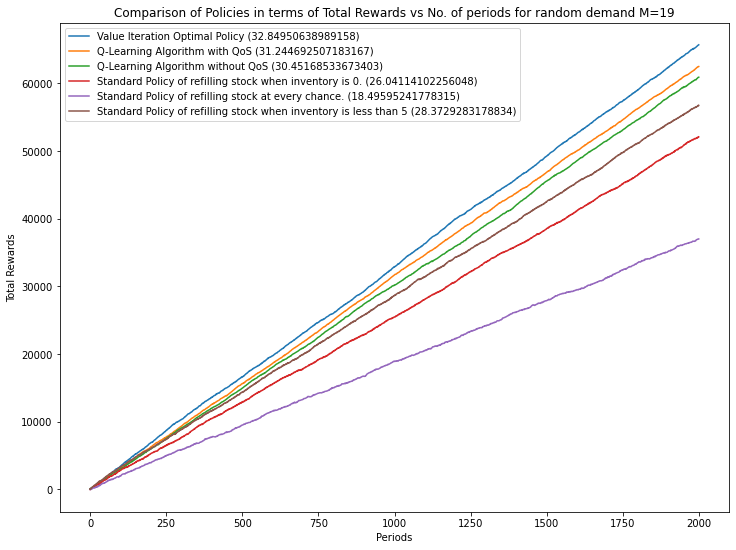

In [24]:
df.plot(xlabel="Periods",ylabel="Total Rewards",figsize =(12,9),
        title='Comparison of Policies in terms of Total Rewards vs No. of periods for random demand M={}'.format(M))